# Imports

In [10]:
import datetime
import json
import random
import IPython
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import torch
import pytorch_lightning as pl
import gc

from pathlib import Path
from PIL import Image
from mpl_toolkits.axes_grid1 import ImageGrid
from ray import tune
from pytorch_lightning.loggers import TensorBoardLogger
from Models import FaceDataset, create_datasets, SingleModel, EyesModel, FullModel
from utils import get_config, train_single, train_eyes, train_full, tune_asha, get_best_results, get_tune_results, save_model, predict_screen_errors

SETTINGS, COLOURS, EYETRACKER, TF = get_config("config.ini")

%load_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Dataset statistics

In [11]:
df = pd.read_csv('./data/labeling.csv')

print("# of images: {}".format(len(df)))
print("Image dimensions: {}x{}px".format(SETTINGS["image_size"], SETTINGS["image_size"]))

# of images: 1001
Image dimensions: 64x64px


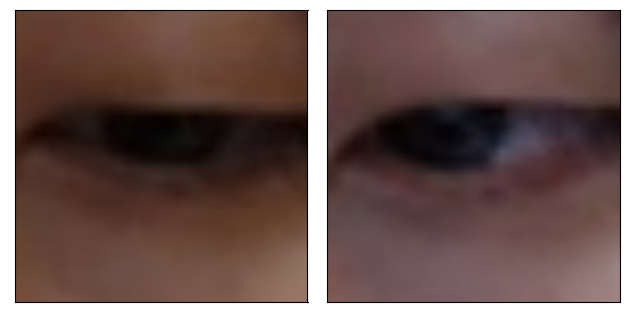

In [4]:
low_bright = mpimg.imread('./data/r_eye/68.jpg')
high_bright = mpimg.imread('./data/r_eye/99.jpg')
fig, axs = plt.subplots(1, 2)
axs[0].imshow(low_bright)
axs[1].imshow(high_bright)
plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[])
plt.tight_layout()
plt.show()

2. Is there a clear difference in eye shape and iris location at the extreme edges of the screen?

The calibration tool allowed us to record data at 9 key locations of the screen (edges and centers), and we can confirm that these locations are clearly distinguishable in low resolution images. The eye images alone might provide sufficient information for accurate eye tracking

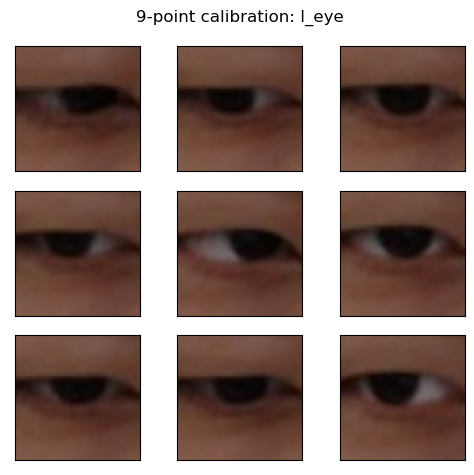

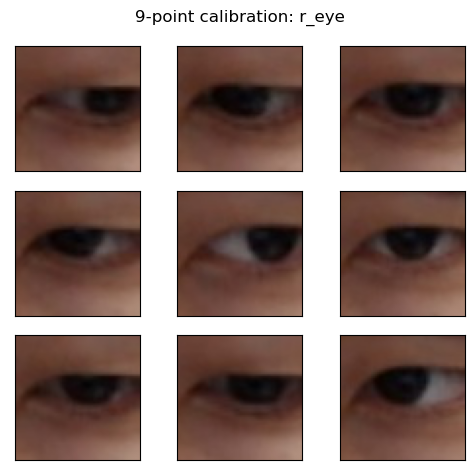

In [12]:
def plot_calibration(eye):
    calibration = [mpimg.imread('./data/{}/{}.jpg'.format(eye, i)) for i in range(1,10)]
    fig, axs = plt.subplots(3, 3)
    axs[0,0].imshow(calibration[3])
    axs[0,1].imshow(calibration[6])
    axs[0,2].imshow(calibration[8])

    axs[1,0].imshow(calibration[2])
    axs[1,1].imshow(calibration[4])
    axs[1,2].imshow(calibration[7])

    axs[2,0].imshow(calibration[1])
    axs[2,1].imshow(calibration[0])
    axs[2,2].imshow(calibration[5])

    plt.suptitle("9-point calibration: {}".format(eye))
    plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[])
    plt.subplots_adjust(hspace=50)
    plt.tight_layout()
    plt.savefig('media/images/0_calibration_{}.png'.format(eye))
    plt.show()

plot_calibration('l_eye')
plot_calibration('r_eye')

# Face-only model

Although we collected a variety of image types (due to not knowing exactly what information would be sufficient for this problem), we first want to check how well a face-only model will work. Can a CNN predict accurate screen locations with only a face image, and without explicitly directing the network to focus on the eyes/head angle etc?

A face-only model would be ideal as inference would be faster, which is important when eye tracking from a live webcam feed

## Face

Start with a shallow search over many models, but few epochs, to get an idea of which hyperparameters should be fine tuned

### Explore

In [8]:
config = {
        "seed": tune.randint(0, 10000),  # reproducible random seed for each experiment
        "bs": tune.choice([1 << i for i in range(2, 9)]),  # batch size
        "lr": tune.loguniform(1e-7, 1e-3),  # learning rate
        "filter_size": tune.choice([3, 5, 7, 9]),  # filter size (square)
        "filter_growth": tune.choice([1, 2]),  # increase filter count by a factor
        "n_filters": tune.choice([8, 16, 32, 64]),  # number of starting filters
        "n_convs": tune.choice([0, 1, 2]),  # number of conv layers
        "dense_nodes": tune.choice([16, 32, 64, 128]),  # number of nodes in fc layer
    }

analysis = tune_asha(config, data_partial=True, train_func=train_single, name="face/explore", img_types=["face"], num_samples=100, num_epochs=10, seed=87)

2023-05-15 14:42:54,782	INFO worker.py:1625 -- Started a local Ray instance.
2023-05-15 14:43:00,087	INFO tune.py:218 -- Initializing Ray automatically. For cluster usage or custom Ray initialization, call `ray.init(...)` before `tune.run(...)`.
C:\ProgramData\Anaconda3\lib\site-packages\ray\tune\experiment\experiment.py:170: UserWarning: The `local_dir` argument of `Experiment is deprecated. Use `storage_path` or set the `TUNE_RESULT_DIR` environment variable instead.
  warnings.warn(
(train_single pid=23940) Global seed set to 8525


(train_single pid=23940) n_train=820, n_val=102, n_test=103
(train_single pid=23940) ds_train=<torch.utils.data.dataset.Subset object at 0x000002519F95F5B0>, ds_val=<torch.utils.data.dataset.Subset object at 0x000002519F987520>, ds_test=<torch.utils.data.dataset.Subset object at 0x000002519F987460>
(train_single pid=23940) feat_size = 64
(train_single pid=23940) first layer after input : filter_size=7
(train_single pid=23940) first layer after input : feat_size=58
(train_single pid=23940) fc1 input=215296, output=32
(train_single pid=23940) fc2 input=32, output=16
(train_single pid=23940) fc3 input=16, output=8


(train_single pid=23940) GPU available: True (cuda), used: True
(train_single pid=23940) TPU available: False, using: 0 TPU cores
(train_single pid=23940) IPU available: False, using: 0 IPUs
(train_single pid=23940) HPU available: False, using: 0 HPUs
(train_single pid=23940) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


(train_single pid=23940) 0th forward
(train_single pid=23940) 1 torch.Size([1, 3, 64, 64])


(train_single pid=23940) 
(train_single pid=23940)   | Name       | Type       | Params | In sizes       | Out sizes      
(train_single pid=23940) -----------------------------------------------------------------------------
(train_single pid=23940) 0 | conv_input | Conv2d     | 9.5 K  | [1, 3, 64, 64] | [1, 64, 58, 58]
(train_single pid=23940) 1 | convs1     | ModuleList | 0      | ?              | ?              
(train_single pid=23940) 2 | drop1      | Dropout    | 0      | [1, 32]        | [1, 32]        
(train_single pid=23940) 3 | fc1        | Linear     | 6.9 M  | [1, 215296]    | [1, 32]        
(train_single pid=23940) 4 | drop2      | Dropout    | 0      | [1, 16]        | [1, 16]        
(train_single pid=23940) 5 | fc2        | Linear     | 528    | [1, 32]        | [1, 16]        
(train_single pid=23940) 6 | fc3        | Linear     | 34     | [1, 16]        | [1, 2]         
(train_single pid=23940) ----------------------------------------------------------------------

(train_single pid=23940) 2 torch.Size([1, 64, 58, 58])
(train_single pid=23940) 3 torch.Size([1, 215296])
(train_single pid=23940) 1th forward
(train_single pid=23940) 1 torch.Size([1, 3, 64, 64])
(train_single pid=23940) 2 torch.Size([1, 64, 58, 58])
(train_single pid=23940) 3 torch.Size([1, 215296])
(train_single pid=23940) 2th forward
(train_single pid=23940) 1 torch.Size([1, 3, 64, 64])
(train_single pid=23940) 2 torch.Size([1, 64, 58, 58])
(train_single pid=23940) 3 torch.Size([1, 215296])
(train_single pid=23940) 3th forward
(train_single pid=23940) 1 torch.Size([1, 3, 64, 64])
(train_single pid=23940) 2 torch.Size([1, 64, 58, 58])
(train_single pid=23940) 3 torch.Size([1, 215296])
Sanity Checking: 0it [00:00, ?it/s]0m 


(train_single pid=23940) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=23940)   rank_zero_warn(
2023-05-15 14:43:12,909	ERROR trial_runner.py:1450 -- Trial train_single_5a115_00000: Error happened when processing _ExecutorEventType.TRAINING_RESULT.
ray.exceptions.RayTaskError(RuntimeError): ray::ImplicitFunc.train() (pid=23940, ip=127.0.0.1, repr=train_single)
  File "python\ray\_raylet.pyx", line 877, in ray._raylet.execute_task
  File "python\ray\_raylet.pyx", line 881, in ray._raylet.execute_task
  File "python\ray\_raylet.pyx", line 821, in ray._raylet.execute_task.function_executor
  File "C:\ProgramData\Anaconda3\lib\site-packages\ray\_priva

Sanity Checking DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]4th forward
(train_single pid=23940) 1 torch.Size([32, 3, 244, 244])
(train_single pid=23940) 2 torch.Size([32, 64, 238, 238])
(train_single pid=23940) 3 torch.Size([32, 3625216])


(train_single pid=22064) Global seed set to 8253


(train_single pid=22064) fc3 input=64, output=32 [repeated 4x across cluster] (Ray deduplicates logs by default. Set RAY_DEDUP_LOGS=0 to disable log deduplication, or see https://docs.ray.io/en/master/ray-observability/ray-logging.html#log-deduplication for more options.)
(train_single pid=22064) fc3 input=64, output=32
(train_single pid=22064) fc3 input=64, output=32
(train_single pid=22064) first layer after input : feat_size=56 [repeated 2x across cluster]


(train_single pid=22064) GPU available: True (cuda), used: True
(train_single pid=22064) TPU available: False, using: 0 TPU cores
(train_single pid=22064) IPU available: False, using: 0 IPUs
(train_single pid=22064) HPU available: False, using: 0 HPUs
(train_single pid=22064) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


(train_single pid=22064) 0th forward


(train_single pid=22064) 
(train_single pid=22064)   | Name       | Type       | Params | In sizes       | Out sizes     
(train_single pid=22064) ----------------------------------------------------------------------------
(train_single pid=22064) 0 | conv_input | Conv2d     | 2.0 K  | [1, 3, 64, 64] | [1, 8, 56, 56]
(train_single pid=22064) 1 | convs1     | ModuleList | 0      | ?              | ?             
(train_single pid=22064) 2 | drop1      | Dropout    | 0      | [1, 128]       | [1, 128]      
(train_single pid=22064) 3 | fc1        | Linear     | 3.2 M  | [1, 25088]     | [1, 128]      
(train_single pid=22064) 4 | drop2      | Dropout    | 0      | [1, 64]        | [1, 64]       
(train_single pid=22064) 5 | fc2        | Linear     | 8.3 K  | [1, 128]       | [1, 64]       
(train_single pid=22064) 6 | fc3        | Linear     | 130    | [1, 64]        | [1, 2]        
(train_single pid=22064) ----------------------------------------------------------------------------
(t

(train_single pid=22064) 1th forward
(train_single pid=22064) 2th forward
(train_single pid=22064) 3th forward
Sanity Checking: 0it [00:00, ?it/s]


(train_single pid=22064) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=22064)   rank_zero_warn(


Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]4th forward


2023-05-15 14:43:27,052	ERROR trial_runner.py:1450 -- Trial train_single_5a115_00001: Error happened when processing _ExecutorEventType.TRAINING_RESULT.
ray.exceptions.RayTaskError(RuntimeError): ray::ImplicitFunc.train() (pid=22064, ip=127.0.0.1, repr=train_single)
  File "python\ray\_raylet.pyx", line 877, in ray._raylet.execute_task
  File "python\ray\_raylet.pyx", line 881, in ray._raylet.execute_task
  File "python\ray\_raylet.pyx", line 821, in ray._raylet.execute_task.function_executor
  File "C:\ProgramData\Anaconda3\lib\site-packages\ray\_private\function_manager.py", line 670, in actor_method_executor
    return method(__ray_actor, *args, **kwargs)
  File "C:\ProgramData\Anaconda3\lib\site-packages\ray\util\tracing\tracing_helper.py", line 460, in _resume_span
    return method(self, *_args, **_kwargs)
  File "C:\ProgramData\Anaconda3\lib\site-packages\ray\tune\trainable\trainable.py", line 384, in train
    raise skipped from exception_cause(skipped)
  File "C:\ProgramData\A

(train_single pid=24256) ds_train=<torch.utils.data.dataset.Subset object at 0x0000023F00FC05E0>, ds_val=<torch.utils.data.dataset.Subset object at 0x0000023F00FE8550>, ds_test=<torch.utils.data.dataset.Subset object at 0x0000023F00FE8490>
(train_single pid=24256) feat_size = 64
(train_single pid=24256) fc3 input=8, output=4 [repeated 21x across cluster]
(train_single pid=24256) first layer after input : feat_size=56 [repeated 2x across cluster]


(train_single pid=24256) GPU available: True (cuda), used: True
(train_single pid=24256) TPU available: False, using: 0 TPU cores
(train_single pid=24256) IPU available: False, using: 0 IPUs
(train_single pid=24256) HPU available: False, using: 0 HPUs
(train_single pid=24256) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


(train_single pid=24256) 0th forward


(train_single pid=24256) 
(train_single pid=24256)   | Name       | Type       | Params | In sizes       | Out sizes      
(train_single pid=24256) -----------------------------------------------------------------------------
(train_single pid=24256) 0 | conv_input | Conv2d     | 15.6 K | [1, 3, 64, 64] | [1, 64, 56, 56]
(train_single pid=24256) 1 | convs1     | ModuleList | 0      | ?              | ?              
(train_single pid=24256) 2 | drop1      | Dropout    | 0      | [1, 16]        | [1, 16]        
(train_single pid=24256) 3 | fc1        | Linear     | 3.2 M  | [1, 200704]    | [1, 16]        
(train_single pid=24256) 4 | drop2      | Dropout    | 0      | [1, 8]         | [1, 8]         
(train_single pid=24256) 5 | fc2        | Linear     | 136    | [1, 16]        | [1, 8]         
(train_single pid=24256) 6 | fc3        | Linear     | 18     | [1, 8]         | [1, 2]         
(train_single pid=24256) ----------------------------------------------------------------------

(train_single pid=24256) 1th forward
(train_single pid=24256) 2th forward
(train_single pid=24256) 3th forward
Sanity Checking: 0it [00:00, ?it/s]


(train_single pid=24256) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=24256)   rank_zero_warn(
2023-05-15 14:43:39,875	ERROR trial_runner.py:1450 -- Trial train_single_5a115_00002: Error happened when processing _ExecutorEventType.TRAINING_RESULT.
ray.exceptions.RayTaskError(RuntimeError): ray::ImplicitFunc.train() (pid=24256, ip=127.0.0.1, repr=train_single)
  File "python\ray\_raylet.pyx", line 877, in ray._raylet.execute_task
  File "python\ray\_raylet.pyx", line 881, in ray._raylet.execute_task
  File "python\ray\_raylet.pyx", line 821, in ray._raylet.execute_task.function_executor
  File "C:\ProgramData\Anaconda3\lib\site-packages\ray\_priva

Sanity Checking DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]4th forward


(train_single pid=17468) Global seed set to 9050


(train_single pid=17468) fc3 input=8, output=4
(train_single pid=17468) fc3 input=8, output=4
(train_single pid=17468) fc3 input=8, output=4 [repeated 20x across cluster]
(train_single pid=17468) first layer after input : feat_size=58 [repeated 2x across cluster]


(train_single pid=17468) GPU available: True (cuda), used: True
(train_single pid=17468) TPU available: False, using: 0 TPU cores
(train_single pid=17468) IPU available: False, using: 0 IPUs
(train_single pid=17468) HPU available: False, using: 0 HPUs
(train_single pid=17468) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


(train_single pid=17468) 0th forward


(train_single pid=17468) 
(train_single pid=17468)   | Name       | Type       | Params | In sizes       | Out sizes      
(train_single pid=17468) -----------------------------------------------------------------------------
(train_single pid=17468) 0 | conv_input | Conv2d     | 4.7 K  | [1, 3, 64, 64] | [1, 32, 58, 58]
(train_single pid=17468) 1 | convs1     | ModuleList | 100 K  | ?              | ?              
(train_single pid=17468) 2 | drop1      | Dropout    | 0      | [1, 16]        | [1, 16]        
(train_single pid=17468) 3 | fc1        | Linear     | 692 K  | [1, 43264]     | [1, 16]        
(train_single pid=17468) 4 | drop2      | Dropout    | 0      | [1, 8]         | [1, 8]         
(train_single pid=17468) 5 | fc2        | Linear     | 136    | [1, 16]        | [1, 8]         
(train_single pid=17468) 6 | fc3        | Linear     | 18     | [1, 8]         | [1, 2]         
(train_single pid=17468) ----------------------------------------------------------------------

(train_single pid=17468) 1th forward
(train_single pid=17468) 2th forward
(train_single pid=17468) 3th forward
Sanity Checking: 0it [00:00, ?it/s]


(train_single pid=17468) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=17468)   rank_zero_warn(
2023-05-15 14:43:53,352	ERROR trial_runner.py:1450 -- Trial train_single_5a115_00003: Error happened when processing _ExecutorEventType.TRAINING_RESULT.
ray.exceptions.RayTaskError(RuntimeError): ray::ImplicitFunc.train() (pid=17468, ip=127.0.0.1, repr=train_single)
  File "python\ray\_raylet.pyx", line 877, in ray._raylet.execute_task
  File "python\ray\_raylet.pyx", line 881, in ray._raylet.execute_task
  File "python\ray\_raylet.pyx", line 821, in ray._raylet.execute_task.function_executor
  File "C:\ProgramData\Anaconda3\lib\site-packages\ray\_priva

Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]4th forward


(train_single pid=22856) Global seed set to 3047


(train_single pid=22856) ds_train=<torch.utils.data.dataset.Subset object at 0x0000025E84B10730>, ds_val=<torch.utils.data.dataset.Subset object at 0x0000025E84B386A0>, ds_test=<torch.utils.data.dataset.Subset object at 0x0000025E84B607F0>
(train_single pid=22856) feat_size = 64
(train_single pid=22856) 0th feat_size=30 [repeated 17x across cluster]
(train_single pid=22856) first layer after input : feat_size=62 [repeated 2x across cluster]


(train_single pid=22856) GPU available: True (cuda), used: True
(train_single pid=22856) TPU available: False, using: 0 TPU cores
(train_single pid=22856) IPU available: False, using: 0 IPUs
(train_single pid=22856) HPU available: False, using: 0 HPUs
(train_single pid=22856) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


(train_single pid=22856) 0th forward


(train_single pid=22856) 
(train_single pid=22856)   | Name       | Type       | Params | In sizes       | Out sizes      
(train_single pid=22856) -----------------------------------------------------------------------------
(train_single pid=22856) 0 | conv_input | Conv2d     | 1.8 K  | [1, 3, 64, 64] | [1, 64, 62, 62]
(train_single pid=22856) 1 | convs1     | ModuleList | 37.1 K | ?              | ?              
(train_single pid=22856) 2 | drop1      | Dropout    | 0      | [1, 16]        | [1, 16]        
(train_single pid=22856) 3 | fc1        | Linear     | 921 K  | [1, 57600]     | [1, 16]        
(train_single pid=22856) 4 | drop2      | Dropout    | 0      | [1, 8]         | [1, 8]         
(train_single pid=22856) 5 | fc2        | Linear     | 136    | [1, 16]        | [1, 8]         
(train_single pid=22856) 6 | fc3        | Linear     | 18     | [1, 8]         | [1, 2]         
(train_single pid=22856) ----------------------------------------------------------------------

(train_single pid=22856) 1th forward
(train_single pid=22856) 2th forward
(train_single pid=22856) 3th forward
Sanity Checking: 0it [00:00, ?it/s]


(train_single pid=22856) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=22856)   rank_zero_warn(
2023-05-15 14:44:06,020	ERROR trial_runner.py:1450 -- Trial train_single_5a115_00004: Error happened when processing _ExecutorEventType.TRAINING_RESULT.
ray.exceptions.RayTaskError(RuntimeError): ray::ImplicitFunc.train() (pid=22856, ip=127.0.0.1, repr=train_single)
  File "python\ray\_raylet.pyx", line 877, in ray._raylet.execute_task
  File "python\ray\_raylet.pyx", line 881, in ray._raylet.execute_task
  File "python\ray\_raylet.pyx", line 821, in ray._raylet.execute_task.function_executor
  File "C:\ProgramData\Anaconda3\lib\site-packages\ray\_priva

Sanity Checking DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]4th forward


(train_single pid=10008) Global seed set to 331


(train_single pid=10008) 0th feat_size=28
(train_single pid=10008) 0th feat_size=28
(train_single pid=10008) 0th feat_size=28 [repeated 20x across cluster]
(train_single pid=10008) first layer after input : feat_size=60 [repeated 2x across cluster]


(train_single pid=10008) GPU available: True (cuda), used: True
(train_single pid=10008) TPU available: False, using: 0 TPU cores
(train_single pid=10008) IPU available: False, using: 0 IPUs
(train_single pid=10008) HPU available: False, using: 0 HPUs
(train_single pid=10008) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
2023-05-15 14:44:16,512	WARNING tune.py:184 -- Stop signal received (e.g. via SIGINT/Ctrl+C), ending Ray Tune run. This will try to checkpoint the experiment state one last time. Press CTRL+C (or send SIGINT/SIGKILL/SIGTERM) to skip. 


(train_single pid=10008) 0th forward


(train_single pid=10008) 
(train_single pid=10008)   | Name       | Type       | Params | In sizes       | Out sizes      
(train_single pid=10008) -----------------------------------------------------------------------------
(train_single pid=10008) 0 | conv_input | Conv2d     | 4.9 K  | [1, 3, 64, 64] | [1, 64, 60, 60]
(train_single pid=10008) 1 | convs1     | ModuleList | 1.0 M  | ?              | ?              
(train_single pid=10008) 2 | drop1      | Dropout    | 0      | [1, 64]        | [1, 64]        
(train_single pid=10008) 3 | fc1        | Linear     | 2.4 M  | [1, 36864]     | [1, 64]        
(train_single pid=10008) 4 | drop2      | Dropout    | 0      | [1, 32]        | [1, 32]        
(train_single pid=10008) 5 | fc2        | Linear     | 2.1 K  | [1, 64]        | [1, 32]        
(train_single pid=10008) 6 | fc3        | Linear     | 66     | [1, 32]        | [1, 2]         
(train_single pid=10008) ----------------------------------------------------------------------

(train_single pid=10008) 1th forward
(train_single pid=10008) 2th forward
(train_single pid=10008) 3th forward


(train_single pid=10008) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=10008)   rank_zero_warn(


Sanity Checking: 0it [00:00, ?it/s]0m 
Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]4th forward


2023-05-15 14:44:20,048	ERROR trial_runner.py:1450 -- Trial train_single_5a115_00005: Error happened when processing _ExecutorEventType.TRAINING_RESULT.
ray.exceptions.RayTaskError(RuntimeError): ray::ImplicitFunc.train() (pid=10008, ip=127.0.0.1, repr=train_single)
  File "python\ray\_raylet.pyx", line 877, in ray._raylet.execute_task
  File "python\ray\_raylet.pyx", line 881, in ray._raylet.execute_task
  File "python\ray\_raylet.pyx", line 821, in ray._raylet.execute_task.function_executor
  File "C:\ProgramData\Anaconda3\lib\site-packages\ray\_private\function_manager.py", line 670, in actor_method_executor
    return method(__ray_actor, *args, **kwargs)
  File "C:\ProgramData\Anaconda3\lib\site-packages\ray\util\tracing\tracing_helper.py", line 460, in _resume_span
    return method(self, *_args, **_kwargs)
  File "C:\ProgramData\Anaconda3\lib\site-packages\ray\tune\trainable\trainable.py", line 384, in train
    raise skipped from exception_cause(skipped)
  File "C:\ProgramData\A

Best hyperparameters: None


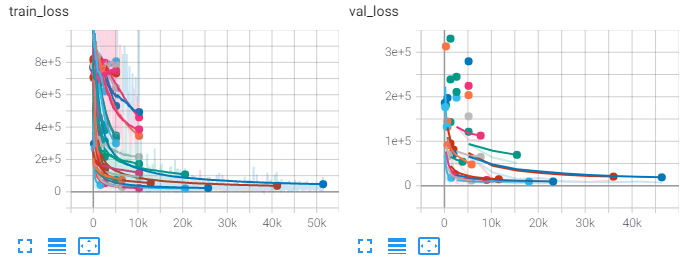

In [19]:
IPython.display.Image(Path.cwd()/"media"/"images"/"1_face_explore_training.png")

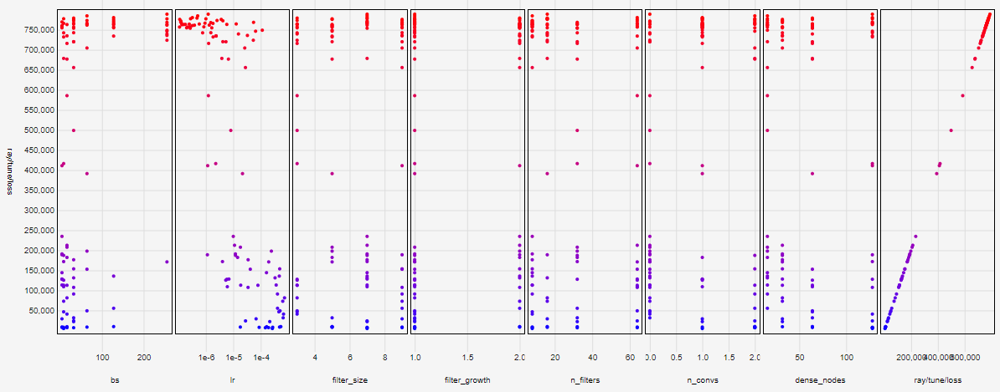

In [20]:
IPython.display.Image(Path.cwd()/"media"/"images"/"1_face_explore_scatter.png")

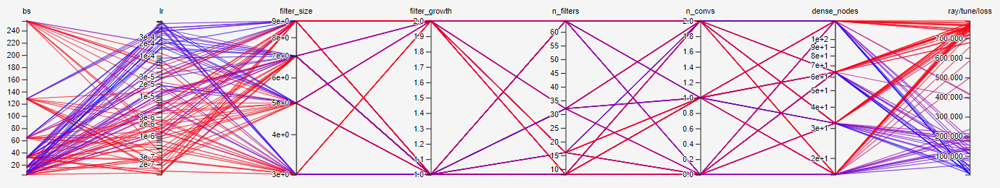

In [21]:
IPython.display.Image(Path.cwd()/"media"/"images"/"1_face_explore_parallel.png")

### Fine tune

In [4]:
config = {
        "seed": tune.randint(0, 10000),  # reproducible random seed for each experiment
        "bs": tune.choice([1 << i for i in range(2, 7)]),  # batch size
        "lr": tune.loguniform(1e-4, 1e-3),  # learning rate
        "filter_size": tune.choice([3, 5, 7, 9]),  # filter size (square)
        "filter_growth": tune.choice([1, 2]),  # increase filter count by a factor
        "n_filters": tune.choice([8, 16, 32]),  # number of starting filters
        "n_convs": tune.choice([1, 2]),  # number of conv layers
        "dense_nodes": tune.choice([32, 64, 128]),  # number of nodes in fc layer
    }

analysis = tune_asha(config, data_partial=True, train_func=train_single, name="face/tune", img_types=["face"], num_samples=50, num_epochs=20, seed=87)

2023-05-17 21:29:00,454	INFO worker.py:1625 -- Started a local Ray instance.
2023-05-17 21:29:06,416	INFO tune.py:218 -- Initializing Ray automatically. For cluster usage or custom Ray initialization, call `ray.init(...)` before `tune.run(...)`.
C:\ProgramData\Anaconda3\lib\site-packages\ray\tune\experiment\experiment.py:170: UserWarning: The `local_dir` argument of `Experiment is deprecated. Use `storage_path` or set the `TUNE_RESULT_DIR` environment variable instead.
  warnings.warn(
(train_single pid=17724) Global seed set to 8525
(train_single pid=17724) GPU available: True (cuda), used: True
(train_single pid=17724) TPU available: False, using: 0 TPU cores
(train_single pid=17724) IPU available: False, using: 0 IPUs
(train_single pid=17724) HPU available: False, using: 0 HPUs
(train_single pid=17724) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=17724) 
(train_single pid=17724)   | Name       | Type       | Params | In sizes         | Out sizes       
(train_single p

Sanity Checking: 0it [00:00, ?it/s]0m 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 90.90it/s]


(train_single pid=17724) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=17724)   rank_zero_warn(
(train_single pid=17724) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (25) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_single pid=17724)   rank_zero_warn(


Epoch 0: 100%|██████████| 25/25 [00:06<00:00,  4.16it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=17724) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 508.15it/s]
(train_single pid=17724) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.30it/s] 
(train_single pid=17724) 
Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  6.69it/s]


Trial name,date,done,hostname,iterations_since_restore,loss,node_ip,pid,time_since_restore,time_this_iter_s,time_total_s,timestamp,training_iteration,trial_id
train_single_6a5b8_00000,2023-05-17_21-31-31,True,DESKTOP-KVCQHCD,20,136134,127.0.0.1,17724,135.008,6.80698,135.008,1684326691,20,6a5b8_00000
train_single_6a5b8_00001,2023-05-17_21-34-12,True,DESKTOP-KVCQHCD,20,7002.87,127.0.0.1,5960,149.596,7.90404,149.596,1684326852,20,6a5b8_00001
train_single_6a5b8_00002,2023-05-17_21-34-36,True,DESKTOP-KVCQHCD,1,539180,127.0.0.1,13244,12.2001,12.2001,12.2001,1684326876,1,6a5b8_00002
train_single_6a5b8_00003,2023-05-17_21-37-54,True,DESKTOP-KVCQHCD,20,19232.5,127.0.0.1,19648,187.55,9.1128,187.55,1684327074,20,6a5b8_00003
train_single_6a5b8_00004,2023-05-17_21-38-17,True,DESKTOP-KVCQHCD,1,467476,127.0.0.1,15156,12.5227,12.5227,12.5227,1684327097,1,6a5b8_00004
train_single_6a5b8_00005,2023-05-17_21-40-50,True,DESKTOP-KVCQHCD,16,14007.1,127.0.0.1,21848,142.634,8.55582,142.634,1684327250,16,6a5b8_00005
train_single_6a5b8_00006,2023-05-17_21-41-13,True,DESKTOP-KVCQHCD,1,441153,127.0.0.1,19424,12.2387,12.2387,12.2387,1684327273,1,6a5b8_00006
train_single_6a5b8_00007,2023-05-17_21-41-36,True,DESKTOP-KVCQHCD,1,533570,127.0.0.1,22088,11.9587,11.9587,11.9587,1684327296,1,6a5b8_00007
train_single_6a5b8_00008,2023-05-17_21-41-57,True,DESKTOP-KVCQHCD,1,455489,127.0.0.1,19028,11.561,11.561,11.561,1684327317,1,6a5b8_00008
train_single_6a5b8_00009,2023-05-17_21-42-27,True,DESKTOP-KVCQHCD,2,167130,127.0.0.1,14272,18.7151,7.35363,18.7151,1684327347,2,6a5b8_00009


(train_single pid=17724) 
Epoch 1: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s, v_num=.]
(train_single pid=17724) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=17724) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 513.25it/s]
(train_single pid=17724) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.09it/s] 
(train_single pid=17724) 
Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  6.96it/s]
(train_single pid=17724) 
Epoch 2: 100%|██████████| 25/25 [00:05<00:00,  4.50it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=17724) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 499.56it/s]
(train_single pid=17724) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.66it/s] 
(train_single pid=17724) 
Epoch 3: 100%|██████████| 25/25 [00:05<00:00,  4.60it/s, v_num=.]
(train_single pid=17724) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=17724) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 5

Epoch 4: 100%|██████████| 25/25 [00:05<00:00,  4.61it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=17724) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 501.83it/s]
(train_single pid=17724) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.30it/s] 
(train_single pid=17724) 
Epoch 5: 100%|██████████| 25/25 [00:05<00:00,  4.49it/s, v_num=.]
(train_single pid=17724) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=17724) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 509.45it/s]
(train_single pid=17724) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  8.77it/s] 
(train_single pid=17724) 
Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  6.58it/s]
(train_single pid=17724) 
Epoch 6: 100%|██████████| 25/25 [00:05<00:00,  4.46it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=17724) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 491.77it/s]
(train_single pid=17724) 
Validation Data

Epoch 8: 100%|██████████| 25/25 [00:05<00:00,  4.24it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=17724) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 506.99it/s]
(train_single pid=17724) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.05it/s] 
(train_single pid=17724) 
Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  6.77it/s]
(train_single pid=17724) 
Epoch 9: 100%|██████████| 25/25 [00:05<00:00,  4.38it/s, v_num=.]
(train_single pid=17724) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=17724) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 499.98it/s]
(train_single pid=17724) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  8.89it/s] 
(train_single pid=17724) 
Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  6.76it/s]
(train_single pid=17724) 
Epoch 10: 100%|██████████| 25/25 [00:05<00:00,  4.56it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=17724) 
Validation Data

Epoch 11: 100%|██████████| 25/25 [00:06<00:00,  4.15it/s, v_num=.]
(train_single pid=17724) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=17724) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 498.85it/s]
(train_single pid=17724) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  8.89it/s] 
(train_single pid=17724) 
Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  6.68it/s]
(train_single pid=17724) 
Epoch 12: 100%|██████████| 25/25 [00:05<00:00,  4.37it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=17724) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 500.04it/s]
(train_single pid=17724) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.09it/s] 
(train_single pid=17724) 
Epoch 13: 100%|██████████| 25/25 [00:05<00:00,  4.36it/s, v_num=.]
(train_single pid=17724) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=17724) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 508.22it/s]
(train_singl

(train_single pid=17724) 
Epoch 15: 100%|██████████| 25/25 [00:06<00:00,  4.09it/s, v_num=.]
(train_single pid=17724) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=17724) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 509.14it/s]
(train_single pid=17724) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  8.74it/s] 
(train_single pid=17724) 
Epoch 16: 100%|██████████| 25/25 [00:05<00:00,  4.32it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=17724) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 492.93it/s]
(train_single pid=17724) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  8.47it/s] 
(train_single pid=17724) 
Epoch 17: 100%|██████████| 25/25 [00:05<00:00,  4.22it/s, v_num=.]
(train_single pid=17724) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=17724) 
Validation:   0%|          | 0/4 [00:00<?, ?it/s]
(train_single pid=17724) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 499.32it/s]
(train_

Epoch 18: 100%|██████████| 25/25 [00:05<00:00,  4.23it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=17724) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 501.35it/s]
(train_single pid=17724) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  8.51it/s] 
(train_single pid=17724) 
Epoch 19: 100%|██████████| 25/25 [00:05<00:00,  4.25it/s, v_num=.]
(train_single pid=17724) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=17724) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 499.74it/s]
(train_single pid=17724) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  8.62it/s] 
(train_single pid=17724) 
Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  5.73it/s]
(train_single pid=17724) 
Validation DataLoader 0: 100%|██████████| 4/4 [00:00<00:00,  7.09it/s]


(train_single pid=5960) Global seed set to 3182
(train_single pid=5960) GPU available: True (cuda), used: True
(train_single pid=5960) TPU available: False, using: 0 TPU cores
(train_single pid=5960) IPU available: False, using: 0 IPUs
(train_single pid=5960) HPU available: False, using: 0 HPUs
(train_single pid=5960) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=5960) 
(train_single pid=5960)   | Name       | Type       | Params | In sizes         | Out sizes       
(train_single pid=5960) --------------------------------------------------------------------------------
(train_single pid=5960) 0 | conv_input | Conv2d     | 2.0 K  | [1, 3, 244, 244] | [1, 8, 236, 236]
(train_single pid=5960) 1 | convs1     | ModuleList | 10.4 K | ?                | ?               
(train_single pid=5960) 2 | drop1      | Dropout    | 0      | [1, 64]          | [1, 64]         
(train_single pid=5960) 3 | fc1        | Linear     | 1.4 M  | [1, 22472]       | [1, 64]         
(train_single

Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 99.77it/s]


(train_single pid=5960) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=5960)   rank_zero_warn(


Epoch 0: 100%|██████████| 50/50 [00:06<00:00,  7.78it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 502.85it/s]
(train_single pid=5960) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 18.02it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.55it/s]
(train_single pid=5960) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 11.27it/s]
(train_single pid=5960) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 10.73it/s]
(train_single pid=5960) 
Epoch 1: 100%|██████████| 50/50 [00:06<00:00,  8.27it/s, v_num=.]
(train_single pid=5960) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 500.81it/s]
(train_single pid=5960) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 15.50it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<

(train_single pid=5960) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 11.14it/s]
(train_single pid=5960) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 10.12it/s]
(train_single pid=5960) 
Epoch 2: 100%|██████████| 50/50 [00:05<00:00,  8.47it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 495.20it/s]
(train_single pid=5960) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 17.39it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 13.04it/s]
(train_single pid=5960) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 11.70it/s]
(train_single pid=5960) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 11.01it/s]
(train_single pid=5960) 
Epoch 3: 100%|██████████| 50/50 [00:06<00:00,  8.28it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00

(train_single pid=5960) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 17.70it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 13.39it/s]
(train_single pid=5960) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 11.90it/s]
(train_single pid=5960) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 11.09it/s]
(train_single pid=5960) 
Epoch 4: 100%|██████████| 50/50 [00:06<00:00,  8.16it/s, v_num=.]
(train_single pid=5960) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 506.80it/s]
(train_single pid=5960) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 16.40it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.05it/s]
(train_single pid=5960) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 11.02it/s]
(train_single pid=5960) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:

(train_single pid=5960) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 999.83it/s]
(train_single pid=5960) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 16.13it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.45it/s]
(train_single pid=5960) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 10.46it/s]
(train_single pid=5960) 
Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 10.00it/s]
(train_single pid=5960) 
Epoch 6: 100%|██████████| 50/50 [00:06<00:00,  7.88it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 493.16it/s]
(train_single pid=5960) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 17.24it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 13.04it/s]
(train_single pid=5960) 
Validation DataLoader 0

Epoch 7: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 1000.55it/s]
(train_single pid=5960) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 17.24it/s]  
(train_single pid=5960) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.99it/s]
(train_single pid=5960) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 11.46it/s]
(train_single pid=5960) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 10.66it/s]
(train_single pid=5960) 
Epoch 8: 100%|██████████| 50/50 [00:06<00:00,  7.91it/s, v_num=.]
(train_single pid=5960) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 498.73it/s]
(train_single pid=5960) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 16.67it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:0

Epoch 9: 100%|██████████| 50/50 [00:05<00:00,  8.38it/s, v_num=.]
(train_single pid=5960) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 508.59it/s]
(train_single pid=5960) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 17.86it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 13.05it/s]
(train_single pid=5960) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 11.49it/s]
(train_single pid=5960) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 10.87it/s]
(train_single pid=5960) 
Epoch 10: 100%|██████████| 50/50 [00:05<00:00,  8.36it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 499.98it/s]
(train_single pid=5960) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 13.42it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00

Epoch 11: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 1000.31it/s]
(train_single pid=5960) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 16.53it/s]  
(train_single pid=5960) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.00it/s]
(train_single pid=5960) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 10.70it/s]
(train_single pid=5960) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 10.10it/s]
(train_single pid=5960) 
Epoch 12: 100%|██████████| 50/50 [00:06<00:00,  7.81it/s, v_num=.]
(train_single pid=5960) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 497.66it/s]
(train_single pid=5960) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 16.00it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00

Epoch 13: 100%|██████████| 50/50 [00:06<00:00,  7.95it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 1035.63it/s]
(train_single pid=5960) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 17.24it/s]  
(train_single pid=5960) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.99it/s]
(train_single pid=5960) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 10.99it/s]
(train_single pid=5960) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 10.50it/s]
(train_single pid=5960) 
Epoch 14: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s, v_num=.]
(train_single pid=5960) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 500.87it/s]
(train_single pid=5960) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 15.63it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00

Epoch 15: 100%|██████████| 50/50 [00:06<00:00,  7.50it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 333.30it/s]
(train_single pid=5960) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 14.71it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 10.60it/s]
(train_single pid=5960) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00,  9.39it/s]
(train_single pid=5960) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00,  9.09it/s]
(train_single pid=5960) 
Epoch 16: 100%|██████████| 50/50 [00:06<00:00,  7.20it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 499.92it/s]
(train_single pid=5960) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 16.13it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.15it/s]
(trai

Epoch 17: 100%|██████████| 50/50 [00:06<00:00,  7.29it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 1000.55it/s]
(train_single pid=5960) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 14.93it/s]  
(train_single pid=5960) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 11.24it/s]
(train_single pid=5960) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 10.03it/s]
(train_single pid=5960) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00,  9.19it/s]
(train_single pid=5960) 
Epoch 18: 100%|██████████| 50/50 [00:06<00:00,  7.43it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 499.92it/s]
(train_single pid=5960) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 15.50it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 11.45it/s]
(tr

Epoch 19: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s, v_num=.]
(train_single pid=5960) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=5960) 
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]
(train_single pid=5960) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 506.80it/s]
(train_single pid=5960) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 16.13it/s] 
(train_single pid=5960) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.10it/s]
(train_single pid=5960) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 10.10it/s]
(train_single pid=5960) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00,  9.71it/s]
(train_single pid=5960) 
Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00,  9.42it/s]
(train_single pid=5960) 
Validation DataLoader 0: 100%|██████████| 7/7 [00:00<00:00, 10.45it/s]


(train_single pid=13244) Global seed set to 1906
(train_single pid=13244) GPU available: True (cuda), used: True
(train_single pid=13244) TPU available: False, using: 0 TPU cores
(train_single pid=13244) IPU available: False, using: 0 IPUs
(train_single pid=13244) HPU available: False, using: 0 HPUs
(train_single pid=13244) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=13244) 
(train_single pid=13244)   | Name       | Type       | Params | In sizes         | Out sizes       
(train_single pid=13244) --------------------------------------------------------------------------------
(train_single pid=13244) 0 | conv_input | Conv2d     | 224    | [1, 3, 244, 244] | [1, 8, 242, 242]
(train_single pid=13244) 1 | convs1     | ModuleList | 1.2 K  | ?                | ?               
(train_single pid=13244) 2 | drop1      | Dropout    | 0      | [1, 128]         | [1, 128]        
(train_single pid=13244) 3 | fc1        | Linear     | 3.6 M  | [1, 27848]       | [1, 128]        


Sanity Checking: 0it [00:00, ?it/s]0m 
Epoch 0:   0%|          | 0/25 [00:00<?, ?it/s]                            


(train_single pid=13244) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=13244)   rank_zero_warn(
(train_single pid=13244) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (25) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_single pid=13244)   rank_zero_warn(


Epoch 0: 100%|██████████| 25/25 [00:06<00:00,  3.92it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=13244) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 499.80it/s]
(train_single pid=13244) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  7.87it/s] 
(train_single pid=13244) 
Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  6.09it/s]
(train_single pid=13244) 
Validation DataLoader 0: 100%|██████████| 4/4 [00:00<00:00,  7.55it/s]


(train_single pid=19648) Global seed set to 5604
(train_single pid=19648) GPU available: True (cuda), used: True
(train_single pid=19648) TPU available: False, using: 0 TPU cores
(train_single pid=19648) IPU available: False, using: 0 IPUs
(train_single pid=19648) HPU available: False, using: 0 HPUs
(train_single pid=19648) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=19648) 
(train_single pid=19648)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=19648) ---------------------------------------------------------------------------------
(train_single pid=19648) 0 | conv_input | Conv2d     | 2.4 K  | [1, 3, 244, 244] | [1, 32, 240, 240]
(train_single pid=19648) 1 | convs1     | ModuleList | 51.4 K | ?                | ?                
(train_single pid=19648) 2 | drop1      | Dropout    | 0      | [1, 64]          | [1, 64]          
(train_single pid=19648) 3 | fc1        | Linear     | 57.0 M | [1, 891136]      | [1, 64]     

Epoch 0: 100%|██████████| 100/100 [00:07<00:00, 14.09it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=19648) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 35.71it/s] 
(train_single pid=19648) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 23.81it/s]
(train_single pid=19648) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 20.55it/s]
(train_single pid=19648) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 19.32it/s]
(train_single pid=19648) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 18.90it/s]
(train_single pid=19648) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 18.87it/s]
(train_single pid=19648) 
Epoch 1:  65%|██████▌   | 65/100 [00:04<00:02, 15.19it/s, v_num=.]


Epoch 1: 100%|██████████| 100/100 [00:06<00:00, 15.40it/s, v_num=.]
(train_single pid=19648) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 999.83it/s]
(train_single pid=19648) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 24.00it/s]
(train_single pid=19648) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 20.33it/s]
(train_single pid=19648) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 19.23it/s]
(train_single pid=19648) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 19.05it/s]
(train_single pid=19648) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 18.79it/s]
(train_single pid=19648) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 17.92it/s]
(train_single pid=19648) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 16.85it/s]
(train_single pid=19648) 
Epoch 2: 100%|██████████| 100/100 [00:06<00:00, 15.16it/s, v_num=.]
(train_single pid=1

(train_single pid=19648) 
Epoch 3: 100%|██████████| 100/100 [00:06<00:00, 14.81it/s, v_num=.]
(train_single pid=19648) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=19648) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 32.77it/s] 
(train_single pid=19648) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 21.39it/s]
(train_single pid=19648) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 19.35it/s]
(train_single pid=19648) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 18.14it/s]
(train_single pid=19648) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 17.82it/s]
(train_single pid=19648) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 17.54it/s]
(train_single pid=19648) 
Epoch 3: 100%|██████████| 100/100 [00:07<00:00, 13.08it/s, v_num=.]
                                                                        
Epoch 4:  71%|███████   | 71/100 [00:04<00:01, 15.35it/s, v_num=.]


Epoch 4: 100%|██████████| 100/100 [00:06<00:00, 15.58it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=19648) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 31.26it/s] 
(train_single pid=19648) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 22.10it/s]
(train_single pid=19648) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 20.20it/s]
(train_single pid=19648) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 18.87it/s]
(train_single pid=19648) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 18.49it/s]
(train_single pid=19648) 
Epoch 5: 100%|██████████| 100/100 [00:06<00:00, 15.70it/s, v_num=.]
(train_single pid=19648) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 499.14it/s]
(train_single pid=19648) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 25.21it/s]
(train_single pid=19648) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00

Epoch 6: 100%|██████████| 100/100 [00:06<00:00, 15.48it/s, v_num=.]
(train_single pid=19648) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 506.74it/s]
(train_single pid=19648) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 25.00it/s]
(train_single pid=19648) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 21.10it/s]
(train_single pid=19648) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 19.83it/s]
(train_single pid=19648) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 19.15it/s]
(train_single pid=19648) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 18.68it/s]
(train_single pid=19648) 
Epoch 7: 100%|██████████| 100/100 [00:06<00:00, 15.66it/s, v_num=.]
(train_single pid=19648) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 500.16it/s]


(train_single pid=19648) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 23.81it/s]
(train_single pid=19648) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 20.39it/s]
(train_single pid=19648) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 19.11it/s]
(train_single pid=19648) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 18.47it/s]
(train_single pid=19648) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 18.02it/s]
(train_single pid=19648) 
Epoch 8: 100%|██████████| 100/100 [00:06<00:00, 15.46it/s, v_num=.]
(train_single pid=19648) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 1001.98it/s]
(train_single pid=19648) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 24.19it/s]
(train_single pid=19648) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 20.74it/s]
(train_single pid=19648) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 

Epoch 9: 100%|██████████| 100/100 [00:06<00:00, 15.24it/s, v_num=.]
(train_single pid=19648) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 971.35it/s]
(train_single pid=19648) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 22.55it/s]
(train_single pid=19648) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 19.23it/s]
(train_single pid=19648) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 18.32it/s]
(train_single pid=19648) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 17.34it/s]
(train_single pid=19648) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 17.11it/s]
(train_single pid=19648) 
Epoch 10: 100%|██████████| 100/100 [00:06<00:00, 15.60it/s, v_num=.]
(train_single pid=19648) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 1002.22it/s]
(train_single pid=19648) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:

(train_single pid=19648) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 17.97it/s]
(train_single pid=19648) 
Epoch 11: 100%|██████████| 100/100 [00:06<00:00, 15.20it/s, v_num=.]
(train_single pid=19648) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 999.83it/s]
(train_single pid=19648) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 24.00it/s]
(train_single pid=19648) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 20.16it/s]
(train_single pid=19648) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 19.02it/s]
(train_single pid=19648) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 18.37it/s]
(train_single pid=19648) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 17.94it/s]
(train_single pid=19648) 
Epoch 12:  61%|██████    | 61/100 [00:03<00:02, 15.41it/s, v_num=.]


Epoch 12: 100%|██████████| 100/100 [00:06<00:00, 15.29it/s, v_num=.]
(train_single pid=19648) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 500.16it/s]
(train_single pid=19648) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 24.59it/s]
(train_single pid=19648) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 20.66it/s]
(train_single pid=19648) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 19.29it/s]
(train_single pid=19648) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 18.56it/s]
(train_single pid=19648) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 18.18it/s]
(train_single pid=19648) 
Epoch 13: 100%|██████████| 100/100 [00:06<00:00, 15.26it/s, v_num=.]
(train_single pid=19648) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 500.10it/s]
(train_single pid=19648) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:

(train_single pid=19648) 
Epoch 14: 100%|██████████| 100/100 [00:06<00:00, 14.91it/s, v_num=.]
(train_single pid=19648) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 999.83it/s]
(train_single pid=19648) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 24.59it/s]
(train_single pid=19648) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 20.75it/s]
(train_single pid=19648) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 19.28it/s]
(train_single pid=19648) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 18.52it/s]
(train_single pid=19648) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 18.15it/s]
(train_single pid=19648) 
Epoch 15:  60%|██████    | 60/100 [00:04<00:02, 14.94it/s, v_num=.]


Epoch 15: 100%|██████████| 100/100 [00:06<00:00, 14.96it/s, v_num=.]
(train_single pid=19648) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 972.93it/s]
(train_single pid=19648) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 22.22it/s]
(train_single pid=19648) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 19.61it/s]
(train_single pid=19648) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 18.37it/s]
(train_single pid=19648) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 17.89it/s]
(train_single pid=19648) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 17.54it/s]
(train_single pid=19648) 
Epoch 16: 100%|██████████| 100/100 [00:06<00:00, 15.35it/s, v_num=.]
(train_single pid=19648) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 500.10it/s]
(train_single pid=19648) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:

Epoch 17: 100%|██████████| 100/100 [00:06<00:00, 14.71it/s, v_num=.]
(train_single pid=19648) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 506.50it/s]
(train_single pid=19648) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 23.44it/s]
(train_single pid=19648) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 20.16it/s]
(train_single pid=19648) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 19.02it/s]
(train_single pid=19648) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 18.44it/s]
(train_single pid=19648) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 18.00it/s]
(train_single pid=19648) 
Epoch 18:  55%|█████▌    | 55/100 [00:03<00:02, 15.26it/s, v_num=.]


Epoch 18: 100%|██████████| 100/100 [00:06<00:00, 15.13it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=19648) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 33.32it/s] 
(train_single pid=19648) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 20.30it/s]
(train_single pid=19648) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 18.75it/s]
(train_single pid=19648) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 18.06it/s]
(train_single pid=19648) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 17.79it/s]
(train_single pid=19648) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 17.37it/s]
(train_single pid=19648) 
Epoch 19: 100%|██████████| 100/100 [00:06<00:00, 15.49it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=19648) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 33.35it/s] 
(train_single pid=19648) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00

(train_single pid=19648) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 18.02it/s]
(train_single pid=19648) 
Validation DataLoader 0: 100%|██████████| 13/13 [00:00<00:00, 18.34it/s]


(train_single pid=15156) Global seed set to 8751
(train_single pid=15156) GPU available: True (cuda), used: True
(train_single pid=15156) TPU available: False, using: 0 TPU cores
(train_single pid=15156) IPU available: False, using: 0 IPUs
(train_single pid=15156) HPU available: False, using: 0 HPUs
(train_single pid=15156) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=15156) 
(train_single pid=15156)   | Name       | Type       | Params | In sizes         | Out sizes       
(train_single pid=15156) --------------------------------------------------------------------------------
(train_single pid=15156) 0 | conv_input | Conv2d     | 2.0 K  | [1, 3, 244, 244] | [1, 8, 236, 236]
(train_single pid=15156) 1 | convs1     | ModuleList | 52.0 K | ?                | ?               
(train_single pid=15156) 2 | drop1      | Dropout    | 0      | [1, 64]          | [1, 64]         
(train_single pid=15156) 3 | fc1        | Linear     | 5.8 M  | [1, 89888]       | [1, 64]         


Sanity Checking: 0it [00:00, ?it/s]0m 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 83.33it/s]


(train_single pid=15156) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=15156)   rank_zero_warn(
(train_single pid=15156) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_single pid=15156)   rank_zero_warn(


                                                                           
Epoch 0: 100%|██████████| 13/13 [00:06<00:00,  2.02it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=15156) 
Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 499.26it/s]
(train_single pid=15156) 
Validation DataLoader 0: 100%|██████████| 2/2 [00:00<00:00,  7.60it/s] 


(train_single pid=21848) Global seed set to 6758
(train_single pid=21848) GPU available: True (cuda), used: True
(train_single pid=21848) TPU available: False, using: 0 TPU cores
(train_single pid=21848) IPU available: False, using: 0 IPUs
(train_single pid=21848) HPU available: False, using: 0 HPUs
(train_single pid=21848) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=21848) 
(train_single pid=21848)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=21848) ---------------------------------------------------------------------------------
(train_single pid=21848) 0 | conv_input | Conv2d     | 4.7 K  | [1, 3, 244, 244] | [1, 32, 238, 238]
(train_single pid=21848) 1 | convs1     | ModuleList | 50.3 K | ?                | ?                
(train_single pid=21848) 2 | drop1      | Dropout    | 0      | [1, 64]          | [1, 64]          
(train_single pid=21848) 3 | fc1        | Linear     | 27.6 M | [1, 430592]      | [1, 64]     

Sanity Checking: 0it [00:00, ?it/s]0m 
                                                                            
Epoch 0: 100%|██████████| 100/100 [00:07<00:00, 14.22it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=21848) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 32.81it/s] 
(train_single pid=21848) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 22.10it/s]
(train_single pid=21848) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 20.27it/s]
(train_single pid=21848) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 19.23it/s]
(train_single pid=21848) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 18.66it/s]
(train_single pid=21848) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 17.73it/s]
(train_single pid=21848) 
Epoch 1:  63%|██████▎   | 63/100 [00:04<00:02, 15.03it/s, v_num=.]


Epoch 1: 100%|██████████| 100/100 [00:06<00:00, 15.30it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=21848) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 32.77it/s] 
(train_single pid=21848) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 21.62it/s]
(train_single pid=21848) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 19.74it/s]
(train_single pid=21848) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 18.87it/s]
(train_single pid=21848) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 18.67it/s]
(train_single pid=21848) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 18.30it/s]
(train_single pid=21848) 
Epoch 2: 100%|██████████| 100/100 [00:06<00:00, 14.61it/s, v_num=.]
(train_single pid=21848) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 330.29it/s]
(train_single pid=21848) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00

(train_single pid=21848) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 17.70it/s]
(train_single pid=21848) 
Epoch 3: 100%|██████████| 100/100 [00:06<00:00, 14.92it/s, v_num=.]
(train_single pid=21848) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=21848) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 33.33it/s] 
(train_single pid=21848) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 21.74it/s]
(train_single pid=21848) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 19.42it/s]
(train_single pid=21848) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 18.52it/s]
(train_single pid=21848) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 18.14it/s]
(train_single pid=21848) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 17.77it/s]
(train_single pid=21848) 
Epoch 4:  58%|█████▊    | 58/100 [00:04<00:02, 14.01it/s, v_num=.]


Epoch 4: 100%|██████████| 100/100 [00:06<00:00, 14.50it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=21848) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 31.75it/s] 
(train_single pid=21848) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 21.28it/s]
(train_single pid=21848) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 20.24it/s]
(train_single pid=21848) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 19.07it/s]
(train_single pid=21848) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 18.29it/s]
(train_single pid=21848) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 17.92it/s]
(train_single pid=21848) 
Epoch 5: 100%|██████████| 100/100 [00:06<00:00, 14.78it/s, v_num=.]
(train_single pid=21848) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 508.09it/s]
(train_single pid=21848) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00

(train_single pid=21848) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 18.57it/s]
(train_single pid=21848) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 17.97it/s]
(train_single pid=21848) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 17.71it/s]
(train_single pid=21848) 
Epoch 6: 100%|██████████| 100/100 [00:06<00:00, 15.01it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=21848) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 31.25it/s] 
(train_single pid=21848) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 21.51it/s]
(train_single pid=21848) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 19.54it/s]
(train_single pid=21848) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 18.65it/s]
(train_single pid=21848) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 17.86it/s]
(train_single pid=21848) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00,

Epoch 7: 100%|██████████| 100/100 [00:08<00:00, 12.37it/s, v_num=.]
(train_single pid=21848) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 333.54it/s]
(train_single pid=21848) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 23.81it/s]
(train_single pid=21848) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 19.38it/s]
(train_single pid=21848) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 17.46it/s]
(train_single pid=21848) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 16.63it/s]
(train_single pid=21848) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 16.61it/s]
(train_single pid=21848) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 16.22it/s]
(train_single pid=21848) 
Epoch 8:  77%|███████▋  | 77/100 [00:06<00:01, 12.27it/s, v_num=.]


Epoch 8: 100%|██████████| 100/100 [00:08<00:00, 12.18it/s, v_num=.]
(train_single pid=21848) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=21848) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 335.87it/s]
(train_single pid=21848) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 27.03it/s] 
(train_single pid=21848) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 18.75it/s]
(train_single pid=21848) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 15.63it/s]
(train_single pid=21848) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 15.15it/s]
(train_single pid=21848) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 14.47it/s]
(train_single pid=21848) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 14.05it/s]
(train_single pid=21848) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 13.91it/s]
(train_single pid=21848) 
Epoch 9: 100%|██████████| 100/100 [00:06<00:00, 14.88it/s, v

(train_single pid=21848) 
Epoch 10: 100%|██████████| 100/100 [00:06<00:00, 14.43it/s, v_num=.]
(train_single pid=21848) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 333.33it/s]
(train_single pid=21848) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 22.73it/s]
(train_single pid=21848) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 19.69it/s]
(train_single pid=21848) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 18.57it/s]
(train_single pid=21848) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 18.31it/s]
(train_single pid=21848) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 17.76it/s]
(train_single pid=21848) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 17.60it/s]
(train_single pid=21848) 
Epoch 11:  49%|████▉     | 49/100 [00:03<00:03, 15.10it/s, v_num=.]


Epoch 11: 100%|██████████| 100/100 [00:06<00:00, 14.34it/s, v_num=.]
(train_single pid=21848) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 333.30it/s]
(train_single pid=21848) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 22.90it/s]
(train_single pid=21848) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 19.61it/s]
(train_single pid=21848) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 18.42it/s]
(train_single pid=21848) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 17.65it/s]
(train_single pid=21848) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 17.43it/s]
(train_single pid=21848) 
Epoch 12:  80%|████████  | 80/100 [00:05<00:01, 14.57it/s, v_num=.]


Epoch 12: 100%|██████████| 100/100 [00:06<00:00, 14.67it/s, v_num=.]
(train_single pid=21848) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 333.28it/s]
(train_single pid=21848) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 24.99it/s] 
(train_single pid=21848) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 18.43it/s]
(train_single pid=21848) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 16.95it/s]
(train_single pid=21848) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 16.63it/s]
(train_single pid=21848) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 16.45it/s]
(train_single pid=21848) 
Epoch 13: 100%|██████████| 100/100 [00:06<00:00, 14.34it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=21848) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 28.56it/s] 
(train_single pid=21848) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00

(train_single pid=21848) 
Epoch 14: 100%|██████████| 100/100 [00:06<00:00, 14.80it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=21848) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 32.24it/s] 
(train_single pid=21848) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 21.39it/s]
(train_single pid=21848) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 19.23it/s]
(train_single pid=21848) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 18.26it/s]
(train_single pid=21848) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 17.48it/s]
(train_single pid=21848) 
Epoch 15:  41%|████      | 41/100 [00:02<00:04, 14.52it/s, v_num=.]


Epoch 15: 100%|██████████| 100/100 [00:06<00:00, 14.58it/s, v_num=.]
(train_single pid=21848) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 333.49it/s]
(train_single pid=21848) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 23.44it/s]
(train_single pid=21848) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 19.53it/s]
(train_single pid=21848) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 18.28it/s]
(train_single pid=21848) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 17.82it/s]
(train_single pid=21848) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 17.51it/s]
(train_single pid=21848) 
Validation DataLoader 0: 100%|██████████| 13/13 [00:00<00:00, 17.85it/s]


(train_single pid=19424) Global seed set to 9604
(train_single pid=19424) GPU available: True (cuda), used: True
(train_single pid=19424) TPU available: False, using: 0 TPU cores
(train_single pid=19424) IPU available: False, using: 0 IPUs
(train_single pid=19424) HPU available: False, using: 0 HPUs
(train_single pid=19424) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=19424) 
(train_single pid=19424)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=19424) ---------------------------------------------------------------------------------
(train_single pid=19424) 0 | conv_input | Conv2d     | 2.4 K  | [1, 3, 244, 244] | [1, 32, 240, 240]
(train_single pid=19424) 1 | convs1     | ModuleList | 25.7 K | ?                | ?                
(train_single pid=19424) 2 | drop1      | Dropout    | 0      | [1, 32]          | [1, 32]          
(train_single pid=19424) 3 | fc1        | Linear     | 14.3 M | [1, 445568]      | [1, 32]     

Sanity Checking: 0it [00:00, ?it/s]0m 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 66.67it/s]
                                                                           
Epoch 0:   0%|          | 0/13 [00:00<?, ?it/s] 


(train_single pid=19424) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=19424)   rank_zero_warn(
(train_single pid=19424) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_single pid=19424)   rank_zero_warn(


Epoch 0: 100%|██████████| 13/13 [00:06<00:00,  1.98it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=19424) 
Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 333.54it/s]
(train_single pid=19424) 
Validation DataLoader 0: 100%|██████████| 2/2 [00:00<00:00,  7.46it/s] 


(train_single pid=22088) Global seed set to 5777
(train_single pid=22088) GPU available: True (cuda), used: True
(train_single pid=22088) TPU available: False, using: 0 TPU cores
(train_single pid=22088) IPU available: False, using: 0 IPUs
(train_single pid=22088) HPU available: False, using: 0 HPUs
(train_single pid=22088) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=22088) 
(train_single pid=22088)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=22088) ---------------------------------------------------------------------------------
(train_single pid=22088) 0 | conv_input | Conv2d     | 2.4 K  | [1, 3, 244, 244] | [1, 16, 238, 238]
(train_single pid=22088) 1 | convs1     | ModuleList | 125 K  | ?                | ?                
(train_single pid=22088) 2 | drop1      | Dropout    | 0      | [1, 64]          | [1, 64]          
(train_single pid=22088) 3 | fc1        | Linear     | 12.4 M | [1, 193600]      | [1, 64]     

Sanity Checking: 0it [00:00, ?it/s]0m 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 62.49it/s]


(train_single pid=22088) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=22088)   rank_zero_warn(
(train_single pid=22088) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_single pid=22088)   rank_zero_warn(


                                                                           
Epoch 0: 100%|██████████| 13/13 [00:06<00:00,  2.12it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=22088) 
Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 333.41it/s]
(train_single pid=22088) 
Validation DataLoader 0: 100%|██████████| 2/2 [00:00<00:00,  7.84it/s] 


(train_single pid=19028) Global seed set to 8905
(train_single pid=19028) GPU available: True (cuda), used: True
(train_single pid=19028) TPU available: False, using: 0 TPU cores
(train_single pid=19028) IPU available: False, using: 0 IPUs
(train_single pid=19028) HPU available: False, using: 0 HPUs
(train_single pid=19028) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=19028) 
(train_single pid=19028)   | Name       | Type       | Params | In sizes         | Out sizes       
(train_single pid=19028) --------------------------------------------------------------------------------
(train_single pid=19028) 0 | conv_input | Conv2d     | 608    | [1, 3, 244, 244] | [1, 8, 240, 240]
(train_single pid=19028) 1 | convs1     | ModuleList | 3.2 K  | ?                | ?               
(train_single pid=19028) 2 | drop1      | Dropout    | 0      | [1, 128]         | [1, 128]        
(train_single pid=19028) 3 | fc1        | Linear     | 28.5 M | [1, 222784]      | [1, 128]        


Sanity Checking: 0it [00:00, ?it/s]0m 
Epoch 0:   0%|          | 0/13 [00:00<?, ?it/s]                            


(train_single pid=19028) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=19028)   rank_zero_warn(
(train_single pid=19028) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_single pid=19028)   rank_zero_warn(


Epoch 0: 100%|██████████| 13/13 [00:05<00:00,  2.18it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=19028) 
Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 492.87it/s]
(train_single pid=19028) 
Validation DataLoader 0: 100%|██████████| 2/2 [00:00<00:00,  8.10it/s] 


(train_single pid=14272) Global seed set to 128
(train_single pid=14272) GPU available: True (cuda), used: True
(train_single pid=14272) TPU available: False, using: 0 TPU cores
(train_single pid=14272) IPU available: False, using: 0 IPUs
(train_single pid=14272) HPU available: False, using: 0 HPUs
(train_single pid=14272) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=14272) 
(train_single pid=14272)   | Name       | Type       | Params | In sizes         | Out sizes       
(train_single pid=14272) --------------------------------------------------------------------------------
(train_single pid=14272) 0 | conv_input | Conv2d     | 2.0 K  | [1, 3, 244, 244] | [1, 8, 236, 236]
(train_single pid=14272) 1 | convs1     | ModuleList | 10.4 K | ?                | ?               
(train_single pid=14272) 2 | drop1      | Dropout    | 0      | [1, 128]         | [1, 128]        
(train_single pid=14272) 3 | fc1        | Linear     | 26.6 M | [1, 207936]      | [1, 128]        
(

Sanity Checking: 0it [00:00, ?it/s]0m 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 83.33it/s]


(train_single pid=14272) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=14272)   rank_zero_warn(
(train_single pid=14272) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (25) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_single pid=14272)   rank_zero_warn(


                                                                           
Epoch 0: 100%|██████████| 25/25 [00:06<00:00,  4.11it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=14272) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 999.36it/s]
(train_single pid=14272) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.35it/s] 
(train_single pid=14272) 
Epoch 1: 100%|██████████| 25/25 [00:05<00:00,  4.43it/s, v_num=.]
(train_single pid=14272) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=14272) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 499.44it/s]
(train_single pid=14272) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  8.89it/s] 
(train_single pid=14272) 
Validation DataLoader 0: 100%|██████████| 4/4 [00:00<00:00,  8.47it/s]


(train_single pid=3176) Global seed set to 9354
(train_single pid=3176) GPU available: True (cuda), used: True
(train_single pid=3176) TPU available: False, using: 0 TPU cores
(train_single pid=3176) IPU available: False, using: 0 IPUs
(train_single pid=3176) HPU available: False, using: 0 HPUs
(train_single pid=3176) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=3176) 
(train_single pid=3176)   | Name       | Type       | Params | In sizes         | Out sizes       
(train_single pid=3176) --------------------------------------------------------------------------------
(train_single pid=3176) 0 | conv_input | Conv2d     | 1.2 K  | [1, 3, 244, 244] | [1, 8, 238, 238]
(train_single pid=3176) 1 | convs1     | ModuleList | 6.3 K  | ?                | ?               
(train_single pid=3176) 2 | drop1      | Dropout    | 0      | [1, 128]         | [1, 128]        
(train_single pid=3176) 3 | fc1        | Linear     | 3.1 M  | [1, 24200]       | [1, 128]        
(train_single

Sanity Checking: 0it [00:00, ?it/s]m 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 83.38it/s]


(train_single pid=3176) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=3176)   rank_zero_warn(
(train_single pid=3176) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_single pid=3176)   rank_zero_warn(


                                                                           
Epoch 0: 100%|██████████| 13/13 [00:05<00:00,  2.24it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=3176) 
Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 499.86it/s]
(train_single pid=3176) 
Validation DataLoader 0: 100%|██████████| 2/2 [00:00<00:00,  8.00it/s] 


(train_single pid=20504) Global seed set to 8808
(train_single pid=20504) GPU available: True (cuda), used: True
(train_single pid=20504) TPU available: False, using: 0 TPU cores
(train_single pid=20504) IPU available: False, using: 0 IPUs
(train_single pid=20504) HPU available: False, using: 0 HPUs
(train_single pid=20504) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=20504) 
(train_single pid=20504)   | Name       | Type       | Params | In sizes         | Out sizes       
(train_single pid=20504) --------------------------------------------------------------------------------
(train_single pid=20504) 0 | conv_input | Conv2d     | 2.0 K  | [1, 3, 244, 244] | [1, 8, 236, 236]
(train_single pid=20504) 1 | convs1     | ModuleList | 10.4 K | ?                | ?               
(train_single pid=20504) 2 | drop1      | Dropout    | 0      | [1, 128]         | [1, 128]        
(train_single pid=20504) 3 | fc1        | Linear     | 2.9 M  | [1, 22472]       | [1, 128]        


Sanity Checking: 0it [00:00, ?it/s]0m 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 111.16it/s]
                                                                            


(train_single pid=20504) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=20504)   rank_zero_warn(
(train_single pid=20504) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (25) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_single pid=20504)   rank_zero_warn(


Epoch 0: 100%|██████████| 25/25 [00:06<00:00,  3.74it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=20504) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 500.04it/s]
(train_single pid=20504) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  7.38it/s] 
(train_single pid=20504) 
Validation DataLoader 0: 100%|██████████| 4/4 [00:00<00:00,  6.87it/s]


(train_single pid=22196) Global seed set to 543
(train_single pid=22196) GPU available: True (cuda), used: True
(train_single pid=22196) TPU available: False, using: 0 TPU cores
(train_single pid=22196) IPU available: False, using: 0 IPUs
(train_single pid=22196) HPU available: False, using: 0 HPUs
(train_single pid=22196) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=22196) 
(train_single pid=22196)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=22196) ---------------------------------------------------------------------------------
(train_single pid=22196) 0 | conv_input | Conv2d     | 4.7 K  | [1, 3, 244, 244] | [1, 32, 238, 238]
(train_single pid=22196) 1 | convs1     | ModuleList | 100 K  | ?                | ?                
(train_single pid=22196) 2 | drop1      | Dropout    | 0      | [1, 64]          | [1, 64]          
(train_single pid=22196) 3 | fc1        | Linear     | 55.1 M | [1, 861184]      | [1, 64]      

Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 91.21it/s]


(train_single pid=22196) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=22196)   rank_zero_warn(


Epoch 0: 100%|██████████| 50/50 [00:06<00:00,  7.89it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 499.92it/s]
(train_single pid=22196) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 17.25it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 13.10it/s]
(train_single pid=22196) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 11.05it/s]
(train_single pid=22196) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 10.18it/s]
(train_single pid=22196) 
Epoch 1: 100%|██████████| 50/50 [00:05<00:00,  8.39it/s, v_num=.]
(train_single pid=22196) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 333.44it/s]
(train_single pid=22196) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 13.22it/s]
(train_single pid=22196) 
Validation DataLoader 0:  57%|█████▋    | 4/

Epoch 2: 100%|██████████| 50/50 [00:06<00:00,  8.20it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 332.67it/s]
(train_single pid=22196) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 16.53it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.60it/s]
(train_single pid=22196) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 11.20it/s]
(train_single pid=22196) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 10.73it/s]
(train_single pid=22196) 
Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 10.33it/s]
(train_single pid=22196) 
Epoch 3: 100%|██████████| 50/50 [00:06<00:00,  8.32it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 333.25it/s]
(train_single pid=22196) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 17.24it/s]

(train_single pid=22196) 
Epoch 4: 100%|██████████| 50/50 [00:06<00:00,  8.28it/s, v_num=.]
(train_single pid=22196) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 500.69it/s]
(train_single pid=22196) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 17.24it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.99it/s]
(train_single pid=22196) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 11.70it/s]
(train_single pid=22196) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 10.85it/s]
(train_single pid=22196) 
Epoch 5: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 336.65it/s]
(train_single pid=22196) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 16.39it/s] 


(train_single pid=22196) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.66it/s]
(train_single pid=22196) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 10.95it/s]
(train_single pid=22196) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 10.16it/s]
(train_single pid=22196) 
Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00,  9.83it/s]
(train_single pid=22196) 
Epoch 6: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s, v_num=.]
(train_single pid=22196) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 501.05it/s]
(train_single pid=22196) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 15.75it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.00it/s]
(train_single pid=22196) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 10.28it/s]
(train_single pid=22196) 
Validation DataLoader 0:  71%|███████▏  | 5/7 

Epoch 7: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 329.95it/s]
(train_single pid=22196) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 16.13it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.20it/s]
(train_single pid=22196) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 10.90it/s]
(train_single pid=22196) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 10.20it/s]
(train_single pid=22196) 
Epoch 8: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s, v_num=.]
(train_single pid=22196) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 553.70it/s]
(train_single pid=22196) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 14.95it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  43%|████▎     | 3

Epoch 9: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 491.89it/s]
(train_single pid=22196) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 16.53it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.66it/s]
(train_single pid=22196) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 10.61it/s]
(train_single pid=22196) 
Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 10.13it/s]
(train_single pid=22196) 
Epoch 9: 100%|██████████| 50/50 [00:07<00:00,  7.14it/s, v_num=.]
                                                                      
Epoch 10: 100%|██████████| 50/50 [00:06<00:00,  7.94it/s, v_num=.]
(train_single pid=22196) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 330.00it/s]
(train_single pid=22196) 
Val

Epoch 11: 100%|██████████| 50/50 [00:06<00:00,  8.06it/s, v_num=.]
(train_single pid=22196) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 333.28it/s]
(train_single pid=22196) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 14.70it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 11.24it/s]
(train_single pid=22196) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 10.20it/s]
(train_single pid=22196) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00,  9.79it/s]
(train_single pid=22196) 
Epoch 12: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s, v_num=.]
(train_single pid=22196) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 499.98it/s]
(train_single pid=22196) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.45it/s]
(train_single pid=22196) 
Validation DataL

Epoch 13: 100%|██████████| 50/50 [00:06<00:00,  7.84it/s, v_num=.]
(train_single pid=22196) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 493.74it/s]
(train_single pid=22196) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 15.87it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 11.86it/s]
(train_single pid=22196) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 10.50it/s]
(train_single pid=22196) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 10.01it/s]
(train_single pid=22196) 
Epoch 14: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 336.76it/s]
(train_single pid=22196) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 15.75it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  43%|████▎     |

Epoch 15: 100%|██████████| 50/50 [00:06<00:00,  7.92it/s, v_num=.]
(train_single pid=22196) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 500.45it/s]
(train_single pid=22196) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 16.53it/s] 
(train_single pid=22196) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 11.90it/s]
(train_single pid=22196) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 10.87it/s]
(train_single pid=22196) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 10.31it/s]
(train_single pid=22196) 
Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00,  9.93it/s]
(train_single pid=22196) 
Validation DataLoader 0: 100%|██████████| 7/7 [00:00<00:00, 10.94it/s]


(train_single pid=7164) Global seed set to 9492
(train_single pid=7164) GPU available: True (cuda), used: True
(train_single pid=7164) TPU available: False, using: 0 TPU cores
(train_single pid=7164) IPU available: False, using: 0 IPUs
(train_single pid=7164) HPU available: False, using: 0 HPUs
(train_single pid=7164) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=7164) 
(train_single pid=7164)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=7164) ---------------------------------------------------------------------------------
(train_single pid=7164) 0 | conv_input | Conv2d     | 2.4 K  | [1, 3, 244, 244] | [1, 32, 240, 240]
(train_single pid=7164) 1 | convs1     | ModuleList | 256 K  | ?                | ?                
(train_single pid=7164) 2 | drop1      | Dropout    | 0      | [1, 128]         | [1, 128]         
(train_single pid=7164) 3 | fc1        | Linear     | 53.2 M | [1, 415872]      | [1, 128]         
(train_

Epoch 0: 100%|██████████| 100/100 [00:07<00:00, 13.43it/s, v_num=.]
(train_single pid=7164) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 499.86it/s]
(train_single pid=7164) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 24.58it/s]
(train_single pid=7164) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 20.75it/s]
(train_single pid=7164) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 18.87it/s]
(train_single pid=7164) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 18.78it/s]
(train_single pid=7164) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 18.18it/s]
(train_single pid=7164) 
Epoch 1:  73%|███████▎  | 73/100 [00:05<00:02, 13.27it/s, v_num=.]


Epoch 1: 100%|██████████| 100/100 [00:07<00:00, 13.71it/s, v_num=.]
(train_single pid=7164) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 503.22it/s]
(train_single pid=7164) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 24.00it/s]
(train_single pid=7164) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 19.55it/s]
(train_single pid=7164) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 18.69it/s]
(train_single pid=7164) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 17.92it/s]
(train_single pid=7164) 
Epoch 2: 100%|██████████| 100/100 [00:07<00:00, 13.85it/s, v_num=.]
(train_single pid=7164) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=7164) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 25.21it/s]
(train_single pid=7164) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 20.92it/s]
(train_single pid=7164) 
Validation DataLoader 0:  54%|█████▍    | 7/

Epoch 3: 100%|██████████| 100/100 [00:07<00:00, 13.75it/s, v_num=.]
(train_single pid=7164) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 329.12it/s]
(train_single pid=7164) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 32.26it/s] 
(train_single pid=7164) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 21.85it/s]
(train_single pid=7164) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 19.80it/s]
(train_single pid=7164) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 18.82it/s]
(train_single pid=7164) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 18.37it/s]
(train_single pid=7164) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 17.91it/s]
(train_single pid=7164) 
Epoch 4:  94%|█████████▍| 94/100 [00:06<00:00, 13.50it/s, v_num=.]


Epoch 4: 100%|██████████| 100/100 [00:07<00:00, 13.61it/s, v_num=.]
(train_single pid=7164) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 497.84it/s]
(train_single pid=7164) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 22.10it/s]
(train_single pid=7164) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 19.74it/s]
(train_single pid=7164) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 18.52it/s]
(train_single pid=7164) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 17.92it/s]
(train_single pid=7164) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 17.66it/s]
(train_single pid=7164) 
Epoch 5: 100%|██████████| 100/100 [00:07<00:00, 12.87it/s, v_num=.]
(train_single pid=7164) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 500.04it/s]
(train_single pid=7164) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 23.44i

Epoch 6: 100%|██████████| 100/100 [00:07<00:00, 13.12it/s, v_num=.]
(train_single pid=7164) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 973.83it/s]
(train_single pid=7164) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 22.56it/s]
(train_single pid=7164) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 19.16it/s]
(train_single pid=7164) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 18.32it/s]
(train_single pid=7164) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 17.75it/s]
(train_single pid=7164) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 17.51it/s]
(train_single pid=7164) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 17.12it/s]
(train_single pid=7164) 
Epoch 7: 100%|██████████| 100/100 [00:07<00:00, 12.83it/s, v_num=.]
(train_single pid=7164) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=7164) 
Validation DataLoader 0:  15%|█▌        | 2

(train_single pid=7164) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 19.90it/s]
(train_single pid=7164) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 18.24it/s]
(train_single pid=7164) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 17.75it/s]
(train_single pid=7164) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 16.97it/s]
(train_single pid=7164) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 16.76it/s]
(train_single pid=7164) 
Epoch 8: 100%|██████████| 100/100 [00:07<00:00, 12.85it/s, v_num=.]
(train_single pid=7164) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 500.10it/s]
(train_single pid=7164) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 22.90it/s]
(train_single pid=7164) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 19.45it/s]
(train_single pid=7164) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 18.04it/s]


Epoch 9: 100%|██████████| 100/100 [00:07<00:00, 12.83it/s, v_num=.]
(train_single pid=7164) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 498.61it/s]
(train_single pid=7164) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 22.06it/s]
(train_single pid=7164) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 19.01it/s]
(train_single pid=7164) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 18.35it/s]
(train_single pid=7164) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 17.17it/s]
(train_single pid=7164) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 16.84it/s]
(train_single pid=7164) 
Epoch 10: 100%|██████████| 100/100 [00:07<00:00, 13.47it/s, v_num=.]
(train_single pid=7164) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 501.59it/s]
(train_single pid=7164) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 23.81i

(train_single pid=7164) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 17.83it/s]
(train_single pid=7164) 
Epoch 11: 100%|██████████| 100/100 [00:07<00:00, 13.39it/s, v_num=.]
(train_single pid=7164) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=7164) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 30.76it/s] 
(train_single pid=7164) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 23.62it/s]
(train_single pid=7164) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 19.84it/s]
(train_single pid=7164) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 18.72it/s]
(train_single pid=7164) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 17.93it/s]
(train_single pid=7164) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 17.33it/s]
(train_single pid=7164) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 16.74it/s]
(train_single pid=7164) 
Epoch 12:  62%|██████▏   | 62/100 [00:04<00:

Epoch 12: 100%|██████████| 100/100 [00:07<00:00, 13.47it/s, v_num=.]
(train_single pid=7164) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 499.80it/s]
(train_single pid=7164) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 29.07it/s] 
(train_single pid=7164) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 20.75it/s]
(train_single pid=7164) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 18.94it/s]
(train_single pid=7164) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 18.03it/s]
(train_single pid=7164) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 17.49it/s]
(train_single pid=7164) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 17.38it/s]
(train_single pid=7164) 
Epoch 13: 100%|██████████| 100/100 [00:07<00:00, 13.41it/s, v_num=.]
(train_single pid=7164) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=7164) 
Validation DataLoader 0:  15%|█▌        

Epoch 14: 100%|██████████| 100/100 [00:07<00:00, 13.42it/s, v_num=.]
(train_single pid=7164) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=7164) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 333.65it/s]
(train_single pid=7164) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 23.62it/s]
(train_single pid=7164) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 19.61it/s]
(train_single pid=7164) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 18.41it/s]
(train_single pid=7164) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 17.40it/s]
(train_single pid=7164) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 16.48it/s]
(train_single pid=7164) 
Epoch 15:  81%|████████  | 81/100 [00:06<00:01, 13.30it/s, v_num=.]


Epoch 15: 100%|██████████| 100/100 [00:07<00:00, 13.65it/s, v_num=.]
(train_single pid=7164) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 502.43it/s]
(train_single pid=7164) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 23.26it/s]
(train_single pid=7164) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 19.77it/s]
(train_single pid=7164) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 18.69it/s]
(train_single pid=7164) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 17.82it/s]
(train_single pid=7164) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 17.36it/s]
(train_single pid=7164) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 17.16it/s]
(train_single pid=7164) 
Epoch 16: 100%|██████████| 100/100 [00:07<00:00, 13.52it/s, v_num=.]
(train_single pid=7164) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 499.2

Epoch 17: 100%|██████████| 100/100 [00:07<00:00, 13.46it/s, v_num=.]
(train_single pid=7164) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=7164) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 500.16it/s]
(train_single pid=7164) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 22.53it/s]
(train_single pid=7164) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 18.17it/s]
(train_single pid=7164) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 17.36it/s]
(train_single pid=7164) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 17.11it/s]
(train_single pid=7164) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 16.97it/s]
(train_single pid=7164) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 16.76it/s]
(train_single pid=7164) 
Epoch 18:  87%|████████▋ | 87/100 [00:06<00:00, 13.12it/s, v_num=.]


Epoch 18: 100%|██████████| 100/100 [00:07<00:00, 13.20it/s, v_num=.]
(train_single pid=7164) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=7164) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 30.32it/s] 
(train_single pid=7164) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 19.61it/s]
(train_single pid=7164) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 17.86it/s]
(train_single pid=7164) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 17.28it/s]
(train_single pid=7164) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 16.98it/s]
(train_single pid=7164) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 16.69it/s]
(train_single pid=7164) 
Epoch 19: 100%|██████████| 100/100 [00:07<00:00, 13.14it/s, v_num=.]
(train_single pid=7164) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=7164) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 501.11it/s]
(train_single pid=7164) 
Validation DataL

(train_single pid=16764) Global seed set to 8677
(train_single pid=16764) GPU available: True (cuda), used: True
(train_single pid=16764) TPU available: False, using: 0 TPU cores
(train_single pid=16764) IPU available: False, using: 0 IPUs
(train_single pid=16764) HPU available: False, using: 0 HPUs
(train_single pid=16764) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=16764) 
(train_single pid=16764)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=16764) ---------------------------------------------------------------------------------
(train_single pid=16764) 0 | conv_input | Conv2d     | 448    | [1, 3, 244, 244] | [1, 16, 242, 242]
(train_single pid=16764) 1 | convs1     | ModuleList | 4.7 K  | ?                | ?                
(train_single pid=16764) 2 | drop1      | Dropout    | 0      | [1, 32]          | [1, 32]          
(train_single pid=16764) 3 | fc1        | Linear     | 14.7 M | [1, 460800]      | [1, 32]     

Epoch 0: 100%|██████████| 200/200 [00:07<00:00, 26.07it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 46.16it/s]
(train_single pid=16764) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 37.03it/s]
(train_single pid=16764) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 36.20it/s]
(train_single pid=16764) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 34.58it/s]
(train_single pid=16764) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 33.85it/s]
(train_single pid=16764) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 33.46it/s]
(train_single pid=16764) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 33.40it/s]
(train_single pid=16764) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 32.83it/s]
(train_single pid=16764) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 32.76it/s]
(train_single pid=16764) 
Epoch 1:  10

Epoch 1: 100%|██████████| 200/200 [00:06<00:00, 28.81it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 60.64it/s] 
(train_single pid=16764) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 36.15it/s]
(train_single pid=16764) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 33.56it/s]
(train_single pid=16764) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 33.44it/s]
(train_single pid=16764) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 32.82it/s]
(train_single pid=16764) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 32.20it/s]
(train_single pid=16764) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 32.10it/s]
(train_single pid=16764) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 31.93it/s]
(train_single pid=16764) 
Epoch 2:  34%|███▍      | 69/200 [00:02<00:04, 26.64it/s, v_num=.]


Epoch 2: 100%|██████████| 200/200 [00:07<00:00, 26.89it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=16764) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 500.22it/s]
(train_single pid=16764) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 38.17it/s]
(train_single pid=16764) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 36.36it/s]
(train_single pid=16764) 
(train_single pid=16764) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 34.01it/s]
(train_single pid=16764) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 33.74it/s]
(train_single pid=16764) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 32.47it/s]
(train_single pid=16764) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 32.26it/s]
(train_single pid=16764) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 32.26it/s]
(train_single pid=16764) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:

Epoch 3: 100%|██████████| 200/200 [00:07<00:00, 28.27it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 47.62it/s]
(train_single pid=16764) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 37.23it/s]
(train_single pid=16764) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 35.87it/s]
(train_single pid=16764) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 34.58it/s]
(train_single pid=16764) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 33.83it/s]
(train_single pid=16764) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 33.80it/s]
(train_single pid=16764) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 33.44it/s]
(train_single pid=16764) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 33.49it/s]
(train_single pid=16764) 
Validation DataLoader 0: 100%|██████████| 25/25 [00:00<00:00, 33.20it/s]


(train_single pid=20768) Global seed set to 7882
(train_single pid=20768) GPU available: True (cuda), used: True
(train_single pid=20768) TPU available: False, using: 0 TPU cores
(train_single pid=20768) IPU available: False, using: 0 IPUs
(train_single pid=20768) HPU available: False, using: 0 HPUs
(train_single pid=20768) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=20768) 
(train_single pid=20768)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=20768) ---------------------------------------------------------------------------------
(train_single pid=20768) 0 | conv_input | Conv2d     | 448    | [1, 3, 244, 244] | [1, 16, 242, 242]
(train_single pid=20768) 1 | convs1     | ModuleList | 23.3 K | ?                | ?                
(train_single pid=20768) 2 | drop1      | Dropout    | 0      | [1, 32]          | [1, 32]          
(train_single pid=20768) 3 | fc1        | Linear     | 7.1 M  | [1, 222784]      | [1, 32]     

Sanity Checking: 0it [00:00, ?it/s]0m 
Epoch 0: 100%|██████████| 100/100 [00:06<00:00, 14.39it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=20768) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 33.89it/s] 
(train_single pid=20768) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 20.94it/s]
(train_single pid=20768) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 19.42it/s]
(train_single pid=20768) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 18.52it/s]
(train_single pid=20768) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 18.12it/s]
(train_single pid=20768) 
Epoch 1:  73%|███████▎  | 73/100 [00:04<00:01, 15.47it/s, v_num=.]


Epoch 1: 100%|██████████| 100/100 [00:06<00:00, 15.58it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=20768) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 31.75it/s] 
(train_single pid=20768) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 24.79it/s]
(train_single pid=20768) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 20.92it/s]
(train_single pid=20768) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 19.55it/s]
(train_single pid=20768) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 19.05it/s]
(train_single pid=20768) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 18.55it/s]
(train_single pid=20768) 
Validation DataLoader 0: 100%|██████████| 13/13 [00:00<00:00, 18.92it/s]


(train_single pid=2204) Global seed set to 6098
(train_single pid=2204) GPU available: True (cuda), used: True
(train_single pid=2204) TPU available: False, using: 0 TPU cores
(train_single pid=2204) IPU available: False, using: 0 IPUs
(train_single pid=2204) HPU available: False, using: 0 HPUs
(train_single pid=2204) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=2204) 
(train_single pid=2204)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=2204) ---------------------------------------------------------------------------------
(train_single pid=2204) 0 | conv_input | Conv2d     | 1.2 K  | [1, 3, 244, 244] | [1, 16, 240, 240]
(train_single pid=2204) 1 | convs1     | ModuleList | 6.4 K  | ?                | ?                
(train_single pid=2204) 2 | drop1      | Dropout    | 0      | [1, 32]          | [1, 32]          
(train_single pid=2204) 3 | fc1        | Linear     | 7.1 M  | [1, 222784]      | [1, 32]          
(train_

Sanity Checking: 0it [00:00, ?it/s]m 
Epoch 0: 100%|██████████| 100/100 [00:06<00:00, 15.09it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=2204) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 34.50it/s] 
(train_single pid=2204) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 21.98it/s]
(train_single pid=2204) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 20.75it/s]
(train_single pid=2204) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 19.02it/s]
(train_single pid=2204) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 17.89it/s]
(train_single pid=2204) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 17.63it/s]
(train_single pid=2204) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 17.44it/s]
(train_single pid=2204) 
Epoch 1:  82%|████████▏ | 82/100 [00:05<00:01, 15.83it/s, v_num=.]


Epoch 1: 100%|██████████| 100/100 [00:06<00:00, 15.53it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=2204) 
Validation DataLoader 0:   0%|          | 0/13 [00:00<?, ?it/s]
(train_single pid=2204) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 500.75it/s]
(train_single pid=2204) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 23.26it/s]
(train_single pid=2204) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 20.32it/s]
(train_single pid=2204) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 19.67it/s]
(train_single pid=2204) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 18.52it/s]
(train_single pid=2204) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 17.79it/s]
(train_single pid=2204) 
Validation DataLoader 0: 100%|██████████| 13/13 [00:00<00:00, 17.81it/s]


(train_single pid=19504) Global seed set to 6169
(train_single pid=19504) GPU available: True (cuda), used: True
(train_single pid=19504) TPU available: False, using: 0 TPU cores
(train_single pid=19504) IPU available: False, using: 0 IPUs
(train_single pid=19504) HPU available: False, using: 0 HPUs
(train_single pid=19504) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=19504) 
(train_single pid=19504)   | Name       | Type       | Params | In sizes         | Out sizes       
(train_single pid=19504) --------------------------------------------------------------------------------
(train_single pid=19504) 0 | conv_input | Conv2d     | 2.0 K  | [1, 3, 244, 244] | [1, 8, 236, 236]
(train_single pid=19504) 1 | convs1     | ModuleList | 52.0 K | ?                | ?               
(train_single pid=19504) 2 | drop1      | Dropout    | 0      | [1, 128]         | [1, 128]        
(train_single pid=19504) 3 | fc1        | Linear     | 11.5 M | [1, 89888]       | [1, 128]        


Sanity Checking: 0it [00:00, ?it/s]0m 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 76.92it/s]


(train_single pid=19504) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=19504)   rank_zero_warn(
(train_single pid=19504) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (25) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_single pid=19504)   rank_zero_warn(


Epoch 0: 100%|██████████| 25/25 [00:06<00:00,  3.91it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=19504) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 333.84it/s]
(train_single pid=19504) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  8.77it/s] 
(train_single pid=19504) 
Epoch 1: 100%|██████████| 25/25 [00:05<00:00,  4.22it/s, v_num=.]
(train_single pid=19504) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=19504) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 330.55it/s]
(train_single pid=19504) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  7.87it/s] 
(train_single pid=19504) 
Validation DataLoader 0: 100%|██████████| 4/4 [00:00<00:00,  7.63it/s]


(train_single pid=20428) Global seed set to 1732
(train_single pid=20428) GPU available: True (cuda), used: True
(train_single pid=20428) TPU available: False, using: 0 TPU cores
(train_single pid=20428) IPU available: False, using: 0 IPUs
(train_single pid=20428) HPU available: False, using: 0 HPUs
(train_single pid=20428) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=20428) 
(train_single pid=20428)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=20428) ---------------------------------------------------------------------------------
(train_single pid=20428) 0 | conv_input | Conv2d     | 896    | [1, 3, 244, 244] | [1, 32, 242, 242]
(train_single pid=20428) 1 | convs1     | ModuleList | 92.7 K | ?                | ?                
(train_single pid=20428) 2 | drop1      | Dropout    | 0      | [1, 128]         | [1, 128]         
(train_single pid=20428) 3 | fc1        | Linear     | 57.0 M | [1, 445568]      | [1, 128]    

Sanity Checking: 0it [00:00, ?it/s]0m 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 21.74it/s]


(train_single pid=20428) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=20428)   rank_zero_warn(
(train_single pid=20428) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (25) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_single pid=20428)   rank_zero_warn(


Epoch 0: 100%|██████████| 25/25 [00:06<00:00,  3.72it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=20428) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 500.10it/s]
(train_single pid=20428) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  8.73it/s] 
(train_single pid=20428) 
Epoch 1: 100%|██████████| 25/25 [00:06<00:00,  3.96it/s, v_num=.]
(train_single pid=20428) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=20428) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 500.16it/s]
(train_single pid=20428) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  8.13it/s] 
(train_single pid=20428) 
Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  6.07it/s]
(train_single pid=20428) 
Validation DataLoader 0: 100%|██████████| 4/4 [00:00<00:00,  7.61it/s]


(train_single pid=18916) Global seed set to 8867
(train_single pid=18916) GPU available: True (cuda), used: True
(train_single pid=18916) TPU available: False, using: 0 TPU cores
(train_single pid=18916) IPU available: False, using: 0 IPUs
(train_single pid=18916) HPU available: False, using: 0 HPUs
(train_single pid=18916) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=18916) 
(train_single pid=18916)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=18916) ---------------------------------------------------------------------------------
(train_single pid=18916) 0 | conv_input | Conv2d     | 1.2 K  | [1, 3, 244, 244] | [1, 16, 240, 240]
(train_single pid=18916) 1 | convs1     | ModuleList | 12.9 K | ?                | ?                
(train_single pid=18916) 2 | drop1      | Dropout    | 0      | [1, 64]          | [1, 64]          
(train_single pid=18916) 3 | fc1        | Linear     | 28.5 M | [1, 445568]      | [1, 64]     

Sanity Checking: 0it [00:00, ?it/s]0m 
Epoch 0: 100%|██████████| 100/100 [00:06<00:00, 14.31it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=18916) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 499.92it/s]
(train_single pid=18916) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 22.06it/s]
(train_single pid=18916) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 18.05it/s]
(train_single pid=18916) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 17.50it/s]
(train_single pid=18916) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 17.01it/s]
(train_single pid=18916) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 16.72it/s]
(train_single pid=18916) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 16.69it/s]
(train_single pid=18916) 
Epoch 1:  78%|███████▊  | 78/100 [00:05<00:01, 14.92it/s, v_num=.]


Epoch 1: 100%|██████████| 100/100 [00:06<00:00, 15.09it/s, v_num=.]
(train_single pid=18916) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=18916) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 32.25it/s] 
(train_single pid=18916) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 21.62it/s]
(train_single pid=18916) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 19.87it/s]
(train_single pid=18916) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 19.44it/s]
(train_single pid=18916) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 18.48it/s]
(train_single pid=18916) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 17.32it/s]
(train_single pid=18916) 
Epoch 2: 100%|██████████| 100/100 [00:07<00:00, 13.14it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=18916) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 23.53it/s] 
(train_single pid=18916) 
Validation DataLoader 0:  31%|███

Epoch 3: 100%|██████████| 100/100 [00:07<00:00, 13.75it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=18916) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 499.92it/s]
(train_single pid=18916) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 23.44it/s]
(train_single pid=18916) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 20.08it/s]
(train_single pid=18916) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 18.97it/s]
(train_single pid=18916) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 18.65it/s]
(train_single pid=18916) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 18.11it/s]
(train_single pid=18916) 
Epoch 4:  72%|███████▏  | 72/100 [00:04<00:01, 15.48it/s, v_num=.]


Epoch 4: 100%|██████████| 100/100 [00:06<00:00, 15.57it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=18916) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 25.00it/s]
(train_single pid=18916) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 20.92it/s]
(train_single pid=18916) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 19.28it/s]
(train_single pid=18916) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 18.52it/s]
(train_single pid=18916) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 18.05it/s]
(train_single pid=18916) 
Epoch 5: 100%|██████████| 100/100 [00:06<00:00, 14.94it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=18916) 
Validation DataLoader 0:   0%|          | 0/13 [00:00<?, ?it/s]
(train_single pid=18916) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 332.93it/s]
(train_single pid=18916) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 21.28i

Epoch 6: 100%|██████████| 100/100 [00:06<00:00, 14.49it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=18916) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 200.00it/s]
(train_single pid=18916) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 17.39it/s] 
(train_single pid=18916) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 13.51it/s]
(train_single pid=18916) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 11.60it/s]
(train_single pid=18916) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 11.47it/s]
(train_single pid=18916) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 11.08it/s]
(train_single pid=18916) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 10.38it/s]
(train_single pid=18916) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 10.78it/s]
(train_single pid=18916) 
Epoch 7:  93%|█████████▎| 93/100 [00:06<00:00, 14.51it/s, v_num=.]


Epoch 7: 100%|██████████| 100/100 [00:06<00:00, 14.57it/s, v_num=.]
(train_single pid=18916) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 500.57it/s]
(train_single pid=18916) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 24.19it/s]
(train_single pid=18916) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 21.62it/s]
(train_single pid=18916) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 19.42it/s]
(train_single pid=18916) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 18.29it/s]
(train_single pid=18916) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 17.91it/s]
(train_single pid=18916) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 17.65it/s]
(train_single pid=18916) 
Epoch 8: 100%|██████████| 100/100 [00:06<00:00, 14.41it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=18916) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00

Epoch 9: 100%|██████████| 100/100 [00:06<00:00, 14.84it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=18916) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 29.40it/s] 
(train_single pid=18916) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 23.10it/s]
(train_single pid=18916) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 19.61it/s]
(train_single pid=18916) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 18.52it/s]
(train_single pid=18916) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 17.72it/s]
(train_single pid=18916) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 17.19it/s]
(train_single pid=18916) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 17.19it/s]
(train_single pid=18916) 
Epoch 10: 100%|██████████| 100/100 [00:07<00:00, 14.05it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=18916) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:0

(train_single pid=18916) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 20.94it/s]
(train_single pid=18916) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 18.29it/s]
(train_single pid=18916) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 17.13it/s]
(train_single pid=18916) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 16.69it/s]
(train_single pid=18916) 
Epoch 11: 100%|██████████| 100/100 [00:07<00:00, 14.10it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=18916) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 28.99it/s] 
(train_single pid=18916) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 21.74it/s]
(train_single pid=18916) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 18.59it/s]
(train_single pid=18916) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 17.77it/s]
(train_single pid=18916) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 

Epoch 12: 100%|██████████| 100/100 [00:06<00:00, 14.50it/s, v_num=.]
(train_single pid=18916) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=18916) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 30.77it/s] 
(train_single pid=18916) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 20.94it/s]
(train_single pid=18916) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 18.93it/s]
(train_single pid=18916) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 18.47it/s]
(train_single pid=18916) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 17.75it/s]
(train_single pid=18916) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 17.46it/s]
(train_single pid=18916) 
Epoch 13: 100%|██████████| 100/100 [00:07<00:00, 14.19it/s, v_num=.]
(train_single pid=18916) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=18916) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 30.76it/s] 
(train_single pid=18916) 
Valid

(train_single pid=18916) 
Epoch 14: 100%|██████████| 100/100 [00:06<00:00, 14.32it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=18916) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 500.33it/s]
(train_single pid=18916) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 23.08it/s]
(train_single pid=18916) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 19.30it/s]
(train_single pid=18916) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 18.23it/s]
(train_single pid=18916) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 17.74it/s]
(train_single pid=18916) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 17.24it/s]
(train_single pid=18916) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 16.97it/s]
(train_single pid=18916) 
Epoch 15:  71%|███████   | 71/100 [00:04<00:02, 14.45it/s, v_num=.]


Epoch 15: 100%|██████████| 100/100 [00:06<00:00, 14.42it/s, v_num=.]
(train_single pid=18916) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 492.23it/s]
(train_single pid=18916) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 22.36it/s]
(train_single pid=18916) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 19.13it/s]
(train_single pid=18916) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 17.41it/s]
(train_single pid=18916) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 17.14it/s]
(train_single pid=18916) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 16.77it/s]
(train_single pid=18916) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 16.52it/s]
(train_single pid=18916) 
Epoch 16: 100%|██████████| 100/100 [00:07<00:00, 13.81it/s, v_num=.]
(train_single pid=18916) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:0

Epoch 17: 100%|██████████| 100/100 [00:07<00:00, 13.99it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=18916) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 27.78it/s] 
(train_single pid=18916) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 19.05it/s]
(train_single pid=18916) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 17.54it/s]
(train_single pid=18916) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 16.36it/s]
(train_single pid=18916) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 15.34it/s]
(train_single pid=18916) 
Epoch 18:  88%|████████▊ | 88/100 [00:06<00:00, 14.06it/s, v_num=.]


Epoch 18: 100%|██████████| 100/100 [00:07<00:00, 14.19it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   0%|          | 0/13 [00:00<?, ?it/s]
(train_single pid=18916) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 499.74it/s]
(train_single pid=18916) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 23.62it/s]
(train_single pid=18916) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 19.38it/s]
(train_single pid=18916) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 17.68it/s]
(train_single pid=18916) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 17.24it/s]
(train_single pid=18916) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 16.86it/s]
(train_single pid=18916) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 16.48it/s]
(train_single pid=18916) 
Epoch 19: 100%|██████████| 100/100 [00:07<00:00, 13.82it/s, v_num=.]
(train_single pid=18916) 
Validation: 0it [00:00, ?

(train_single pid=21052) Global seed set to 4945
(train_single pid=21052) GPU available: True (cuda), used: True
(train_single pid=21052) TPU available: False, using: 0 TPU cores
(train_single pid=21052) IPU available: False, using: 0 IPUs
(train_single pid=21052) HPU available: False, using: 0 HPUs
(train_single pid=21052) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=21052) 
(train_single pid=21052)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=21052) ---------------------------------------------------------------------------------
(train_single pid=21052) 0 | conv_input | Conv2d     | 2.4 K  | [1, 3, 244, 244] | [1, 16, 238, 238]
(train_single pid=21052) 1 | convs1     | ModuleList | 25.2 K | ?                | ?                
(train_single pid=21052) 2 | drop1      | Dropout    | 0      | [1, 32]          | [1, 32]          
(train_single pid=21052) 3 | fc1        | Linear     | 1.5 M  | [1, 48400]       | [1, 32]     

Sanity Checking: 0it [00:00, ?it/s]0m 
Epoch 0: 100%|██████████| 100/100 [00:07<00:00, 13.11it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=21052) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 333.73it/s]
(train_single pid=21052) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 23.26it/s]
(train_single pid=21052) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 20.00it/s]
(train_single pid=21052) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 18.99it/s]
(train_single pid=21052) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 18.22it/s]
(train_single pid=21052) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 17.82it/s]
(train_single pid=21052) 
Epoch 1:  61%|██████    | 61/100 [00:04<00:02, 14.63it/s, v_num=.]


Epoch 1: 100%|██████████| 100/100 [00:06<00:00, 14.44it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 333.30it/s]
(train_single pid=21052) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 22.72it/s]
(train_single pid=21052) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 19.38it/s]
(train_single pid=21052) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 18.37it/s]
(train_single pid=21052) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 17.61it/s]
(train_single pid=21052) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 17.13it/s]
(train_single pid=21052) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 16.95it/s]
(train_single pid=21052) 
Validation DataLoader 0: 100%|██████████| 13/13 [00:00<00:00, 17.50it/s]


(train_single pid=15760) Global seed set to 6638
(train_single pid=15760) GPU available: True (cuda), used: True
(train_single pid=15760) TPU available: False, using: 0 TPU cores
(train_single pid=15760) IPU available: False, using: 0 IPUs
(train_single pid=15760) HPU available: False, using: 0 HPUs
(train_single pid=15760) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=15760) 
(train_single pid=15760)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=15760) ---------------------------------------------------------------------------------
(train_single pid=15760) 0 | conv_input | Conv2d     | 2.4 K  | [1, 3, 244, 244] | [1, 16, 238, 238]
(train_single pid=15760) 1 | convs1     | ModuleList | 25.2 K | ?                | ?                
(train_single pid=15760) 2 | drop1      | Dropout    | 0      | [1, 128]         | [1, 128]         
(train_single pid=15760) 3 | fc1        | Linear     | 6.2 M  | [1, 48400]       | [1, 128]    

Sanity Checking: 0it [00:00, ?it/s]0m 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 66.52it/s]


(train_single pid=15760) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=15760)   rank_zero_warn(
(train_single pid=15760) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_single pid=15760)   rank_zero_warn(


Epoch 0: 100%|██████████| 13/13 [00:06<00:00,  1.93it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=15760) 
Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 333.54it/s]
(train_single pid=15760) 
Validation DataLoader 0: 100%|██████████| 2/2 [00:00<00:00,  7.43it/s] 


(train_single pid=5100) Global seed set to 2101
(train_single pid=5100) GPU available: True (cuda), used: True
(train_single pid=5100) TPU available: False, using: 0 TPU cores
(train_single pid=5100) IPU available: False, using: 0 IPUs
(train_single pid=5100) HPU available: False, using: 0 HPUs
(train_single pid=5100) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=5100) 
(train_single pid=5100)   | Name       | Type       | Params | In sizes         | Out sizes       
(train_single pid=5100) --------------------------------------------------------------------------------
(train_single pid=5100) 0 | conv_input | Conv2d     | 1.2 K  | [1, 3, 244, 244] | [1, 8, 238, 238]
(train_single pid=5100) 1 | convs1     | ModuleList | 6.3 K  | ?                | ?               
(train_single pid=5100) 2 | drop1      | Dropout    | 0      | [1, 32]          | [1, 32]         
(train_single pid=5100) 3 | fc1        | Linear     | 774 K  | [1, 24200]       | [1, 32]         
(train_single

Epoch 0: 100%|██████████| 200/200 [00:07<00:00, 25.24it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 57.14it/s] 
(train_single pid=5100) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 41.09it/s]
(train_single pid=5100) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 35.17it/s]
(train_single pid=5100) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 34.33it/s]
(train_single pid=5100) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 33.61it/s]
(train_single pid=5100) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 33.50it/s]
(train_single pid=5100) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 32.32it/s]
(train_single pid=5100) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 32.06it/s]
(train_single pid=5100) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 32.02it/s]
(train_single pid=5100) 
Epoch 1:   8%|▊      

Epoch 1: 100%|██████████| 200/200 [00:07<00:00, 26.69it/s, v_num=.]
(train_single pid=5100) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=5100) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 37.74it/s]
(train_single pid=5100) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 32.65it/s]
(train_single pid=5100) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 31.83it/s]
(train_single pid=5100) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 31.47it/s]
(train_single pid=5100) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 30.67it/s]
(train_single pid=5100) 
(train_single pid=5100) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 29.86it/s]
(train_single pid=5100) 
Epoch 2:  28%|██▊       | 56/200 [00:02<00:05, 25.89it/s, v_num=.]


Epoch 2: 100%|██████████| 200/200 [00:07<00:00, 26.52it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 499.98it/s]
(train_single pid=5100) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 60.59it/s] 
(train_single pid=5100) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 36.81it/s]
(train_single pid=5100) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 35.01it/s]
(train_single pid=5100) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 31.16it/s]
(train_single pid=5100) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 30.06it/s]
(train_single pid=5100) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 29.07it/s]
(train_single pid=5100) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 28.39it/s]
(train_single pid=5100) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 28.07it/s]
(train_single pid=5100) 
Validation DataLoade

Epoch 3: 100%|██████████| 200/200 [00:07<00:00, 27.87it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 499.98it/s]
(train_single pid=5100) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 60.61it/s] 
(train_single pid=5100) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 38.70it/s]
(train_single pid=5100) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 37.63it/s]
(train_single pid=5100) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 33.85it/s]
(train_single pid=5100) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 33.71it/s]
(train_single pid=5100) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 32.85it/s]
(train_single pid=5100) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 32.68it/s]
(train_single pid=5100) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 32.41it/s]
(train_single pid=5100) 
Validation DataLoade

(train_single pid=11960) Global seed set to 4681
(train_single pid=11960) GPU available: True (cuda), used: True
(train_single pid=11960) TPU available: False, using: 0 TPU cores
(train_single pid=11960) IPU available: False, using: 0 IPUs
(train_single pid=11960) HPU available: False, using: 0 HPUs
(train_single pid=11960) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=11960) 
(train_single pid=11960)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=11960) ---------------------------------------------------------------------------------
(train_single pid=11960) 0 | conv_input | Conv2d     | 1.2 K  | [1, 3, 244, 244] | [1, 16, 240, 240]
(train_single pid=11960) 1 | convs1     | ModuleList | 12.9 K | ?                | ?                
(train_single pid=11960) 2 | drop1      | Dropout    | 0      | [1, 32]          | [1, 32]          
(train_single pid=11960) 3 | fc1        | Linear     | 14.3 M | [1, 445568]      | [1, 32]     

Epoch 0: 100%|██████████| 200/200 [00:07<00:00, 26.07it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=11960) 
Validation DataLoader 0:   0%|          | 0/25 [00:00<?, ?it/s]
(train_single pid=11960) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 507.29it/s]
(train_single pid=11960) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 38.77it/s]
(train_single pid=11960) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 37.74it/s]
(train_single pid=11960) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 34.84it/s]
(train_single pid=11960) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 34.27it/s]
(train_single pid=11960) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 32.97it/s]
(train_single pid=11960) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 32.59it/s]
(train_single pid=11960) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 31.90it/s]
(train_single pid=11

Epoch 1: 100%|██████████| 200/200 [00:06<00:00, 29.27it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 64.52it/s] 
(train_single pid=11960) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 48.39it/s]
(train_single pid=11960) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 37.43it/s]
(train_single pid=11960) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 36.70it/s]
(train_single pid=11960) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 35.09it/s]
(train_single pid=11960) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 34.95it/s]
(train_single pid=11960) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 33.90it/s]
(train_single pid=11960) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 33.49it/s]
(train_single pid=11960) 
Epoch 2:  34%|███▍      | 69/200 [00:02<00:04, 26.29it/s, v_num=.]


Epoch 2: 100%|██████████| 200/200 [00:07<00:00, 26.98it/s, v_num=.]
(train_single pid=11960) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=11960) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 40.82it/s]
(train_single pid=11960) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 34.93it/s]
(train_single pid=11960) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 34.75it/s]
(train_single pid=11960) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 33.42it/s]
(train_single pid=11960) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 33.25it/s]
(train_single pid=11960) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 33.09it/s]
(train_single pid=11960) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 32.76it/s]
(train_single pid=11960) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 31.21it/s]
(train_single pid=11960) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:0

Epoch 3: 100%|██████████| 200/200 [00:07<00:00, 27.45it/s, v_num=.]
(train_single pid=11960) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=11960) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 36.71it/s]
(train_single pid=11960) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 34.19it/s]
(train_single pid=11960) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 34.09it/s]
(train_single pid=11960) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 33.16it/s]
(train_single pid=11960) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 32.79it/s]
(train_single pid=11960) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 32.32it/s]
(train_single pid=11960) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 31.98it/s]
(train_single pid=11960) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 31.77it/s]
(train_single pid=11960) 
Epoch 4:  81%|████████  | 162/200 [00:05<00:01, 27.76it/s, 

Epoch 4: 100%|██████████| 200/200 [00:07<00:00, 28.01it/s, v_num=.]
(train_single pid=11960) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=11960) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 42.05it/s]
(train_single pid=11960) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 39.34it/s]
(train_single pid=11960) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 34.47it/s]
(train_single pid=11960) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 33.49it/s]
(train_single pid=11960) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 33.40it/s]
(train_single pid=11960) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 33.02it/s]
(train_single pid=11960) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 32.86it/s]
(train_single pid=11960) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 32.39it/s]
(train_single pid=11960) 
Epoch 5:  92%|█████████▏| 184/200 [00:07<00:00, 24.62it/s, 

Epoch 5: 100%|██████████| 200/200 [00:08<00:00, 24.70it/s, v_num=.]
(train_single pid=11960) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=11960) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 37.74it/s]
(train_single pid=11960) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 32.92it/s]
(train_single pid=11960) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 32.35it/s]
(train_single pid=11960) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 31.50it/s]
(train_single pid=11960) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 31.25it/s]
(train_single pid=11960) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 30.35it/s]
(train_single pid=11960) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 30.00it/s]
(train_single pid=11960) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 29.59it/s]
(train_single pid=11960) 
Epoch 6: 100%|██████████| 200/200 [00:07<00:00, 25.49it/s,

(train_single pid=11960) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 36.15it/s]
(train_single pid=11960) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 34.31it/s]
(train_single pid=11960) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 31.70it/s]
(train_single pid=11960) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 31.19it/s]
(train_single pid=11960) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 30.65it/s]
(train_single pid=11960) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 30.34it/s]
(train_single pid=11960) 
Epoch 7: 100%|██████████| 200/200 [00:07<00:00, 25.97it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 52.63it/s] 
(train_single pid=11960) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 37.97it/s]
(train_single pid=11960) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 30.30it/s]
(train_single

(train_single pid=11960) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 28.99it/s]
(train_single pid=11960) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 28.94it/s]
(train_single pid=11960) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 29.02it/s]
(train_single pid=11960) 
Epoch 8: 100%|██████████| 200/200 [00:08<00:00, 24.93it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 58.87it/s] 
(train_single pid=11960) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 34.97it/s]
(train_single pid=11960) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 33.15it/s]
(train_single pid=11960) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 30.77it/s]
(train_single pid=11960) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 29.85it/s]


(train_single pid=11960) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 29.61it/s]
(train_single pid=11960) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 28.96it/s]
(train_single pid=11960) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 29.10it/s]
(train_single pid=11960) 
Epoch 9: 100%|██████████| 200/200 [00:08<00:00, 23.95it/s, v_num=.]
(train_single pid=11960) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=11960) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 40.00it/s]
(train_single pid=11960) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 33.47it/s]
(train_single pid=11960) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 32.73it/s]
(train_single pid=11960) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 31.63it/s]
(train_single pid=11960) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 31.13it/s]
(train_single pid=11960) 
Validation DataLoader 0:  84%|███

(train_single pid=11960) 
Epoch 10: 100%|██████████| 200/200 [00:07<00:00, 27.09it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 58.88it/s] 
(train_single pid=11960) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 35.93it/s]
(train_single pid=11960) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 32.79it/s]
(train_single pid=11960) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 32.34it/s]
(train_single pid=11960) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 31.85it/s]
(train_single pid=11960) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 31.51it/s]
(train_single pid=11960) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 31.25it/s]
(train_single pid=11960) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 30.89it/s]
(train_single pid=11960) 
Epoch 11:  12%|█▏        | 23/200 [00:00<00:06, 27.38it/s, v_num=.]


Epoch 11: 100%|██████████| 200/200 [00:07<00:00, 25.52it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 62.50it/s] 
(train_single pid=11960) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 47.62it/s]
(train_single pid=11960) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 34.93it/s]
(train_single pid=11960) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 32.00it/s]
(train_single pid=11960) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 29.64it/s]
(train_single pid=11960) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 29.36it/s]
(train_single pid=11960) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 28.44it/s]
(train_single pid=11960) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 28.05it/s]
(train_single pid=11960) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 27.00it/s]
(train_single pid=11960) 
Validation

Epoch 12: 100%|██████████| 200/200 [00:09<00:00, 21.05it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=11960) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 33.71it/s]
(train_single pid=11960) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 27.03it/s]
(train_single pid=11960) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 26.11it/s]
(train_single pid=11960) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 25.82it/s]
(train_single pid=11960) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 25.18it/s]
(train_single pid=11960) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 25.00it/s]
(train_single pid=11960) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 24.52it/s]
(train_single pid=11960) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 24.45it/s]
(train_single pid=11960) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 24.28it/s]
(train_sin

Epoch 13: 100%|██████████| 200/200 [00:08<00:00, 22.41it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 52.69it/s] 
(train_single pid=11960) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 37.04it/s]
(train_single pid=11960) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 31.25it/s]
(train_single pid=11960) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 30.66it/s]
(train_single pid=11960) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 30.23it/s]
(train_single pid=11960) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 29.13it/s]
(train_single pid=11960) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 28.83it/s]
(train_single pid=11960) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 28.21it/s]
(train_single pid=11960) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 27.85it/s]
(train_single pid=11960) 
Validation 

Epoch 14: 100%|██████████| 200/200 [00:08<00:00, 24.28it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 45.49it/s] 
(train_single pid=11960) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 31.26it/s]
(train_single pid=11960) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 30.00it/s]
(train_single pid=11960) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 29.85it/s]
(train_single pid=11960) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 29.29it/s]
(train_single pid=11960) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 28.96it/s]
(train_single pid=11960) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 28.71it/s]
(train_single pid=11960) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 28.49it/s]
(train_single pid=11960) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 28.17it/s]
(train_single pid=11960) 
Validation

Epoch 15: 100%|██████████| 200/200 [00:08<00:00, 23.97it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 507.48it/s]
(train_single pid=11960) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 58.87it/s] 
(train_single pid=11960) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 34.48it/s]
(train_single pid=11960) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 31.25it/s]
(train_single pid=11960) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 29.97it/s]
(train_single pid=11960) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 29.55it/s]
(train_single pid=11960) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 29.06it/s]
(train_single pid=11960) 
Validation DataLoader 0: 100%|██████████| 25/25 [00:00<00:00, 29.00it/s]


(train_single pid=14352) Global seed set to 4670
(train_single pid=14352) GPU available: True (cuda), used: True
(train_single pid=14352) TPU available: False, using: 0 TPU cores
(train_single pid=14352) IPU available: False, using: 0 IPUs
(train_single pid=14352) HPU available: False, using: 0 HPUs
(train_single pid=14352) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=14352) 
(train_single pid=14352)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=14352) ---------------------------------------------------------------------------------
(train_single pid=14352) 0 | conv_input | Conv2d     | 3.9 K  | [1, 3, 244, 244] | [1, 16, 236, 236]
(train_single pid=14352) 1 | convs1     | ModuleList | 20.8 K | ?                | ?                
(train_single pid=14352) 2 | drop1      | Dropout    | 0      | [1, 32]          | [1, 32]          
(train_single pid=14352) 3 | fc1        | Linear     | 6.7 M  | [1, 207936]      | [1, 32]     

Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 71.45it/s]


(train_single pid=14352) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=14352)   rank_zero_warn(


                                                                           
Epoch 0: 100%|██████████| 50/50 [00:06<00:00,  7.22it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=14352) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 500.10it/s]
(train_single pid=14352) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 14.81it/s] 
(train_single pid=14352) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 11.41it/s]
(train_single pid=14352) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 10.39it/s]
(train_single pid=14352) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00,  9.88it/s]
(train_single pid=14352) 
Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00,  9.36it/s]
(train_single pid=14352) 
Epoch 1: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=14352) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 333.25it/s]
(train_single pid=14

(train_single pid=14352) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 10.03it/s]
(train_single pid=14352) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00,  9.51it/s]
(train_single pid=14352) 
Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00,  9.20it/s]
(train_single pid=14352) 
Epoch 2: 100%|██████████| 50/50 [00:06<00:00,  7.46it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=14352) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 500.10it/s]
(train_single pid=14352) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 15.04it/s] 
(train_single pid=14352) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 11.58it/s]
(train_single pid=14352) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 10.31it/s]
(train_single pid=14352) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00,  9.78it/s]
(train_single pid=14352) 
Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00,  9.43it/s]
(

(train_single pid=14352) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 333.68it/s]
(train_single pid=14352) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 13.98it/s] 
(train_single pid=14352) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 11.23it/s]
(train_single pid=14352) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 10.13it/s]
(train_single pid=14352) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00,  9.09it/s]
(train_single pid=14352) 
Validation DataLoader 0: 100%|██████████| 7/7 [00:00<00:00,  9.76it/s]


(train_single pid=7176) Global seed set to 8684
(train_single pid=7176) GPU available: True (cuda), used: True
(train_single pid=7176) TPU available: False, using: 0 TPU cores
(train_single pid=7176) IPU available: False, using: 0 IPUs
(train_single pid=7176) HPU available: False, using: 0 HPUs
(train_single pid=7176) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=7176) 
(train_single pid=7176)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=7176) ---------------------------------------------------------------------------------
(train_single pid=7176) 0 | conv_input | Conv2d     | 1.2 K  | [1, 3, 244, 244] | [1, 16, 240, 240]
(train_single pid=7176) 1 | convs1     | ModuleList | 64.3 K | ?                | ?                
(train_single pid=7176) 2 | drop1      | Dropout    | 0      | [1, 64]          | [1, 64]          
(train_single pid=7176) 3 | fc1        | Linear     | 13.3 M | [1, 207936]      | [1, 64]          
(train_

Sanity Checking: 0it [00:00, ?it/s]
Epoch 0:   0%|          | 0/100 [00:00<?, ?it/s] 


(train_single pid=7176) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=7176)   rank_zero_warn(
(train_single pid=7176) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=7176)   rank_zero_warn(


Epoch 0: 100%|██████████| 100/100 [00:07<00:00, 13.88it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=7176) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 500.63it/s]
(train_single pid=7176) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 23.44it/s]
(train_single pid=7176) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 19.01it/s]
(train_single pid=7176) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 18.37it/s]
(train_single pid=7176) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 17.93it/s]
(train_single pid=7176) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 17.57it/s]
(train_single pid=7176) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 17.29it/s]
(train_single pid=7176) 
Epoch 1:  80%|████████  | 80/100 [00:05<00:01, 14.82it/s, v_num=.]


Epoch 1: 100%|██████████| 100/100 [00:06<00:00, 14.87it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 500.27it/s]
(train_single pid=7176) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 18.41it/s]
(train_single pid=7176) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 16.78it/s]
(train_single pid=7176) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 15.52it/s]
(train_single pid=7176) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 14.68it/s]
(train_single pid=7176) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 14.04it/s]
(train_single pid=7176) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 13.68it/s]
(train_single pid=7176) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 13.11it/s]
(train_single pid=7176) 
Epoch 2: 100%|██████████| 100/100 [00:07<00:00, 13.86it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=717

Epoch 3: 100%|██████████| 100/100 [00:07<00:00, 13.73it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=7176) 
Validation DataLoader 0:   0%|          | 0/13 [00:00<?, ?it/s]
(train_single pid=7176) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 500.33it/s]
(train_single pid=7176) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 19.74it/s]
(train_single pid=7176) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 17.54it/s]
(train_single pid=7176) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 17.11it/s]
(train_single pid=7176) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 16.76it/s]
(train_single pid=7176) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 16.45it/s]
(train_single pid=7176) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 16.24it/s]
(train_single pid=7176) 
Epoch 4:  97%|█████████▋| 97/100 [00:06<00:00, 14.83it/s, v_num=.]


Epoch 4: 100%|██████████| 100/100 [00:06<00:00, 14.83it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 499.98it/s]
(train_single pid=7176) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 22.39it/s]
(train_single pid=7176) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 19.38it/s]
(train_single pid=7176) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 18.13it/s]
(train_single pid=7176) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 17.44it/s]
(train_single pid=7176) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 17.33it/s]
(train_single pid=7176) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 17.12it/s]
(train_single pid=7176) 
Epoch 5: 100%|██████████| 100/100 [00:07<00:00, 14.10it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=7176) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 30.78it/s] 
(train_single pid=71

Epoch 6: 100%|██████████| 100/100 [00:06<00:00, 14.92it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   0%|          | 0/13 [00:00<?, ?it/s]
(train_single pid=7176) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 507.23it/s]
(train_single pid=7176) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 22.36it/s]
(train_single pid=7176) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 19.14it/s]
(train_single pid=7176) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 17.71it/s]
(train_single pid=7176) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 17.24it/s]
(train_single pid=7176) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 16.92it/s]
(train_single pid=7176) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 16.53it/s]
(train_single pid=7176) 
Epoch 7: 100%|██████████| 100/100 [00:07<00:00, 14.27it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%

(train_single pid=7176) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 16.37it/s]
(train_single pid=7176) 
Epoch 8: 100%|██████████| 100/100 [00:06<00:00, 14.35it/s, v_num=.]
(train_single pid=7176) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=7176) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 30.77it/s] 
(train_single pid=7176) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 20.10it/s]
(train_single pid=7176) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 18.24it/s]
(train_single pid=7176) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 17.54it/s]
(train_single pid=7176) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 17.15it/s]
(train_single pid=7176) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 17.08it/s]
(train_single pid=7176) 
Epoch 9:  70%|███████   | 70/100 [00:05<00:02, 13.13it/s, v_num=.]


Epoch 9: 100%|██████████| 100/100 [00:08<00:00, 12.25it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=7176) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 23.81it/s] 
(train_single pid=7176) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 18.02it/s]
(train_single pid=7176) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 16.71it/s]
(train_single pid=7176) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 16.06it/s]
(train_single pid=7176) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 15.82it/s]
(train_single pid=7176) 
Epoch 10: 100%|██████████| 100/100 [00:07<00:00, 12.89it/s, v_num=.]
(train_single pid=7176) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 499.62it/s]
(train_single pid=7176) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 27.41it/s] 
(train_single pid=7176) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 18.78

(train_single pid=7176) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 16.05it/s]
(train_single pid=7176) 
Epoch 11: 100%|██████████| 100/100 [00:09<00:00, 10.79it/s, v_num=.]
(train_single pid=7176) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=7176) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 27.78it/s] 
(train_single pid=7176) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 17.90it/s]
(train_single pid=7176) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 16.02it/s]
(train_single pid=7176) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 15.78it/s]
(train_single pid=7176) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 15.36it/s]
(train_single pid=7176) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 14.98it/s]
(train_single pid=7176) 
Epoch 12:  24%|██▍       | 24/100 [00:01<00:05, 13.73it/s, v_num=.]


Epoch 12: 100%|██████████| 100/100 [00:08<00:00, 11.94it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=7176) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 19.80it/s] 
(train_single pid=7176) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 15.27it/s]
(train_single pid=7176) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 14.33it/s]
(train_single pid=7176) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 13.22it/s]
(train_single pid=7176) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 12.43it/s]
(train_single pid=7176) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 11.84it/s]
(train_single pid=7176) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 11.71it/s]
(train_single pid=7176) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 11.59it/s]
(train_single pid=7176) 
Epoch 13:  48%|████▊     | 48/100 [00:04<00:04, 10.91it/s, v_num=.]


Epoch 13: 100%|██████████| 100/100 [00:09<00:00, 10.67it/s, v_num=.]
(train_single pid=7176) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=7176) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 333.20it/s]
(train_single pid=7176) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 21.05it/s] 
(train_single pid=7176) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 15.09it/s]
(train_single pid=7176) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 14.16it/s]
(train_single pid=7176) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 13.61it/s]
(train_single pid=7176) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 13.38it/s]
(train_single pid=7176) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 13.16it/s]
(train_single pid=7176) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 12.91it/s]
(train_single pid=7176) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 12.82it/s

Epoch 14: 100%|██████████| 100/100 [00:08<00:00, 11.67it/s, v_num=.]
(train_single pid=7176) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=7176) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 499.74it/s]
(train_single pid=7176) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 23.26it/s] 
(train_single pid=7176) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 16.13it/s]
(train_single pid=7176) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 15.48it/s]
(train_single pid=7176) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 14.78it/s]
(train_single pid=7176) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 14.31it/s]
(train_single pid=7176) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 14.01it/s]
(train_single pid=7176) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 13.61it/s]
(train_single pid=7176) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 13.51it/

(train_single pid=7176) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 14.15it/s]
(train_single pid=7176) 
Epoch 16: 100%|██████████| 100/100 [00:07<00:00, 12.82it/s, v_num=.]
(train_single pid=7176) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 333.46it/s]
(train_single pid=7176) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 26.33it/s] 
(train_single pid=7176) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 18.96it/s]
(train_single pid=7176) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 17.39it/s]
(train_single pid=7176) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 16.53it/s]
(train_single pid=7176) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 16.23it/s]
(train_single pid=7176) 
Epoch 17:  46%|████▌     | 46/100 [00:03<00:03, 13.52it/s, v_num=.]


Epoch 17: 100%|██████████| 100/100 [00:07<00:00, 13.60it/s, v_num=.]
(train_single pid=7176) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 500.10it/s]
(train_single pid=7176) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 28.78it/s] 
(train_single pid=7176) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 19.28it/s]
(train_single pid=7176) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 17.78it/s]
(train_single pid=7176) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 16.82it/s]
(train_single pid=7176) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 16.35it/s]
(train_single pid=7176) 
Epoch 18: 100%|██████████| 100/100 [00:07<00:00, 13.79it/s, v_num=.]
(train_single pid=7176) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=7176) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 30.30it/s] 
(train_single pid=7176) 
Validation DataLoader 0:  31%|███       

(train_single pid=7176) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 16.26it/s]
(train_single pid=7176) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 15.96it/s]
(train_single pid=7176) 
Epoch 19: 100%|██████████| 100/100 [00:07<00:00, 13.80it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=7176) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 501.05it/s]
(train_single pid=7176) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 21.74it/s]
(train_single pid=7176) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 18.59it/s]
(train_single pid=7176) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 17.54it/s]
(train_single pid=7176) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 17.15it/s]
(train_single pid=7176) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 16.60it/s]
(train_single pid=7176) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 16.29it

(train_single pid=23256) Global seed set to 7339
(train_single pid=23256) GPU available: True (cuda), used: True
(train_single pid=23256) TPU available: False, using: 0 TPU cores
(train_single pid=23256) IPU available: False, using: 0 IPUs
(train_single pid=23256) HPU available: False, using: 0 HPUs
(train_single pid=23256) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=23256) 
(train_single pid=23256)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=23256) ---------------------------------------------------------------------------------
(train_single pid=23256) 0 | conv_input | Conv2d     | 2.4 K  | [1, 3, 244, 244] | [1, 16, 238, 238]
(train_single pid=23256) 1 | convs1     | ModuleList | 12.6 K | ?                | ?                
(train_single pid=23256) 2 | drop1      | Dropout    | 0      | [1, 128]         | [1, 128]         
(train_single pid=23256) 3 | fc1        | Linear     | 27.6 M | [1, 215296]      | [1, 128]    

Sanity Checking: 0it [00:00, ?it/s]


(train_single pid=23256) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=23256)   rank_zero_warn(


Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 77.13it/s]


(train_single pid=23256) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=23256)   rank_zero_warn(
(train_single pid=23256) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_single pid=23256)   rank_zero_warn(


Epoch 0: 100%|██████████| 13/13 [00:06<00:00,  1.94it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=23256) 
Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 333.28it/s]
(train_single pid=23256) 
Validation DataLoader 0: 100%|██████████| 2/2 [00:00<00:00,  7.14it/s] 


(train_single pid=23020) Global seed set to 8006
(train_single pid=23020) GPU available: True (cuda), used: True
(train_single pid=23020) TPU available: False, using: 0 TPU cores
(train_single pid=23020) IPU available: False, using: 0 IPUs
(train_single pid=23020) HPU available: False, using: 0 HPUs
(train_single pid=23020) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=23020) 
(train_single pid=23020)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=23020) ---------------------------------------------------------------------------------
(train_single pid=23020) 0 | conv_input | Conv2d     | 7.8 K  | [1, 3, 244, 244] | [1, 32, 236, 236]
(train_single pid=23020) 1 | convs1     | ModuleList | 166 K  | ?                | ?                
(train_single pid=23020) 2 | drop1      | Dropout    | 0      | [1, 64]          | [1, 64]          
(train_single pid=23020) 3 | fc1        | Linear     | 53.2 M | [1, 831744]      | [1, 64]     

Sanity Checking: 0it [00:00, ?it/s]0m 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 66.69it/s]


(train_single pid=23020) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=23020)   rank_zero_warn(
(train_single pid=23020) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (25) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_single pid=23020)   rank_zero_warn(


                                                                           
Epoch 0: 100%|██████████| 25/25 [00:06<00:00,  3.63it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=23020) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 333.17it/s]
(train_single pid=23020) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  7.43it/s] 
(train_single pid=23020) 
Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  5.87it/s]
(train_single pid=23020) 
Epoch 1: 100%|██████████| 25/25 [00:06<00:00,  3.93it/s, v_num=.]
(train_single pid=23020) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=23020) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 250.41it/s]
(train_single pid=23020) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  7.72it/s] 
(train_single pid=23020) 
Epoch 2: 100%|██████████| 25/25 [00:06<00:00,  3.87it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=23020) 
Validation DataLoader 0:   0%|       

Epoch 3: 100%|██████████| 25/25 [00:06<00:00,  3.81it/s, v_num=.]
(train_single pid=23020) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=23020) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 499.98it/s]
(train_single pid=23020) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  7.66it/s] 
(train_single pid=23020) 
Validation DataLoader 0: 100%|██████████| 4/4 [00:00<00:00,  7.39it/s]


(train_single pid=22948) Global seed set to 4973
(train_single pid=22948) GPU available: True (cuda), used: True
(train_single pid=22948) TPU available: False, using: 0 TPU cores
(train_single pid=22948) IPU available: False, using: 0 IPUs
(train_single pid=22948) HPU available: False, using: 0 HPUs
(train_single pid=22948) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=22948) 
(train_single pid=22948)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=22948) ---------------------------------------------------------------------------------
(train_single pid=22948) 0 | conv_input | Conv2d     | 2.4 K  | [1, 3, 244, 244] | [1, 16, 238, 238]
(train_single pid=22948) 1 | convs1     | ModuleList | 125 K  | ?                | ?                
(train_single pid=22948) 2 | drop1      | Dropout    | 0      | [1, 32]          | [1, 32]          
(train_single pid=22948) 3 | fc1        | Linear     | 6.2 M  | [1, 193600]      | [1, 32]     

Epoch 0: 100%|██████████| 100/100 [00:07<00:00, 13.58it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=22948) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 30.74it/s] 
(train_single pid=22948) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 21.16it/s]
(train_single pid=22948) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 20.08it/s]
(train_single pid=22948) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 18.42it/s]
(train_single pid=22948) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 17.44it/s]
(train_single pid=22948) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 16.92it/s]
(train_single pid=22948) 
Epoch 1:  70%|███████   | 70/100 [00:05<00:02, 12.50it/s, v_num=.]


Epoch 1: 100%|██████████| 100/100 [00:07<00:00, 12.96it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=22948) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 499.98it/s]
(train_single pid=22948) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 23.26it/s]
(train_single pid=22948) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 18.73it/s]
(train_single pid=22948) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 17.37it/s]
(train_single pid=22948) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 16.54it/s]
(train_single pid=22948) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 16.37it/s]
(train_single pid=22948) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 16.30it/s]
(train_single pid=22948) 
Epoch 2: 100%|██████████| 100/100 [00:07<00:00, 13.72it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 500.93it/s]
(train_singl

Epoch 3: 100%|██████████| 100/100 [00:07<00:00, 13.53it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=22948) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 28.17it/s] 
(train_single pid=22948) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 17.31it/s]
(train_single pid=22948) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 16.39it/s]
(train_single pid=22948) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 15.35it/s]
(train_single pid=22948) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 15.29it/s]
(train_single pid=22948) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 15.25it/s]
(train_single pid=22948) 
Validation DataLoader 0: 100%|██████████| 13/13 [00:00<00:00, 15.75it/s]


(train_single pid=22748) Global seed set to 1018
(train_single pid=22748) GPU available: True (cuda), used: True
(train_single pid=22748) TPU available: False, using: 0 TPU cores
(train_single pid=22748) IPU available: False, using: 0 IPUs
(train_single pid=22748) HPU available: False, using: 0 HPUs
(train_single pid=22748) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=22748) 
(train_single pid=22748)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=22748) ---------------------------------------------------------------------------------
(train_single pid=22748) 0 | conv_input | Conv2d     | 3.9 K  | [1, 3, 244, 244] | [1, 16, 236, 236]
(train_single pid=22748) 1 | convs1     | ModuleList | 41.6 K | ?                | ?                
(train_single pid=22748) 2 | drop1      | Dropout    | 0      | [1, 64]          | [1, 64]          
(train_single pid=22748) 3 | fc1        | Linear     | 26.6 M | [1, 415872]      | [1, 64]     

Sanity Checking: 0it [00:00, ?it/s]0m 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 71.44it/s]


(train_single pid=22748) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=22748)   rank_zero_warn(
(train_single pid=22748) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (25) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_single pid=22748)   rank_zero_warn(


Epoch 0: 100%|██████████| 25/25 [00:06<00:00,  3.67it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=22748) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 333.68it/s]
(train_single pid=22748) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  8.20it/s] 
(train_single pid=22748) 
Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  6.28it/s]
(train_single pid=22748) 
Validation DataLoader 0: 100%|██████████| 4/4 [00:00<00:00,  7.74it/s]


(train_single pid=7840) Global seed set to 9160
(train_single pid=7840) GPU available: True (cuda), used: True
(train_single pid=7840) TPU available: False, using: 0 TPU cores
(train_single pid=7840) IPU available: False, using: 0 IPUs
(train_single pid=7840) HPU available: False, using: 0 HPUs
(train_single pid=7840) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=7840) 
(train_single pid=7840)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=7840) ---------------------------------------------------------------------------------
(train_single pid=7840) 0 | conv_input | Conv2d     | 1.2 K  | [1, 3, 244, 244] | [1, 16, 240, 240]
(train_single pid=7840) 1 | convs1     | ModuleList | 12.9 K | ?                | ?                
(train_single pid=7840) 2 | drop1      | Dropout    | 0      | [1, 128]         | [1, 128]         
(train_single pid=7840) 3 | fc1        | Linear     | 6.7 M  | [1, 51984]       | [1, 128]         
(train_

Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 55.66it/s]


(train_single pid=7840) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=7840)   rank_zero_warn(


Epoch 0: 100%|██████████| 50/50 [00:06<00:00,  7.23it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=7840) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 333.54it/s]
(train_single pid=7840) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 16.00it/s] 
(train_single pid=7840) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 11.91it/s]
(train_single pid=7840) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 10.78it/s]
(train_single pid=7840) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 10.12it/s]
(train_single pid=7840) 
Epoch 1: 100%|██████████| 50/50 [00:06<00:00,  7.32it/s, v_num=.]
(train_single pid=7840) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=7840) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 250.00it/s]
(train_single pid=7840) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 13.51it/s] 
(train_single pid=7840) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<

(train_single pid=7840) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00,  9.21it/s]
(train_single pid=7840) 
Epoch 2: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=7840) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 333.36it/s]
(train_single pid=7840) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 13.89it/s] 
(train_single pid=7840) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 10.87it/s]
(train_single pid=7840) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00,  9.85it/s]
(train_single pid=7840) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00,  9.26it/s]
(train_single pid=7840) 
Epoch 3: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=7840) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 330.42it/s]


(train_single pid=7840) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 15.73it/s] 
(train_single pid=7840) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 11.58it/s]
(train_single pid=7840) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 10.44it/s]
(train_single pid=7840) 
Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00,  9.67it/s]
(train_single pid=7840) 
Validation DataLoader 0: 100%|██████████| 7/7 [00:00<00:00, 10.65it/s]


(train_single pid=23416) Global seed set to 4243
(train_single pid=23416) GPU available: True (cuda), used: True
(train_single pid=23416) TPU available: False, using: 0 TPU cores
(train_single pid=23416) IPU available: False, using: 0 IPUs
(train_single pid=23416) HPU available: False, using: 0 HPUs
(train_single pid=23416) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=23416) 
(train_single pid=23416)   | Name       | Type       | Params | In sizes         | Out sizes       
(train_single pid=23416) --------------------------------------------------------------------------------
(train_single pid=23416) 0 | conv_input | Conv2d     | 2.0 K  | [1, 3, 244, 244] | [1, 8, 236, 236]
(train_single pid=23416) 1 | convs1     | ModuleList | 10.4 K | ?                | ?               
(train_single pid=23416) 2 | drop1      | Dropout    | 0      | [1, 128]         | [1, 128]        
(train_single pid=23416) 3 | fc1        | Linear     | 2.9 M  | [1, 22472]       | [1, 128]        


Sanity Checking: 0it [00:00, ?it/s]0m 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 111.10it/s]


(train_single pid=23416) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=23416)   rank_zero_warn(
(train_single pid=23416) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (25) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_single pid=23416)   rank_zero_warn(


Epoch 0: 100%|██████████| 25/25 [00:06<00:00,  3.80it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=23416) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 499.92it/s]
(train_single pid=23416) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  7.63it/s] 
(train_single pid=23416) 
Validation DataLoader 0: 100%|██████████| 4/4 [00:00<00:00,  7.62it/s]


(train_single pid=21556) Global seed set to 6112
(train_single pid=21556) GPU available: True (cuda), used: True
(train_single pid=21556) TPU available: False, using: 0 TPU cores
(train_single pid=21556) IPU available: False, using: 0 IPUs
(train_single pid=21556) HPU available: False, using: 0 HPUs
(train_single pid=21556) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=21556) 
(train_single pid=21556)   | Name       | Type       | Params | In sizes         | Out sizes       
(train_single pid=21556) --------------------------------------------------------------------------------
(train_single pid=21556) 0 | conv_input | Conv2d     | 1.2 K  | [1, 3, 244, 244] | [1, 8, 238, 238]
(train_single pid=21556) 1 | convs1     | ModuleList | 6.3 K  | ?                | ?               
(train_single pid=21556) 2 | drop1      | Dropout    | 0      | [1, 128]         | [1, 128]        
(train_single pid=21556) 3 | fc1        | Linear     | 3.1 M  | [1, 24200]       | [1, 128]        


Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 99.98it/s]


(train_single pid=21556) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=21556)   rank_zero_warn(


Epoch 0: 100%|██████████| 50/50 [00:06<00:00,  7.40it/s, v_num=.]
(train_single pid=21556) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=21556) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 493.45it/s]
(train_single pid=21556) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 16.39it/s] 
(train_single pid=21556) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.29it/s]
(train_single pid=21556) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 11.08it/s]
(train_single pid=21556) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 10.27it/s]
(train_single pid=21556) 
Epoch 1: 100%|██████████| 50/50 [00:06<00:00,  7.76it/s, v_num=.]
(train_single pid=21556) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=21556) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 1000.07it/s]
(train_single pid=21556) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 16.39it/s]  
(train_single pid=21556) 
Validation Data

(train_single pid=21556) 
Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00,  9.65it/s]
(train_single pid=21556) 
Validation DataLoader 0: 100%|██████████| 7/7 [00:00<00:00, 10.70it/s]


(train_single pid=9732) Global seed set to 4027
(train_single pid=9732) GPU available: True (cuda), used: True
(train_single pid=9732) TPU available: False, using: 0 TPU cores
(train_single pid=9732) IPU available: False, using: 0 IPUs
(train_single pid=9732) HPU available: False, using: 0 HPUs
(train_single pid=9732) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=9732) 
(train_single pid=9732)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=9732) ---------------------------------------------------------------------------------
(train_single pid=9732) 0 | conv_input | Conv2d     | 2.4 K  | [1, 3, 244, 244] | [1, 32, 240, 240]
(train_single pid=9732) 1 | convs1     | ModuleList | 256 K  | ?                | ?                
(train_single pid=9732) 2 | drop1      | Dropout    | 0      | [1, 64]          | [1, 64]          
(train_single pid=9732) 3 | fc1        | Linear     | 26.6 M | [1, 415872]      | [1, 64]          
(train_

Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 90.66it/s]
                                                                           
Epoch 0: 100%|██████████| 200/200 [00:12<00:00, 16.59it/s, v_num=.]
(train_single pid=9732) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 47.28it/s] 
(train_single pid=9732) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 34.37it/s]
(train_single pid=9732) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 28.08it/s]
(train_single pid=9732) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 27.75it/s]
(train_single pid=9732) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 26.88it/s]
(train_single pid=9732) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 26.59it/s]
(train_single pid=9732) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 26.41it/s]
(train_single pid=9732) 
Validation DataLoader 0:  64%|██████▍   

Epoch 1: 100%|██████████| 200/200 [00:11<00:00, 16.72it/s, v_num=.]
(train_single pid=9732) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=9732) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 38.45it/s]
(train_single pid=9732) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 36.23it/s]
(train_single pid=9732) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 33.33it/s]
(train_single pid=9732) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 32.11it/s]
(train_single pid=9732) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 29.81it/s]
(train_single pid=9732) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 29.70it/s]
(train_single pid=9732) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 28.93it/s]
(train_single pid=9732) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 28.82it/s]
(train_single pid=9732) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 28.77it/

Epoch 2: 100%|██████████| 200/200 [00:11<00:00, 17.01it/s, v_num=.]
(train_single pid=9732) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 500.10it/s]
(train_single pid=9732) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 34.01it/s]
(train_single pid=9732) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 32.26it/s]
(train_single pid=9732) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 30.12it/s]
(train_single pid=9732) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 29.47it/s]
(train_single pid=9732) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 29.24it/s]
(train_single pid=9732) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 28.92it/s]
(train_single pid=9732) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 28.50it/s]
(train_single pid=9732) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 28.37it/s]


(train_single pid=9732) 
Epoch 3: 100%|██████████| 200/200 [00:11<00:00, 17.53it/s, v_num=.]
(train_single pid=9732) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 55.56it/s] 
(train_single pid=9732) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 43.48it/s]
(train_single pid=9732) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 39.22it/s]
(train_single pid=9732) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 33.90it/s]
(train_single pid=9732) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 32.73it/s]
(train_single pid=9732) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 32.26it/s]
(train_single pid=9732) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 31.60it/s]
(train_single pid=9732) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 31.42it/s]
(train_single pid=9732) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 30.86it/

(train_single pid=9732) 
Epoch 4: 100%|██████████| 200/200 [00:11<00:00, 17.59it/s, v_num=.]
(train_single pid=9732) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 500.04it/s]
(train_single pid=9732) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 55.56it/s] 
(train_single pid=9732) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 34.47it/s]
(train_single pid=9732) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 33.65it/s]
(train_single pid=9732) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 32.51it/s]
(train_single pid=9732) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 31.49it/s]
(train_single pid=9732) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 31.02it/s]
(train_single pid=9732) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 30.46it/s]
(train_single pid=9732) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 30.35it

Epoch 5: 100%|██████████| 200/200 [00:11<00:00, 17.54it/s, v_num=.]
(train_single pid=9732) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 43.42it/s]
(train_single pid=9732) 
(train_single pid=9732) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 33.31it/s]
(train_single pid=9732) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 31.24it/s]
(train_single pid=9732) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 30.68it/s]
(train_single pid=9732) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 30.02it/s]
(train_single pid=9732) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 29.36it/s]
(train_single pid=9732) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 29.29it/s]
(train_single pid=9732) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 29.30it/s]
(train_single pid=9732) 
Epoch 6:  13%|█▎        | 26/200 [00:01<00:07, 24.65it/s, v_num=.]


Epoch 6: 100%|██████████| 200/200 [00:11<00:00, 17.61it/s, v_num=.]
(train_single pid=9732) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 333.46it/s]
(train_single pid=9732) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 33.18it/s]
(train_single pid=9732) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 32.13it/s]
(train_single pid=9732) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 30.98it/s]
(train_single pid=9732) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 30.83it/s]
(train_single pid=9732) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 30.38it/s]
(train_single pid=9732) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 30.09it/s]
(train_single pid=9732) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 28.73it/s]
(train_single pid=9732) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 27.74it/s]
(train_single pid=97

Epoch 7: 100%|██████████| 200/200 [00:11<00:00, 17.55it/s, v_num=.]
(train_single pid=9732) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=9732) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 37.38it/s]
(train_single pid=9732) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 34.73it/s]
(train_single pid=9732) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 30.62it/s]
(train_single pid=9732) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 30.16it/s]
(train_single pid=9732) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 29.85it/s]
(train_single pid=9732) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 29.80it/s]
(train_single pid=9732) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 29.74it/s]
(train_single pid=9732) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 29.41it/s]
(train_single pid=9732) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 29.31it

Epoch 8: 100%|██████████| 200/200 [00:12<00:00, 16.62it/s, v_num=.]
(train_single pid=9732) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=9732) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 333.86it/s]
(train_single pid=9732) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 28.90it/s]
(train_single pid=9732) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 27.11it/s]
(train_single pid=9732) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 25.59it/s]
(train_single pid=9732) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 23.67it/s]
(train_single pid=9732) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 21.58it/s]
(train_single pid=9732) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 21.25it/s]
(train_single pid=9732) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 21.07it/s]
(train_single pid=9732) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:01<00:00, 20.46i

Epoch 9: 100%|██████████| 200/200 [00:12<00:00, 15.91it/s, v_num=.]
(train_single pid=9732) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 51.29it/s] 
(train_single pid=9732) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 38.95it/s]
(train_single pid=9732) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 32.51it/s]
(train_single pid=9732) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 28.61it/s]
(train_single pid=9732) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 27.87it/s]
(train_single pid=9732) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 27.18it/s]
(train_single pid=9732) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 26.96it/s]
(train_single pid=9732) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 26.83it/s]
(train_single pid=9732) 
Epoch 10:  31%|███       | 62/200 [00:03<00:08, 15.60it/s, v_num=.]


Epoch 10: 100%|██████████| 200/200 [00:12<00:00, 15.85it/s, v_num=.]
(train_single pid=9732) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 37.95it/s]
(train_single pid=9732) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 28.79it/s]
(train_single pid=9732) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 27.98it/s]
(train_single pid=9732) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 27.70it/s]
(train_single pid=9732) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 26.67it/s]
(train_single pid=9732) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 26.23it/s]
(train_single pid=9732) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 26.05it/s]
(train_single pid=9732) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 25.97it/s]
(train_single pid=9732) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 25.63it/s]
(train_single pid=9

Epoch 11: 100%|██████████| 200/200 [00:12<00:00, 15.86it/s, v_num=.]
(train_single pid=9732) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 499.92it/s]
(train_single pid=9732) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 45.43it/s] 
(train_single pid=9732) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 29.55it/s]
(train_single pid=9732) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 26.95it/s]
(train_single pid=9732) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 26.40it/s]
(train_single pid=9732) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 25.99it/s]
(train_single pid=9732) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 25.93it/s]
(train_single pid=9732) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 25.74it/s]
(train_single pid=9732) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 25.60it/s]
(train_single pid=

Epoch 12: 100%|██████████| 200/200 [00:12<00:00, 16.09it/s, v_num=.]
(train_single pid=9732) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 49.73it/s] 
(train_single pid=9732) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 39.37it/s]
(train_single pid=9732) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 33.83it/s]
(train_single pid=9732) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 29.25it/s]
(train_single pid=9732) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 28.08it/s]
(train_single pid=9732) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 27.33it/s]
(train_single pid=9732) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 26.46it/s]
(train_single pid=9732) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 26.22it/s]
(train_single pid=9732) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 25.81it/s]
(train_single pid=973

Epoch 13: 100%|██████████| 200/200 [00:12<00:00, 16.08it/s, v_num=.]
(train_single pid=9732) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=9732) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 500.10it/s]
(train_single pid=9732) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 40.81it/s] 
(train_single pid=9732) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 30.30it/s]
(train_single pid=9732) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 29.91it/s]
(train_single pid=9732) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 27.80it/s]
(train_single pid=9732) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 26.58it/s]
(train_single pid=9732) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 26.26it/s]
(train_single pid=9732) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 26.13it/s]
(train_single pid=9732) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 25.57

Epoch 14: 100%|██████████| 200/200 [00:12<00:00, 16.02it/s, v_num=.]
(train_single pid=9732) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 333.52it/s]
(train_single pid=9732) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 30.38it/s]
(train_single pid=9732) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 29.91it/s]
(train_single pid=9732) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 28.72it/s]
(train_single pid=9732) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 28.41it/s]
(train_single pid=9732) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 27.67it/s]
(train_single pid=9732) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 27.18it/s]
(train_single pid=9732) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 26.37it/s]
(train_single pid=9732) 
Epoch 15:  10%|█         | 21/200 [00:00<00:08, 22.18it/s, v_num=.]


Epoch 15: 100%|██████████| 200/200 [00:12<00:00, 15.91it/s, v_num=.]
(train_single pid=9732) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 301.64it/s]
(train_single pid=9732) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 42.55it/s] 
(train_single pid=9732) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 28.35it/s]
(train_single pid=9732) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 26.73it/s]
(train_single pid=9732) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 25.83it/s]
(train_single pid=9732) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 25.25it/s]
(train_single pid=9732) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 25.52it/s]
(train_single pid=9732) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 24.29it/s]
(train_single pid=9732) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 24.01it/s]
(train_single pid=97

(train_single pid=2068) Global seed set to 17
(train_single pid=2068) GPU available: True (cuda), used: True
(train_single pid=2068) TPU available: False, using: 0 TPU cores
(train_single pid=2068) IPU available: False, using: 0 IPUs
(train_single pid=2068) HPU available: False, using: 0 HPUs
(train_single pid=2068) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=2068) 
(train_single pid=2068)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=2068) ---------------------------------------------------------------------------------
(train_single pid=2068) 0 | conv_input | Conv2d     | 2.4 K  | [1, 3, 244, 244] | [1, 16, 238, 238]
(train_single pid=2068) 1 | convs1     | ModuleList | 12.6 K | ?                | ?                
(train_single pid=2068) 2 | drop1      | Dropout    | 0      | [1, 32]          | [1, 32]          
(train_single pid=2068) 3 | fc1        | Linear     | 6.9 M  | [1, 215296]      | [1, 32]          
(train_si

Sanity Checking: 0it [00:00, ?it/s]


(train_single pid=2068) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=2068)   rank_zero_warn(


Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 66.66it/s]


(train_single pid=2068) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=2068)   rank_zero_warn(
(train_single pid=2068) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_single pid=2068)   rank_zero_warn(


                                                                           
Epoch 0: 100%|██████████| 13/13 [00:07<00:00,  1.80it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=2068) 
Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 333.30it/s]
(train_single pid=2068) 
Validation DataLoader 0: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s] 


(train_single pid=15664) Global seed set to 4956
(train_single pid=15664) GPU available: True (cuda), used: True
(train_single pid=15664) TPU available: False, using: 0 TPU cores
(train_single pid=15664) IPU available: False, using: 0 IPUs
(train_single pid=15664) HPU available: False, using: 0 HPUs
(train_single pid=15664) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=15664) 
(train_single pid=15664)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=15664) ---------------------------------------------------------------------------------
(train_single pid=15664) 0 | conv_input | Conv2d     | 1.2 K  | [1, 3, 244, 244] | [1, 16, 240, 240]
(train_single pid=15664) 1 | convs1     | ModuleList | 12.9 K | ?                | ?                
(train_single pid=15664) 2 | drop1      | Dropout    | 0      | [1, 128]         | [1, 128]         
(train_single pid=15664) 3 | fc1        | Linear     | 6.7 M  | [1, 51984]       | [1, 128]    

Sanity Checking: 0it [00:00, ?it/s]


(train_single pid=15664) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=15664)   rank_zero_warn(


Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 55.56it/s]


(train_single pid=15664) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=15664)   rank_zero_warn(
(train_single pid=15664) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_single pid=15664)   rank_zero_warn(


Epoch 0: 100%|██████████| 13/13 [00:08<00:00,  1.50it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=15664) 
Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 250.36it/s]
(train_single pid=15664) 
Validation DataLoader 0: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s] 


(train_single pid=20528) Global seed set to 4632
(train_single pid=20528) GPU available: True (cuda), used: True
(train_single pid=20528) TPU available: False, using: 0 TPU cores
(train_single pid=20528) IPU available: False, using: 0 IPUs
(train_single pid=20528) HPU available: False, using: 0 HPUs
(train_single pid=20528) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=20528) 
(train_single pid=20528)   | Name       | Type       | Params | In sizes         | Out sizes       
(train_single pid=20528) --------------------------------------------------------------------------------
(train_single pid=20528) 0 | conv_input | Conv2d     | 608    | [1, 3, 244, 244] | [1, 8, 240, 240]
(train_single pid=20528) 1 | convs1     | ModuleList | 1.6 K  | ?                | ?               
(train_single pid=20528) 2 | drop1      | Dropout    | 0      | [1, 128]         | [1, 128]        
(train_single pid=20528) 3 | fc1        | Linear     | 14.3 M | [1, 111392]      | [1, 128]        


Epoch 0: 100%|██████████| 200/200 [00:08<00:00, 24.03it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 57.15it/s] 
(train_single pid=20528) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 41.67it/s]
(train_single pid=20528) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 35.40it/s]
(train_single pid=20528) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 30.30it/s]
(train_single pid=20528) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 28.06it/s]
(train_single pid=20528) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 28.10it/s]
(train_single pid=20528) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 28.13it/s]
(train_single pid=20528) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 27.91it/s]
(train_single pid=20528) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 27.77it/s]
(train_single pid=20528) 
Validation D

(train_single pid=20528) 
Epoch 1: 100%|██████████| 200/200 [00:07<00:00, 25.82it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=20528) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 499.68it/s]
(train_single pid=20528) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 51.28it/s] 
(train_single pid=20528) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 33.33it/s]
(train_single pid=20528) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 33.02it/s]
(train_single pid=20528) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 32.16it/s]
(train_single pid=20528) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 31.75it/s]
(train_single pid=20528) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 31.40it/s]
(train_single pid=20528) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 30.47it/s]
(train_single pid=20528) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:

(train_single pid=23300) Global seed set to 5416
(train_single pid=23300) GPU available: True (cuda), used: True
(train_single pid=23300) TPU available: False, using: 0 TPU cores
(train_single pid=23300) IPU available: False, using: 0 IPUs
(train_single pid=23300) HPU available: False, using: 0 HPUs
(train_single pid=23300) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=23300) 
(train_single pid=23300)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=23300) ---------------------------------------------------------------------------------
(train_single pid=23300) 0 | conv_input | Conv2d     | 7.8 K  | [1, 3, 244, 244] | [1, 32, 236, 236]
(train_single pid=23300) 1 | convs1     | ModuleList | 166 K  | ?                | ?                
(train_single pid=23300) 2 | drop1      | Dropout    | 0      | [1, 32]          | [1, 32]          
(train_single pid=23300) 3 | fc1        | Linear     | 2.9 M  | [1, 89888]       | [1, 32]     

Epoch 0: 100%|██████████| 100/100 [00:07<00:00, 13.17it/s, v_num=.]
(train_single pid=23300) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 333.30it/s]
(train_single pid=23300) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 30.51it/s] 
(train_single pid=23300) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 20.05it/s]
(train_single pid=23300) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 18.54it/s]
(train_single pid=23300) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 18.06it/s]
(train_single pid=23300) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 17.42it/s]
(train_single pid=23300) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 16.80it/s]
(train_single pid=23300) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 16.63it/s]
(train_single pid=23300) 
Epoch 1:  73%|███████▎  | 73/100 [00:05<00:01, 13.81it/s, v_num=.]


Epoch 1: 100%|██████████| 100/100 [00:07<00:00, 13.86it/s, v_num=.]
(train_single pid=23300) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=23300) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 28.57it/s] 
(train_single pid=23300) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 20.20it/s]
(train_single pid=23300) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 18.80it/s]
(train_single pid=23300) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 17.41it/s]
(train_single pid=23300) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 16.61it/s]
(train_single pid=23300) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 16.22it/s]
(train_single pid=23300) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 16.09it/s]
(train_single pid=23300) 
Validation DataLoader 0: 100%|██████████| 13/13 [00:00<00:00, 16.58it/s]


(train_single pid=12084) Global seed set to 3590
(train_single pid=12084) GPU available: True (cuda), used: True
(train_single pid=12084) TPU available: False, using: 0 TPU cores
(train_single pid=12084) IPU available: False, using: 0 IPUs
(train_single pid=12084) HPU available: False, using: 0 HPUs
(train_single pid=12084) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=12084) 
(train_single pid=12084)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=12084) ---------------------------------------------------------------------------------
(train_single pid=12084) 0 | conv_input | Conv2d     | 3.9 K  | [1, 3, 244, 244] | [1, 16, 236, 236]
(train_single pid=12084) 1 | convs1     | ModuleList | 207 K  | ?                | ?                
(train_single pid=12084) 2 | drop1      | Dropout    | 0      | [1, 128]         | [1, 128]         
(train_single pid=12084) 3 | fc1        | Linear     | 23.0 M | [1, 179776]      | [1, 128]    

Epoch 0: 100%|██████████| 200/200 [00:10<00:00, 19.94it/s, v_num=.]
(train_single pid=12084) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 333.49it/s]
(train_single pid=12084) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 35.93it/s]
(train_single pid=12084) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 32.26it/s]
(train_single pid=12084) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 31.98it/s]
(train_single pid=12084) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 31.78it/s]
(train_single pid=12084) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 31.75it/s]
(train_single pid=12084) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 31.19it/s]
(train_single pid=12084) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 30.95it/s]
(train_single pid=12084) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 30.83it/s]
(train_sin

Epoch 1: 100%|██████████| 200/200 [00:09<00:00, 20.22it/s, v_num=.]
(train_single pid=12084) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 333.52it/s]
(train_single pid=12084) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 48.79it/s] 
(train_single pid=12084) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 34.15it/s]
(train_single pid=12084) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 32.45it/s]
(train_single pid=12084) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 32.17it/s]
(train_single pid=12084) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 30.71it/s]
(train_single pid=12084) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 30.04it/s]
(train_single pid=12084) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 29.21it/s]
(train_single pid=12084) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 29.06it/s]
(train_sin

Epoch 2: 100%|██████████| 200/200 [00:10<00:00, 19.67it/s, v_num=.]
(train_single pid=12084) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=12084) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 333.49it/s]
(train_single pid=12084) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 35.96it/s]
(train_single pid=12084) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 34.88it/s]
(train_single pid=12084) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 33.65it/s]
(train_single pid=12084) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 31.34it/s]
(train_single pid=12084) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 31.09it/s]
(train_single pid=12084) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 30.48it/s]
(train_single pid=12084) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 30.19it/s]
(train_single pid=12084) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:0

Epoch 3: 100%|██████████| 200/200 [00:09<00:00, 20.12it/s, v_num=.]
(train_single pid=12084) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 44.76it/s]
(train_single pid=12084) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 39.59it/s]
(train_single pid=12084) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 35.46it/s]
(train_single pid=12084) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 32.49it/s]
(train_single pid=12084) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 32.26it/s]
(train_single pid=12084) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 31.34it/s]
(train_single pid=12084) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 30.38it/s]
(train_single pid=12084) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 29.89it/s]
(train_single pid=12084) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 29.51it/s]
(train_single

Epoch 4: 100%|██████████| 200/200 [00:10<00:00, 19.98it/s, v_num=.]
(train_single pid=12084) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 42.86it/s]
(train_single pid=12084) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 39.22it/s]
(train_single pid=12084) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 35.71it/s]
(train_single pid=12084) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 32.49it/s]
(train_single pid=12084) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 32.15it/s]
(train_single pid=12084) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 31.25it/s]
(train_single pid=12084) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 30.55it/s]
(train_single pid=12084) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 30.19it/s]
(train_single pid=12084) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 30.08it/s]
(train_single

Epoch 5: 100%|██████████| 200/200 [00:10<00:00, 19.87it/s, v_num=.]
(train_single pid=12084) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=12084) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 250.12it/s]
(train_single pid=12084) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 30.30it/s] 
(train_single pid=12084) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 26.43it/s]
(train_single pid=12084) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 25.00it/s]
(train_single pid=12084) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 18.66it/s]
(train_single pid=12084) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 18.11it/s]
(train_single pid=12084) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 17.63it/s]
(train_single pid=12084) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 17.20it/s]
(train_single pid=12084) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00

Epoch 6: 100%|██████████| 200/200 [00:10<00:00, 18.64it/s, v_num=.]
(train_single pid=12084) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 43.48it/s] 
(train_single pid=12084) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 33.71it/s]
(train_single pid=12084) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 29.85it/s]
(train_single pid=12084) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 25.89it/s]
(train_single pid=12084) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 25.50it/s]
(train_single pid=12084) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 24.64it/s]
(train_single pid=12084) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 24.34it/s]
(train_single pid=12084) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 23.45it/s]
(train_single pid=12084) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 22.43it/s]
(train_single

Epoch 7: 100%|██████████| 200/200 [00:10<00:00, 19.16it/s, v_num=.]
(train_single pid=12084) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 499.68it/s]
(train_single pid=12084) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 51.28it/s] 
(train_single pid=12084) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 36.55it/s]
(train_single pid=12084) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 27.83it/s]
(train_single pid=12084) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 26.56it/s]
(train_single pid=12084) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 26.54it/s]
(train_single pid=12084) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 26.17it/s]
(train_single pid=12084) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 25.13it/s]
(train_single pid=12084) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 24.95it/s]
(train_sing

Epoch 8: 100%|██████████| 200/200 [00:10<00:00, 19.09it/s, v_num=.]
(train_single pid=12084) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=12084) 
Validation DataLoader 0:   0%|          | 0/25 [00:00<?, ?it/s]
(train_single pid=12084) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 500.04it/s]
(train_single pid=12084) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 42.56it/s] 
(train_single pid=12084) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 31.92it/s]
(train_single pid=12084) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 27.24it/s]
(train_single pid=12084) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 26.46it/s]
(train_single pid=12084) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 26.37it/s]
(train_single pid=12084) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 25.48it/s]
(train_single pid=12084) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 24.77

(train_single pid=12084) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 24.65it/s]
(train_single pid=12084) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 24.44it/s]
(train_single pid=12084) 
Epoch 9: 100%|██████████| 200/200 [00:10<00:00, 19.56it/s, v_num=.]
(train_single pid=12084) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 41.09it/s]
(train_single pid=12084) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 36.04it/s]
(train_single pid=12084) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 30.65it/s]
(train_single pid=12084) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 29.90it/s]
(train_single pid=12084) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 28.89it/s]
(train_single pid=12084) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 28.63it/s]


(train_single pid=12084) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 27.91it/s]
(train_single pid=12084) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 27.03it/s]
(train_single pid=12084) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 26.80it/s]
(train_single pid=12084) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 26.71it/s]
(train_single pid=12084) 
Epoch 10: 100%|██████████| 200/200 [00:10<00:00, 19.51it/s, v_num=.]
(train_single pid=12084) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 500.16it/s]
(train_single pid=12084) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 43.48it/s] 
(train_single pid=12084) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 31.25it/s]
(train_single pid=12084) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 30.57it/s]
(train_single pid=12084) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00

(train_single pid=12084) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 27.21it/s]
(train_single pid=12084) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 26.81it/s]
(train_single pid=12084) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 26.37it/s]
(train_single pid=12084) 
Epoch 11: 100%|██████████| 200/200 [00:10<00:00, 19.44it/s, v_num=.]
(train_single pid=12084) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 39.73it/s]
(train_single pid=12084) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 35.24it/s]
(train_single pid=12084) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 31.07it/s]
(train_single pid=12084) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 30.25it/s]
(train_single pid=12084) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 29.05it/s]
(train_single pid=12084) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:0

(train_single pid=12084) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 26.80it/s]
(train_single pid=12084) 
Epoch 12: 100%|██████████| 200/200 [00:10<00:00, 19.26it/s, v_num=.]
(train_single pid=12084) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 42.25it/s]
(train_single pid=12084) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 35.40it/s]
(train_single pid=12084) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 30.77it/s]
(train_single pid=12084) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 30.00it/s]
(train_single pid=12084) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 27.09it/s]
(train_single pid=12084) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 26.10it/s]
(train_single pid=12084) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 25.59it/s]
(train_single pid=12084) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:0

(train_single pid=12084) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 24.46it/s]
(train_single pid=12084) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 23.18it/s]
(train_single pid=12084) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 22.77it/s]
(train_single pid=12084) 
Epoch 13: 100%|██████████| 200/200 [00:10<00:00, 19.60it/s, v_num=.]
(train_single pid=12084) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 499.68it/s]
(train_single pid=12084) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 31.65it/s]
(train_single pid=12084) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 27.95it/s]
(train_single pid=12084) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 27.48it/s]
(train_single pid=12084) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 27.29it/s]


(train_single pid=12084) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 27.19it/s]
(train_single pid=12084) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 27.14it/s]
(train_single pid=12084) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 26.99it/s]
(train_single pid=12084) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 26.49it/s]
(train_single pid=12084) 
Epoch 14: 100%|██████████| 200/200 [00:10<00:00, 19.40it/s, v_num=.]
(train_single pid=12084) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 333.23it/s]
(train_single pid=12084) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 46.51it/s] 
(train_single pid=12084) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 28.98it/s]
(train_single pid=12084) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 28.11it/s]
(train_single pid=12084) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00

(train_single pid=12084) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 25.37it/s]
(train_single pid=12084) 
Epoch 15: 100%|██████████| 200/200 [00:10<00:00, 19.62it/s, v_num=.]
(train_single pid=12084) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 51.28it/s] 
(train_single pid=12084) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 36.58it/s]
(train_single pid=12084) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 32.11it/s]
(train_single pid=12084) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 31.25it/s]
(train_single pid=12084) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 30.10it/s]
(train_single pid=12084) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 29.28it/s]
(train_single pid=12084) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 29.04it/s]
(train_single pid=12084) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:0

(train_single pid=12084) 
Epoch 16: 100%|██████████| 200/200 [00:10<00:00, 19.67it/s, v_num=.]
(train_single pid=12084) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 50.03it/s] 
(train_single pid=12084) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 35.29it/s]
(train_single pid=12084) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 30.30it/s]
(train_single pid=12084) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 29.63it/s]
(train_single pid=12084) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 29.41it/s]
(train_single pid=12084) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 27.39it/s]
(train_single pid=12084) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 27.52it/s]
(train_single pid=12084) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 27.29it/s]
(train_single pid=12084) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:0

Epoch 17: 100%|██████████| 200/200 [00:10<00:00, 19.85it/s, v_num=.]
(train_single pid=12084) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 38.98it/s]
(train_single pid=12084) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 32.26it/s]
(train_single pid=12084) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 31.95it/s]
(train_single pid=12084) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 30.89it/s]
(train_single pid=12084) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 29.25it/s]
(train_single pid=12084) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 29.27it/s]
(train_single pid=12084) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 28.72it/s]
(train_single pid=12084) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 28.22it/s]
(train_single pid=12084) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 27.80it/s]
(train_singl

Epoch 18: 100%|██████████| 200/200 [00:10<00:00, 19.92it/s, v_num=.]
(train_single pid=12084) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=12084) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 37.37it/s]
(train_single pid=12084) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 33.56it/s]
(train_single pid=12084) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 31.75it/s]
(train_single pid=12084) 
(train_single pid=12084) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 30.70it/s]
(train_single pid=12084) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 29.52it/s]
(train_single pid=12084) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 28.30it/s]
(train_single pid=12084) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 28.32it/s]
(train_single pid=12084) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 28.15it/s]
(train_single pid=12084) 
Validation DataLoader 0:  84%|████

Epoch 19: 100%|██████████| 200/200 [00:09<00:00, 20.15it/s, v_num=.]
(train_single pid=12084) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 42.87it/s]
(train_single pid=12084) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 37.75it/s]
(train_single pid=12084) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 32.39it/s]
(train_single pid=12084) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 31.36it/s]
(train_single pid=12084) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 30.77it/s]
(train_single pid=12084) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 30.17it/s]
(train_single pid=12084) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 30.00it/s]
(train_single pid=12084) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 29.31it/s]
(train_single pid=12084) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 28.86it/s]
(train_singl

(train_single pid=22328) Global seed set to 2765
(train_single pid=22328) GPU available: True (cuda), used: True
(train_single pid=22328) TPU available: False, using: 0 TPU cores
(train_single pid=22328) IPU available: False, using: 0 IPUs
(train_single pid=22328) HPU available: False, using: 0 HPUs
(train_single pid=22328) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=22328) 
(train_single pid=22328)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=22328) ---------------------------------------------------------------------------------
(train_single pid=22328) 0 | conv_input | Conv2d     | 7.8 K  | [1, 3, 244, 244] | [1, 32, 236, 236]
(train_single pid=22328) 1 | convs1     | ModuleList | 830 K  | ?                | ?                
(train_single pid=22328) 2 | drop1      | Dropout    | 0      | [1, 128]         | [1, 128]         
(train_single pid=22328) 3 | fc1        | Linear     | 46.0 M | [1, 359552]      | [1, 128]    

Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 90.99it/s]


(train_single pid=22328) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=22328)   rank_zero_warn(
(train_single pid=22328) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=22328)   rank_zero_warn(


                                                                           
Epoch 0:  92%|█████████▎| 185/200 [00:23<00:01,  7.95it/s, v_num=.]


Epoch 0: 100%|██████████| 200/200 [00:25<00:00,  7.90it/s, v_num=.]
(train_single pid=22328) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 34.88it/s]
(train_single pid=22328) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 30.30it/s]
(train_single pid=22328) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 29.52it/s]
(train_single pid=22328) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 28.24it/s]
(train_single pid=22328) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 27.73it/s]
(train_single pid=22328) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 27.60it/s]
(train_single pid=22328) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 27.78it/s]
(train_single pid=22328) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 27.71it/s]
(train_single pid=22328) 
Epoch 1:  50%|████▉     | 99/200 [00:11<00:11,  8.58it/s, v_num=.]


Epoch 1: 100%|██████████| 200/200 [00:25<00:00,  7.73it/s, v_num=.]
(train_single pid=22328) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 333.33it/s]
(train_single pid=22328) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 36.36it/s] 
(train_single pid=22328) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 26.09it/s]
(train_single pid=22328) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 25.83it/s]
(train_single pid=22328) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 24.83it/s]
(train_single pid=22328) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 24.26it/s]
(train_single pid=22328) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 24.27it/s]
(train_single pid=22328) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 24.32it/s]
(train_single pid=22328) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 24.46it/s]
(train_sing

Epoch 2:  93%|█████████▎| 186/200 [00:23<00:01,  7.81it/s, v_num=.]


Epoch 2: 100%|██████████| 200/200 [00:25<00:00,  7.76it/s, v_num=.]
(train_single pid=22328) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 46.51it/s] 
(train_single pid=22328) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 36.14it/s]
(train_single pid=22328) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 31.75it/s]
(train_single pid=22328) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 29.41it/s]
(train_single pid=22328) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 27.65it/s]
(train_single pid=22328) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 27.12it/s]
(train_single pid=22328) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 26.26it/s]
(train_single pid=22328) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 26.42it/s]
(train_single pid=22328) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 26.51it/s]
(train_single 

Epoch 3: 100%|██████████| 200/200 [00:25<00:00,  7.76it/s, v_num=.]
(train_single pid=22328) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 46.51it/s] 
(train_single pid=22328) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 29.41it/s]
(train_single pid=22328) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 26.24it/s]
(train_single pid=22328) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 25.97it/s]
(train_single pid=22328) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 25.40it/s]
(train_single pid=22328) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 25.10it/s]
(train_single pid=22328) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 25.24it/s]
(train_single pid=22328) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 25.61it/s]
(train_single pid=22328) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 25.48it/s]
(train_sing

Epoch 4:  98%|█████████▊| 195/200 [00:25<00:00,  7.78it/s, v_num=.]


Epoch 4: 100%|██████████| 200/200 [00:25<00:00,  7.76it/s, v_num=.]
(train_single pid=22328) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 38.96it/s]
(train_single pid=22328) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 30.97it/s]
(train_single pid=22328) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 30.41it/s]
(train_single pid=22328) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 28.17it/s]
(train_single pid=22328) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 26.75it/s]
(train_single pid=22328) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 26.73it/s]
(train_single pid=22328) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 26.61it/s]
(train_single pid=22328) 
Epoch 5:  62%|██████▏   | 124/200 [00:15<00:09,  8.09it/s, v_num=.]


Epoch 5: 100%|██████████| 200/200 [00:25<00:00,  7.74it/s, v_num=.]
(train_single pid=22328) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=22328) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 33.61it/s]
(train_single pid=22328) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 29.41it/s]
(train_single pid=22328) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 28.85it/s]
(train_single pid=22328) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 27.72it/s]
(train_single pid=22328) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 27.18it/s]
(train_single pid=22328) 
(train_single pid=22328) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 26.41it/s]
(train_single pid=22328) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 25.85it/s]
(train_single pid=22328) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 25.61it/s]
(train_single pid=22328) 
Validation DataLoader 0:  96%|███

Epoch 6: 100%|██████████| 200/200 [00:25<00:00,  7.73it/s, v_num=.]
(train_single pid=22328) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 51.25it/s] 
(train_single pid=22328) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 33.33it/s]
(train_single pid=22328) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 29.85it/s]


(train_single pid=22328) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 26.85it/s]
(train_single pid=22328) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 26.26it/s]
(train_single pid=22328) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 26.16it/s]
(train_single pid=22328) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 25.12it/s]
(train_single pid=22328) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 24.82it/s]
(train_single pid=22328) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 24.32it/s]
(train_single pid=22328) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 23.99it/s]
(train_single pid=22328) 
Epoch 7:  70%|██████▉   | 139/200 [00:17<00:07,  8.01it/s, v_num=.]


Epoch 7: 100%|██████████| 200/200 [00:26<00:00,  7.68it/s, v_num=.]
(train_single pid=22328) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 500.16it/s]
(train_single pid=22328) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 50.00it/s] 
(train_single pid=22328) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 36.14it/s]
(train_single pid=22328) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 29.79it/s]
(train_single pid=22328) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 28.78it/s]
(train_single pid=22328) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 27.83it/s]
(train_single pid=22328) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 27.71it/s]
(train_single pid=22328) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 26.81it/s]
(train_single pid=22328) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 26.68it/s]
(train_singl

Epoch 8: 100%|██████████| 200/200 [00:25<00:00,  7.72it/s, v_num=.]
(train_single pid=22328) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 330.00it/s]
(train_single pid=22328) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 33.33it/s]
(train_single pid=22328) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 31.91it/s]
(train_single pid=22328) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 30.04it/s]
(train_single pid=22328) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 27.57it/s]


(train_single pid=22328) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 27.21it/s]
(train_single pid=22328) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 26.64it/s]
(train_single pid=22328) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 26.14it/s]
(train_single pid=22328) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 25.95it/s]
(train_single pid=22328) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 25.46it/s]
(train_single pid=22328) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 25.30it/s]
(train_single pid=22328) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 25.41it/s]
(train_single pid=22328) 
Epoch 9:  72%|███████▎  | 145/200 [00:18<00:06,  8.04it/s, v_num=.]


Epoch 9: 100%|██████████| 200/200 [00:25<00:00,  7.71it/s, v_num=.]
(train_single pid=22328) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 333.30it/s]
(train_single pid=22328) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 31.06it/s]
(train_single pid=22328) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 29.27it/s]
(train_single pid=22328) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 28.25it/s]
(train_single pid=22328) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 28.20it/s]
(train_single pid=22328) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 27.91it/s]
(train_single pid=22328) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 27.44it/s]
(train_single pid=22328) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 27.24it/s]
(train_single pid=22328) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 26.33it/s]
(train_sing

Epoch 10: 100%|██████████| 200/200 [00:25<00:00,  7.71it/s, v_num=.]
(train_single pid=22328) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 55.55it/s] 
(train_single pid=22328) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 41.11it/s]
(train_single pid=22328) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 34.49it/s]
(train_single pid=22328) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 28.17it/s]
(train_single pid=22328) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 26.61it/s]


(train_single pid=22328) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 26.26it/s]
(train_single pid=22328) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 26.19it/s]
(train_single pid=22328) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 25.77it/s]
(train_single pid=22328) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 25.34it/s]
(train_single pid=22328) 
Epoch 11:  72%|███████▏  | 143/200 [00:17<00:07,  8.07it/s, v_num=.]


Epoch 11: 100%|██████████| 200/200 [00:25<00:00,  7.69it/s, v_num=.]
(train_single pid=22328) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 337.16it/s]
(train_single pid=22328) 
(train_single pid=22328) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 28.33it/s]
(train_single pid=22328) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 26.91it/s]
(train_single pid=22328) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 26.63it/s]
(train_single pid=22328) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 26.35it/s]
(train_single pid=22328) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 26.35it/s]
(train_single pid=22328) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 25.96it/s]
(train_single pid=22328) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 25.59it/s]
(train_single pid=22328) 
Epoch 12:  32%|███▏      | 64/200 [00:07<00:16,  8.07it/s

Epoch 12: 100%|██████████| 200/200 [00:26<00:00,  7.64it/s, v_num=.]
(train_single pid=22328) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=22328) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 332.49it/s]
(train_single pid=22328) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 45.97it/s] 
(train_single pid=22328) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 27.55it/s]
(train_single pid=22328) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 25.86it/s]
(train_single pid=22328) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 25.64it/s]
(train_single pid=22328) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 26.05it/s]
(train_single pid=22328) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 26.18it/s]
(train_single pid=22328) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 25.88it/s]


(train_single pid=22328) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 25.59it/s]
(train_single pid=22328) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 25.56it/s]
(train_single pid=22328) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 25.08it/s]
(train_single pid=22328) 
Epoch 13:  73%|███████▎  | 146/200 [00:18<00:06,  8.09it/s, v_num=.]


Epoch 13: 100%|██████████| 200/200 [00:25<00:00,  7.76it/s, v_num=.]
(train_single pid=22328) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 51.28it/s] 
(train_single pid=22328) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 29.70it/s]
(train_single pid=22328) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 28.68it/s]
(train_single pid=22328) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 25.52it/s]
(train_single pid=22328) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 26.00it/s]
(train_single pid=22328) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 25.97it/s]
(train_single pid=22328) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 25.87it/s]
(train_single pid=22328) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 25.92it/s]
(train_single pid=22328) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 25.70it/s]
(train_sin

Epoch 14: 100%|██████████| 200/200 [00:25<00:00,  7.75it/s, v_num=.]
(train_single pid=22328) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 333.52it/s]
(train_single pid=22328) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 28.99it/s] 
(train_single pid=22328) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:01, 19.23it/s]
(train_single pid=22328) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:01, 16.45it/s]
(train_single pid=22328) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:01, 16.39it/s]
(train_single pid=22328) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:01, 16.55it/s]
(train_single pid=22328) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:01, 15.71it/s]
(train_single pid=22328) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 15.55it/s]
(train_single pid=22328) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 15.34it/s]
(train_single

(train_single pid=22328) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:01<00:00, 15.77it/s]
(train_single pid=22328) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:01<00:00, 15.86it/s]
(train_single pid=22328) 
Epoch 15:  88%|████████▊ | 177/200 [00:22<00:02,  7.78it/s, v_num=.]


Epoch 15: 100%|██████████| 200/200 [00:25<00:00,  7.74it/s, v_num=.]
(train_single pid=22328) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 44.44it/s] 
(train_single pid=22328) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 32.26it/s]
(train_single pid=22328) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 25.74it/s]
(train_single pid=22328) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 24.33it/s]
(train_single pid=22328) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 24.18it/s]
(train_single pid=22328) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 24.41it/s]
(train_single pid=22328) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 24.19it/s]
(train_single pid=22328) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 23.97it/s]
(train_single pid=22328) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 23.55it/s]
(train_sin

Epoch 16: 100%|██████████| 200/200 [00:25<00:00,  7.76it/s, v_num=.]
(train_single pid=22328) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=22328) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 333.38it/s]
(train_single pid=22328) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 31.44it/s]
(train_single pid=22328) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 29.70it/s]
(train_single pid=22328) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 27.62it/s]
(train_single pid=22328) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 27.16it/s]
(train_single pid=22328) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 26.31it/s]
(train_single pid=22328) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 26.05it/s]
(train_single pid=22328) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 25.97it/s]
(train_single pid=22328) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00

Epoch 17:  88%|████████▊ | 175/200 [00:22<00:03,  7.66it/s, v_num=.]


Epoch 17: 100%|██████████| 200/200 [00:26<00:00,  7.66it/s, v_num=.]
(train_single pid=22328) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 46.52it/s] 
(train_single pid=22328) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 30.30it/s]
(train_single pid=22328) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 29.66it/s]
(train_single pid=22328) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 28.06it/s]
(train_single pid=22328) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 27.65it/s]
(train_single pid=22328) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 26.76it/s]
(train_single pid=22328) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 26.48it/s]
(train_single pid=22328) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 25.80it/s]
(train_single pid=22328) 
Epoch 18:  48%|████▊     | 95/200 [00:10<00:12,  8.67it/s, v_num=.]


Epoch 18: 100%|██████████| 200/200 [00:26<00:00,  7.69it/s, v_num=.]
(train_single pid=22328) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 500.10it/s]
(train_single pid=22328) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 48.78it/s] 
(train_single pid=22328) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 33.33it/s]
(train_single pid=22328) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 26.92it/s]
(train_single pid=22328) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 25.84it/s]
(train_single pid=22328) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 25.83it/s]
(train_single pid=22328) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 25.78it/s]
(train_single pid=22328) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 25.14it/s]
(train_single pid=22328) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 25.04it/s]
(train_sin

Epoch 19:  90%|█████████ | 181/200 [00:23<00:02,  7.78it/s, v_num=.]


Epoch 19: 100%|██████████| 200/200 [00:26<00:00,  7.68it/s, v_num=.]
(train_single pid=22328) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=22328) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 333.41it/s]
(train_single pid=22328) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 37.74it/s] 
(train_single pid=22328) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 26.73it/s]
(train_single pid=22328) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 26.08it/s]
(train_single pid=22328) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 24.73it/s]
(train_single pid=22328) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 25.11it/s]
(train_single pid=22328) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 24.89it/s]
(train_single pid=22328) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 25.19it/s]
(train_single pid=22328) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:

(train_single pid=21300) Global seed set to 7548
(train_single pid=21300) GPU available: True (cuda), used: True
(train_single pid=21300) TPU available: False, using: 0 TPU cores
(train_single pid=21300) IPU available: False, using: 0 IPUs
(train_single pid=21300) HPU available: False, using: 0 HPUs
(train_single pid=21300) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=21300) 
(train_single pid=21300)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=21300) ---------------------------------------------------------------------------------
(train_single pid=21300) 0 | conv_input | Conv2d     | 896    | [1, 3, 244, 244] | [1, 32, 242, 242]
(train_single pid=21300) 1 | convs1     | ModuleList | 18.6 K | ?                | ?                
(train_single pid=21300) 2 | drop1      | Dropout    | 0      | [1, 128]         | [1, 128]         
(train_single pid=21300) 3 | fc1        | Linear     | 14.3 M | [1, 111392]      | [1, 128]    

Sanity Checking: 0it [00:00, ?it/s]0m 
Epoch 0: 100%|██████████| 100/100 [00:08<00:00, 12.03it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=21300) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 28.18it/s] 
(train_single pid=21300) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 18.96it/s]
(train_single pid=21300) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 16.76it/s]
(train_single pid=21300) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 15.94it/s]
(train_single pid=21300) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 15.82it/s]
(train_single pid=21300) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 15.41it/s]
(train_single pid=21300) 
Epoch 1:  75%|███████▌  | 75/100 [00:05<00:01, 13.43it/s, v_num=.]


Epoch 1: 100%|██████████| 100/100 [00:07<00:00, 13.21it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 333.17it/s]
(train_single pid=21300) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 19.23it/s]
(train_single pid=21300) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 16.56it/s]
(train_single pid=21300) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 15.73it/s]
(train_single pid=21300) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 15.75it/s]
(train_single pid=21300) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 15.48it/s]
(train_single pid=21300) 
Epoch 2: 100%|██████████| 100/100 [00:08<00:00, 12.16it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=21300) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 333.52it/s]
(train_single pid=21300) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 19.87it/s]
(train_single

Epoch 3: 100%|██████████| 100/100 [00:07<00:00, 13.03it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 499.98it/s]
(train_single pid=21300) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 22.39it/s]
(train_single pid=21300) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 19.33it/s]
(train_single pid=21300) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 16.95it/s]
(train_single pid=21300) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 16.03it/s]
(train_single pid=21300) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 15.90it/s]
(train_single pid=21300) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 15.58it/s]
(train_single pid=21300) 
Epoch 4:  88%|████████▊ | 88/100 [00:06<00:00, 13.48it/s, v_num=.]


Epoch 4: 100%|██████████| 100/100 [00:07<00:00, 13.38it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=21300) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 29.83it/s] 
(train_single pid=21300) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 19.23it/s]
(train_single pid=21300) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 17.86it/s]
(train_single pid=21300) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 16.85it/s]
(train_single pid=21300) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 16.12it/s]
(train_single pid=21300) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 16.07it/s]
(train_single pid=21300) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 15.42it/s]
(train_single pid=21300) 
Epoch 5: 100%|██████████| 100/100 [00:07<00:00, 13.05it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=21300) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00

Epoch 6: 100%|██████████| 100/100 [00:08<00:00, 12.24it/s, v_num=.]
(train_single pid=21300) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=21300) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 30.77it/s] 
(train_single pid=21300) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 19.61it/s]
(train_single pid=21300) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 16.17it/s]
(train_single pid=21300) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 15.98it/s]
(train_single pid=21300) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 15.46it/s]
(train_single pid=21300) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 15.17it/s]
(train_single pid=21300) 
Epoch 7: 100%|██████████| 100/100 [00:07<00:00, 13.52it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=21300) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 29.41it/s] 


(train_single pid=21300) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 18.78it/s]
(train_single pid=21300) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 17.92it/s]
(train_single pid=21300) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 16.59it/s]
(train_single pid=21300) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 15.93it/s]
(train_single pid=21300) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 15.46it/s]
(train_single pid=21300) 
Epoch 8: 100%|██████████| 100/100 [00:07<00:00, 13.21it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=21300) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 24.10it/s] 
(train_single pid=21300) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 16.88it/s]
(train_single pid=21300) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 15.79it/s]
(train_single pid=21300) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 1

Epoch 9: 100%|██████████| 100/100 [00:09<00:00, 10.28it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=21300) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 333.36it/s]
(train_single pid=21300) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 16.30it/s]
(train_single pid=21300) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 14.44it/s]
(train_single pid=21300) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 13.77it/s]
(train_single pid=21300) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 13.33it/s]
(train_single pid=21300) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 12.84it/s]
(train_single pid=21300) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 12.24it/s]
(train_single pid=21300) 
Epoch 10:  76%|███████▌  | 76/100 [00:06<00:02, 11.45it/s, v_num=.]


Epoch 10: 100%|██████████| 100/100 [00:08<00:00, 11.65it/s, v_num=.]
(train_single pid=21300) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=21300) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 25.32it/s] 
(train_single pid=21300) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 17.09it/s]
(train_single pid=21300) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 16.50it/s]
(train_single pid=21300) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 15.49it/s]
(train_single pid=21300) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 15.15it/s]
(train_single pid=21300) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 14.84it/s]
(train_single pid=21300) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 14.69it/s]
(train_single pid=21300) 
Epoch 11: 100%|██████████| 100/100 [00:07<00:00, 12.53it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=21300) 
Validation DataLoader 0:  15%|█

Epoch 12: 100%|██████████| 100/100 [00:08<00:00, 12.41it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 333.20it/s]
(train_single pid=21300) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 21.28it/s]
(train_single pid=21300) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 18.05it/s]
(train_single pid=21300) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 17.44it/s]
(train_single pid=21300) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 16.43it/s]
(train_single pid=21300) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 16.09it/s]
(train_single pid=21300) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 16.05it/s]
(train_single pid=21300) 
Epoch 13:  93%|█████████▎| 93/100 [00:06<00:00, 13.54it/s, v_num=.]


Epoch 13: 100%|██████████| 100/100 [00:07<00:00, 13.51it/s, v_num=.]
(train_single pid=21300) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=21300) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 31.25it/s] 
(train_single pid=21300) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 19.42it/s]
(train_single pid=21300) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 17.39it/s]
(train_single pid=21300) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 16.67it/s]
(train_single pid=21300) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 16.36it/s]
(train_single pid=21300) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 15.54it/s]
(train_single pid=21300) 
Epoch 14: 100%|██████████| 100/100 [00:07<00:00, 13.74it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 333.30it/s]
(train_single pid=21300) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:

Epoch 15: 100%|██████████| 100/100 [00:07<00:00, 13.33it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 507.17it/s]
(train_single pid=21300) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 22.55it/s]
(train_single pid=21300) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 19.60it/s]
(train_single pid=21300) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 17.64it/s]
(train_single pid=21300) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 16.57it/s]
(train_single pid=21300) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 16.40it/s]
(train_single pid=21300) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 15.86it/s]
(train_single pid=21300) 
Epoch 16: 100%|██████████| 100/100 [00:07<00:00, 13.47it/s, v_num=.]
(train_single pid=21300) 
Validation: 0it [00:00, ?it/s] 


(train_single pid=21300) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 31.25it/s] 
(train_single pid=21300) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 21.74it/s]
(train_single pid=21300) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 18.25it/s]
(train_single pid=21300) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 16.75it/s]
(train_single pid=21300) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 15.99it/s]
(train_single pid=21300) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 15.85it/s]
(train_single pid=21300) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 15.60it/s]
(train_single pid=21300) 
Epoch 17: 100%|██████████| 100/100 [00:07<00:00, 13.67it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=21300) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 332.99it/s]
(train_single pid=21300) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00

Epoch 18: 100%|██████████| 100/100 [00:07<00:00, 13.24it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 499.86it/s]
(train_single pid=21300) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 21.90it/s]
(train_single pid=21300) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 19.42it/s]
(train_single pid=21300) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 17.36it/s]
(train_single pid=21300) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 16.82it/s]
(train_single pid=21300) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 16.65it/s]
(train_single pid=21300) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 16.31it/s]
(train_single pid=21300) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 16.16it/s]
(train_single pid=21300) 
Epoch 19: 100%|██████████| 100/100 [00:07<00:00, 13.40it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 


(train_single pid=21300) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 333.33it/s]
(train_single pid=21300) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 20.13it/s]
(train_single pid=21300) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 17.36it/s]
(train_single pid=21300) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 16.76it/s]
(train_single pid=21300) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 16.06it/s]
(train_single pid=21300) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 15.77it/s]
(train_single pid=21300) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 15.58it/s]
(train_single pid=21300) 
Validation DataLoader 0: 100%|██████████| 13/13 [00:00<00:00, 15.93it/s]


(train_single pid=16152) Global seed set to 9834
(train_single pid=16152) GPU available: True (cuda), used: True
(train_single pid=16152) TPU available: False, using: 0 TPU cores
(train_single pid=16152) IPU available: False, using: 0 IPUs
(train_single pid=16152) HPU available: False, using: 0 HPUs
(train_single pid=16152) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=16152) 
(train_single pid=16152)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=16152) ---------------------------------------------------------------------------------
(train_single pid=16152) 0 | conv_input | Conv2d     | 896    | [1, 3, 244, 244] | [1, 32, 242, 242]
(train_single pid=16152) 1 | convs1     | ModuleList | 18.6 K | ?                | ?                
(train_single pid=16152) 2 | drop1      | Dropout    | 0      | [1, 64]          | [1, 64]          
(train_single pid=16152) 3 | fc1        | Linear     | 59.0 M | [1, 921600]      | [1, 64]     

Sanity Checking: 0it [00:00, ?it/s]0m 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 19.23it/s]


(train_single pid=16152) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=16152)   rank_zero_warn(
(train_single pid=16152) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (25) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_single pid=16152)   rank_zero_warn(


                                                                           
Epoch 0: 100%|██████████| 25/25 [00:07<00:00,  3.53it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=16152) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 499.56it/s]
(train_single pid=16152) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  7.27it/s] 
(train_single pid=16152) 
Validation DataLoader 0: 100%|██████████| 4/4 [00:00<00:00,  6.86it/s]


(train_single pid=4288) Global seed set to 3711
(train_single pid=4288) GPU available: True (cuda), used: True
(train_single pid=4288) TPU available: False, using: 0 TPU cores
(train_single pid=4288) IPU available: False, using: 0 IPUs
(train_single pid=4288) HPU available: False, using: 0 HPUs
(train_single pid=4288) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=4288) 
(train_single pid=4288)   | Name       | Type       | Params | In sizes         | Out sizes       
(train_single pid=4288) --------------------------------------------------------------------------------
(train_single pid=4288) 0 | conv_input | Conv2d     | 2.0 K  | [1, 3, 244, 244] | [1, 8, 236, 236]
(train_single pid=4288) 1 | convs1     | ModuleList | 5.2 K  | ?                | ?               
(train_single pid=4288) 2 | drop1      | Dropout    | 0      | [1, 128]         | [1, 128]        
(train_single pid=4288) 3 | fc1        | Linear     | 13.3 M | [1, 103968]      | [1, 128]        
(train_single

Sanity Checking: 0it [00:00, ?it/s]m 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 90.93it/s]


(train_single pid=4288) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=4288)   rank_zero_warn(
(train_single pid=4288) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_single pid=4288)   rank_zero_warn(


Epoch 0: 100%|██████████| 13/13 [00:06<00:00,  1.92it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=4288) 
Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 500.10it/s]
(train_single pid=4288) 
Validation DataLoader 0: 100%|██████████| 2/2 [00:00<00:00,  7.12it/s] 


(train_single pid=14344) Global seed set to 8940
(train_single pid=14344) GPU available: True (cuda), used: True
(train_single pid=14344) TPU available: False, using: 0 TPU cores
(train_single pid=14344) IPU available: False, using: 0 IPUs
(train_single pid=14344) HPU available: False, using: 0 HPUs
(train_single pid=14344) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=14344) 
(train_single pid=14344)   | Name       | Type       | Params | In sizes         | Out sizes       
(train_single pid=14344) --------------------------------------------------------------------------------
(train_single pid=14344) 0 | conv_input | Conv2d     | 224    | [1, 3, 244, 244] | [1, 8, 242, 242]
(train_single pid=14344) 1 | convs1     | ModuleList | 1.2 K  | ?                | ?               
(train_single pid=14344) 2 | drop1      | Dropout    | 0      | [1, 32]          | [1, 32]         
(train_single pid=14344) 3 | fc1        | Linear     | 891 K  | [1, 27848]       | [1, 32]         


Epoch 0: 100%|██████████| 200/200 [00:07<00:00, 25.24it/s, v_num=.]
(train_single pid=14344) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=14344) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 500.39it/s]
(train_single pid=14344) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 52.63it/s] 
(train_single pid=14344) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 40.54it/s]
(train_single pid=14344) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 35.40it/s]
(train_single pid=14344) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 33.33it/s]
(train_single pid=14344) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 31.14it/s]
(train_single pid=14344) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 30.68it/s]
(train_single pid=14344) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 29.47it/s]
(train_single pid=14344) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00

(train_single pid=14344) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 29.13it/s]
(train_single pid=14344) 
Epoch 1: 100%|██████████| 200/200 [00:07<00:00, 27.27it/s, v_num=.]
(train_single pid=14344) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=14344) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 333.30it/s]
(train_single pid=14344) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 34.48it/s]
(train_single pid=14344) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 32.57it/s]
(train_single pid=14344) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 32.16it/s]
(train_single pid=14344) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 31.56it/s]
(train_single pid=14344) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 31.37it/s]
(train_single pid=14344) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 31.12it/s]


(train_single pid=14344) 
Validation DataLoader 0: 100%|██████████| 25/25 [00:00<00:00, 30.98it/s]


(train_single pid=23420) Global seed set to 5705
(train_single pid=23420) GPU available: True (cuda), used: True
(train_single pid=23420) TPU available: False, using: 0 TPU cores
(train_single pid=23420) IPU available: False, using: 0 IPUs
(train_single pid=23420) HPU available: False, using: 0 HPUs
(train_single pid=23420) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=23420) 
(train_single pid=23420)   | Name       | Type       | Params | In sizes         | Out sizes       
(train_single pid=23420) --------------------------------------------------------------------------------
(train_single pid=23420) 0 | conv_input | Conv2d     | 224    | [1, 3, 244, 244] | [1, 8, 242, 242]
(train_single pid=23420) 1 | convs1     | ModuleList | 1.2 K  | ?                | ?               
(train_single pid=23420) 2 | drop1      | Dropout    | 0      | [1, 32]          | [1, 32]         
(train_single pid=23420) 3 | fc1        | Linear     | 7.4 M  | [1, 230400]      | [1, 32]         


Sanity Checking: 0it [00:00, ?it/s]0m 
Epoch 0: 100%|██████████| 100/100 [00:06<00:00, 14.45it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 996.75it/s]
(train_single pid=23420) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 21.06it/s]
(train_single pid=23420) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 19.95it/s]
(train_single pid=23420) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 18.21it/s]
(train_single pid=23420) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 17.93it/s]
(train_single pid=23420) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 17.56it/s]
(train_single pid=23420) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 17.38it/s]
(train_single pid=23420) 
Epoch 1:  72%|███████▏  | 72/100 [00:04<00:01, 15.11it/s, v_num=.]


Epoch 1: 100%|██████████| 100/100 [00:06<00:00, 15.19it/s, v_num=.]
(train_single pid=23420) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=23420) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 34.49it/s] 
(train_single pid=23420) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 25.64it/s]
(train_single pid=23420) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 20.20it/s]
(train_single pid=23420) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 19.28it/s]
(train_single pid=23420) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 18.95it/s]
(train_single pid=23420) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 17.95it/s]
(train_single pid=23420) 
Epoch 2: 100%|██████████| 100/100 [00:06<00:00, 14.72it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=23420) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 31.75it/s] 
(train_single pid=23420) 
Validation DataLoader 0:  38%|███

Epoch 3: 100%|██████████| 100/100 [00:06<00:00, 15.55it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 499.92it/s]
(train_single pid=23420) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 24.39it/s]
(train_single pid=23420) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 20.25it/s]
(train_single pid=23420) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 17.90it/s]
(train_single pid=23420) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 16.49it/s]
(train_single pid=23420) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 16.56it/s]
(train_single pid=23420) 
Validation DataLoader 0: 100%|██████████| 13/13 [00:00<00:00, 17.05it/s]


(train_single pid=22552) Global seed set to 4326
(train_single pid=22552) GPU available: True (cuda), used: True
(train_single pid=22552) TPU available: False, using: 0 TPU cores
(train_single pid=22552) IPU available: False, using: 0 IPUs
(train_single pid=22552) HPU available: False, using: 0 HPUs
(train_single pid=22552) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=22552) 
(train_single pid=22552)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=22552) ---------------------------------------------------------------------------------
(train_single pid=22552) 0 | conv_input | Conv2d     | 4.7 K  | [1, 3, 244, 244] | [1, 32, 238, 238]
(train_single pid=22552) 1 | convs1     | ModuleList | 50.3 K | ?                | ?                
(train_single pid=22552) 2 | drop1      | Dropout    | 0      | [1, 32]          | [1, 32]          
(train_single pid=22552) 3 | fc1        | Linear     | 13.8 M | [1, 430592]      | [1, 32]     

Epoch 0: 100%|██████████| 100/100 [00:07<00:00, 13.17it/s, v_num=.]
(train_single pid=22552) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=22552) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 30.76it/s] 
(train_single pid=22552) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 19.32it/s]
(train_single pid=22552) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 18.45it/s]
(train_single pid=22552) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 17.41it/s]
(train_single pid=22552) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 16.91it/s]
(train_single pid=22552) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 16.67it/s]
(train_single pid=22552) 
Epoch 1:  66%|██████▌   | 66/100 [00:04<00:02, 14.34it/s, v_num=.]


Epoch 1: 100%|██████████| 100/100 [00:06<00:00, 14.42it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 333.44it/s]
(train_single pid=22552) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 23.26it/s]
(train_single pid=22552) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 20.30it/s]
(train_single pid=22552) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 17.09it/s]
(train_single pid=22552) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 16.49it/s]
(train_single pid=22552) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 15.77it/s]
(train_single pid=22552) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 15.40it/s]
(train_single pid=22552) 
Epoch 2: 100%|██████████| 100/100 [00:08<00:00, 11.56it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 333.30it/s]
(train_single pid=22552) 
Validation D

(train_single pid=22552) 
Epoch 3: 100%|██████████| 100/100 [00:07<00:00, 12.95it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 249.93it/s]
(train_single pid=22552) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 21.43it/s]
(train_single pid=22552) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 18.05it/s]
(train_single pid=22552) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 17.39it/s]
(train_single pid=22552) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 16.56it/s]
(train_single pid=22552) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 16.01it/s]
(train_single pid=22552) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 15.43it/s]
(train_single pid=22552) 
Validation DataLoader 0: 100%|██████████| 13/13 [00:00<00:00, 15.74it/s]


(train_single pid=18740) Global seed set to 5003
(train_single pid=18740) GPU available: True (cuda), used: True
(train_single pid=18740) TPU available: False, using: 0 TPU cores
(train_single pid=18740) IPU available: False, using: 0 IPUs
(train_single pid=18740) HPU available: False, using: 0 HPUs
(train_single pid=18740) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=18740) 
(train_single pid=18740)   | Name       | Type       | Params | In sizes         | Out sizes       
(train_single pid=18740) --------------------------------------------------------------------------------
(train_single pid=18740) 0 | conv_input | Conv2d     | 1.2 K  | [1, 3, 244, 244] | [1, 8, 238, 238]
(train_single pid=18740) 1 | convs1     | ModuleList | 6.3 K  | ?                | ?               
(train_single pid=18740) 2 | drop1      | Dropout    | 0      | [1, 32]          | [1, 32]         
(train_single pid=18740) 3 | fc1        | Linear     | 6.9 M  | [1, 215296]      | [1, 32]         


Sanity Checking: 0it [00:00, ?it/s]0m 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 55.56it/s]


(train_single pid=18740) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=18740)   rank_zero_warn(
(train_single pid=18740) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (25) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_single pid=18740)   rank_zero_warn(


Epoch 0: 100%|██████████| 25/25 [00:08<00:00,  3.09it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=18740) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 333.04it/s]
(train_single pid=18740) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  7.84it/s] 
(train_single pid=18740) 
Validation DataLoader 0: 100%|██████████| 4/4 [00:00<00:00,  7.25it/s]


(train_single pid=19992) Global seed set to 3840
(train_single pid=19992) GPU available: True (cuda), used: True
(train_single pid=19992) TPU available: False, using: 0 TPU cores
(train_single pid=19992) IPU available: False, using: 0 IPUs
(train_single pid=19992) HPU available: False, using: 0 HPUs
(train_single pid=19992) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=19992) 
(train_single pid=19992)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=19992) ---------------------------------------------------------------------------------
(train_single pid=19992) 0 | conv_input | Conv2d     | 448    | [1, 3, 244, 244] | [1, 16, 242, 242]
(train_single pid=19992) 1 | convs1     | ModuleList | 4.7 K  | ?                | ?                
(train_single pid=19992) 2 | drop1      | Dropout    | 0      | [1, 64]          | [1, 64]          
(train_single pid=19992) 3 | fc1        | Linear     | 29.5 M | [1, 460800]      | [1, 64]     

Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 83.33it/s]


(train_single pid=19992) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=19992)   rank_zero_warn(
(train_single pid=19992) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (25) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_single pid=19992)   rank_zero_warn(


Epoch 0: 100%|██████████| 25/25 [00:06<00:00,  3.64it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=19992) 
Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 499.32it/s]
(train_single pid=19992) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  7.91it/s] 
(train_single pid=19992) 
Validation DataLoader 0: 100%|██████████| 4/4 [00:00<00:00,  7.12it/s]


(train_single pid=20288) Global seed set to 1632
(train_single pid=20288) GPU available: True (cuda), used: True
(train_single pid=20288) TPU available: False, using: 0 TPU cores
(train_single pid=20288) IPU available: False, using: 0 IPUs
(train_single pid=20288) HPU available: False, using: 0 HPUs
(train_single pid=20288) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=20288) 
(train_single pid=20288)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=20288) ---------------------------------------------------------------------------------
(train_single pid=20288) 0 | conv_input | Conv2d     | 896    | [1, 3, 244, 244] | [1, 32, 242, 242]
(train_single pid=20288) 1 | convs1     | ModuleList | 18.6 K | ?                | ?                
(train_single pid=20288) 2 | drop1      | Dropout    | 0      | [1, 32]          | [1, 32]          
(train_single pid=20288) 3 | fc1        | Linear     | 29.5 M | [1, 921600]      | [1, 32]     

Sanity Checking: 0it [00:00, ?it/s]
Epoch 0:   0%|          | 0/100 [00:00<?, ?it/s] 


(train_single pid=20288) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=20288)   rank_zero_warn(
(train_single pid=20288) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=20288)   rank_zero_warn(


Epoch 0: 100%|██████████| 100/100 [00:07<00:00, 14.25it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 333.30it/s]
(train_single pid=20288) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 23.15it/s]
(train_single pid=20288) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 19.26it/s]
(train_single pid=20288) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 17.90it/s]
(train_single pid=20288) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 17.64it/s]
(train_single pid=20288) 
Epoch 1:  74%|███████▍  | 74/100 [00:04<00:01, 14.86it/s, v_num=.]


Epoch 1: 100%|██████████| 100/100 [00:06<00:00, 14.98it/s, v_num=.]
(train_single pid=20288) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 34.48it/s] 
(train_single pid=20288) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 20.61it/s]
(train_single pid=20288) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 18.23it/s]
(train_single pid=20288) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 17.78it/s]
(train_single pid=20288) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 17.70it/s]
(train_single pid=20288) 
Epoch 2: 100%|██████████| 100/100 [00:06<00:00, 14.34it/s, v_num=.]
(train_single pid=20288) 
Validation: 0it [00:00, ?it/s] 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 32.79it/s] 
(train_single pid=20288) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 19.84it/s]
(train_single pid=20288) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00

Epoch 3: 100%|██████████| 100/100 [00:06<00:00, 14.65it/s, v_num=.]
(train_single pid=20288) 
Validation: 0it [00:00, ?it/s] 
(train_single pid=20288) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 33.33it/s] 
(train_single pid=20288) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 24.39it/s]
(train_single pid=20288) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 19.76it/s]
(train_single pid=20288) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 18.52it/s]
(train_single pid=20288) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 17.66it/s]
(train_single pid=20288) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 17.01it/s]
(train_single pid=20288) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 16.69it/s]
(train_single pid=20288) 
Validation DataLoader 0: 100%|██████████| 13/13 [00:00<00:00, 17.20it/s]


(train_single pid=15944) Global seed set to 6100
(train_single pid=15944) GPU available: True (cuda), used: True
(train_single pid=15944) TPU available: False, using: 0 TPU cores
(train_single pid=15944) IPU available: False, using: 0 IPUs
(train_single pid=15944) HPU available: False, using: 0 HPUs
(train_single pid=15944) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_single pid=15944) 
(train_single pid=15944)   | Name       | Type       | Params | In sizes         | Out sizes        
(train_single pid=15944) ---------------------------------------------------------------------------------
(train_single pid=15944) 0 | conv_input | Conv2d     | 2.4 K  | [1, 3, 244, 244] | [1, 16, 238, 238]
(train_single pid=15944) 1 | convs1     | ModuleList | 25.2 K | ?                | ?                
(train_single pid=15944) 2 | drop1      | Dropout    | 0      | [1, 32]          | [1, 32]          
(train_single pid=15944) 3 | fc1        | Linear     | 1.5 M  | [1, 48400]       | [1, 32]     

Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 71.42it/s]


(train_single pid=15944) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_single pid=15944)   rank_zero_warn(


Epoch 0: 100%|██████████| 50/50 [00:07<00:00,  6.96it/s, v_num=.]
Validation: 0it [00:00, ?it/s] 
(train_single pid=15944) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 334.85it/s]
(train_single pid=15944) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 14.71it/s] 
(train_single pid=15944) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 10.73it/s]
(train_single pid=15944) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 10.04it/s]
(train_single pid=15944) 
Validation DataLoader 0: 100%|██████████| 7/7 [00:00<00:00, 10.56it/s]


2023-05-17 22:38:28,243	INFO tune.py:945 -- Total run time: 4161.83 seconds (4161.46 seconds for the tuning loop).


Best hyperparameters: {'seed': 2765, 'bs': 4, 'lr': 0.00027029549113670475, 'filter_size': 9, 'filter_growth': 2, 'n_filters': 32, 'n_convs': 2, 'dense_nodes': 128}


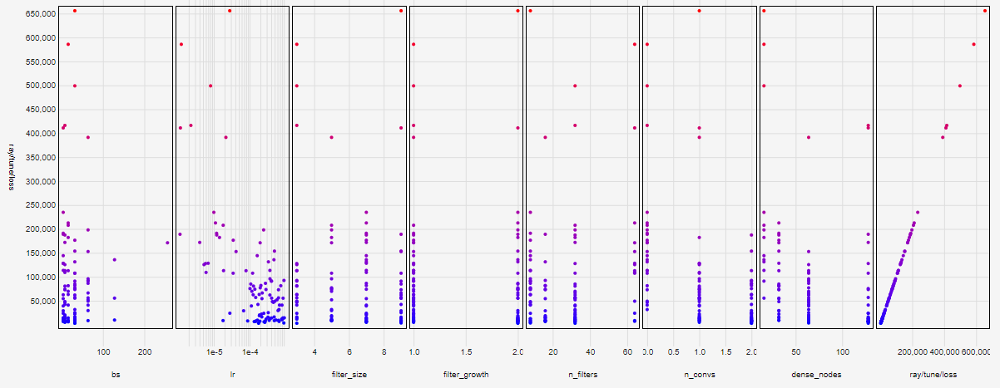

In [8]:
IPython.display.Image(Path.cwd()/"media"/"images"/"2_face_tune_scatter.png")

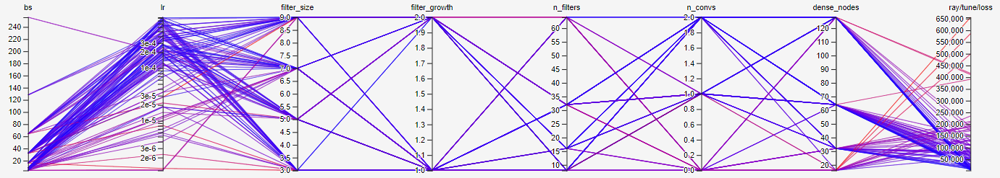

In [9]:
IPython.display.Image(Path.cwd()/"media"/"images"/"2_face_tune_parallel.png")

### Final

Get the hyperparameters from the best tuning experiments for extended training

In [6]:
gc.collect()
torch.cuda.empty_cache()

start_time = datetime.datetime.now().strftime("%Y-%b-%d %H-%M-%S")

# config = get_best_results(Path.cwd()/"logs"/"face"/"tune")
config = {'seed': 2765, 'bs': 4, 'lr': 0.00027029549113670475, 'filter_size': 9, 'filter_growth': 2, 'n_filters': 32, 'n_convs': 2, 'dense_nodes': 128}

pl.seed_everything(config["seed"])

d_train, d_val, d_test = create_datasets(Path.cwd(), data_partial=True, img_types=["face"], seed=config["seed"], batch_size=config["bs"])

model = SingleModel(config, "face")
trainer = pl.Trainer(
    max_epochs=50,
    devices=1,
    accelerator="gpu",
    enable_checkpointing=True,
    logger=TensorBoardLogger(save_dir=Path.cwd()/"logs", name="face/final/{}".format(start_time), log_graph=True))

trainer.fit(model, train_dataloaders=d_train, val_dataloaders=d_val)

save_model(model, config, 
           Path.cwd()/"logs"/"face"/"final"/"{}".format(start_time)/"eyetracking_1000_model.pt", 
           Path.cwd()/"logs"/"face"/"final"/"{}".format(start_time)/"eyetracking_1000_config.json")

Global seed set to 2765
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Missing logger folder: C:\finalPJT\webcam-eye-tracker-master\logs\face/final/2023-May-17 22-42-58
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params | In sizes         | Out sizes        
---------------------------------------------------------------------------------
0 | conv_input | Conv2d     | 7.8 K  | [1, 3, 244, 244] | [1, 32, 236, 236]
1 | convs1     | ModuleList | 830 K  | ?                | ?                
2 | drop1      | Dropout    | 0      | [1, 128]         | [1, 128]         
3 | fc1        | Linear     | 46.0 M | [1, 359552]      | [1, 128]         
4 | drop2      | Dropout    | 0      | [1, 64]          | [1, 64]          
5 | fc2        | Linear     | 8.3 K  | [1, 128]         | [1, 64]          
6 | fc3        | Linear     | 130    | [1, 64]          | [1, 2]     

Sanity Checking: 0it [00:00, ?it/s]

C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=50` reached.


In [9]:
test_results = trainer.test(dataloaders=d_test)
print(f"Pixel error: {np.sqrt(test_results[0]['test_loss'])}")

Restoring states from the checkpoint path at C:\finalPJT\webcam-eye-tracker-master\logs\face/final/2023-May-17 22-42-58\version_0\checkpoints\epoch=49-step=10000.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at C:\finalPJT\webcam-eye-tracker-master\logs\face/final/2023-May-17 22-42-58\version_0\checkpoints\epoch=49-step=10000.ckpt


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_loss             5923.1982421875
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Pixel error: 76.96231702714972


# Eyes

Given we are creating an eyetracker, explicitly focusing on the eyes instead of the entire head might be more useful

Its not uncommon when inputting 2 eye images to use shared weights for each subnetwork, but there is probably some value in using different weights for each due to differences in eye size/shape etc.

## Explore

In [ ]:
config = {
        "seed": tune.randint(0, 10000),  # reproducible random seed for each experiment
        "bs": tune.choice([1 << i for i in range(2, 9)]),  # batch size
        "lr": tune.loguniform(1e-7, 1e-3),  # learning rate
        "filter_size": tune.choice([3, 5, 7, 9]),  # filter size (square)
        "filter_growth": tune.choice([1, 2]),  # increase filter count by a factor
        "n_filters": tune.choice([8, 16, 32, 64]),  # number of starting filters
        "n_convs": tune.choice([0, 1, 2]),  # number of conv layers
        "dense_nodes": tune.choice([16, 32, 64, 128]),  # number of nodes in fc layer
    }

analysis = tune_asha(config, data_partial=True, train_func=train_eyes, 
                     name="eyes/explore", img_types=["l_eye", "r_eye"], 
                     num_samples=100, num_epochs=10, seed=87)

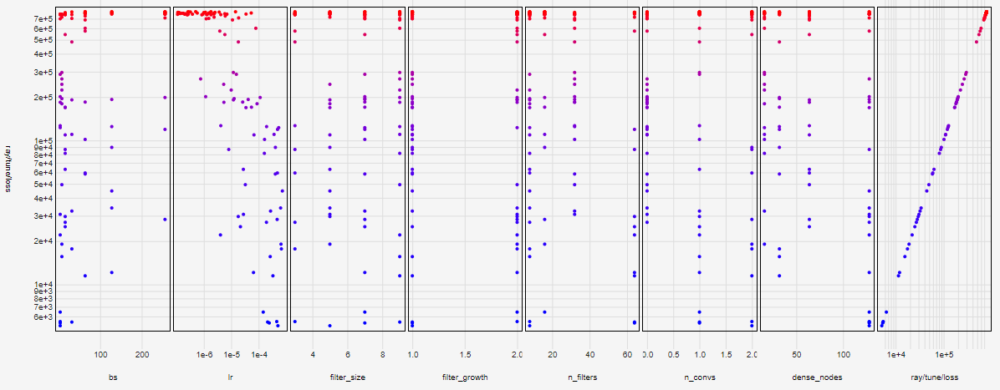

In [6]:
IPython.display.Image(Path.cwd()/"media"/"images"/"5_eyes_explore_scatter.png")

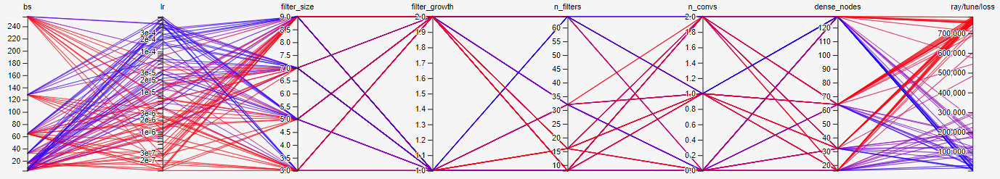

In [7]:
IPython.display.Image(Path.cwd()/"media"/"images"/"5_eyes_explore_parallel.png")

## Fine tune

In [13]:
config = {
        "seed": tune.randint(0, 10000),  # reproducible random seed for each experiment
        "bs": tune.choice([1 << i for i in range(2, 7)]),  # batch size
        "lr": tune.loguniform(1e-4, 1e-2),  # learning rate
        "filter_size": tune.choice([3, 5, 7, 9]),  # filter size (square)
        "filter_growth": tune.choice([1, 2]),  # increase filter count by a factor
        "n_filters": tune.choice([8, 16, 32, 64]),  # number of starting filters
        "n_convs": tune.choice([1, 2]),  # number of conv layers
        "dense_nodes": tune.choice([32, 128]),  # number of nodes in fc layer
    }

analysis = tune_asha(config, data_partial=True, train_func=train_eyes, 
                     name="eyes/tune", img_types=["l_eye", "r_eye"], 
                     num_samples=50, num_epochs=20, seed=87)

(train_eyes pid=24508) Global seed set to 8525


(train_eyes pid=24508) fc1 size = 86528


(train_eyes pid=24508) GPU available: True (cuda), used: True
(train_eyes pid=24508) TPU available: False, using: 0 TPU cores
(train_eyes pid=24508) IPU available: False, using: 0 IPUs
(train_eyes pid=24508) HPU available: False, using: 0 HPUs
(train_eyes pid=24508) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=24508) 
(train_eyes pid=24508)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=24508) -------------------------------------------------------------------------------
(train_eyes pid=24508) 0 | l_conv_input | Conv2d     | 9.5 K  | [1, 3, 64, 64] | [1, 64, 58, 58]
(train_eyes pid=24508) 1 | r_conv_input | Conv2d     | 9.5 K  | [1, 3, 64, 64] | [1, 64, 58, 58]
(train_eyes pid=24508) 2 | l_convs      | ModuleList | 200 K  | ?              | ?              
(train_eyes pid=24508) 3 | r_convs      | ModuleList | 200 K  | ?              | ?              
(train_eyes pid=24508) 4 | drop1        | Dropout    | 0      | [1, 128]       

(train_eyes pid=24508) out size = torch.Size([1, 86528])


(train_eyes pid=24508) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=24508)   rank_zero_warn(
(train_eyes pid=24508) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=24508)   rank_zero_warn(


Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 40.00it/s]


(train_eyes pid=24508) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=24508)   rank_zero_warn(
(train_eyes pid=24508) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (25) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_eyes pid=24508)   rank_zero_warn(


(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 0:   0%|          | 0/25 [00:00<?, ?it/s]                            
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 0:   4%|▍         | 1/25 [00:00<00:13,  1.75it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 0:   8%|▊         | 2/25 [00:00<00:07,  2.97it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 0:  16%|█▌        | 4/25 [00:00<00:04,  4.62it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 0:  20%|██        | 5/25 [00:00<00:03,  5.23it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 0:  28%|██▊       | 7/25 [00:01<00:02,  6.08it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 0:  32%|███▏      | 8/25 [00:01<00:02,  6.41it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 0:  40%|████      | 10/25 [00:01<00:02,  6.91it/s, v_num=.]
(tra

Trial name,date,done,hostname,iterations_since_restore,loss,node_ip,pid,time_since_restore,time_this_iter_s,time_total_s,timestamp,training_iteration,trial_id
train_eyes_72e70_00000,2023-05-18_11-13-52,True,DESKTOP-KVCQHCD,20,6719.2,127.0.0.1,24508,69.404,3.2328,69.404,1684376032,20,72e70_00000
train_eyes_72e70_00001,2023-05-18_11-14-22,True,DESKTOP-KVCQHCD,4,41265.4,127.0.0.1,16636,18.885,3.5998,18.885,1684376062,4,72e70_00001
train_eyes_72e70_00002,2023-05-18_11-14-42,True,DESKTOP-KVCQHCD,1,340552,127.0.0.1,23808,8.30877,8.30877,8.30877,1684376082,1,72e70_00002
train_eyes_72e70_00003,2023-05-18_11-15-04,True,DESKTOP-KVCQHCD,2,84066.5,127.0.0.1,23556,11.6789,3.65731,11.6789,1684376104,2,72e70_00003
train_eyes_72e70_00004,2023-05-18_11-15-22,True,DESKTOP-KVCQHCD,1,423392,127.0.0.1,29692,7.54232,7.54232,7.54232,1684376122,1,72e70_00004
train_eyes_72e70_00005,2023-05-18_11-15-44,True,DESKTOP-KVCQHCD,2,89854.2,127.0.0.1,13628,11.1684,3.51303,11.1684,1684376144,2,72e70_00005
train_eyes_72e70_00006,2023-05-18_11-16-01,True,DESKTOP-KVCQHCD,1,547782,127.0.0.1,17380,7.31564,7.31564,7.31564,1684376161,1,72e70_00006
train_eyes_72e70_00007,2023-05-18_11-16-49,True,DESKTOP-KVCQHCD,8,16181.4,127.0.0.1,3236,37.5671,4.18054,37.5671,1684376209,8,72e70_00007
train_eyes_72e70_00008,2023-05-18_11-17-58,True,DESKTOP-KVCQHCD,16,7367.44,127.0.0.1,27568,58.348,3.69765,58.348,1684376278,16,72e70_00008
train_eyes_72e70_00009,2023-05-18_11-18-15,True,DESKTOP-KVCQHCD,1,511970,127.0.0.1,22980,6.56199,6.56199,6.56199,1684376295,1,72e70_00009


(train_eyes pid=24508) out size = torch.Size([32, 86528])
(train_eyes pid=24508) 
Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00, 14.22it/s]out size = torch.Size([4, 86528])
(train_eyes pid=24508) 
Epoch 1:   0%|          | 0/25 [00:00<?, ?it/s, v_num=.]         
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 1:   4%|▍         | 1/25 [00:00<00:02,  9.01it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 1:   8%|▊         | 2/25 [00:00<00:02,  8.85it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 1:  16%|█▌        | 4/25 [00:00<00:02,  9.71it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 1:  20%|██        | 5/25 [00:00<00:02,  9.54it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 1:  28%|██▊       | 7/25 [00:00<00:01,  9.75it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 1:  32%|███▏      | 8/25 [00:00<00:01,  9.77i

(train_eyes pid=24508) out size = torch.Size([32, 86528])
(train_eyes pid=24508) 
Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00, 15.45it/s]out size = torch.Size([4, 86528])
(train_eyes pid=24508) 
Epoch 3:   4%|▍         | 1/25 [00:00<00:02, 11.76it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 3:   8%|▊         | 2/25 [00:00<00:02, 10.81it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 3:  12%|█▏        | 3/25 [00:00<00:02, 10.14it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 3:  16%|█▌        | 4/25 [00:00<00:02, 10.18it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 3:  20%|██        | 5/25 [00:00<00:01, 10.42it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 3:  28%|██▊       | 7/25 [00:00<00:01, 10.40it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 3:  32%|███▏      | 8/25 [00:00<00:01, 10.48it

Epoch 5:   4%|▍         | 1/25 [00:00<00:02, 10.75it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 5:   8%|▊         | 2/25 [00:00<00:02,  9.78it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 5:  12%|█▏        | 3/25 [00:00<00:02,  9.43it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 5:  20%|██        | 5/25 [00:00<00:02,  9.78it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 5:  24%|██▍       | 6/25 [00:00<00:02,  9.39it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 5:  28%|██▊       | 7/25 [00:00<00:01,  9.42it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 5:  32%|███▏      | 8/25 [00:00<00:01,  9.64it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 5:  36%|███▌      | 9/25 [00:00<00:01,  9.75it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 5:  44%|██

(train_eyes pid=24508) out size = torch.Size([32, 86528])
(train_eyes pid=24508) 
Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00, 13.82it/s]out size = torch.Size([4, 86528])
(train_eyes pid=24508) 
Epoch 7:   0%|          | 0/25 [00:00<?, ?it/s, v_num=.]         
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 7:   8%|▊         | 2/25 [00:00<00:02, 10.58it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 7:  12%|█▏        | 3/25 [00:00<00:02, 10.35it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 7:  16%|█▌        | 4/25 [00:00<00:02, 10.05it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 7:  20%|██        | 5/25 [00:00<00:01, 10.02it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 7:  24%|██▍       | 6/25 [00:00<00:01, 10.03it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 7:  32%|███▏      | 8/25 [00:00<00:01, 10.29i

(train_eyes pid=24508) out size = torch.Size([32, 86528])
(train_eyes pid=24508) 
Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00, 14.71it/s]out size = torch.Size([4, 86528])
(train_eyes pid=24508) 
Epoch 9:   0%|          | 0/25 [00:00<?, ?it/s, v_num=.]         
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 9:   4%|▍         | 1/25 [00:00<00:02, 10.31it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 9:   8%|▊         | 2/25 [00:00<00:02,  9.61it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 9:  12%|█▏        | 3/25 [00:00<00:02,  9.52it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 9:  20%|██        | 5/25 [00:00<00:02,  9.76it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 9:  24%|██▍       | 6/25 [00:00<00:02,  9.44it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 9:  32%|███▏      | 8/25 [00:00<00:01,  9.70i

(train_eyes pid=24508) out size = torch.Size([32, 86528])
(train_eyes pid=24508) 
Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00, 14.85it/s]out size = torch.Size([4, 86528])
(train_eyes pid=24508) 
Epoch 11:   0%|          | 0/25 [00:00<?, ?it/s, v_num=.]         
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 11:   8%|▊         | 2/25 [00:00<00:02, 10.47it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 11:  12%|█▏        | 3/25 [00:00<00:02, 10.31it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 11:  20%|██        | 5/25 [00:00<00:01, 10.39it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 11:  24%|██▍       | 6/25 [00:00<00:01, 10.42it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 11:  32%|███▏      | 8/25 [00:00<00:01, 10.36it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 11:  36%|███▌      | 9/25 [00:00<00:01,

(train_eyes pid=24508) out size = torch.Size([32, 86528])
(train_eyes pid=24508) 
Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00, 14.85it/s]out size = torch.Size([4, 86528])
(train_eyes pid=24508) 
Epoch 13:   4%|▍         | 1/25 [00:00<00:02, 11.24it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 13:   8%|▊         | 2/25 [00:00<00:02, 11.05it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 13:  16%|█▌        | 4/25 [00:00<00:01, 11.02it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 13:  20%|██        | 5/25 [00:00<00:01, 10.78it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 13:  28%|██▊       | 7/25 [00:00<00:01, 10.77it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 13:  32%|███▏      | 8/25 [00:00<00:01, 10.75it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 13:  40%|████      | 10/25 [00:00<00:01,

(train_eyes pid=24508) out size = torch.Size([32, 86528])
(train_eyes pid=24508) 
Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00, 13.95it/s]out size = torch.Size([4, 86528])
(train_eyes pid=24508) 
Epoch 15:   0%|          | 0/25 [00:00<?, ?it/s, v_num=.]         
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 15:   4%|▍         | 1/25 [00:00<00:02,  8.70it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 15:   8%|▊         | 2/25 [00:00<00:02,  9.17it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 15:  16%|█▌        | 4/25 [00:00<00:02,  9.46it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 15:  20%|██        | 5/25 [00:00<00:02,  9.31it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 15:  24%|██▍       | 6/25 [00:00<00:02,  9.40it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 15:  32%|███▏      | 8/25 [00:00<00:01,

Epoch 17:   0%|          | 0/25 [00:00<?, ?it/s, v_num=.]         
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 17:   4%|▍         | 1/25 [00:00<00:02,  9.01it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 17:  12%|█▏        | 3/25 [00:00<00:02,  9.84it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 17:  16%|█▌        | 4/25 [00:00<00:02, 10.03it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 17:  24%|██▍       | 6/25 [00:00<00:01, 10.17it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 17:  28%|██▊       | 7/25 [00:00<00:01, 10.14it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 17:  36%|███▌      | 9/25 [00:00<00:01, 10.23it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 17:  40%|████      | 10/25 [00:00<00:01, 10.26it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 

(train_eyes pid=24508) out size = torch.Size([4, 86528])
(train_eyes pid=24508) 
Epoch 19:   0%|          | 0/25 [00:00<?, ?it/s, v_num=.]         
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 19:   4%|▍         | 1/25 [00:00<00:02, 10.35it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 19:  12%|█▏        | 3/25 [00:00<00:02, 10.09it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 19:  16%|█▌        | 4/25 [00:00<00:02,  9.95it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 19:  20%|██        | 5/25 [00:00<00:02,  9.80it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 19:  28%|██▊       | 7/25 [00:00<00:01,  9.76it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 19:  32%|███▏      | 8/25 [00:00<00:01,  9.80it/s, v_num=.]
(train_eyes pid=24508) out size = torch.Size([32, 86528])
Epoch 19:  36%|███▌      | 9/25 [00:00<00:01,  9.8

(train_eyes pid=16636) Global seed set to 8253


(train_eyes pid=16636) fc1 size = 73728


(train_eyes pid=16636) GPU available: True (cuda), used: True
(train_eyes pid=16636) TPU available: False, using: 0 TPU cores
(train_eyes pid=16636) IPU available: False, using: 0 IPUs
(train_eyes pid=16636) HPU available: False, using: 0 HPUs
(train_eyes pid=16636) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=16636) 
(train_eyes pid=16636)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=16636) -------------------------------------------------------------------------------
(train_eyes pid=16636) 0 | l_conv_input | Conv2d     | 15.6 K | [1, 3, 64, 64] | [1, 64, 56, 56]
(train_eyes pid=16636) 1 | r_conv_input | Conv2d     | 15.6 K | [1, 3, 64, 64] | [1, 64, 56, 56]
(train_eyes pid=16636) 2 | l_convs      | ModuleList | 331 K  | ?              | ?              
(train_eyes pid=16636) 3 | r_convs      | ModuleList | 331 K  | ?              | ?              
(train_eyes pid=16636) 4 | drop1        | Dropout    | 0      | [1, 128]       

(train_eyes pid=16636) out size = torch.Size([1, 73728])


(train_eyes pid=16636) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=16636)   rank_zero_warn(
(train_eyes pid=16636) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=16636)   rank_zero_warn(
(train_eyes pid=16636) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Sanity Checking: 0it [00:00, ?it/s] 
Epoch 0:   0%|          | 0/50 [00:00<?, ?it/s]                            
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 0:   2%|▏         | 1/50 [00:00<00:14,  3.48it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 0:   4%|▍         | 2/50 [00:00<00:08,  5.73it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 0:   8%|▊         | 4/50 [00:00<00:05,  8.58it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 0:  14%|█▍        | 7/50 [00:00<00:03, 10.97it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 0:  18%|█▊        | 9/50 [00:00<00:03, 11.93it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 0:  24%|██▍       | 12/50 [00:00<00:02, 12.98it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 0:  30%|███       | 15/50 [00:01<00:02, 13.67it/s, v_num=.]
(train_eyes pid=16636) o

(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 1:  10%|█         | 5/50 [00:00<00:02, 16.67it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 1:  12%|█▏        | 6/50 [00:00<00:02, 16.67it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 1:  16%|█▌        | 8/50 [00:00<00:02, 16.74it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 1:  20%|██        | 10/50 [00:00<00:02, 16.61it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 1:  22%|██▏       | 11/50 [00:00<00:02, 16.64it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 1:  26%|██▌       | 13/50 [00:00<00:02, 16.67it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 1:  30%|███       | 15/50 [00:00<00:02, 16.52it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 1:  32%|███▏      | 16/50 [00:00<00:02, 16.60it/s, v_num=.]
(train_eyes

(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 2:  30%|███       | 15/50 [00:00<00:02, 16.45it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 2:  34%|███▍      | 17/50 [00:01<00:01, 16.65it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 2:  36%|███▌      | 18/50 [00:01<00:01, 16.77it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 2:  40%|████      | 20/50 [00:01<00:01, 16.54it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 2:  46%|████▌     | 23/50 [00:01<00:01, 16.63it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 2:  50%|█████     | 25/50 [00:01<00:01, 16.68it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 2:  52%|█████▏    | 26/50 [00:01<00:01, 16.70it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 2:  56%|█████▌    | 28/50 [00:01<00:01, 16.75it/s, v_num=.]
(train_e

(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 3:  46%|████▌     | 23/50 [00:01<00:01, 17.70it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 3:  50%|█████     | 25/50 [00:01<00:01, 17.56it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 3:  52%|█████▏    | 26/50 [00:01<00:01, 17.52it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 3:  56%|█████▌    | 28/50 [00:01<00:01, 17.50it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 3:  58%|█████▊    | 29/50 [00:01<00:01, 17.45it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 3:  64%|██████▍   | 32/50 [00:01<00:01, 17.48it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 3:  68%|██████▊   | 34/50 [00:01<00:00, 17.48it/s, v_num=.]
(train_eyes pid=16636) out size = torch.Size([16, 73728])
Epoch 3:  70%|███████   | 35/50 [00:02<00:00, 17.48it/s, v_num=.]
(train_e

(train_eyes pid=23808) Global seed set to 350


(train_eyes pid=23808) fc1 size = 147456


(train_eyes pid=23808) GPU available: True (cuda), used: True
(train_eyes pid=23808) TPU available: False, using: 0 TPU cores
(train_eyes pid=23808) IPU available: False, using: 0 IPUs
(train_eyes pid=23808) HPU available: False, using: 0 HPUs
(train_eyes pid=23808) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=23808) 
(train_eyes pid=23808)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=23808) -------------------------------------------------------------------------------
(train_eyes pid=23808) 0 | l_conv_input | Conv2d     | 15.6 K | [1, 3, 64, 64] | [1, 64, 56, 56]
(train_eyes pid=23808) 1 | r_conv_input | Conv2d     | 15.6 K | [1, 3, 64, 64] | [1, 64, 56, 56]
(train_eyes pid=23808) 2 | l_convs      | ModuleList | 663 K  | ?              | ?              
(train_eyes pid=23808) 3 | r_convs      | ModuleList | 663 K  | ?              | ?              
(train_eyes pid=23808) 4 | drop1        | Dropout    | 0      | [1, 32]        

(train_eyes pid=23808) out size = torch.Size([1, 147456])


(train_eyes pid=23808) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=23808)   rank_zero_warn(
(train_eyes pid=23808) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=23808)   rank_zero_warn(


Sanity Checking: 0it [00:00, ?it/s] 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 76.94it/s]
(train_eyes pid=23808) out size = torch.Size([32, 147456])
Epoch 0:   0%|          | 0/25 [00:00<?, ?it/s]                            


(train_eyes pid=23808) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=23808)   rank_zero_warn(
(train_eyes pid=23808) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (25) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_eyes pid=23808)   rank_zero_warn(


(train_eyes pid=23808) out size = torch.Size([32, 147456])
Epoch 0:   4%|▍         | 1/25 [00:00<00:07,  3.23it/s, v_num=.]
(train_eyes pid=23808) out size = torch.Size([32, 147456])
Epoch 0:   8%|▊         | 2/25 [00:00<00:04,  4.84it/s, v_num=.]
(train_eyes pid=23808) out size = torch.Size([32, 147456])
Epoch 0:  16%|█▌        | 4/25 [00:00<00:03,  6.32it/s, v_num=.]
(train_eyes pid=23808) out size = torch.Size([32, 147456])
Epoch 0:  20%|██        | 5/25 [00:00<00:03,  6.47it/s, v_num=.]
(train_eyes pid=23808) out size = torch.Size([32, 147456])
Epoch 0:  24%|██▍       | 6/25 [00:00<00:02,  6.73it/s, v_num=.]
(train_eyes pid=23808) out size = torch.Size([32, 147456])
Epoch 0:  28%|██▊       | 7/25 [00:01<00:02,  6.98it/s, v_num=.]
(train_eyes pid=23808) out size = torch.Size([32, 147456])
Epoch 0:  36%|███▌      | 9/25 [00:01<00:02,  7.35it/s, v_num=.]
(train_eyes pid=23808) out size = torch.Size([32, 147456])
Epoch 0:  40%|████      | 10/25 [00:01<00:01,  7.52it/s, v_num=.]
(train_

(train_eyes pid=23556) Global seed set to 9050


(train_eyes pid=23556) fc1 size = 18432


(train_eyes pid=23556) GPU available: True (cuda), used: True
(train_eyes pid=23556) TPU available: False, using: 0 TPU cores
(train_eyes pid=23556) IPU available: False, using: 0 IPUs
(train_eyes pid=23556) HPU available: False, using: 0 HPUs
(train_eyes pid=23556) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=23556) 
(train_eyes pid=23556)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=23556) -------------------------------------------------------------------------------
(train_eyes pid=23556) 0 | l_conv_input | Conv2d     | 3.9 K  | [1, 3, 64, 64] | [1, 16, 56, 56]
(train_eyes pid=23556) 1 | r_conv_input | Conv2d     | 3.9 K  | [1, 3, 64, 64] | [1, 16, 56, 56]
(train_eyes pid=23556) 2 | l_convs      | ModuleList | 20.8 K | ?              | ?              
(train_eyes pid=23556) 3 | r_convs      | ModuleList | 20.8 K | ?              | ?              
(train_eyes pid=23556) 4 | drop1        | Dropout    | 0      | [1, 128]       

(train_eyes pid=23556) out size = torch.Size([1, 18432])


(train_eyes pid=23556) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=23556)   rank_zero_warn(
(train_eyes pid=23556) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=23556)   rank_zero_warn(
(train_eyes pid=23556) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Sanity Checking: 0it [00:00, ?it/s] 
Epoch 0:   0%|          | 0/100 [00:00<?, ?it/s]                           
(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 0:   4%|▍         | 4/100 [00:00<00:08, 11.66it/s, v_num=.]
(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 0:   8%|▊         | 8/100 [00:00<00:05, 16.91it/s, v_num=.]
(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 0:   9%|▉         | 9/100 [00:00<00:05, 17.79it/s, v_num=.]
(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 0:  13%|█▎        | 13/100 [00:00<00:04, 20.54it/s, v_num=.]
(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 0:  14%|█▍        | 14/100 [00:00<00:04, 20.99it/s, v_num=.]
(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 0:  19%|█▉        | 19/100 [00:00<00:03, 22.98it/s, v_num=.]
(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 0:  20%|██        | 20/100 [00:00<00:03, 23.26it/s, v_num=.]
(train_eyes pid=23556)

(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 0:  71%|███████   | 71/100 [00:02<00:01, 28.25it/s, v_num=.]
(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 0:  75%|███████▌  | 75/100 [00:02<00:00, 28.43it/s, v_num=.]
(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 0:  76%|███████▌  | 76/100 [00:02<00:00, 28.47it/s, v_num=.]
(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 0:  77%|███████▋  | 77/100 [00:02<00:00, 28.52it/s, v_num=.]
(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 0:  78%|███████▊  | 78/100 [00:02<00:00, 28.54it/s, v_num=.]
(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 0:  82%|████████▏ | 82/100 [00:02<00:00, 28.58it/s, v_num=.]
(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 0:  86%|████████▌ | 86/100 [00:03<00:00, 28.53it/s, v_num=.]
(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 0:  87%|████████▋ | 87/100 [00:03<00:00, 28.55it/s, v_num=.]
(train_e

(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 1:  25%|██▌       | 25/100 [00:00<00:02, 30.71it/s, v_num=.]
(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 1:  26%|██▌       | 26/100 [00:00<00:02, 30.69it/s, v_num=.]
(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 1:  27%|██▋       | 27/100 [00:00<00:02, 30.68it/s, v_num=.]
(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 1:  28%|██▊       | 28/100 [00:00<00:02, 30.73it/s, v_num=.]
(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 1:  32%|███▏      | 32/100 [00:01<00:02, 30.59it/s, v_num=.]
(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 1:  36%|███▌      | 36/100 [00:01<00:02, 30.56it/s, v_num=.]
(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 1:  37%|███▋      | 37/100 [00:01<00:02, 30.40it/s, v_num=.]
(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 1:  38%|███▊      | 38/100 [00:01<00:02, 30.39it/s, v_num=.]
(train_e

(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 1:  99%|█████████▉| 99/100 [00:03<00:00, 31.32it/s, v_num=.]
(train_eyes pid=23556) out size = torch.Size([8, 18432])
Epoch 1: 100%|██████████| 100/100 [00:03<00:00, 31.31it/s, v_num=.]
(train_eyes pid=23556) 
Validation: 0it [00:00, ?it/s]0m 
(train_eyes pid=23556) 
Validation DataLoader 0:   0%|          | 0/13 [00:00<?, ?it/s]out size = torch.Size([8, 18432])
(train_eyes pid=23556) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 499.86it/s]
(train_eyes pid=23556) out size = torch.Size([8, 18432])
(train_eyes pid=23556) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 64.46it/s] out size = torch.Size([8, 18432])
(train_eyes pid=23556) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 51.72it/s]out size = torch.Size([8, 18432])
(train_eyes pid=23556) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 47.06it/s]out size = torch.Size([8, 18432])
(train_eyes pid=23556) 
Valida

(train_eyes pid=29692) Global seed set to 5054


(train_eyes pid=29692) fc1 size = 4096


(train_eyes pid=29692) GPU available: True (cuda), used: True
(train_eyes pid=29692) TPU available: False, using: 0 TPU cores
(train_eyes pid=29692) IPU available: False, using: 0 IPUs
(train_eyes pid=29692) HPU available: False, using: 0 HPUs
(train_eyes pid=29692) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=29692) 
(train_eyes pid=29692)   | Name         | Type       | Params | In sizes       | Out sizes     
(train_eyes pid=29692) ------------------------------------------------------------------------------
(train_eyes pid=29692) 0 | l_conv_input | Conv2d     | 2.0 K  | [1, 3, 64, 64] | [1, 8, 56, 56]
(train_eyes pid=29692) 1 | r_conv_input | Conv2d     | 2.0 K  | [1, 3, 64, 64] | [1, 8, 56, 56]
(train_eyes pid=29692) 2 | l_convs      | ModuleList | 52.0 K | ?              | ?             
(train_eyes pid=29692) 3 | r_convs      | ModuleList | 52.0 K | ?              | ?             
(train_eyes pid=29692) 4 | drop1        | Dropout    | 0      | [1, 128]       | [1, 

(train_eyes pid=29692) out size = torch.Size([1, 4096])


(train_eyes pid=29692) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=29692)   rank_zero_warn(
(train_eyes pid=29692) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=29692)   rank_zero_warn(
(train_eyes pid=29692) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Epoch 0:   0%|          | 0/100 [00:00<?, ?it/s]                            
(train_eyes pid=29692) out size = torch.Size([8, 4096])
Epoch 0:   3%|▎         | 3/100 [00:00<00:09, 10.27it/s, v_num=.]
(train_eyes pid=29692) out size = torch.Size([8, 4096])
Epoch 0:   4%|▍         | 4/100 [00:00<00:07, 12.42it/s, v_num=.]
(train_eyes pid=29692) out size = torch.Size([8, 4096])
Epoch 0:   5%|▌         | 5/100 [00:00<00:06, 14.09it/s, v_num=.]
(train_eyes pid=29692) out size = torch.Size([8, 4096])
Epoch 0:   6%|▌         | 6/100 [00:00<00:06, 15.51it/s, v_num=.]
(train_eyes pid=29692) out size = torch.Size([8, 4096])
Epoch 0:  11%|█         | 11/100 [00:00<00:04, 20.50it/s, v_num=.]
(train_eyes pid=29692) out size = torch.Size([8, 4096])
Epoch 0:  12%|█▏        | 12/100 [00:00<00:04, 21.11it/s, v_num=.]
(train_eyes pid=29692) out size = torch.Size([8, 4096])
Epoch 0:  13%|█▎        | 13/100 [00:00<00:04, 21.58it/s, v_num=.]
(train_eyes pid=29692) out size = torch.Size([8, 4096])
Epoch 0:  

(train_eyes pid=29692) out size = torch.Size([8, 4096])
Epoch 0:  76%|███████▌  | 76/100 [00:02<00:00, 30.18it/s, v_num=.]
(train_eyes pid=29692) out size = torch.Size([8, 4096])
Epoch 0:  77%|███████▋  | 77/100 [00:02<00:00, 30.21it/s, v_num=.]
(train_eyes pid=29692) out size = torch.Size([8, 4096])
Epoch 0:  78%|███████▊  | 78/100 [00:02<00:00, 30.26it/s, v_num=.]
(train_eyes pid=29692) out size = torch.Size([8, 4096])
Epoch 0:  79%|███████▉  | 79/100 [00:02<00:00, 30.27it/s, v_num=.]
(train_eyes pid=29692) out size = torch.Size([8, 4096])
Epoch 0:  84%|████████▍ | 84/100 [00:02<00:00, 30.49it/s, v_num=.]
(train_eyes pid=29692) out size = torch.Size([8, 4096])
Epoch 0:  89%|████████▉ | 89/100 [00:02<00:00, 30.68it/s, v_num=.]
(train_eyes pid=29692) out size = torch.Size([8, 4096])
Epoch 0:  90%|█████████ | 90/100 [00:02<00:00, 30.68it/s, v_num=.]
(train_eyes pid=29692) out size = torch.Size([8, 4096])
Epoch 0:  95%|█████████▌| 95/100 [00:03<00:00, 30.83it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=13628) Global seed set to 9776


(train_eyes pid=13628) fc1 size = 36864


(train_eyes pid=13628) GPU available: True (cuda), used: True
(train_eyes pid=13628) TPU available: False, using: 0 TPU cores
(train_eyes pid=13628) IPU available: False, using: 0 IPUs
(train_eyes pid=13628) HPU available: False, using: 0 HPUs
(train_eyes pid=13628) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=13628) 
(train_eyes pid=13628)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=13628) -------------------------------------------------------------------------------
(train_eyes pid=13628) 0 | l_conv_input | Conv2d     | 7.8 K  | [1, 3, 64, 64] | [1, 32, 56, 56]
(train_eyes pid=13628) 1 | r_conv_input | Conv2d     | 7.8 K  | [1, 3, 64, 64] | [1, 32, 56, 56]
(train_eyes pid=13628) 2 | l_convs      | ModuleList | 83.0 K | ?              | ?              
(train_eyes pid=13628) 3 | r_convs      | ModuleList | 83.0 K | ?              | ?              
(train_eyes pid=13628) 4 | drop1        | Dropout    | 0      | [1, 128]       

(train_eyes pid=13628) out size = torch.Size([1, 36864])


(train_eyes pid=13628) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=13628)   rank_zero_warn(
(train_eyes pid=13628) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=13628)   rank_zero_warn(
(train_eyes pid=13628) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Sanity Checking: 0it [00:00, ?it/s] 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 99.69it/s]
(train_eyes pid=13628) out size = torch.Size([8, 36864])
Epoch 0:   2%|▏         | 2/100 [00:00<00:12,  7.78it/s, v_num=.]
(train_eyes pid=13628) out size = torch.Size([8, 36864])
Epoch 0:   7%|▋         | 7/100 [00:00<00:05, 16.99it/s, v_num=.]
(train_eyes pid=13628) out size = torch.Size([8, 36864])
Epoch 0:  12%|█▏        | 12/100 [00:00<00:04, 21.62it/s, v_num=.]
(train_eyes pid=13628) out size = torch.Size([8, 36864])
Epoch 0:  17%|█▋        | 17/100 [00:00<00:03, 24.46it/s, v_num=.]
(train_eyes pid=13628) out size = torch.Size([8, 36864])
Epoch 0:  22%|██▏       | 22/100 [00:00<00:02, 26.16it/s, v_num=.]
(train_eyes pid=13628) out size = torch.Size([8, 36864])
Epoch 0:  27%|██▋       | 27/100 [00:00<00:02, 27.41it/s, v_num=.]
(train_eyes pid=13628) out size = torch.Size([8, 36864])
Epoch 0:  32%|███▏      | 32/100 [00:01<00:02, 28.44it/s, v_num=.]
(train_eyes pid=13628

(train_eyes pid=13628) out size = torch.Size([8, 36864])
Epoch 0:  82%|████████▏ | 82/100 [00:02<00:00, 30.29it/s, v_num=.]
(train_eyes pid=13628) out size = torch.Size([8, 36864])
Epoch 0:  87%|████████▋ | 87/100 [00:02<00:00, 30.53it/s, v_num=.]
(train_eyes pid=13628) out size = torch.Size([8, 36864])
Epoch 0:  92%|█████████▏| 92/100 [00:02<00:00, 30.78it/s, v_num=.]
(train_eyes pid=13628) out size = torch.Size([8, 36864])
Epoch 0:  97%|█████████▋| 97/100 [00:03<00:00, 31.00it/s, v_num=.]
(train_eyes pid=13628) out size = torch.Size([8, 36864])
Epoch 0: 100%|██████████| 100/100 [00:03<00:00, 31.04it/s, v_num=.]
Validation: 0it [00:00, ?it/s]0m 
Validation DataLoader 0:   0%|          | 0/13 [00:00<?, ?it/s]out size = torch.Size([8, 36864])
(train_eyes pid=13628) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 334.10it/s]
(train_eyes pid=13628) out size = torch.Size([8, 36864])
(train_eyes pid=13628) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 66.74it/s

(train_eyes pid=13628) out size = torch.Size([8, 36864])
Epoch 1:  41%|████      | 41/100 [00:01<00:01, 33.56it/s, v_num=.]
(train_eyes pid=13628) out size = torch.Size([8, 36864])
Epoch 1:  42%|████▏     | 42/100 [00:01<00:01, 33.50it/s, v_num=.]
(train_eyes pid=13628) out size = torch.Size([8, 36864])
Epoch 1:  46%|████▌     | 46/100 [00:01<00:01, 33.46it/s, v_num=.]
(train_eyes pid=13628) out size = torch.Size([8, 36864])
Epoch 1:  47%|████▋     | 47/100 [00:01<00:01, 33.41it/s, v_num=.]
(train_eyes pid=13628) out size = torch.Size([8, 36864])
Epoch 1:  51%|█████     | 51/100 [00:01<00:01, 33.23it/s, v_num=.]
(train_eyes pid=13628) out size = torch.Size([8, 36864])
Epoch 1:  52%|█████▏    | 52/100 [00:01<00:01, 33.21it/s, v_num=.]
(train_eyes pid=13628) out size = torch.Size([8, 36864])
Epoch 1:  57%|█████▋    | 57/100 [00:01<00:01, 33.28it/s, v_num=.]
(train_eyes pid=13628) out size = torch.Size([8, 36864])
Epoch 1:  58%|█████▊    | 58/100 [00:01<00:01, 33.22it/s, v_num=.]
(train_e

(train_eyes pid=13628) out size = torch.Size([8, 36864])
(train_eyes pid=13628) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 43.29it/s]out size = torch.Size([8, 36864])
(train_eyes pid=13628) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 43.31it/s]out size = torch.Size([8, 36864])
(train_eyes pid=13628) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 43.48it/s]out size = torch.Size([4, 36864])
(train_eyes pid=13628) 
Validation DataLoader 0: 100%|██████████| 13/13 [00:00<00:00, 44.98it/s]


(train_eyes pid=17380) Global seed set to 1350


(train_eyes pid=17380) fc1 size = 73728


(train_eyes pid=17380) GPU available: True (cuda), used: True
(train_eyes pid=17380) TPU available: False, using: 0 TPU cores
(train_eyes pid=17380) IPU available: False, using: 0 IPUs
(train_eyes pid=17380) HPU available: False, using: 0 HPUs
(train_eyes pid=17380) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=17380) 
(train_eyes pid=17380)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=17380) -------------------------------------------------------------------------------
(train_eyes pid=17380) 0 | l_conv_input | Conv2d     | 15.6 K | [1, 3, 64, 64] | [1, 64, 56, 56]
(train_eyes pid=17380) 1 | r_conv_input | Conv2d     | 15.6 K | [1, 3, 64, 64] | [1, 64, 56, 56]
(train_eyes pid=17380) 2 | l_convs      | ModuleList | 331 K  | ?              | ?              
(train_eyes pid=17380) 3 | r_convs      | ModuleList | 331 K  | ?              | ?              
(train_eyes pid=17380) 4 | drop1        | Dropout    | 0      | [1, 32]        

(train_eyes pid=17380) out size = torch.Size([1, 73728])


(train_eyes pid=17380) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=17380)   rank_zero_warn(
(train_eyes pid=17380) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=17380)   rank_zero_warn(
(train_eyes pid=17380) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 100.21it/s]
(train_eyes pid=17380) out size = torch.Size([16, 73728])
Epoch 0:   0%|          | 0/50 [00:00<?, ?it/s]                             
(train_eyes pid=17380) out size = torch.Size([16, 73728])
Epoch 0:   2%|▏         | 1/50 [00:00<00:12,  4.07it/s, v_num=.]
(train_eyes pid=17380) out size = torch.Size([16, 73728])
Epoch 0:   4%|▍         | 2/50 [00:00<00:07,  6.57it/s, v_num=.]
(train_eyes pid=17380) out size = torch.Size([16, 73728])
Epoch 0:   8%|▊         | 4/50 [00:00<00:04,  9.47it/s, v_num=.]
(train_eyes pid=17380) out size = torch.Size([16, 73728])
Epoch 0:  14%|█▍        | 7/50 [00:00<00:03, 11.71it/s, v_num=.]
(train_eyes pid=17380) out size = torch.Size([16, 73728])
Epoch 0:  18%|█▊        | 9/50 [00:00<00:03, 12.67it/s, v_num=.]
(train_eyes pid=17380) out size = torch.Size([16, 73728])
Epoch 0:  20%|██        | 10/50 [00:00<00:03, 13.03it/s, v_num=.]
(train_eyes pid=17380) out size = torch.Size([16,

(train_eyes pid=3236) Global seed set to 94


(train_eyes pid=3236) fc1 size = 9216


(train_eyes pid=3236) GPU available: True (cuda), used: True
(train_eyes pid=3236) TPU available: False, using: 0 TPU cores
(train_eyes pid=3236) IPU available: False, using: 0 IPUs
(train_eyes pid=3236) HPU available: False, using: 0 HPUs
(train_eyes pid=3236) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=3236) 
(train_eyes pid=3236)   | Name         | Type       | Params | In sizes       | Out sizes     
(train_eyes pid=3236) ------------------------------------------------------------------------------
(train_eyes pid=3236) 0 | l_conv_input | Conv2d     | 608    | [1, 3, 64, 64] | [1, 8, 60, 60]
(train_eyes pid=3236) 1 | r_conv_input | Conv2d     | 608    | [1, 3, 64, 64] | [1, 8, 60, 60]
(train_eyes pid=3236) 2 | l_convs      | ModuleList | 16.1 K | ?              | ?             
(train_eyes pid=3236) 3 | r_convs      | ModuleList | 16.1 K | ?              | ?             
(train_eyes pid=3236) 4 | drop1        | Dropout    | 0      | [1, 32]        | [1, 32]       
(t

(train_eyes pid=3236) out size = torch.Size([1, 9216])


(train_eyes pid=3236) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=3236)   rank_zero_warn(
(train_eyes pid=3236) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=3236)   rank_zero_warn(
(train_eyes pid=3236) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: Possi

Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 83.34it/s]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 0:   0%|          | 0/200 [00:00<?, ?it/s]                           
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 0:   2%|▎         | 5/200 [00:00<00:10, 18.66it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 0:   3%|▎         | 6/200 [00:00<00:09, 20.76it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 0:   4%|▎         | 7/200 [00:00<00:08, 22.73it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 0:   4%|▍         | 8/200 [00:00<00:07, 24.32it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 0:   4%|▍         | 9/200 [00:00<00:07, 25.86it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 0:   5%|▌         | 10/200 [00:00<00:06, 27.32it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 0:   

Epoch 0:  30%|███       | 61/200 [00:01<00:03, 45.62it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 0:  31%|███       | 62/200 [00:01<00:03, 45.72it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 0:  32%|███▏      | 63/200 [00:01<00:02, 45.69it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 0:  32%|███▏      | 64/200 [00:01<00:02, 45.71it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 0:  33%|███▎      | 66/200 [00:01<00:02, 45.94it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 0:  34%|███▎      | 67/200 [00:01<00:02, 46.02it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 0:  34%|███▍      | 68/200 [00:01<00:02, 46.10it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 0:  34%|███▍      | 69/200 [00:01<00:02, 46.18it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 0:  35%|███▌      

(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 0:  66%|██████▌   | 132/200 [00:02<00:01, 49.46it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 0:  66%|██████▋   | 133/200 [00:02<00:01, 49.50it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 0:  67%|██████▋   | 134/200 [00:02<00:01, 49.54it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 0:  68%|██████▊   | 136/200 [00:02<00:01, 49.58it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 0:  68%|██████▊   | 137/200 [00:02<00:01, 49.64it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 0:  69%|██████▉   | 138/200 [00:02<00:01, 49.66it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 0:  70%|██████▉   | 139/200 [00:02<00:01, 49.71it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 0:  70%|███████   | 140/200 [00:02<00:01, 49.73it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=3236) 
Validation DataLoader 0:   0%|          | 0/25 [00:00<?, ?it/s]out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 500.04it/s]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 124.99it/s]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 96.68it/s] 
(train_eyes pid=3236) out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 88.89it/s]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 83.33it/s]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 76.93it/s]
(train_eyes pid=3236) out size = 

(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 1:  16%|█▋        | 33/200 [00:00<00:03, 53.40it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 1:  17%|█▋        | 34/200 [00:00<00:03, 53.46it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 1:  18%|█▊        | 35/200 [00:00<00:03, 53.60it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 1:  18%|█▊        | 36/200 [00:00<00:03, 53.73it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 1:  18%|█▊        | 37/200 [00:00<00:03, 53.54it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 1:  19%|█▉        | 38/200 [00:00<00:03, 53.60it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 1:  20%|█▉        | 39/200 [00:00<00:03, 53.64it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 1:  20%|██        | 40/200 [00:00<00:02, 53.69it/s, v_num=.]
(train_eyes pid=3236) ou

(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 1:  48%|████▊     | 95/200 [00:01<00:02, 49.17it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 1:  48%|████▊     | 96/200 [00:01<00:02, 49.20it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 1:  48%|████▊     | 97/200 [00:01<00:02, 49.21it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 1:  49%|████▉     | 98/200 [00:01<00:02, 49.17it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 1:  50%|█████     | 100/200 [00:02<00:02, 49.16it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 1:  50%|█████     | 101/200 [00:02<00:02, 49.17it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 1:  51%|█████     | 102/200 [00:02<00:01, 49.18it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 1:  52%|█████▏    | 103/200 [00:02<00:01, 49.23it/s, v_num=.]
(train_eyes pid=3236

Epoch 1:  80%|████████  | 160/200 [00:03<00:00, 49.60it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 1:  80%|████████  | 161/200 [00:03<00:00, 49.59it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 1:  81%|████████  | 162/200 [00:03<00:00, 49.61it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 1:  82%|████████▏ | 163/200 [00:03<00:00, 49.61it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 1:  82%|████████▏ | 164/200 [00:03<00:00, 49.61it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 1:  82%|████████▎ | 165/200 [00:03<00:00, 49.63it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 1:  83%|████████▎ | 166/200 [00:03<00:00, 49.63it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 1:  84%|████████▎ | 167/200 [00:03<00:00, 49.65it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 1:  84%|██

Epoch 2:   4%|▎         | 7/200 [00:00<00:03, 56.00it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 2:   4%|▍         | 8/200 [00:00<00:03, 54.79it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 2:   4%|▍         | 9/200 [00:00<00:03, 54.22it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 2:   5%|▌         | 10/200 [00:00<00:03, 53.76it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 2:   6%|▌         | 11/200 [00:00<00:03, 53.14it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 2:   6%|▌         | 12/200 [00:00<00:03, 52.86it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 2:   6%|▋         | 13/200 [00:00<00:03, 52.84it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 2:   7%|▋         | 14/200 [00:00<00:03, 52.43it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 2:   8%|▊         | 1

(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 2:  36%|███▌      | 72/200 [00:01<00:02, 52.10it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 2:  37%|███▋      | 74/200 [00:01<00:02, 52.04it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 2:  38%|███▊      | 75/200 [00:01<00:02, 51.98it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 2:  38%|███▊      | 76/200 [00:01<00:02, 52.05it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 2:  38%|███▊      | 77/200 [00:01<00:02, 52.03it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 2:  40%|███▉      | 79/200 [00:01<00:02, 52.08it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 2:  40%|████      | 80/200 [00:01<00:02, 52.05it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 2:  40%|████      | 81/200 [00:01<00:02, 52.06it/s, v_num=.]
(train_eyes pid=3236) ou

(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 2:  70%|███████   | 140/200 [00:02<00:01, 51.93it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 2:  70%|███████   | 141/200 [00:02<00:01, 51.91it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 2:  71%|███████   | 142/200 [00:02<00:01, 51.96it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 2:  72%|███████▏  | 143/200 [00:02<00:01, 51.98it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 2:  72%|███████▎  | 145/200 [00:02<00:01, 51.93it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 2:  73%|███████▎  | 146/200 [00:02<00:01, 51.94it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 2:  74%|███████▎  | 147/200 [00:02<00:01, 51.94it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 2:  74%|███████▍  | 148/200 [00:02<00:01, 51.98it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=3236) out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 71.94it/s]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 70.97it/s]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 71.01it/s]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 70.65it/s]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 70.35it/s]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 70.09it/s]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataL

Epoch 3:  21%|██        | 42/200 [00:00<00:02, 52.94it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 3:  22%|██▏       | 43/200 [00:00<00:02, 52.81it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 3:  22%|██▏       | 44/200 [00:00<00:02, 52.87it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 3:  22%|██▎       | 45/200 [00:00<00:02, 52.86it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 3:  23%|██▎       | 46/200 [00:00<00:02, 52.98it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 3:  24%|██▍       | 48/200 [00:00<00:02, 53.08it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 3:  24%|██▍       | 49/200 [00:00<00:02, 53.07it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 3:  25%|██▌       | 50/200 [00:00<00:02, 53.12it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 3:  26%|██▌       

(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 3:  56%|█████▋    | 113/200 [00:02<00:01, 53.67it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 3:  57%|█████▊    | 115/200 [00:02<00:01, 53.68it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 3:  58%|█████▊    | 116/200 [00:02<00:01, 53.70it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 3:  58%|█████▊    | 117/200 [00:02<00:01, 53.71it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 3:  59%|█████▉    | 118/200 [00:02<00:01, 53.73it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 3:  60%|█████▉    | 119/200 [00:02<00:01, 53.69it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 3:  60%|██████    | 120/200 [00:02<00:01, 53.68it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 3:  60%|██████    | 121/200 [00:02<00:01, 53.68it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 3:  91%|█████████ | 182/200 [00:03<00:00, 53.52it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 3:  92%|█████████▏| 183/200 [00:03<00:00, 53.54it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 3:  92%|█████████▏| 184/200 [00:03<00:00, 53.55it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 3:  93%|█████████▎| 186/200 [00:03<00:00, 53.54it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 3:  94%|█████████▎| 187/200 [00:03<00:00, 53.55it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 3:  94%|█████████▍| 188/200 [00:03<00:00, 53.54it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 3:  94%|█████████▍| 189/200 [00:03<00:00, 53.54it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 3:  95%|█████████▌| 190/200 [00:03<00:00, 53.55it/s, v_num=.]
(train_eyes pid=

Epoch 4:   6%|▌         | 11/200 [00:00<00:03, 56.70it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 4:   6%|▌         | 12/200 [00:00<00:03, 56.33it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 4:   6%|▋         | 13/200 [00:00<00:03, 56.03it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 4:   7%|▋         | 14/200 [00:00<00:03, 55.78it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 4:   8%|▊         | 16/200 [00:00<00:03, 55.56it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 4:   8%|▊         | 17/200 [00:00<00:03, 55.73it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 4:   9%|▉         | 18/200 [00:00<00:03, 55.73it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 4:  10%|▉         | 19/200 [00:00<00:03, 55.72it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 4:  10%|█         

(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 4:  39%|███▉      | 78/200 [00:01<00:02, 53.90it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 4:  40%|████      | 80/200 [00:01<00:02, 53.94it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 4:  40%|████      | 81/200 [00:01<00:02, 53.93it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 4:  41%|████      | 82/200 [00:01<00:02, 53.91it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 4:  42%|████▏     | 83/200 [00:01<00:02, 53.93it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 4:  42%|████▎     | 85/200 [00:01<00:02, 53.87it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 4:  43%|████▎     | 86/200 [00:01<00:02, 53.88it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 4:  44%|████▎     | 87/200 [00:01<00:02, 53.90it/s, v_num=.]
(train_eyes pid=3236) ou

(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 4:  71%|███████   | 142/200 [00:02<00:01, 53.95it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 4:  72%|███████▏  | 143/200 [00:02<00:01, 53.92it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 4:  72%|███████▏  | 144/200 [00:02<00:01, 53.93it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 4:  72%|███████▎  | 145/200 [00:02<00:01, 53.90it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 4:  73%|███████▎  | 146/200 [00:02<00:01, 53.83it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 4:  74%|███████▎  | 147/200 [00:02<00:00, 53.77it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 4:  74%|███████▍  | 148/200 [00:02<00:00, 53.74it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 4:  74%|███████▍  | 149/200 [00:02<00:00, 53.69it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=3236) out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 72.54it/s]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 72.46it/s]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 72.07it/s]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 72.03it/s]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 71.71it/s]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 71.43it/s]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataL

(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 5:  29%|██▉       | 58/200 [00:01<00:02, 53.50it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 5:  30%|██▉       | 59/200 [00:01<00:02, 53.44it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 5:  30%|███       | 60/200 [00:01<00:02, 53.48it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 5:  30%|███       | 61/200 [00:01<00:02, 53.28it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 5:  31%|███       | 62/200 [00:01<00:02, 53.36it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 5:  32%|███▏      | 63/200 [00:01<00:02, 53.26it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 5:  32%|███▏      | 64/200 [00:01<00:02, 53.25it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 5:  32%|███▎      | 65/200 [00:01<00:02, 53.32it/s, v_num=.]
(train_eyes pid=3236) ou

(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 5:  57%|█████▊    | 115/200 [00:02<00:01, 53.32it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 5:  58%|█████▊    | 116/200 [00:02<00:01, 53.28it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 5:  58%|█████▊    | 117/200 [00:02<00:01, 53.23it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 5:  59%|█████▉    | 118/200 [00:02<00:01, 53.27it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 5:  60%|█████▉    | 119/200 [00:02<00:01, 53.27it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 5:  60%|██████    | 120/200 [00:02<00:01, 53.29it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 5:  60%|██████    | 121/200 [00:02<00:01, 53.30it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 5:  61%|██████    | 122/200 [00:02<00:01, 53.32it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 5:  92%|█████████▏| 184/200 [00:03<00:00, 53.41it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 5:  92%|█████████▎| 185/200 [00:03<00:00, 53.41it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 5:  93%|█████████▎| 186/200 [00:03<00:00, 53.40it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 5:  94%|█████████▎| 187/200 [00:03<00:00, 53.40it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 5:  94%|█████████▍| 188/200 [00:03<00:00, 53.42it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 5:  94%|█████████▍| 189/200 [00:03<00:00, 53.42it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 5:  95%|█████████▌| 190/200 [00:03<00:00, 53.43it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 5:  96%|█████████▌| 191/200 [00:03<00:00, 53.44it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 6:   6%|▌         | 11/200 [00:00<00:03, 53.72it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 6:   6%|▌         | 12/200 [00:00<00:03, 53.63it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 6:   6%|▋         | 13/200 [00:00<00:03, 53.55it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 6:   7%|▋         | 14/200 [00:00<00:03, 53.28it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 6:   8%|▊         | 15/200 [00:00<00:03, 53.24it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 6:   8%|▊         | 17/200 [00:00<00:03, 53.33it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 6:   9%|▉         | 18/200 [00:00<00:03, 53.45it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 6:  10%|▉         | 19/200 [00:00<00:03, 53.56it/s, v_num=.]
(train_eyes pid=3236) ou

(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 6:  40%|████      | 81/200 [00:01<00:02, 53.39it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 6:  41%|████      | 82/200 [00:01<00:02, 53.35it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 6:  42%|████▏     | 83/200 [00:01<00:02, 53.37it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 6:  42%|████▎     | 85/200 [00:01<00:02, 53.39it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 6:  43%|████▎     | 86/200 [00:01<00:02, 53.41it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 6:  44%|████▎     | 87/200 [00:01<00:02, 53.37it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 6:  44%|████▍     | 88/200 [00:01<00:02, 53.33it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 6:  45%|████▌     | 90/200 [00:01<00:02, 53.32it/s, v_num=.]
(train_eyes pid=3236) ou

(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 6:  75%|███████▌  | 150/200 [00:02<00:00, 53.28it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 6:  79%|███████▉  | 158/200 [00:02<00:00, 53.45it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 6:  80%|███████▉  | 159/200 [00:02<00:00, 53.43it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 6:  80%|████████  | 160/200 [00:02<00:00, 53.42it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 6:  80%|████████  | 161/200 [00:03<00:00, 53.40it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 6:  81%|████████  | 162/200 [00:03<00:00, 53.38it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 6:  82%|████████▏ | 163/200 [00:03<00:00, 53.35it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 6:  82%|████████▏ | 164/200 [00:03<00:00, 53.35it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=3236) out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 72.46it/s]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 70.97it/s]out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 70.59it/s]out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 69.89it/s]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 69.31it/s]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 69.13it/s]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
(train_eyes pid=3236) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 

(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 7:  22%|██▏       | 44/200 [00:00<00:02, 53.53it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 7:  22%|██▎       | 45/200 [00:00<00:02, 53.51it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 7:  23%|██▎       | 46/200 [00:00<00:02, 53.49it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 7:  24%|██▎       | 47/200 [00:00<00:02, 53.47it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 7:  24%|██▍       | 48/200 [00:00<00:02, 53.51it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 7:  24%|██▍       | 49/200 [00:00<00:02, 53.49it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 7:  25%|██▌       | 50/200 [00:00<00:02, 53.53it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 7:  26%|██▌       | 51/200 [00:00<00:02, 53.40it/s, v_num=.]
(train_eyes pid=3236) ou

(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 7:  56%|█████▋    | 113/200 [00:02<00:01, 53.19it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 7:  57%|█████▋    | 114/200 [00:02<00:01, 53.16it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 7:  57%|█████▊    | 115/200 [00:02<00:01, 53.21it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 7:  58%|█████▊    | 117/200 [00:02<00:01, 53.20it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 7:  59%|█████▉    | 118/200 [00:02<00:01, 53.22it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 7:  60%|█████▉    | 119/200 [00:02<00:01, 53.21it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 7:  60%|██████    | 120/200 [00:02<00:01, 53.21it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 7:  61%|██████    | 122/200 [00:02<00:01, 53.22it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 7:  91%|█████████ | 182/200 [00:03<00:00, 52.98it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 7:  92%|█████████▏| 183/200 [00:03<00:00, 53.00it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 7:  92%|█████████▏| 184/200 [00:03<00:00, 53.01it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 7:  92%|█████████▎| 185/200 [00:03<00:00, 52.99it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 7:  93%|█████████▎| 186/200 [00:03<00:00, 53.02it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 7:  94%|█████████▎| 187/200 [00:03<00:00, 53.05it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 7:  94%|█████████▍| 188/200 [00:03<00:00, 53.06it/s, v_num=.]
(train_eyes pid=3236) out size = torch.Size([4, 9216])
Epoch 7:  94%|█████████▍| 189/200 [00:03<00:00, 53.09it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=27568) Global seed set to 1243


(train_eyes pid=27568) fc1 size = 18432


(train_eyes pid=27568) GPU available: True (cuda), used: True
(train_eyes pid=27568) TPU available: False, using: 0 TPU cores
(train_eyes pid=27568) IPU available: False, using: 0 IPUs
(train_eyes pid=27568) HPU available: False, using: 0 HPUs
(train_eyes pid=27568) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=27568) 
(train_eyes pid=27568)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=27568) -------------------------------------------------------------------------------
(train_eyes pid=27568) 0 | l_conv_input | Conv2d     | 4.9 K  | [1, 3, 64, 64] | [1, 64, 60, 60]
(train_eyes pid=27568) 1 | r_conv_input | Conv2d     | 4.9 K  | [1, 3, 64, 64] | [1, 64, 60, 60]
(train_eyes pid=27568) 2 | l_convs      | ModuleList | 205 K  | ?              | ?              
(train_eyes pid=27568) 3 | r_convs      | ModuleList | 205 K  | ?              | ?              
(train_eyes pid=27568) 4 | drop1        | Dropout    | 0      | [1, 128]       

(train_eyes pid=27568) out size = torch.Size([1, 18432])


(train_eyes pid=27568) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=27568)   rank_zero_warn(
(train_eyes pid=27568) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=27568)   rank_zero_warn(
(train_eyes pid=27568) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 76.92it/s]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 0:   0%|          | 0/100 [00:00<?, ?it/s]                           
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 0:   3%|▎         | 3/100 [00:00<00:08, 11.36it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 0:   4%|▍         | 4/100 [00:00<00:07, 13.60it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 0:   9%|▉         | 9/100 [00:00<00:04, 20.50it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 0:  13%|█▎        | 13/100 [00:00<00:03, 22.77it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 0:  14%|█▍        | 14/100 [00:00<00:03, 23.26it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 0:  15%|█▌        | 15/100 [00:00<00:03, 23.70it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 1

Epoch 0:  71%|███████   | 71/100 [00:02<00:00, 30.98it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 0:  72%|███████▏  | 72/100 [00:02<00:00, 30.97it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 0:  76%|███████▌  | 76/100 [00:02<00:00, 31.12it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 0:  77%|███████▋  | 77/100 [00:02<00:00, 31.14it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 0:  81%|████████  | 81/100 [00:02<00:00, 31.25it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 0:  82%|████████▏ | 82/100 [00:02<00:00, 31.24it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 0:  86%|████████▌ | 86/100 [00:02<00:00, 31.35it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 0:  87%|████████▋ | 87/100 [00:02<00:00, 31.36it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 0:

(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 1:  30%|███       | 30/100 [00:00<00:02, 34.01it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 1:  35%|███▌      | 35/100 [00:01<00:01, 34.24it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 1:  40%|████      | 40/100 [00:01<00:01, 34.33it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 1:  45%|████▌     | 45/100 [00:01<00:01, 34.43it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 1:  46%|████▌     | 46/100 [00:01<00:01, 34.35it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 1:  47%|████▋     | 47/100 [00:01<00:01, 34.30it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 1:  51%|█████     | 51/100 [00:01<00:01, 34.23it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 1:  52%|█████▏    | 52/100 [00:01<00:01, 34.21it/s, v_num=.]
(train_e

(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 1: 100%|██████████| 100/100 [00:02<00:00, 34.08it/s, v_num=.]
Validation: 0it [00:00, ?it/s]0m 
Validation DataLoader 0:   0%|          | 0/13 [00:00<?, ?it/s]out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 332.17it/s]out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 73.98it/s] out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 57.69it/s]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 52.16it/s]out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 47.76it/s]out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  46%|████▌     | 6/13 [0

(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 2:  59%|█████▉    | 59/100 [00:01<00:01, 34.09it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 2:  60%|██████    | 60/100 [00:01<00:01, 34.09it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 2:  65%|██████▌   | 65/100 [00:01<00:01, 34.21it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 2:  66%|██████▌   | 66/100 [00:01<00:00, 34.16it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 2:  67%|██████▋   | 67/100 [00:01<00:00, 34.15it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 2:  68%|██████▊   | 68/100 [00:01<00:00, 34.12it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 2:  73%|███████▎  | 73/100 [00:02<00:00, 34.23it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 2:  74%|███████▍  | 74/100 [00:02<00:00, 34.23it/s, v_num=.]
(train_e

(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 3:  16%|█▌        | 16/100 [00:00<00:02, 33.54it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 3:  21%|██        | 21/100 [00:00<00:02, 34.04it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 3:  26%|██▌       | 26/100 [00:00<00:02, 34.11it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 3:  31%|███       | 31/100 [00:00<00:02, 34.36it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 3:  36%|███▌      | 36/100 [00:01<00:01, 34.54it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 3:  41%|████      | 41/100 [00:01<00:01, 34.62it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 3:  46%|████▌     | 46/100 [00:01<00:01, 34.69it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 3:  50%|█████     | 50/100 [00:01<00:01, 34.72it/s, v_num=.]
(train_e

(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 3:  95%|█████████▌| 95/100 [00:02<00:00, 34.30it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 3:  96%|█████████▌| 96/100 [00:02<00:00, 34.25it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 3: 100%|██████████| 100/100 [00:02<00:00, 34.27it/s, v_num=.]
Validation: 0it [00:00, ?it/s]0m 
(train_eyes pid=27568) 
Validation DataLoader 0:   0%|          | 0/13 [00:00<?, ?it/s]out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 331.83it/s]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 74.08it/s] 
(train_eyes pid=27568) out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 54.71it/s]out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation 

(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 4:  56%|█████▌    | 56/100 [00:01<00:01, 34.87it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 4:  61%|██████    | 61/100 [00:01<00:01, 34.84it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 4:  66%|██████▌   | 66/100 [00:01<00:00, 34.81it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 4:  67%|██████▋   | 67/100 [00:01<00:00, 34.79it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 4:  72%|███████▏  | 72/100 [00:02<00:00, 34.84it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 4:  73%|███████▎  | 73/100 [00:02<00:00, 34.80it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 4:  74%|███████▍  | 74/100 [00:02<00:00, 34.75it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 4:  79%|███████▉  | 79/100 [00:02<00:00, 34.82it/s, v_num=.]
(train_e

(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 5:  13%|█▎        | 13/100 [00:00<00:02, 34.30it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 5:  14%|█▍        | 14/100 [00:00<00:02, 34.15it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 5:  18%|█▊        | 18/100 [00:00<00:02, 34.55it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 5:  19%|█▉        | 19/100 [00:00<00:02, 34.48it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 5:  20%|██        | 20/100 [00:00<00:02, 34.42it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 5:  21%|██        | 21/100 [00:00<00:02, 34.26it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 5:  22%|██▏       | 22/100 [00:00<00:02, 34.11it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 5:  23%|██▎       | 23/100 [00:00<00:02, 34.02it/s, v_num=.]
(train_e

(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 5:  95%|█████████▌| 95/100 [00:02<00:00, 34.51it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 5: 100%|██████████| 100/100 [00:02<00:00, 34.55it/s, v_num=.]
Validation: 0it [00:00, ?it/s]0m 
(train_eyes pid=27568) 
Validation DataLoader 0:   0%|          | 0/13 [00:00<?, ?it/s]out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 499.98it/s]out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 74.08it/s] out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 57.69it/s]out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 53.34it/s]out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<

(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 6:  51%|█████     | 51/100 [00:01<00:01, 34.90it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 6:  52%|█████▏    | 52/100 [00:01<00:01, 34.85it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 6:  57%|█████▋    | 57/100 [00:01<00:01, 34.91it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 6:  62%|██████▏   | 62/100 [00:01<00:01, 34.96it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 6:  67%|██████▋   | 67/100 [00:01<00:00, 34.98it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 6:  71%|███████   | 71/100 [00:02<00:00, 34.83it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 6:  72%|███████▏  | 72/100 [00:02<00:00, 34.74it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 6:  77%|███████▋  | 77/100 [00:02<00:00, 34.66it/s, v_num=.]
(train_e

Epoch 7:   4%|▍         | 4/100 [00:00<00:02, 36.08it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 7:   5%|▌         | 5/100 [00:00<00:02, 35.77it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 7:   6%|▌         | 6/100 [00:00<00:02, 34.33it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 7:  10%|█         | 10/100 [00:00<00:02, 34.87it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 7:  11%|█         | 11/100 [00:00<00:02, 34.83it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 7:  12%|█▏        | 12/100 [00:00<00:02, 34.41it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 7:  13%|█▎        | 13/100 [00:00<00:02, 34.32it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 7:  14%|█▍        | 14/100 [00:00<00:02, 34.25it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 7:  1

(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 7:  79%|███████▉  | 79/100 [00:02<00:00, 34.09it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 7:  80%|████████  | 80/100 [00:02<00:00, 34.10it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 7:  81%|████████  | 81/100 [00:02<00:00, 34.07it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 7:  82%|████████▏ | 82/100 [00:02<00:00, 34.06it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 7:  83%|████████▎ | 83/100 [00:02<00:00, 34.07it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 7:  88%|████████▊ | 88/100 [00:02<00:00, 34.12it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 7:  89%|████████▉ | 89/100 [00:02<00:00, 34.10it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 7:  90%|█████████ | 90/100 [00:02<00:00, 34.05it/s, v_num=.]
(train_e

(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 8:  36%|███▌      | 36/100 [00:01<00:01, 34.94it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 8:  41%|████      | 41/100 [00:01<00:01, 35.03it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 8:  46%|████▌     | 46/100 [00:01<00:01, 34.95it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 8:  50%|█████     | 50/100 [00:01<00:01, 35.01it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 8:  51%|█████     | 51/100 [00:01<00:01, 34.79it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 8:  56%|█████▌    | 56/100 [00:01<00:01, 34.61it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 8:  57%|█████▋    | 57/100 [00:01<00:01, 34.50it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 8:  62%|██████▏   | 62/100 [00:01<00:01, 34.48it/s, v_num=.]
(train_e

(train_eyes pid=27568) out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 44.71it/s]out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 44.61it/s]out size = torch.Size([4, 18432])
(train_eyes pid=27568) 
Epoch 9:   3%|▎         | 3/100 [00:00<00:02, 34.09it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 9:   4%|▍         | 4/100 [00:00<00:02, 34.19it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 9:   9%|▉         | 9/100 [00:00<00:02, 34.17it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 9:  14%|█▍        | 14/100 [00:00<00:02, 34.30it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 9:  15%|█▌        | 15/100 [00:00<00:02, 34.00it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 9:  16%|█▌        | 16/100 [00:00<00

(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 9:  73%|███████▎  | 73/100 [00:02<00:00, 34.24it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 9:  78%|███████▊  | 78/100 [00:02<00:00, 34.30it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 9:  79%|███████▉  | 79/100 [00:02<00:00, 34.31it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 9:  84%|████████▍ | 84/100 [00:02<00:00, 34.40it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 9:  89%|████████▉ | 89/100 [00:02<00:00, 34.38it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 9:  90%|█████████ | 90/100 [00:02<00:00, 34.35it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 9:  91%|█████████ | 91/100 [00:02<00:00, 34.34it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 9:  92%|█████████▏| 92/100 [00:02<00:00, 34.33it/s, v_num=.]
(train_e

(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 10:  35%|███▌      | 35/100 [00:01<00:01, 34.37it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 10:  36%|███▌      | 36/100 [00:01<00:01, 34.34it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 10:  37%|███▋      | 37/100 [00:01<00:01, 34.21it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 10:  38%|███▊      | 38/100 [00:01<00:01, 34.10it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 10:  39%|███▉      | 39/100 [00:01<00:01, 34.08it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 10:  43%|████▎     | 43/100 [00:01<00:01, 33.93it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 10:  44%|████▍     | 44/100 [00:01<00:01, 33.78it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 10:  45%|████▌     | 45/100 [00:01<00:01, 33.50it/s, v_num=.]


(train_eyes pid=27568) out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 49.38it/s]out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 47.18it/s]out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 46.16it/s]out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 45.46it/s]out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 45.20it/s]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 44.34it/s]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 43.67it/s]
(train_eyes pid=27568) o

(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 11:  65%|██████▌   | 65/100 [00:01<00:01, 34.55it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 11:  66%|██████▌   | 66/100 [00:01<00:00, 34.51it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 11:  67%|██████▋   | 67/100 [00:01<00:00, 34.44it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 11:  68%|██████▊   | 68/100 [00:01<00:00, 34.41it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 11:  72%|███████▏  | 72/100 [00:02<00:00, 34.48it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 11:  73%|███████▎  | 73/100 [00:02<00:00, 34.48it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 11:  74%|███████▍  | 74/100 [00:02<00:00, 34.41it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 11:  75%|███████▌  | 75/100 [00:02<00:00, 34.38it/s, v_num=.]


(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 12:  20%|██        | 20/100 [00:00<00:02, 35.01it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 12:  25%|██▌       | 25/100 [00:00<00:02, 35.05it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 12:  29%|██▉       | 29/100 [00:00<00:02, 34.68it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 12:  30%|███       | 30/100 [00:00<00:02, 34.47it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 12:  35%|███▌      | 35/100 [00:01<00:01, 34.30it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 12:  40%|████      | 40/100 [00:01<00:01, 34.44it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 12:  41%|████      | 41/100 [00:01<00:01, 34.47it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 12:  46%|████▌     | 46/100 [00:01<00:01, 34.47it/s, v_num=.]


(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 12:  98%|█████████▊| 98/100 [00:02<00:00, 34.73it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 12: 100%|██████████| 100/100 [00:02<00:00, 34.66it/s, v_num=.]
Validation: 0it [00:00, ?it/s]0m 
Validation DataLoader 0:   0%|          | 0/13 [00:00<?, ?it/s]out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 499.92it/s]out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 76.92it/s] 
(train_eyes pid=27568) out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 56.60it/s]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 50.63it/s]out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  38

Epoch 13:  50%|█████     | 50/100 [00:01<00:01, 33.92it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 13:  55%|█████▌    | 55/100 [00:01<00:01, 33.72it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 13:  56%|█████▌    | 56/100 [00:01<00:01, 33.71it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 13:  57%|█████▋    | 57/100 [00:01<00:01, 33.71it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 13:  58%|█████▊    | 58/100 [00:01<00:01, 33.70it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 13:  63%|██████▎   | 63/100 [00:01<00:01, 33.83it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 13:  64%|██████▍   | 64/100 [00:01<00:01, 33.84it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 13:  65%|██████▌   | 65/100 [00:01<00:01, 33.85it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])


Epoch 14:   4%|▍         | 4/100 [00:00<00:02, 34.78it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 14:   9%|▉         | 9/100 [00:00<00:02, 34.88it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 14:  14%|█▍        | 14/100 [00:00<00:02, 34.74it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 14:  15%|█▌        | 15/100 [00:00<00:02, 34.25it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 14:  16%|█▌        | 16/100 [00:00<00:02, 33.76it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 14:  17%|█▋        | 17/100 [00:00<00:02, 33.46it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 14:  18%|█▊        | 18/100 [00:00<00:02, 33.33it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 14:  19%|█▉        | 19/100 [00:00<00:02, 33.33it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Ep

Epoch 14:  73%|███████▎  | 73/100 [00:02<00:00, 32.29it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 14:  74%|███████▍  | 74/100 [00:02<00:00, 32.25it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 14:  75%|███████▌  | 75/100 [00:02<00:00, 32.21it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 14:  76%|███████▌  | 76/100 [00:02<00:00, 32.20it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 14:  77%|███████▋  | 77/100 [00:02<00:00, 32.16it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 14:  81%|████████  | 81/100 [00:02<00:00, 32.11it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 14:  82%|████████▏ | 82/100 [00:02<00:00, 32.13it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 14:  83%|████████▎ | 83/100 [00:02<00:00, 32.10it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])


(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 15:  29%|██▉       | 29/100 [00:00<00:02, 31.47it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 15:  30%|███       | 30/100 [00:00<00:02, 31.49it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 15:  31%|███       | 31/100 [00:00<00:02, 31.48it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 15:  32%|███▏      | 32/100 [00:01<00:02, 31.41it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 15:  33%|███▎      | 33/100 [00:01<00:02, 31.35it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 15:  34%|███▍      | 34/100 [00:01<00:02, 31.32it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 15:  35%|███▌      | 35/100 [00:01<00:02, 31.26it/s, v_num=.]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
Epoch 15:  39%|███▉      | 39/100 [00:01<00:01, 31.11it/s, v_num=.]


(train_eyes pid=27568) 
Validation DataLoader 0:   0%|          | 0/13 [00:00<?, ?it/s]out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 333.20it/s]out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 69.03it/s] out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 53.59it/s]out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 48.80it/s]out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 45.48it/s]
(train_eyes pid=27568) out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 43.81it/s]out size = torch.Size([8, 18432])
(train_eyes pid=27568) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<0

(train_eyes pid=22980) Global seed set to 1335


(train_eyes pid=22980) fc1 size = 25088


(train_eyes pid=22980) GPU available: True (cuda), used: True
(train_eyes pid=22980) TPU available: False, using: 0 TPU cores
(train_eyes pid=22980) IPU available: False, using: 0 IPUs
(train_eyes pid=22980) HPU available: False, using: 0 HPUs
(train_eyes pid=22980) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=22980) 
(train_eyes pid=22980)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=22980) -------------------------------------------------------------------------------
(train_eyes pid=22980) 0 | l_conv_input | Conv2d     | 1.8 K  | [1, 3, 64, 64] | [1, 64, 62, 62]
(train_eyes pid=22980) 1 | r_conv_input | Conv2d     | 1.8 K  | [1, 3, 64, 64] | [1, 64, 62, 62]
(train_eyes pid=22980) 2 | l_convs      | ModuleList | 74.1 K | ?              | ?              
(train_eyes pid=22980) 3 | r_convs      | ModuleList | 74.1 K | ?              | ?              
(train_eyes pid=22980) 4 | drop1        | Dropout    | 0      | [1, 32]        

(train_eyes pid=22980) out size = torch.Size([1, 25088])


(train_eyes pid=22980) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=22980)   rank_zero_warn(
(train_eyes pid=22980) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=22980)   rank_zero_warn(


Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 71.64it/s]


(train_eyes pid=22980) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=22980)   rank_zero_warn(
(train_eyes pid=22980) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_eyes pid=22980)   rank_zero_warn(


(train_eyes pid=22980) out size = torch.Size([36, 25088])
Epoch 0:   0%|          | 0/13 [00:00<?, ?it/s]                            
(train_eyes pid=22980) out size = torch.Size([64, 25088])
Epoch 0:   8%|▊         | 1/13 [00:00<00:04,  2.52it/s, v_num=.]
(train_eyes pid=22980) out size = torch.Size([64, 25088])
Epoch 0:  15%|█▌        | 2/13 [00:00<00:03,  3.31it/s, v_num=.]
(train_eyes pid=22980) out size = torch.Size([64, 25088])
Epoch 0:  23%|██▎       | 3/13 [00:00<00:02,  3.76it/s, v_num=.]
(train_eyes pid=22980) out size = torch.Size([64, 25088])
Epoch 0:  31%|███       | 4/13 [00:00<00:02,  4.07it/s, v_num=.]
(train_eyes pid=22980) out size = torch.Size([64, 25088])
Epoch 0:  38%|███▊      | 5/13 [00:01<00:01,  4.33it/s, v_num=.]
(train_eyes pid=22980) out size = torch.Size([64, 25088])
Epoch 0:  46%|████▌     | 6/13 [00:01<00:01,  4.46it/s, v_num=.]
(train_eyes pid=22980) out size = torch.Size([64, 25088])
Epoch 0:  54%|█████▍    | 7/13 [00:01<00:01,  4.62it/s, v_num=.]
(trai

(train_eyes pid=26044) Global seed set to 8183


(train_eyes pid=26044) fc1 size = 50176


(train_eyes pid=26044) GPU available: True (cuda), used: True
(train_eyes pid=26044) TPU available: False, using: 0 TPU cores
(train_eyes pid=26044) IPU available: False, using: 0 IPUs
(train_eyes pid=26044) HPU available: False, using: 0 HPUs
(train_eyes pid=26044) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


(train_eyes pid=26044) out size = torch.Size([1, 50176])


(train_eyes pid=26044) 
(train_eyes pid=26044)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=26044) -------------------------------------------------------------------------------
(train_eyes pid=26044) 0 | l_conv_input | Conv2d     | 2.4 K  | [1, 3, 64, 64] | [1, 32, 60, 60]
(train_eyes pid=26044) 1 | r_conv_input | Conv2d     | 2.4 K  | [1, 3, 64, 64] | [1, 32, 60, 60]
(train_eyes pid=26044) 2 | l_convs      | ModuleList | 25.7 K | ?              | ?              
(train_eyes pid=26044) 3 | r_convs      | ModuleList | 25.7 K | ?              | ?              
(train_eyes pid=26044) 4 | drop1        | Dropout    | 0      | [1, 128]       | [1, 128]       
(train_eyes pid=26044) 5 | fc1          | Linear     | 6.4 M  | [1, 50176]     | [1, 128]       
(train_eyes pid=26044) 6 | drop2        | Dropout    | 0      | [1, 64]        | [1, 64]        
(train_eyes pid=26044) 7 | fc2          | Linear     | 8.3 K  | [1, 128]       | [1, 64]        


Sanity Checking: 0it [00:00, ?it/s] 
Epoch 0:   0%|          | 0/50 [00:00<?, ?it/s]                             
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 0:   6%|▌         | 3/50 [00:00<00:05,  9.11it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 0:  12%|█▏        | 6/50 [00:00<00:03, 12.79it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 0:  18%|█▊        | 9/50 [00:00<00:02, 14.85it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 0:  24%|██▍       | 12/50 [00:00<00:02, 15.95it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 0:  30%|███       | 15/50 [00:00<00:02, 16.76it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 0:  34%|███▍      | 17/50 [00:01<00:01, 16.94it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 0:  36%|███▌      | 18/50 [00:01<00:01, 17.07it/s, v_num=.]
(train_eyes pid=26044

(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 1:  28%|██▊       | 14/50 [00:00<00:01, 20.96it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 1:  30%|███       | 15/50 [00:00<00:01, 20.81it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 1:  34%|███▍      | 17/50 [00:00<00:01, 20.71it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 1:  36%|███▌      | 18/50 [00:00<00:01, 20.67it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 1:  40%|████      | 20/50 [00:00<00:01, 20.49it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 1:  42%|████▏     | 21/50 [00:01<00:01, 20.39it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 1:  46%|████▌     | 23/50 [00:01<00:01, 20.28it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 1:  48%|████▊     | 24/50 [00:01<00:01, 20.31it/s, v_num=.]
(train_e

(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 2:  48%|████▊     | 24/50 [00:01<00:01, 20.64it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 2:  50%|█████     | 25/50 [00:01<00:01, 20.63it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 2:  56%|█████▌    | 28/50 [00:01<00:01, 20.59it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 2:  62%|██████▏   | 31/50 [00:01<00:00, 20.59it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 2:  68%|██████▊   | 34/50 [00:01<00:00, 20.59it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 2:  72%|███████▏  | 36/50 [00:01<00:00, 20.53it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 2:  74%|███████▍  | 37/50 [00:01<00:00, 20.51it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 2:  80%|████████  | 40/50 [00:01<00:00, 20.53it/s, v_num=.]
(train_e

(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 3:  76%|███████▌  | 38/50 [00:01<00:00, 20.35it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 3:  82%|████████▏ | 41/50 [00:02<00:00, 20.34it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 3:  86%|████████▌ | 43/50 [00:02<00:00, 20.30it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 3:  88%|████████▊ | 44/50 [00:02<00:00, 20.32it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 3:  94%|█████████▍| 47/50 [00:02<00:00, 20.33it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 3:  98%|█████████▊| 49/50 [00:02<00:00, 20.29it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 3: 100%|██████████| 50/50 [00:02<00:00, 20.28it/s, v_num=.]
(train_eyes pid=26044) 
Validation: 0it [00:00, ?it/s]0m 
(train_eyes pid=26044) 
Validation DataLoader 0:   0%|          | 0/7 [00:

(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 4: 100%|██████████| 50/50 [00:02<00:00, 18.54it/s, v_num=.]
(train_eyes pid=26044) 
Validation: 0it [00:00, ?it/s]0m 
(train_eyes pid=26044) 
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]out size = torch.Size([16, 50176])
(train_eyes pid=26044) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 506.25it/s]out size = torch.Size([16, 50176])
(train_eyes pid=26044) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 41.65it/s] out size = torch.Size([16, 50176])
(train_eyes pid=26044) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 32.61it/s]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
(train_eyes pid=26044) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 27.40it/s]out size = torch.Size([16, 50176])
(train_eyes pid=26044) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 25.51it/s]out size = torch.Size([16, 50176])
(train_eyes pid=26044) 
Va

Epoch 6:   0%|          | 0/50 [00:00<?, ?it/s, v_num=.]         
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 6:   6%|▌         | 3/50 [00:00<00:02, 21.01it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 6:  12%|█▏        | 6/50 [00:00<00:02, 21.22it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 6:  18%|█▊        | 9/50 [00:00<00:01, 20.96it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 6:  24%|██▍       | 12/50 [00:00<00:01, 20.85it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 6:  30%|███       | 15/50 [00:00<00:01, 20.91it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 6:  36%|███▌      | 18/50 [00:00<00:01, 20.73it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 6:  42%|████▏     | 21/50 [00:01<00:01, 20.78it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 6:  4

(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 7:  26%|██▌       | 13/50 [00:00<00:01, 20.57it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 7:  28%|██▊       | 14/50 [00:00<00:01, 20.52it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 7:  34%|███▍      | 17/50 [00:00<00:01, 20.68it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 7:  40%|████      | 20/50 [00:00<00:01, 20.76it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 7:  46%|████▌     | 23/50 [00:01<00:01, 20.62it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 7:  50%|█████     | 25/50 [00:01<00:01, 20.59it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 7:  52%|█████▏    | 26/50 [00:01<00:01, 20.61it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 7:  58%|█████▊    | 29/50 [00:01<00:01, 20.81it/s, v_num=.]
(train_e

(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 8:  54%|█████▍    | 27/50 [00:01<00:01, 21.33it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 8:  60%|██████    | 30/50 [00:01<00:00, 21.40it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 8:  66%|██████▌   | 33/50 [00:01<00:00, 21.40it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 8:  72%|███████▏  | 36/50 [00:01<00:00, 21.44it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 8:  78%|███████▊  | 39/50 [00:01<00:00, 21.43it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 8:  84%|████████▍ | 42/50 [00:01<00:00, 21.45it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 8:  90%|█████████ | 45/50 [00:02<00:00, 21.48it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 8:  92%|█████████▏| 46/50 [00:02<00:00, 21.46it/s, v_num=.]
(train_e

(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 9:  80%|████████  | 40/50 [00:01<00:00, 21.31it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 9:  86%|████████▌ | 43/50 [00:02<00:00, 21.37it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 9:  92%|█████████▏| 46/50 [00:02<00:00, 21.38it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 9:  98%|█████████▊| 49/50 [00:02<00:00, 21.43it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 9: 100%|██████████| 50/50 [00:02<00:00, 21.39it/s, v_num=.]
Validation: 0it [00:00, ?it/s]0m 
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]out size = torch.Size([16, 50176])
(train_eyes pid=26044) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 499.98it/s]out size = torch.Size([16, 50176])
(train_eyes pid=26044) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 45.45it/s] 
(train_eyes pid=26044) 

(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 10: 100%|██████████| 50/50 [00:02<00:00, 20.85it/s, v_num=.]
Validation: 0it [00:00, ?it/s]0m 
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]out size = torch.Size([16, 50176])
(train_eyes pid=26044) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 499.92it/s]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
(train_eyes pid=26044) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 40.82it/s] 
(train_eyes pid=26044) out size = torch.Size([16, 50176])
(train_eyes pid=26044) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 32.26it/s]out size = torch.Size([16, 50176])
(train_eyes pid=26044) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 28.56it/s]out size = torch.Size([16, 50176])
(train_eyes pid=26044) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 27.77it/s]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
(train_eyes pid=26044) 
V

Epoch 12:   4%|▍         | 2/50 [00:00<00:02, 22.14it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 12:   6%|▌         | 3/50 [00:00<00:02, 20.93it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 12:  12%|█▏        | 6/50 [00:00<00:02, 21.47it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 12:  18%|█▊        | 9/50 [00:00<00:01, 20.81it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 12:  24%|██▍       | 12/50 [00:00<00:01, 20.86it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 12:  30%|███       | 15/50 [00:00<00:01, 20.94it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 12:  36%|███▌      | 18/50 [00:00<00:01, 21.09it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 12:  42%|████▏     | 21/50 [00:01<00:01, 20.82it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoc

(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 13:  28%|██▊       | 14/50 [00:00<00:01, 21.50it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 13:  30%|███       | 15/50 [00:00<00:01, 21.45it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 13:  36%|███▌      | 18/50 [00:00<00:01, 21.55it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 13:  42%|████▏     | 21/50 [00:00<00:01, 21.56it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 13:  48%|████▊     | 24/50 [00:01<00:01, 21.45it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 13:  54%|█████▍    | 27/50 [00:01<00:01, 21.48it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 13:  60%|██████    | 30/50 [00:01<00:00, 21.56it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 13:  62%|██████▏   | 31/50 [00:01<00:00, 21.55it/s, v_num=.]


(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 14:  52%|█████▏    | 26/50 [00:01<00:01, 21.52it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 14:  58%|█████▊    | 29/50 [00:01<00:00, 21.37it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 14:  64%|██████▍   | 32/50 [00:01<00:00, 21.35it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 14:  70%|███████   | 35/50 [00:01<00:00, 21.43it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 14:  76%|███████▌  | 38/50 [00:01<00:00, 21.41it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 14:  82%|████████▏ | 41/50 [00:01<00:00, 21.47it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 14:  88%|████████▊ | 44/50 [00:02<00:00, 21.48it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 14:  90%|█████████ | 45/50 [00:02<00:00, 21.47it/s, v_num=.]


(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 15:  76%|███████▌  | 38/50 [00:01<00:00, 20.45it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 15:  82%|████████▏ | 41/50 [00:01<00:00, 20.55it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 15:  88%|████████▊ | 44/50 [00:02<00:00, 20.56it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 15:  94%|█████████▍| 47/50 [00:02<00:00, 20.65it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 15: 100%|██████████| 50/50 [00:02<00:00, 20.68it/s, v_num=.]
(train_eyes pid=26044) 
Validation: 0it [00:00, ?it/s]0m 
(train_eyes pid=26044) 
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]out size = torch.Size([16, 50176])
(train_eyes pid=26044) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 336.89it/s]out size = torch.Size([16, 50176])
(train_eyes pid=26044) 
Validation DataLoader 0:  29%|██▊       | 

(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 16: 100%|██████████| 50/50 [00:02<00:00, 20.47it/s, v_num=.]
(train_eyes pid=26044) 
Validation: 0it [00:00, ?it/s]0m 
(train_eyes pid=26044) 
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]out size = torch.Size([16, 50176])
(train_eyes pid=26044) 
Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 500.51it/s]out size = torch.Size([16, 50176])
(train_eyes pid=26044) 
Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 46.54it/s] out size = torch.Size([16, 50176])
(train_eyes pid=26044) 
Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 34.49it/s]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
(train_eyes pid=26044) 
Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 30.53it/s]out size = torch.Size([16, 50176])
(train_eyes pid=26044) 
Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 28.74it/s]out size = torch.Size([16, 50176])
(train_eyes pid=26044) 
V

Epoch 18:   0%|          | 0/50 [00:00<?, ?it/s, v_num=.]         
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 18:   2%|▏         | 1/50 [00:00<00:02, 21.90it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 18:   8%|▊         | 4/50 [00:00<00:02, 21.90it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 18:  14%|█▍        | 7/50 [00:00<00:01, 21.63it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 18:  20%|██        | 10/50 [00:00<00:01, 21.71it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 18:  26%|██▌       | 13/50 [00:00<00:01, 21.39it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 18:  32%|███▏      | 16/50 [00:00<00:01, 21.43it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 18:  38%|███▊      | 19/50 [00:00<00:01, 21.26it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epo

(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 19:  24%|██▍       | 12/50 [00:00<00:01, 21.05it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 19:  30%|███       | 15/50 [00:00<00:01, 20.95it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 19:  36%|███▌      | 18/50 [00:00<00:01, 20.96it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 19:  42%|████▏     | 21/50 [00:01<00:01, 20.96it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 19:  46%|████▌     | 23/50 [00:01<00:01, 20.25it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 19:  52%|█████▏    | 26/50 [00:01<00:01, 19.82it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 19:  56%|█████▌    | 28/50 [00:01<00:01, 19.90it/s, v_num=.]
(train_eyes pid=26044) out size = torch.Size([16, 50176])
Epoch 19:  58%|█████▊    | 29/50 [00:01<00:01, 19.92it/s, v_num=.]


(train_eyes pid=26628) Global seed set to 8808


(train_eyes pid=26628) fc1 size = 1024


(train_eyes pid=26628) GPU available: True (cuda), used: True
(train_eyes pid=26628) TPU available: False, using: 0 TPU cores
(train_eyes pid=26628) IPU available: False, using: 0 IPUs
(train_eyes pid=26628) HPU available: False, using: 0 HPUs
(train_eyes pid=26628) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=26628) 
(train_eyes pid=26628)   | Name         | Type       | Params | In sizes       | Out sizes     
(train_eyes pid=26628) ------------------------------------------------------------------------------
(train_eyes pid=26628) 0 | l_conv_input | Conv2d     | 2.0 K  | [1, 3, 64, 64] | [1, 8, 56, 56]
(train_eyes pid=26628) 1 | r_conv_input | Conv2d     | 2.0 K  | [1, 3, 64, 64] | [1, 8, 56, 56]
(train_eyes pid=26628) 2 | l_convs      | ModuleList | 10.4 K | ?              | ?             
(train_eyes pid=26628) 3 | r_convs      | ModuleList | 10.4 K | ?              | ?             
(train_eyes pid=26628) 4 | drop1        | Dropout    | 0      | [1, 32]        | [1, 

(train_eyes pid=26628) out size = torch.Size([1, 1024])


(train_eyes pid=26628) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=26628)   rank_zero_warn(
(train_eyes pid=26628) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=26628)   rank_zero_warn(


Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 111.19it/s]


(train_eyes pid=26628) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=26628)   rank_zero_warn(
(train_eyes pid=26628) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (25) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_eyes pid=26628)   rank_zero_warn(


(train_eyes pid=26628) out size = torch.Size([32, 1024])
Epoch 0:   0%|          | 0/25 [00:00<?, ?it/s]                             
(train_eyes pid=26628) out size = torch.Size([32, 1024])
Epoch 0:   4%|▍         | 1/25 [00:00<00:06,  3.80it/s, v_num=.]
(train_eyes pid=26628) out size = torch.Size([32, 1024])
Epoch 0:   8%|▊         | 2/25 [00:00<00:04,  5.49it/s, v_num=.]
(train_eyes pid=26628) out size = torch.Size([32, 1024])
Epoch 0:  16%|█▌        | 4/25 [00:00<00:02,  7.28it/s, v_num=.]
(train_eyes pid=26628) out size = torch.Size([32, 1024])
Epoch 0:  20%|██        | 5/25 [00:00<00:02,  7.80it/s, v_num=.]
(train_eyes pid=26628) out size = torch.Size([32, 1024])
Epoch 0:  28%|██▊       | 7/25 [00:00<00:02,  8.53it/s, v_num=.]
(train_eyes pid=26628) out size = torch.Size([32, 1024])
Epoch 0:  32%|███▏      | 8/25 [00:00<00:01,  8.68it/s, v_num=.]
(train_eyes pid=26628) out size = torch.Size([32, 1024])
Epoch 0:  40%|████      | 10/25 [00:01<00:01,  8.99it/s, v_num=.]
(train_eyes

(train_eyes pid=7724) Global seed set to 543


(train_eyes pid=7724) fc1 size = 86528


(train_eyes pid=7724) GPU available: True (cuda), used: True
(train_eyes pid=7724) TPU available: False, using: 0 TPU cores
(train_eyes pid=7724) IPU available: False, using: 0 IPUs
(train_eyes pid=7724) HPU available: False, using: 0 HPUs
(train_eyes pid=7724) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=7724) 
(train_eyes pid=7724)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=7724) -------------------------------------------------------------------------------
(train_eyes pid=7724) 0 | l_conv_input | Conv2d     | 4.7 K  | [1, 3, 64, 64] | [1, 32, 58, 58]
(train_eyes pid=7724) 1 | r_conv_input | Conv2d     | 4.7 K  | [1, 3, 64, 64] | [1, 32, 58, 58]
(train_eyes pid=7724) 2 | l_convs      | ModuleList | 100 K  | ?              | ?              
(train_eyes pid=7724) 3 | r_convs      | ModuleList | 100 K  | ?              | ?              
(train_eyes pid=7724) 4 | drop1        | Dropout    | 0      | [1, 128]       | [1, 128]   

(train_eyes pid=7724) out size = torch.Size([1, 86528])


(train_eyes pid=7724) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=7724)   rank_zero_warn(
(train_eyes pid=7724) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=7724)   rank_zero_warn(
(train_eyes pid=7724) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: Possi

Epoch 0:   0%|          | 0/50 [00:00<?, ?it/s]                             
(train_eyes pid=7724) out size = torch.Size([16, 86528])
Epoch 0:   4%|▍         | 2/50 [00:00<00:06,  7.25it/s, v_num=.]
(train_eyes pid=7724) out size = torch.Size([16, 86528])
Epoch 0:  10%|█         | 5/50 [00:00<00:03, 11.82it/s, v_num=.]
(train_eyes pid=7724) out size = torch.Size([16, 86528])
Epoch 0:  14%|█▍        | 7/50 [00:00<00:03, 13.49it/s, v_num=.]
(train_eyes pid=7724) out size = torch.Size([16, 86528])
Epoch 0:  16%|█▌        | 8/50 [00:00<00:03, 13.94it/s, v_num=.]
(train_eyes pid=7724) out size = torch.Size([16, 86528])
Epoch 0:  20%|██        | 10/50 [00:00<00:02, 14.75it/s, v_num=.]
(train_eyes pid=7724) out size = torch.Size([16, 86528])
Epoch 0:  22%|██▏       | 11/50 [00:00<00:02, 14.99it/s, v_num=.]
(train_eyes pid=7724) out size = torch.Size([16, 86528])
Epoch 0:  26%|██▌       | 13/50 [00:00<00:02, 15.51it/s, v_num=.]
(train_eyes pid=7724) out size = torch.Size([16, 86528])
Epoch 0: 

(train_eyes pid=10356) Global seed set to 9492


(train_eyes pid=10356) fc1 size = 36864


(train_eyes pid=10356) GPU available: True (cuda), used: True
(train_eyes pid=10356) TPU available: False, using: 0 TPU cores
(train_eyes pid=10356) IPU available: False, using: 0 IPUs
(train_eyes pid=10356) HPU available: False, using: 0 HPUs
(train_eyes pid=10356) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=10356) 
(train_eyes pid=10356)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=10356) -------------------------------------------------------------------------------
(train_eyes pid=10356) 0 | l_conv_input | Conv2d     | 2.4 K  | [1, 3, 64, 64] | [1, 32, 60, 60]
(train_eyes pid=10356) 1 | r_conv_input | Conv2d     | 2.4 K  | [1, 3, 64, 64] | [1, 32, 60, 60]
(train_eyes pid=10356) 2 | l_convs      | ModuleList | 256 K  | ?              | ?              
(train_eyes pid=10356) 3 | r_convs      | ModuleList | 256 K  | ?              | ?              
(train_eyes pid=10356) 4 | drop1        | Dropout    | 0      | [1, 128]       

(train_eyes pid=10356) out size = torch.Size([1, 36864])


(train_eyes pid=10356) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=10356)   rank_zero_warn(
(train_eyes pid=10356) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=10356)   rank_zero_warn(
(train_eyes pid=10356) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Sanity Checking: 0it [00:00, ?it/s] 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 91.24it/s]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 0:   2%|▏         | 2/100 [00:00<00:11,  8.81it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 0:   3%|▎         | 3/100 [00:00<00:08, 11.68it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 0:   4%|▍         | 4/100 [00:00<00:06, 13.99it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 0:   9%|▉         | 9/100 [00:00<00:04, 21.53it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 0:  14%|█▍        | 14/100 [00:00<00:03, 24.65it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 0:  15%|█▌        | 15/100 [00:00<00:03, 25.09it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 0:  20%|██        | 20/100 [00:00<00:02, 27.25it/s, v_num=.]
(train_eyes pid=10356) 

(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 0:  77%|███████▋  | 77/100 [00:02<00:00, 33.43it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 0:  82%|████████▏ | 82/100 [00:02<00:00, 33.67it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 0:  83%|████████▎ | 83/100 [00:02<00:00, 33.67it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 0:  87%|████████▋ | 87/100 [00:02<00:00, 33.63it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 0:  88%|████████▊ | 88/100 [00:02<00:00, 33.66it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 0:  93%|█████████▎| 93/100 [00:02<00:00, 33.92it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 0:  94%|█████████▍| 94/100 [00:02<00:00, 33.95it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 0:  99%|█████████▉| 99/100 [00:02<00:00, 34.08it/s, v_num=.]
(train_e

(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 1:  33%|███▎      | 33/100 [00:00<00:01, 34.63it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 1:  37%|███▋      | 37/100 [00:01<00:01, 34.51it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 1:  38%|███▊      | 38/100 [00:01<00:01, 34.45it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 1:  39%|███▉      | 39/100 [00:01<00:01, 34.39it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 1:  40%|████      | 40/100 [00:01<00:01, 34.39it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 1:  45%|████▌     | 45/100 [00:01<00:01, 34.69it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 1:  46%|████▌     | 46/100 [00:01<00:01, 34.69it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 1:  50%|█████     | 50/100 [00:01<00:01, 34.79it/s, v_num=.]
(train_e

(train_eyes pid=10356) out size = torch.Size([8, 36864])
(train_eyes pid=10356) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 46.69it/s]out size = torch.Size([8, 36864])
(train_eyes pid=10356) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 45.99it/s]out size = torch.Size([8, 36864])
(train_eyes pid=10356) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 45.25it/s]out size = torch.Size([4, 36864])
(train_eyes pid=10356) 
Epoch 2:   0%|          | 0/100 [00:00<?, ?it/s, v_num=.]          
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 2:   1%|          | 1/100 [00:00<00:03, 32.29it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 2:   2%|▏         | 2/100 [00:00<00:02, 33.98it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 2:   3%|▎         | 3/100 [00:00<00:02, 33.37it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 2:   8%|▊         | 8/100 [00

(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 2:  78%|███████▊  | 78/100 [00:02<00:00, 35.39it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 2:  83%|████████▎ | 83/100 [00:02<00:00, 35.50it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 2:  88%|████████▊ | 88/100 [00:02<00:00, 35.49it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 2:  93%|█████████▎| 93/100 [00:02<00:00, 35.49it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 2:  98%|█████████▊| 98/100 [00:02<00:00, 35.55it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 2:  99%|█████████▉| 99/100 [00:02<00:00, 35.51it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 2: 100%|██████████| 100/100 [00:02<00:00, 35.50it/s, v_num=.]
(train_eyes pid=10356) 
Validation: 0it [00:00, ?it/s]0m 
(train_eyes pid=10356) 
Validation DataLoader 0:   0%|          | 0/13 [0

(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 3:  34%|███▍      | 34/100 [00:00<00:01, 35.88it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 3:  35%|███▌      | 35/100 [00:00<00:01, 35.91it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 3:  40%|████      | 40/100 [00:01<00:01, 36.14it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 3:  41%|████      | 41/100 [00:01<00:01, 36.17it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 3:  46%|████▌     | 46/100 [00:01<00:01, 36.23it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 3:  51%|█████     | 51/100 [00:01<00:01, 36.26it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 3:  56%|█████▌    | 56/100 [00:01<00:01, 36.37it/s, v_num=.]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
Epoch 3:  57%|█████▋    | 57/100 [00:01<00:01, 36.36it/s, v_num=.]
(train_e

(train_eyes pid=10356) out size = torch.Size([8, 36864])
(train_eyes pid=10356) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 51.95it/s]out size = torch.Size([8, 36864])
(train_eyes pid=10356) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 51.02it/s]out size = torch.Size([8, 36864])
(train_eyes pid=10356) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 50.42it/s]out size = torch.Size([8, 36864])
(train_eyes pid=10356) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 49.30it/s]out size = torch.Size([8, 36864])
(train_eyes pid=10356) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 48.19it/s]out size = torch.Size([8, 36864])
(train_eyes pid=10356) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 47.12it/s]
(train_eyes pid=10356) out size = torch.Size([8, 36864])
(train_eyes pid=10356) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 46.30it/s]out size = torch.Size([8, 36864])
(train_eyes pid

(train_eyes pid=17492) Global seed set to 8677


(train_eyes pid=17492) fc1 size = 100352


(train_eyes pid=17492) GPU available: True (cuda), used: True
(train_eyes pid=17492) TPU available: False, using: 0 TPU cores
(train_eyes pid=17492) IPU available: False, using: 0 IPUs
(train_eyes pid=17492) HPU available: False, using: 0 HPUs
(train_eyes pid=17492) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=17492) 
(train_eyes pid=17492)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=17492) -------------------------------------------------------------------------------
(train_eyes pid=17492) 0 | l_conv_input | Conv2d     | 1.8 K  | [1, 3, 64, 64] | [1, 64, 62, 62]
(train_eyes pid=17492) 1 | r_conv_input | Conv2d     | 1.8 K  | [1, 3, 64, 64] | [1, 64, 62, 62]
(train_eyes pid=17492) 2 | l_convs      | ModuleList | 369 K  | ?              | ?              
(train_eyes pid=17492) 3 | r_convs      | ModuleList | 369 K  | ?              | ?              
(train_eyes pid=17492) 4 | drop1        | Dropout    | 0      | [1, 128]       

(train_eyes pid=17492) out size = torch.Size([1, 100352])


(train_eyes pid=17492) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=17492)   rank_zero_warn(
(train_eyes pid=17492) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=17492)   rank_zero_warn(
(train_eyes pid=17492) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Epoch 0:   0%|          | 0/200 [00:00<?, ?it/s]                           
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:   3%|▎         | 6/200 [00:00<00:10, 18.35it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:   4%|▎         | 7/200 [00:00<00:09, 20.06it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:   4%|▍         | 8/200 [00:00<00:08, 21.51it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:   4%|▍         | 9/200 [00:00<00:08, 23.02it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:   5%|▌         | 10/200 [00:00<00:07, 24.45it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:   6%|▌         | 11/200 [00:00<00:07, 25.76it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:   6%|▌         | 12/200 [00:00<00:06, 26.97it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 1003

(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:  30%|███       | 61/200 [00:01<00:03, 44.05it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:  31%|███       | 62/200 [00:01<00:03, 44.16it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:  32%|███▏      | 63/200 [00:01<00:03, 44.31it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:  32%|███▏      | 64/200 [00:01<00:03, 44.45it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:  32%|███▎      | 65/200 [00:01<00:03, 44.58it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:  33%|███▎      | 66/200 [00:01<00:02, 44.72it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:  36%|███▋      | 73/200 [00:01<00:02, 45.54it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:  37%|███▋      | 74/200 [00:01<00:02, 45.54it/s, v_num=.]


(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:  62%|██████▏   | 123/200 [00:02<00:01, 47.58it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:  62%|██████▏   | 124/200 [00:02<00:01, 47.62it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:  62%|██████▎   | 125/200 [00:02<00:01, 47.69it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:  63%|██████▎   | 126/200 [00:02<00:01, 47.73it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:  64%|██████▎   | 127/200 [00:02<00:01, 47.78it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:  64%|██████▍   | 128/200 [00:02<00:01, 47.82it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:  64%|██████▍   | 129/200 [00:02<00:01, 47.85it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:  65%|██████▌   | 130/200 [00:02<00:01, 47.90it/s, v

(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:  96%|█████████▌| 191/200 [00:03<00:00, 49.41it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:  96%|█████████▌| 192/200 [00:03<00:00, 49.42it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:  96%|█████████▋| 193/200 [00:03<00:00, 49.43it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:  97%|█████████▋| 194/200 [00:03<00:00, 49.44it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:  98%|█████████▊| 195/200 [00:03<00:00, 49.45it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:  98%|█████████▊| 196/200 [00:03<00:00, 49.48it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:  98%|█████████▊| 197/200 [00:03<00:00, 49.51it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 0:  99%|█████████▉| 198/200 [00:03<00:00, 49.51it/s, v

(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 1:  14%|█▎        | 27/200 [00:00<00:03, 50.59it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 1:  14%|█▍        | 28/200 [00:00<00:03, 50.48it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 1:  14%|█▍        | 29/200 [00:00<00:03, 50.55it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 1:  15%|█▌        | 30/200 [00:00<00:03, 50.70it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 1:  16%|█▌        | 31/200 [00:00<00:03, 50.85it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 1:  16%|█▌        | 32/200 [00:00<00:03, 51.06it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 1:  16%|█▋        | 33/200 [00:00<00:03, 51.11it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 1:  17%|█▋        | 34/200 [00:00<00:03, 51.15it/s, v_num=.]


(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 1:  49%|████▉     | 98/200 [00:01<00:01, 53.29it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 1:  50%|████▉     | 99/200 [00:01<00:01, 53.25it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 1:  50%|█████     | 100/200 [00:01<00:01, 53.24it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 1:  50%|█████     | 101/200 [00:01<00:01, 53.07it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 1:  52%|█████▏    | 103/200 [00:01<00:01, 53.12it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 1:  52%|█████▏    | 104/200 [00:01<00:01, 53.17it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 1:  52%|█████▎    | 105/200 [00:01<00:01, 53.21it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 1:  53%|█████▎    | 106/200 [00:01<00:01, 53.26it/s, v_n

(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 1:  86%|████████▌ | 171/200 [00:03<00:00, 53.84it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 1:  86%|████████▌ | 172/200 [00:03<00:00, 53.80it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 1:  86%|████████▋ | 173/200 [00:03<00:00, 53.82it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 1:  87%|████████▋ | 174/200 [00:03<00:00, 53.85it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 1:  88%|████████▊ | 175/200 [00:03<00:00, 53.88it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 1:  97%|█████████▋| 194/200 [00:03<00:00, 54.13it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 1:  98%|█████████▊| 195/200 [00:03<00:00, 54.14it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 1:  98%|█████████▊| 196/200 [00:03<00:00, 54.13it/s, v

Epoch 2:  12%|█▏        | 23/200 [00:00<00:03, 54.39it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 2:  12%|█▏        | 24/200 [00:00<00:03, 54.57it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 2:  12%|█▎        | 25/200 [00:00<00:03, 54.72it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 2:  13%|█▎        | 26/200 [00:00<00:03, 54.87it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 2:  14%|█▎        | 27/200 [00:00<00:03, 55.01it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 2:  14%|█▍        | 28/200 [00:00<00:03, 55.14it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 2:  14%|█▍        | 29/200 [00:00<00:03, 55.15it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 2:  15%|█▌        | 30/200 [00:00<00:03, 55.27it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])


(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 2:  46%|████▌     | 91/200 [00:01<00:01, 55.60it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 2:  46%|████▌     | 92/200 [00:01<00:01, 55.53it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 2:  46%|████▋     | 93/200 [00:01<00:01, 55.46it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 2:  47%|████▋     | 94/200 [00:01<00:01, 55.49it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 2:  48%|████▊     | 95/200 [00:01<00:01, 55.46it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 2:  48%|████▊     | 96/200 [00:01<00:01, 55.46it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 2:  48%|████▊     | 97/200 [00:01<00:01, 55.49it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 2:  49%|████▉     | 98/200 [00:01<00:01, 55.50it/s, v_num=.]


(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 2:  82%|████████▏ | 163/200 [00:02<00:00, 55.34it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 2:  82%|████████▏ | 164/200 [00:02<00:00, 55.34it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 2:  82%|████████▎ | 165/200 [00:02<00:00, 55.32it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 2:  83%|████████▎ | 166/200 [00:03<00:00, 55.30it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 2:  84%|████████▎ | 167/200 [00:03<00:00, 55.29it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 2:  84%|████████▍ | 168/200 [00:03<00:00, 55.29it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 2:  84%|████████▍ | 169/200 [00:03<00:00, 55.27it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 2:  85%|████████▌ | 170/200 [00:03<00:00, 55.26it/s, v

(train_eyes pid=17492) 
Epoch 3:   0%|          | 0/200 [00:00<?, ?it/s, v_num=.]          
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 3:   0%|          | 1/200 [00:00<00:03, 58.94it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 3:   1%|          | 2/200 [00:00<00:03, 56.64it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 3:   2%|▏         | 3/200 [00:00<00:03, 56.65it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 3:   2%|▏         | 4/200 [00:00<00:03, 57.50it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 3:   2%|▎         | 5/200 [00:00<00:03, 56.44it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 3:   3%|▎         | 6/200 [00:00<00:03, 56.31it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 3:   4%|▎         | 7/200 [00:00<00:03, 56.18it/s, v_num=.]
(train_eyes pid=17492) out size = torch.

Epoch 3:  41%|████      | 82/200 [00:01<00:02, 55.44it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 3:  42%|████▏     | 83/200 [00:01<00:02, 55.44it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 3:  48%|████▊     | 97/200 [00:01<00:01, 55.24it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 3:  49%|████▉     | 98/200 [00:01<00:01, 55.03it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 3:  50%|████▉     | 99/200 [00:01<00:01, 54.94it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 3:  50%|█████     | 100/200 [00:01<00:01, 54.86it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 3:  50%|█████     | 101/200 [00:01<00:01, 54.66it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 3:  51%|█████     | 102/200 [00:01<00:01, 54.66it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352

(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 3:  66%|██████▋   | 133/200 [00:02<00:01, 54.85it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 3:  67%|██████▋   | 134/200 [00:02<00:01, 54.81it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 3:  68%|██████▊   | 135/200 [00:02<00:01, 54.83it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 3:  68%|██████▊   | 136/200 [00:02<00:01, 54.84it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 3:  68%|██████▊   | 137/200 [00:02<00:01, 54.87it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 3:  69%|██████▉   | 138/200 [00:02<00:01, 54.87it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 3:  70%|██████▉   | 139/200 [00:02<00:01, 54.90it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 3:  70%|███████   | 140/200 [00:02<00:01, 54.90it/s, v

(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 92.96it/s] out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 89.24it/s]out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 84.51it/s]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 81.40it/s]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 80.00it/s]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 78.95it/s]out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 77.

(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 4:  18%|█▊        | 35/200 [00:00<00:03, 52.95it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 4:  18%|█▊        | 36/200 [00:00<00:03, 52.94it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 4:  18%|█▊        | 37/200 [00:00<00:03, 52.93it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 4:  19%|█▉        | 38/200 [00:00<00:03, 52.92it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 4:  20%|█▉        | 39/200 [00:00<00:03, 52.92it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 4:  20%|██        | 40/200 [00:00<00:03, 52.77it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 4:  20%|██        | 41/200 [00:00<00:03, 52.90it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 4:  21%|██        | 42/200 [00:00<00:02, 52.97it/s, v_num=.]


(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 4:  54%|█████▎    | 107/200 [00:01<00:01, 53.97it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 4:  54%|█████▍    | 108/200 [00:02<00:01, 53.90it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 4:  55%|█████▍    | 109/200 [00:02<00:01, 53.89it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 4:  55%|█████▌    | 110/200 [00:02<00:01, 53.90it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 4:  56%|█████▌    | 111/200 [00:02<00:01, 53.92it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 4:  56%|█████▌    | 112/200 [00:02<00:01, 53.93it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 4:  57%|█████▋    | 114/200 [00:02<00:01, 53.91it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 4:  60%|██████    | 120/200 [00:02<00:01, 53.94it/s, v

(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 4:  85%|████████▌ | 170/200 [00:03<00:00, 54.06it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 4:  86%|████████▌ | 171/200 [00:03<00:00, 54.00it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 4:  86%|████████▌ | 172/200 [00:03<00:00, 53.98it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 4:  86%|████████▋ | 173/200 [00:03<00:00, 53.97it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 4:  90%|█████████ | 180/200 [00:03<00:00, 54.01it/s, v_num=.]out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Epoch 4:  90%|█████████ | 181/200 [00:03<00:00, 54.01it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 4:  91%|█████████ | 182/200 [00:03<00:00, 54.00it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 4:  92%|█████████▏| 183/200 [00:03<00:00, 53.99it/s, v

Epoch 5:   3%|▎         | 6/200 [00:00<00:03, 56.06it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 5:   4%|▎         | 7/200 [00:00<00:03, 56.00it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 5:   4%|▍         | 8/200 [00:00<00:03, 55.93it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 5:   4%|▍         | 9/200 [00:00<00:03, 56.25it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 5:   5%|▌         | 10/200 [00:00<00:03, 56.18it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 5:   6%|▌         | 11/200 [00:00<00:03, 56.40it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 5:   6%|▌         | 12/200 [00:00<00:03, 56.34it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 5:   6%|▋         | 13/200 [00:00<00:03, 56.51it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoc

(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 5:  35%|███▌      | 70/200 [00:01<00:02, 49.78it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 5:  36%|███▌      | 71/200 [00:01<00:02, 49.82it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 5:  36%|███▌      | 72/200 [00:01<00:02, 49.86it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 5:  36%|███▋      | 73/200 [00:01<00:02, 49.89it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 5:  37%|███▋      | 74/200 [00:01<00:02, 49.96it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 5:  38%|███▊      | 75/200 [00:01<00:02, 50.03it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 5:  38%|███▊      | 76/200 [00:01<00:02, 50.13it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 5:  38%|███▊      | 77/200 [00:01<00:02, 50.19it/s, v_num=.]


(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 5:  68%|██████▊   | 136/200 [00:02<00:01, 50.68it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 5:  68%|██████▊   | 137/200 [00:02<00:01, 50.68it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 5:  69%|██████▉   | 138/200 [00:02<00:01, 50.69it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 5:  70%|██████▉   | 139/200 [00:02<00:01, 50.72it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 5:  70%|███████   | 140/200 [00:02<00:01, 50.76it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 5:  70%|███████   | 141/200 [00:02<00:01, 50.77it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 5:  71%|███████   | 142/200 [00:02<00:01, 50.80it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 5:  72%|███████▏  | 143/200 [00:02<00:01, 50.81it/s, v

(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 77.60it/s]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 76.94it/s]out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 75.36it/s]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 74.07it/s]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 73.87it/s]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 73.70it/s]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation Da

(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 6:  21%|██        | 42/200 [00:00<00:02, 55.55it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 6:  22%|██▏       | 43/200 [00:00<00:02, 55.34it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 6:  22%|██▏       | 44/200 [00:00<00:02, 55.27it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 6:  22%|██▎       | 45/200 [00:00<00:02, 55.28it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 6:  23%|██▎       | 46/200 [00:00<00:02, 55.28it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 6:  24%|██▎       | 47/200 [00:00<00:02, 55.35it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 6:  24%|██▍       | 48/200 [00:00<00:02, 55.36it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 6:  24%|██▍       | 49/200 [00:00<00:02, 55.42it/s, v_num=.]


(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 6:  52%|█████▎    | 105/200 [00:01<00:01, 55.17it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 6:  53%|█████▎    | 106/200 [00:01<00:01, 55.15it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 6:  54%|█████▎    | 107/200 [00:01<00:01, 55.12it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 6:  54%|█████▍    | 108/200 [00:01<00:01, 55.13it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 6:  55%|█████▍    | 109/200 [00:01<00:01, 55.16it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 6:  55%|█████▌    | 110/200 [00:01<00:01, 55.16it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 6:  56%|█████▌    | 111/200 [00:02<00:01, 55.19it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 6:  56%|█████▌    | 112/200 [00:02<00:01, 55.20it/s, v

(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 6:  85%|████████▌ | 170/200 [00:03<00:00, 55.33it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 6:  86%|████████▌ | 171/200 [00:03<00:00, 55.31it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 6:  86%|████████▌ | 172/200 [00:03<00:00, 55.30it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 6:  86%|████████▋ | 173/200 [00:03<00:00, 55.30it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 6:  87%|████████▋ | 174/200 [00:03<00:00, 55.30it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 6:  88%|████████▊ | 175/200 [00:03<00:00, 55.30it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 6:  88%|████████▊ | 176/200 [00:03<00:00, 55.32it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 6:  88%|████████▊ | 177/200 [00:03<00:00, 55.33it/s, v

(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Epoch 7:   3%|▎         | 6/200 [00:00<00:03, 61.86it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:   4%|▎         | 7/200 [00:00<00:03, 60.86it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:   4%|▍         | 8/200 [00:00<00:03, 60.14it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:   5%|▌         | 10/200 [00:00<00:03, 59.51it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:   6%|▌         | 11/200 [00:00<00:03, 59.13it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:   6%|▌         | 12/200 [00:00<00:03, 59.10it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:   7%|▋         | 14/200 [00:00<00:03, 58.09it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:  10%|▉         | 19/200 [00:00<00:03,

(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:  34%|███▎      | 67/200 [00:01<00:02, 55.27it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:  34%|███▍      | 68/200 [00:01<00:02, 55.19it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:  34%|███▍      | 69/200 [00:01<00:02, 54.97it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:  35%|███▌      | 70/200 [00:01<00:02, 54.98it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:  36%|███▌      | 71/200 [00:01<00:02, 55.03it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:  36%|███▌      | 72/200 [00:01<00:02, 55.08it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:  36%|███▋      | 73/200 [00:01<00:02, 55.00it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:  37%|███▋      | 74/200 [00:01<00:02, 55.01it/s, v_num=.]


(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:  65%|██████▌   | 130/200 [00:02<00:01, 51.64it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:  66%|██████▌   | 131/200 [00:02<00:01, 51.63it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:  66%|██████▌   | 132/200 [00:02<00:01, 51.64it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:  66%|██████▋   | 133/200 [00:02<00:01, 51.65it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:  67%|██████▋   | 134/200 [00:02<00:01, 51.61it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:  68%|██████▊   | 135/200 [00:02<00:01, 51.60it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:  68%|██████▊   | 136/200 [00:02<00:01, 51.61it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:  68%|██████▊   | 137/200 [00:02<00:01, 51.58it/s, v

(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:  98%|█████████▊| 195/200 [00:03<00:00, 50.97it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:  98%|█████████▊| 196/200 [00:03<00:00, 50.97it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:  98%|█████████▊| 197/200 [00:03<00:00, 50.94it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7:  99%|█████████▉| 198/200 [00:03<00:00, 50.91it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7: 100%|█████████▉| 199/200 [00:03<00:00, 50.91it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 7: 100%|██████████| 200/200 [00:03<00:00, 50.91it/s, v_num=.]
(train_eyes pid=17492) 
Validation: 0it [00:00, ?it/s]0m 
Validation DataLoader 0:   0%|          | 0/25 [00:00<?, ?it/s]out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 499

Epoch 8:  16%|█▌        | 31/200 [00:00<00:03, 49.92it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 8:  16%|█▌        | 32/200 [00:00<00:03, 49.69it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 8:  16%|█▋        | 33/200 [00:00<00:03, 49.40it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 8:  17%|█▋        | 34/200 [00:00<00:03, 49.42it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 8:  18%|█▊        | 35/200 [00:00<00:03, 49.44it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 8:  18%|█▊        | 36/200 [00:00<00:03, 49.45it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 8:  18%|█▊        | 37/200 [00:00<00:03, 49.40it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 8:  19%|█▉        | 38/200 [00:00<00:03, 49.54it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])


(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 8:  47%|████▋     | 94/200 [00:01<00:02, 50.13it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 8:  48%|████▊     | 95/200 [00:01<00:02, 50.11it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 8:  48%|████▊     | 96/200 [00:01<00:02, 50.05it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 8:  48%|████▊     | 97/200 [00:01<00:02, 50.05it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 8:  49%|████▉     | 98/200 [00:01<00:02, 50.08it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 8:  50%|████▉     | 99/200 [00:01<00:02, 50.10it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 8:  50%|█████     | 100/200 [00:01<00:01, 50.18it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 8:  52%|█████▏    | 103/200 [00:02<00:01, 50.05it/s, v_num=.

Epoch 8:  84%|████████▎ | 167/200 [00:03<00:00, 50.25it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 8:  84%|████████▍ | 168/200 [00:03<00:00, 50.28it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 8:  84%|████████▍ | 169/200 [00:03<00:00, 50.29it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 8:  85%|████████▌ | 170/200 [00:03<00:00, 50.33it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 8:  86%|████████▌ | 171/200 [00:03<00:00, 50.36it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 8:  86%|████████▌ | 172/200 [00:03<00:00, 50.36it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 8:  86%|████████▋ | 173/200 [00:03<00:00, 50.39it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 8:  87%|████████▋ | 174/200 [00:03<00:00, 50.40it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 1

(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 69.45it/s]out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 69.32it/s]out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 68.76it/s]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 68.26it/s]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 67.99it/s]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Epoch 9:   1%|          | 2/200 [00:00<00:03, 52.66it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 9:   2%|▏         | 3/200 [00:00<00:03, 50.86it/s, v_num=.]
(

Epoch 9:  29%|██▉       | 58/200 [00:01<00:02, 52.02it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 9:  30%|███       | 61/200 [00:01<00:02, 51.96it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 9:  31%|███       | 62/200 [00:01<00:02, 52.01it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 9:  32%|███▏      | 63/200 [00:01<00:02, 52.07it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 9:  32%|███▏      | 64/200 [00:01<00:02, 52.08it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 9:  32%|███▎      | 65/200 [00:01<00:02, 52.17it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 9:  33%|███▎      | 66/200 [00:01<00:02, 52.22it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 9:  34%|███▎      | 67/200 [00:01<00:02, 52.26it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])


(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 9:  65%|██████▌   | 130/200 [00:02<00:01, 52.67it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 9:  66%|██████▌   | 131/200 [00:02<00:01, 52.67it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 9:  66%|██████▌   | 132/200 [00:02<00:01, 52.67it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 9:  66%|██████▋   | 133/200 [00:02<00:01, 52.67it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 9:  67%|██████▋   | 134/200 [00:02<00:01, 52.67it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 9:  68%|██████▊   | 135/200 [00:02<00:01, 52.69it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 9:  68%|██████▊   | 136/200 [00:02<00:01, 52.71it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 9:  68%|██████▊   | 137/200 [00:02<00:01, 52.73it/s, v

(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 9:  99%|█████████▉| 198/200 [00:03<00:00, 52.30it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 9: 100%|█████████▉| 199/200 [00:03<00:00, 52.29it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 9: 100%|██████████| 200/200 [00:03<00:00, 52.29it/s, v_num=.]
Validation: 0it [00:00, ?it/s]0m 
(train_eyes pid=17492) 
Validation DataLoader 0:   0%|          | 0/25 [00:00<?, ?it/s]out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 492.46it/s]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 110.95it/s]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 93.76it/s] 
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(

(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 10:  17%|█▋        | 34/200 [00:00<00:03, 48.30it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 10:  18%|█▊        | 35/200 [00:00<00:03, 48.28it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 10:  18%|█▊        | 36/200 [00:00<00:03, 48.13it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 10:  22%|██▏       | 43/200 [00:00<00:03, 48.43it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 10:  22%|██▏       | 44/200 [00:00<00:03, 48.46it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 10:  22%|██▎       | 45/200 [00:00<00:03, 48.55it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 10:  23%|██▎       | 46/200 [00:00<00:03, 48.63it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 10:  24%|██▎       | 47/200 [00:00<00:03, 48.71it/s, v

(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 10:  48%|████▊     | 97/200 [00:02<00:02, 48.36it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 10:  49%|████▉     | 98/200 [00:02<00:02, 48.28it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 10:  50%|████▉     | 99/200 [00:02<00:02, 48.18it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 10:  50%|█████     | 100/200 [00:02<00:02, 48.12it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 10:  54%|█████▎    | 107/200 [00:02<00:01, 48.24it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 10:  54%|█████▍    | 108/200 [00:02<00:01, 48.24it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 10:  55%|█████▍    | 109/200 [00:02<00:01, 48.21it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 10:  55%|█████▌    | 110/200 [00:02<00:01, 48.16it

Epoch 10:  86%|████████▌ | 171/200 [00:03<00:00, 48.20it/s, v_num=.]out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Epoch 10:  86%|████████▌ | 172/200 [00:03<00:00, 48.19it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 10:  86%|████████▋ | 173/200 [00:03<00:00, 48.23it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 10:  87%|████████▋ | 174/200 [00:03<00:00, 48.24it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 10:  88%|████████▊ | 175/200 [00:03<00:00, 48.24it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 10:  88%|████████▊ | 176/200 [00:03<00:00, 48.26it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 10:  88%|████████▊ | 177/200 [00:03<00:00, 48.29it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 10:  89%|████████▉ | 178/200 [00:03<00:00, 48.29it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Si

Epoch 11:   2%|▎         | 5/200 [00:00<00:03, 53.21it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 11:   3%|▎         | 6/200 [00:00<00:03, 53.57it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 11:   4%|▎         | 7/200 [00:00<00:03, 53.04it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 11:   6%|▋         | 13/200 [00:00<00:03, 52.85it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 11:   7%|▋         | 14/200 [00:00<00:03, 52.64it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 11:   8%|▊         | 15/200 [00:00<00:03, 52.82it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 11:   8%|▊         | 16/200 [00:00<00:03, 52.64it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 11:   8%|▊         | 17/200 [00:00<00:03, 52.31it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 1003

(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 11:  36%|███▋      | 73/200 [00:01<00:02, 52.18it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 11:  37%|███▋      | 74/200 [00:01<00:02, 52.19it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 11:  38%|███▊      | 75/200 [00:01<00:02, 52.19it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 11:  38%|███▊      | 76/200 [00:01<00:02, 52.24it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 11:  38%|███▊      | 77/200 [00:01<00:02, 52.17it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 11:  39%|███▉      | 78/200 [00:01<00:02, 52.14it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 11:  40%|███▉      | 79/200 [00:01<00:02, 52.08it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 11:  40%|████      | 80/200 [00:01<00:02, 51.98it/s, v

(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 11:  70%|███████   | 141/200 [00:02<00:01, 52.13it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 11:  71%|███████   | 142/200 [00:02<00:01, 52.11it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 11:  72%|███████▏  | 143/200 [00:02<00:01, 52.12it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 11:  72%|███████▏  | 144/200 [00:02<00:01, 52.14it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 11:  72%|███████▎  | 145/200 [00:02<00:01, 52.14it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 11:  73%|███████▎  | 146/200 [00:02<00:01, 52.15it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 11:  74%|███████▎  | 147/200 [00:02<00:01, 52.15it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 11:  74%|███████▍  | 148/200 [00:02<00:00, 52.1

(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 72.01it/s]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 71.43it/s]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 71.43it/s]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 71.44it/s]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 70.66it/s]out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 70.01it/s]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation Da

Epoch 12:  25%|██▌       | 50/200 [00:00<00:02, 52.14it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 12:  26%|██▌       | 51/200 [00:00<00:02, 51.78it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 12:  26%|██▌       | 52/200 [00:01<00:02, 51.84it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 12:  26%|██▋       | 53/200 [00:01<00:02, 51.86it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 12:  27%|██▋       | 54/200 [00:01<00:02, 51.87it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 12:  28%|██▊       | 55/200 [00:01<00:02, 51.89it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 12:  28%|██▊       | 56/200 [00:01<00:02, 51.85it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 12:  28%|██▊       | 57/200 [00:01<00:02, 51.91it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 1

Epoch 12:  60%|██████    | 120/200 [00:02<00:01, 51.59it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 12:  60%|██████    | 121/200 [00:02<00:01, 51.62it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 12:  61%|██████    | 122/200 [00:02<00:01, 51.63it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 12:  62%|██████▏   | 123/200 [00:02<00:01, 51.62it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 12:  62%|██████▏   | 124/200 [00:02<00:01, 51.62it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 12:  62%|██████▎   | 125/200 [00:02<00:01, 51.61it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 12:  63%|██████▎   | 126/200 [00:02<00:01, 51.60it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 12:  64%|██████▎   | 127/200 [00:02<00:01, 51.61it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Si

(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 12:  92%|█████████▎| 185/200 [00:03<00:00, 50.12it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 12:  93%|█████████▎| 186/200 [00:03<00:00, 50.14it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 12:  94%|█████████▎| 187/200 [00:03<00:00, 50.16it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 12:  94%|█████████▍| 188/200 [00:03<00:00, 50.19it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 12:  94%|█████████▍| 189/200 [00:03<00:00, 50.20it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 12:  95%|█████████▌| 190/200 [00:03<00:00, 50.21it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 12:  96%|█████████▌| 191/200 [00:03<00:00, 50.24it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 12:  96%|█████████▌| 192/200 [00:03<00:00, 50.2

(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 13:   8%|▊         | 16/200 [00:00<00:03, 54.06it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 13:   8%|▊         | 17/200 [00:00<00:03, 53.80it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 13:   9%|▉         | 18/200 [00:00<00:03, 53.74it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 13:  10%|▉         | 19/200 [00:00<00:03, 53.68it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 13:  10%|█         | 20/200 [00:00<00:03, 53.77it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 13:  10%|█         | 21/200 [00:00<00:03, 53.71it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 13:  11%|█         | 22/200 [00:00<00:03, 53.79it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 13:  12%|█▏        | 23/200 [00:00<00:03, 53.74it/s, v

(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 13:  42%|████▏     | 83/200 [00:01<00:02, 51.60it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 13:  42%|████▏     | 84/200 [00:01<00:02, 51.62it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 13:  42%|████▎     | 85/200 [00:01<00:02, 51.63it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 13:  43%|████▎     | 86/200 [00:01<00:02, 51.67it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 13:  44%|████▎     | 87/200 [00:01<00:02, 51.68it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 13:  44%|████▍     | 88/200 [00:01<00:02, 51.72it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 13:  44%|████▍     | 89/200 [00:01<00:02, 51.76it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 13:  45%|████▌     | 90/200 [00:01<00:02, 51.80it/s, v

(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 13:  78%|███████▊  | 156/200 [00:03<00:00, 51.51it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Epoch 13:  78%|███████▊  | 157/200 [00:03<00:00, 51.52it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 13:  79%|███████▉  | 158/200 [00:03<00:00, 51.53it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 13:  80%|███████▉  | 159/200 [00:03<00:00, 51.52it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 13:  80%|████████  | 160/200 [00:03<00:00, 51.52it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 13:  80%|████████  | 161/200 [00:03<00:00, 51.53it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 13:  81%|████████  | 162/200 [00:03<00:00, 51.52it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 13:  82%|████████▏ | 16

(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 67.28it/s]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Epoch 14:   2%|▎         | 5/200 [00:00<00:03, 53.45it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 14:   3%|▎         | 6/200 [00:00<00:03, 52.38it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 14:   4%|▎         | 7/200 [00:00<00:03, 52.80it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 14:   4%|▍         | 8/200 [00:00<00:03, 52.44it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 14:   4%|▍         | 9/200 [00:00<00:03, 52.16it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 14:   5%|▌         | 10/200 [00:00<00:03, 51.94it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 14:   

Epoch 14:  35%|███▌      | 70/200 [00:01<00:02, 50.89it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 14:  36%|███▌      | 71/200 [00:01<00:02, 50.91it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 14:  37%|███▋      | 74/200 [00:01<00:02, 51.01it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 14:  38%|███▊      | 75/200 [00:01<00:02, 51.02it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 14:  38%|███▊      | 76/200 [00:01<00:02, 50.80it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 14:  38%|███▊      | 77/200 [00:01<00:02, 50.66it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 14:  39%|███▉      | 78/200 [00:01<00:02, 50.62it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 14:  40%|███▉      | 79/200 [00:01<00:02, 50.61it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 1

(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 14:  69%|██████▉   | 138/200 [00:02<00:01, 50.72it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 14:  70%|██████▉   | 139/200 [00:02<00:01, 50.69it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 14:  70%|███████   | 140/200 [00:02<00:01, 50.67it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 14:  70%|███████   | 141/200 [00:02<00:01, 50.59it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 14:  71%|███████   | 142/200 [00:02<00:01, 50.57it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 14:  72%|███████▏  | 143/200 [00:02<00:01, 50.57it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 14:  75%|███████▌  | 150/200 [00:02<00:00, 50.57it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 14:  76%|███████▌  | 151/200 [00:02<00:00, 50.4

(train_eyes pid=17492) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 75.75it/s]out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 72.26it/s]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 69.30it/s]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 68.94it/s]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 68.16it/s]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 68.02it/s]out size = torch.Size([4, 100352])
(train_eyes pid=17492) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 67.47it/s]
(train_eyes pid=17492) out

(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 15:  20%|██        | 41/200 [00:00<00:03, 52.83it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 15:  21%|██        | 42/200 [00:00<00:02, 52.69it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 15:  22%|██▏       | 43/200 [00:00<00:02, 52.56it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 15:  22%|██▏       | 44/200 [00:00<00:02, 52.44it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 15:  22%|██▎       | 45/200 [00:00<00:02, 52.38it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 15:  23%|██▎       | 46/200 [00:00<00:02, 52.45it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 15:  24%|██▎       | 47/200 [00:00<00:02, 52.45it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 15:  24%|██▍       | 48/200 [00:00<00:02, 52.46it/s, v

Epoch 15:  55%|█████▍    | 109/200 [00:02<00:01, 51.81it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 15:  55%|█████▌    | 110/200 [00:02<00:01, 51.79it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 15:  56%|█████▌    | 111/200 [00:02<00:01, 51.80it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 15:  56%|█████▌    | 112/200 [00:02<00:01, 51.80it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 15:  56%|█████▋    | 113/200 [00:02<00:01, 51.81it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 15:  57%|█████▋    | 114/200 [00:02<00:01, 51.79it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 15:  57%|█████▊    | 115/200 [00:02<00:01, 51.80it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 15:  58%|█████▊    | 116/200 [00:02<00:01, 51.83it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Si

(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 15:  90%|████████▉ | 179/200 [00:03<00:00, 52.31it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 15:  90%|█████████ | 180/200 [00:03<00:00, 52.28it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 15:  90%|█████████ | 181/200 [00:03<00:00, 52.28it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 15:  91%|█████████ | 182/200 [00:03<00:00, 52.30it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 15:  92%|█████████▏| 183/200 [00:03<00:00, 52.30it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 15:  92%|█████████▏| 184/200 [00:03<00:00, 52.32it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 15:  92%|█████████▎| 185/200 [00:03<00:00, 52.27it/s, v_num=.]
(train_eyes pid=17492) out size = torch.Size([4, 100352])
Epoch 15:  93%|█████████▎| 186/200 [00:03<00:00, 52.2

(train_eyes pid=8928) Global seed set to 2944


(train_eyes pid=8928) fc1 size = 51200


(train_eyes pid=8928) GPU available: True (cuda), used: True
(train_eyes pid=8928) TPU available: False, using: 0 TPU cores
(train_eyes pid=8928) IPU available: False, using: 0 IPUs
(train_eyes pid=8928) HPU available: False, using: 0 HPUs
(train_eyes pid=8928) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=8928) 
(train_eyes pid=8928)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=8928) -------------------------------------------------------------------------------
(train_eyes pid=8928) 0 | l_conv_input | Conv2d     | 9.5 K  | [1, 3, 64, 64] | [1, 64, 58, 58]
(train_eyes pid=8928) 1 | r_conv_input | Conv2d     | 9.5 K  | [1, 3, 64, 64] | [1, 64, 58, 58]
(train_eyes pid=8928) 2 | l_convs      | ModuleList | 2.0 M  | ?              | ?              
(train_eyes pid=8928) 3 | r_convs      | ModuleList | 2.0 M  | ?              | ?              
(train_eyes pid=8928) 4 | drop1        | Dropout    | 0      | [1, 128]       | [1, 128]   

(train_eyes pid=8928) out size = torch.Size([1, 51200])


(train_eyes pid=8928) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=8928)   rank_zero_warn(
(train_eyes pid=8928) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=8928)   rank_zero_warn(
(train_eyes pid=8928) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: Possi

Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 83.34it/s]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
                                                                           
Epoch 0:   0%|          | 0/200 [00:00<?, ?it/s] 
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0:   3%|▎         | 6/200 [00:00<00:09, 19.48it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0:   4%|▎         | 7/200 [00:00<00:09, 21.28it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0:   4%|▍         | 8/200 [00:00<00:08, 23.05it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0:   4%|▍         | 9/200 [00:00<00:07, 24.52it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0:   5%|▌         | 10/200 [00:00<00:07, 25.84it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0:   6%|▌         | 11/200 [00:00<00:06, 27.09it/s, v_num=.]
(train_e

(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0:  32%|███▏      | 64/200 [00:02<00:04, 31.38it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0:  32%|███▎      | 65/200 [00:02<00:04, 31.57it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0:  33%|███▎      | 66/200 [00:02<00:04, 31.76it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0:  34%|███▎      | 67/200 [00:02<00:04, 31.95it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0:  34%|███▍      | 68/200 [00:02<00:04, 32.15it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0:  34%|███▍      | 69/200 [00:02<00:04, 32.34it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0:  35%|███▌      | 70/200 [00:02<00:03, 32.53it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0:  36%|███▌      | 71/200 [00:02<00:03, 32.71it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0:  62%|██████▎   | 125/200 [00:03<00:02, 32.83it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0:  63%|██████▎   | 126/200 [00:03<00:02, 32.93it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0:  64%|██████▎   | 127/200 [00:03<00:02, 33.03it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0:  64%|██████▍   | 128/200 [00:03<00:02, 33.13it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0:  64%|██████▍   | 129/200 [00:03<00:02, 33.23it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0:  65%|██████▌   | 130/200 [00:03<00:02, 33.31it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0:  75%|███████▌  | 150/200 [00:04<00:01, 34.88it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0:  76%|███████▋  | 153/200 [00:04<00:01, 30.86it/s, v_num=.]
(train_e

(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0:  99%|█████████▉| 198/200 [00:05<00:00, 34.00it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0: 100%|█████████▉| 199/200 [00:05<00:00, 34.06it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 0: 100%|██████████| 200/200 [00:05<00:00, 34.12it/s, v_num=.]
(train_eyes pid=8928) 
Validation: 0it [00:00, ?it/s]m 
Validation DataLoader 0:   0%|          | 0/25 [00:00<?, ?it/s]out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 333.65it/s]out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 105.28it/s]out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 83.34it/s] 
(train_eyes pid=8928) out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:  16%|█▌        | 

Epoch 1:  19%|█▉        | 38/200 [00:00<00:03, 51.21it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 1:  20%|█▉        | 39/200 [00:00<00:03, 51.11it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 1:  20%|██        | 41/200 [00:00<00:03, 51.31it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 1:  21%|██        | 42/200 [00:00<00:03, 51.34it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 1:  22%|██▏       | 43/200 [00:00<00:03, 51.37it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 1:  22%|██▏       | 44/200 [00:00<00:03, 51.34it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 1:  22%|██▎       | 45/200 [00:00<00:03, 51.37it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 1:  23%|██▎       | 46/200 [00:00<00:02, 51.34it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 1:  24%|██

Epoch 1:  50%|████▉     | 99/200 [00:02<00:02, 39.80it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 1:  50%|█████     | 100/200 [00:02<00:02, 39.89it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 1:  50%|█████     | 101/200 [00:03<00:03, 31.99it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 1:  51%|█████     | 102/200 [00:03<00:03, 32.11it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 1:  52%|█████▏    | 103/200 [00:03<00:03, 32.20it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 1:  52%|█████▏    | 104/200 [00:03<00:02, 32.31it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 1:  52%|█████▎    | 105/200 [00:03<00:02, 32.42it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 1:  53%|█████▎    | 106/200 [00:03<00:02, 32.55it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 1: 

(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 1:  82%|████████▏ | 163/200 [00:04<00:01, 32.92it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 1:  82%|████████▏ | 164/200 [00:04<00:01, 32.99it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 1:  82%|████████▎ | 165/200 [00:04<00:01, 33.07it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 1:  83%|████████▎ | 166/200 [00:05<00:01, 33.13it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 1:  84%|████████▎ | 167/200 [00:05<00:00, 33.21it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 1:  84%|████████▍ | 168/200 [00:05<00:00, 33.28it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 1:  84%|████████▍ | 169/200 [00:05<00:00, 33.36it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 1:  85%|████████▌ | 170/200 [00:05<00:00, 33.44it/s, v_num=.]
(train_e

Epoch 2:   1%|          | 2/200 [00:00<00:03, 59.40it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 2:   2%|▏         | 3/200 [00:00<00:03, 58.07it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 2:   2%|▏         | 4/200 [00:00<00:03, 58.25it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 2:   2%|▎         | 5/200 [00:00<00:03, 57.06it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 2:   3%|▎         | 6/200 [00:00<00:03, 56.32it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 2:   4%|▎         | 7/200 [00:00<00:03, 55.76it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 2:   4%|▍         | 8/200 [00:00<00:03, 55.35it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 2:   4%|▍         | 9/200 [00:00<00:03, 55.37it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 2:   5%|▌         

(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 2:  38%|███▊      | 76/200 [00:02<00:03, 37.03it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 2:  38%|███▊      | 77/200 [00:02<00:03, 37.17it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 2:  39%|███▉      | 78/200 [00:02<00:03, 37.32it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 2:  40%|███▉      | 79/200 [00:02<00:03, 37.45it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 2:  40%|████      | 80/200 [00:02<00:03, 37.59it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 2:  40%|████      | 81/200 [00:02<00:03, 37.72it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 2:  41%|████      | 82/200 [00:02<00:03, 37.85it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 2:  44%|████▍     | 89/200 [00:02<00:02, 38.59it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 2:  74%|███████▎  | 147/200 [00:04<00:01, 36.30it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 2:  74%|███████▍  | 148/200 [00:04<00:01, 36.37it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 2:  74%|███████▍  | 149/200 [00:04<00:01, 36.44it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 2:  75%|███████▌  | 150/200 [00:04<00:01, 36.52it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 2:  76%|███████▌  | 152/200 [00:04<00:01, 31.98it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 2:  76%|███████▋  | 153/200 [00:04<00:01, 32.07it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 2:  77%|███████▋  | 154/200 [00:04<00:01, 32.14it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 2:  78%|███████▊  | 155/200 [00:04<00:01, 32.21it/s, v_num=.]
(train_e

(train_eyes pid=8928) out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 68.11it/s]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 68.04it/s]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 67.97it/s]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 68.11it/s]out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 68.04it/s]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 68.18it/s]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Epoch 3:   0%|          | 0/200 

Epoch 3:  37%|███▋      | 74/200 [00:02<00:03, 36.24it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 3:  38%|███▊      | 75/200 [00:02<00:03, 36.40it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 3:  38%|███▊      | 76/200 [00:02<00:03, 36.55it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 3:  38%|███▊      | 77/200 [00:02<00:03, 36.70it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 3:  39%|███▉      | 78/200 [00:02<00:03, 36.84it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 3:  40%|███▉      | 79/200 [00:02<00:03, 37.00it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 3:  40%|████      | 80/200 [00:02<00:03, 37.15it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 3:  40%|████      | 81/200 [00:02<00:03, 37.29it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 3:  41%|██

(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 3:  67%|██████▋   | 134/200 [00:03<00:01, 35.12it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 3:  68%|██████▊   | 135/200 [00:03<00:01, 35.19it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 3:  68%|██████▊   | 136/200 [00:03<00:01, 35.28it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 3:  68%|██████▊   | 137/200 [00:03<00:01, 35.34it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 3:  69%|██████▉   | 138/200 [00:03<00:01, 35.43it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 3:  70%|██████▉   | 139/200 [00:03<00:01, 35.52it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 3:  70%|███████   | 140/200 [00:03<00:01, 35.60it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 3:  70%|███████   | 141/200 [00:03<00:01, 35.69it/s, v_num=.]
(train_e

(train_eyes pid=8928) 
Validation: 0it [00:00, ?it/s]m 
Validation DataLoader 0:   0%|          | 0/25 [00:00<?, ?it/s]out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 493.62it/s]out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 105.28it/s]out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 85.65it/s] out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 76.88it/s]out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 71.43it/s]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 68.18it/s]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validat

(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 4:  18%|█▊        | 36/200 [00:00<00:03, 41.07it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 4:  18%|█▊        | 37/200 [00:00<00:03, 41.22it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 4:  19%|█▉        | 38/200 [00:00<00:03, 41.33it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 4:  20%|█▉        | 39/200 [00:00<00:03, 41.33it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 4:  20%|██        | 40/200 [00:00<00:03, 41.39it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 4:  20%|██        | 41/200 [00:00<00:03, 41.39it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 4:  21%|██        | 42/200 [00:01<00:03, 41.36it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 4:  24%|██▍       | 49/200 [00:01<00:03, 41.72it/s, v_num=.]
(train_eyes pid=

Epoch 4:  56%|█████▌    | 112/200 [00:03<00:03, 28.38it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 4:  58%|█████▊    | 116/200 [00:04<00:02, 28.65it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 4:  62%|██████▏   | 124/200 [00:04<00:02, 29.17it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 4:  62%|██████▎   | 125/200 [00:04<00:02, 29.24it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 4:  63%|██████▎   | 126/200 [00:04<00:02, 29.31it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 4:  64%|██████▍   | 129/200 [00:04<00:02, 29.50it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 4:  65%|██████▌   | 130/200 [00:04<00:02, 29.50it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 4:  66%|██████▌   | 131/200 [00:04<00:02, 29.52it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 4:

(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 4:  92%|█████████▎| 185/200 [00:06<00:00, 28.72it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 4:  93%|█████████▎| 186/200 [00:06<00:00, 28.77it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 4:  94%|█████████▎| 187/200 [00:06<00:00, 28.80it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 4:  94%|█████████▍| 188/200 [00:06<00:00, 28.85it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 4:  98%|█████████▊| 195/200 [00:06<00:00, 29.13it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 4:  98%|█████████▊| 196/200 [00:06<00:00, 29.17it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 4:  98%|█████████▊| 197/200 [00:06<00:00, 29.22it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 4:  99%|█████████▉| 198/200 [00:06<00:00, 29.28it/s, v_num=.]
(train_e

(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 5:   8%|▊         | 15/200 [00:00<00:04, 44.38it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 5:   9%|▉         | 18/200 [00:00<00:04, 44.33it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 5:  10%|▉         | 19/200 [00:00<00:04, 44.08it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 5:  10%|█         | 20/200 [00:00<00:04, 44.25it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 5:  10%|█         | 21/200 [00:00<00:04, 44.30it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 5:  11%|█         | 22/200 [00:00<00:04, 44.35it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 5:  12%|█▏        | 23/200 [00:00<00:04, 44.23it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 5:  12%|█▏        | 24/200 [00:00<00:03, 44.28it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 5:  44%|████▍     | 89/200 [00:02<00:03, 31.13it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 5:  45%|████▌     | 90/200 [00:02<00:03, 31.24it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 5:  46%|████▌     | 91/200 [00:02<00:03, 31.33it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 5:  46%|████▌     | 92/200 [00:02<00:03, 31.44it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 5:  46%|████▋     | 93/200 [00:02<00:03, 31.54it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 5:  48%|████▊     | 95/200 [00:02<00:03, 31.74it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 5:  48%|████▊     | 96/200 [00:03<00:03, 31.82it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 5:  50%|████▉     | 99/200 [00:03<00:03, 32.11it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 5:  82%|████████▏ | 163/200 [00:05<00:01, 27.27it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 5:  82%|████████▏ | 164/200 [00:06<00:01, 27.32it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 5:  82%|████████▎ | 165/200 [00:06<00:01, 27.37it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 5:  83%|████████▎ | 166/200 [00:06<00:01, 27.43it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 5:  84%|████████▎ | 167/200 [00:06<00:01, 27.50it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 5:  84%|████████▍ | 168/200 [00:06<00:01, 27.56it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 5:  84%|████████▍ | 169/200 [00:06<00:01, 27.62it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 5:  85%|████████▌ | 170/200 [00:06<00:01, 27.67it/s, v_num=.]
(train_e

(train_eyes pid=8928) out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 51.72it/s]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 52.01it/s]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 52.15it/s]out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 52.40it/s]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Epoch 6:   0%|          | 1/200 [00:00<00:03, 50.00it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 6:   1%|          | 2/200 [00:00<00:03, 51.24it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 6:   2%|▏         | 3/200 [00:00<00:03, 50.85it/s, v_num=.]
(train_eyes pid=8928) out 

(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 6:  32%|███▏      | 64/200 [00:02<00:04, 29.83it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 6:  32%|███▎      | 65/200 [00:02<00:04, 30.03it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 6:  33%|███▎      | 66/200 [00:02<00:04, 30.19it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 6:  34%|███▎      | 67/200 [00:02<00:04, 30.35it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 6:  34%|███▍      | 68/200 [00:02<00:04, 30.53it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 6:  34%|███▍      | 69/200 [00:02<00:04, 30.70it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 6:  35%|███▌      | 70/200 [00:02<00:04, 30.83it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 6:  36%|███▌      | 71/200 [00:02<00:04, 30.97it/s, v_num=.]
(train_eyes pid=

Epoch 6:  75%|███████▌  | 150/200 [00:04<00:01, 31.45it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 6:  76%|███████▌  | 152/200 [00:05<00:01, 27.29it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 6:  76%|███████▋  | 153/200 [00:05<00:01, 27.36it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 6:  81%|████████  | 162/200 [00:05<00:01, 27.87it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 6:  82%|████████▏ | 163/200 [00:05<00:01, 27.94it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 6:  82%|████████▏ | 164/200 [00:05<00:01, 28.01it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 6:  82%|████████▎ | 165/200 [00:05<00:01, 28.08it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 6:  83%|████████▎ | 166/200 [00:05<00:01, 28.13it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 6:

(train_eyes pid=8928) out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 57.14it/s]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 56.52it/s]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 55.78it/s]out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 55.35it/s]out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 54.79it/s]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 54.66it/s]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
(train_eyes pid=8928) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<

(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 7:  23%|██▎       | 46/200 [00:01<00:03, 39.22it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 7:  24%|██▎       | 47/200 [00:01<00:03, 39.30it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 7:  24%|██▍       | 48/200 [00:01<00:03, 39.42it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 7:  24%|██▍       | 49/200 [00:01<00:03, 39.49it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 7:  25%|██▌       | 50/200 [00:01<00:03, 39.47it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 7:  27%|██▋       | 54/200 [00:01<00:05, 27.54it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 7:  29%|██▉       | 58/200 [00:02<00:05, 28.16it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 7:  30%|██▉       | 59/200 [00:02<00:04, 28.31it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 7:  56%|█████▌    | 111/200 [00:04<00:03, 27.19it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 7:  56%|█████▌    | 112/200 [00:04<00:03, 27.30it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 7:  56%|█████▋    | 113/200 [00:04<00:03, 27.39it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 7:  57%|█████▋    | 114/200 [00:04<00:03, 27.48it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 7:  57%|█████▊    | 115/200 [00:04<00:03, 27.59it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 7:  58%|█████▊    | 116/200 [00:04<00:03, 27.69it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 7:  58%|█████▊    | 117/200 [00:04<00:02, 27.79it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 7:  59%|█████▉    | 118/200 [00:04<00:02, 27.88it/s, v_num=.]
(train_e

(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 7:  88%|████████▊ | 177/200 [00:06<00:00, 27.92it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 7:  89%|████████▉ | 178/200 [00:06<00:00, 27.97it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 7:  90%|████████▉ | 179/200 [00:06<00:00, 28.03it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 7:  90%|█████████ | 180/200 [00:06<00:00, 28.07it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 7:  90%|█████████ | 181/200 [00:06<00:00, 28.12it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 7:  91%|█████████ | 182/200 [00:06<00:00, 28.16it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 7:  92%|█████████▏| 183/200 [00:06<00:00, 28.22it/s, v_num=.]
(train_eyes pid=8928) out size = torch.Size([4, 51200])
Epoch 7:  92%|█████████▏| 184/200 [00:06<00:00, 28.28it/s, v_num=.]
(train_e

(train_eyes pid=27460) Global seed set to 817


(train_eyes pid=27460) fc1 size = 21632


(train_eyes pid=27460) GPU available: True (cuda), used: True
(train_eyes pid=27460) TPU available: False, using: 0 TPU cores
(train_eyes pid=27460) IPU available: False, using: 0 IPUs
(train_eyes pid=27460) HPU available: False, using: 0 HPUs
(train_eyes pid=27460) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=27460) 
(train_eyes pid=27460)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=27460) -------------------------------------------------------------------------------
(train_eyes pid=27460) 0 | l_conv_input | Conv2d     | 2.4 K  | [1, 3, 64, 64] | [1, 16, 58, 58]
(train_eyes pid=27460) 1 | r_conv_input | Conv2d     | 2.4 K  | [1, 3, 64, 64] | [1, 16, 58, 58]
(train_eyes pid=27460) 2 | l_convs      | ModuleList | 12.6 K | ?              | ?              
(train_eyes pid=27460) 3 | r_convs      | ModuleList | 12.6 K | ?              | ?              
(train_eyes pid=27460) 4 | drop1        | Dropout    | 0      | [1, 32]        

(train_eyes pid=27460) out size = torch.Size([1, 21632])


(train_eyes pid=27460) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=27460)   rank_zero_warn(
(train_eyes pid=27460) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=27460)   rank_zero_warn(
(train_eyes pid=27460) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 100.01it/s]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 0:   0%|          | 0/200 [00:00<?, ?it/s]                            
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 0:   3%|▎         | 6/200 [00:00<00:10, 19.11it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 0:   4%|▎         | 7/200 [00:00<00:09, 20.77it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 0:   4%|▍         | 8/200 [00:00<00:08, 22.28it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 0:   4%|▍         | 9/200 [00:00<00:08, 23.50it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 0:   5%|▌         | 10/200 [00:00<00:07, 24.57it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 0:   6%|▌         | 11/200 [00:00<00:07, 25.58it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 

Epoch 0:  34%|███▍      | 69/200 [00:01<00:03, 43.52it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 0:  35%|███▌      | 70/200 [00:01<00:02, 43.63it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 0:  36%|███▌      | 71/200 [00:01<00:02, 43.68it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 0:  36%|███▌      | 72/200 [00:01<00:02, 43.73it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 0:  36%|███▋      | 73/200 [00:01<00:02, 43.73it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 0:  37%|███▋      | 74/200 [00:01<00:02, 43.80it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 0:  38%|███▊      | 75/200 [00:01<00:02, 43.85it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 0:  38%|███▊      | 76/200 [00:01<00:02, 44.00it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 0:

Epoch 0:  68%|██████▊   | 135/200 [00:02<00:01, 47.06it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 0:  68%|██████▊   | 136/200 [00:02<00:01, 47.07it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 0:  68%|██████▊   | 137/200 [00:02<00:01, 47.11it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 0:  69%|██████▉   | 138/200 [00:02<00:01, 47.16it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 0:  70%|██████▉   | 139/200 [00:02<00:01, 47.16it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 0:  70%|███████   | 140/200 [00:02<00:01, 47.17it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 0:  70%|███████   | 141/200 [00:02<00:01, 47.17it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 0:  71%|███████   | 142/200 [00:03<00:01, 47.17it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])


Epoch 0: 100%|█████████▉| 199/200 [00:04<00:00, 48.05it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 0: 100%|██████████| 200/200 [00:04<00:00, 48.05it/s, v_num=.]
(train_eyes pid=27460) 
Validation: 0it [00:00, ?it/s]0m 
Validation DataLoader 0:   0%|          | 0/25 [00:00<?, ?it/s]out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 499.92it/s]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 110.92it/s]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 88.17it/s] 
(train_eyes pid=27460) out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 78.43it/s]out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:  20%|██     

(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 1:  16%|█▌        | 31/200 [00:00<00:03, 49.76it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 1:  16%|█▌        | 32/200 [00:00<00:03, 49.69it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 1:  16%|█▋        | 33/200 [00:00<00:03, 49.70it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 1:  17%|█▋        | 34/200 [00:00<00:03, 49.71it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 1:  18%|█▊        | 35/200 [00:00<00:03, 49.86it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 1:  18%|█▊        | 36/200 [00:00<00:03, 50.00it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 1:  18%|█▊        | 37/200 [00:00<00:03, 50.20it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 1:  22%|██▏       | 44/200 [00:00<00:03, 50.23it/s, v_num=.]
(train_e

(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 1:  49%|████▉     | 98/200 [00:01<00:02, 50.56it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 1:  50%|████▉     | 99/200 [00:01<00:01, 50.58it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 1:  50%|█████     | 100/200 [00:01<00:01, 50.52it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 1:  50%|█████     | 101/200 [00:02<00:01, 50.49it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 1:  51%|█████     | 102/200 [00:02<00:01, 50.53it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 1:  52%|█████▏    | 103/200 [00:02<00:01, 50.50it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 1:  52%|█████▏    | 104/200 [00:02<00:01, 50.50it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 1:  52%|█████▎    | 105/200 [00:02<00:01, 50.49it/s, v_num=.]
(t

(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 1:  82%|████████▎ | 165/200 [00:03<00:00, 50.71it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 1:  83%|████████▎ | 166/200 [00:03<00:00, 50.67it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 1:  84%|████████▎ | 167/200 [00:03<00:00, 50.65it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 1:  84%|████████▍ | 168/200 [00:03<00:00, 50.68it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 1:  84%|████████▍ | 169/200 [00:03<00:00, 50.71it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 1:  85%|████████▌ | 170/200 [00:03<00:00, 50.67it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 1:  86%|████████▌ | 171/200 [00:03<00:00, 50.68it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 1:  86%|████████▌ | 172/200 [00:03<00:00, 50.71it/s, v_num=.]


(train_eyes pid=27460) 
Epoch 2:   3%|▎         | 6/200 [00:00<00:04, 48.39it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 2:   4%|▎         | 7/200 [00:00<00:03, 48.95it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 2:   4%|▍         | 8/200 [00:00<00:03, 50.00it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 2:   4%|▍         | 9/200 [00:00<00:03, 50.56it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 2:   5%|▌         | 10/200 [00:00<00:03, 50.51it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 2:   6%|▌         | 11/200 [00:00<00:03, 50.00it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 2:   6%|▌         | 12/200 [00:00<00:03, 50.00it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 2:   6%|▋         | 13/200 [00:00<00:03, 50.19it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size(

(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 2:  38%|███▊      | 75/200 [00:01<00:02, 51.48it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 2:  38%|███▊      | 76/200 [00:01<00:02, 51.08it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 2:  40%|███▉      | 79/200 [00:01<00:02, 51.00it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 2:  40%|████      | 80/200 [00:01<00:02, 51.05it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 2:  40%|████      | 81/200 [00:01<00:02, 51.14it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 2:  41%|████      | 82/200 [00:01<00:02, 51.15it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 2:  42%|████▏     | 83/200 [00:01<00:02, 51.17it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 2:  42%|████▏     | 84/200 [00:01<00:02, 51.19it/s, v_num=.]
(train_e

(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 2:  72%|███████▏  | 143/200 [00:02<00:01, 51.77it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 2:  72%|███████▏  | 144/200 [00:02<00:01, 51.74it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 2:  72%|███████▎  | 145/200 [00:02<00:01, 51.70it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 2:  73%|███████▎  | 146/200 [00:02<00:01, 51.67it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 2:  74%|███████▎  | 147/200 [00:02<00:01, 51.70it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 2:  75%|███████▌  | 150/200 [00:02<00:00, 51.79it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 2:  76%|███████▌  | 151/200 [00:02<00:00, 51.60it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 2:  76%|███████▌  | 152/200 [00:02<00:00, 51.61it/s, v_num=.]


(train_eyes pid=27460) out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 76.92it/s]out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 75.27it/s]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 73.39it/s]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 72.00it/s]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 69.44it/s]out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 69.47it/s]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:  48%|████▊     | 12/25

(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 3:  21%|██        | 42/200 [00:00<00:02, 53.44it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 3:  22%|██▏       | 43/200 [00:00<00:02, 53.42it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 3:  24%|██▎       | 47/200 [00:00<00:02, 53.29it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 3:  24%|██▍       | 48/200 [00:00<00:02, 53.28it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 3:  24%|██▍       | 49/200 [00:00<00:02, 53.32it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 3:  25%|██▌       | 50/200 [00:00<00:02, 53.42it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 3:  26%|██▌       | 51/200 [00:00<00:02, 53.29it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 3:  26%|██▌       | 52/200 [00:00<00:02, 53.28it/s, v_num=.]
(train_e

(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 3:  56%|█████▌    | 112/200 [00:02<00:01, 53.52it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 3:  56%|█████▋    | 113/200 [00:02<00:01, 53.46it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 3:  58%|█████▊    | 117/200 [00:02<00:01, 53.51it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 3:  59%|█████▉    | 118/200 [00:02<00:01, 53.50it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 3:  60%|█████▉    | 119/200 [00:02<00:01, 53.47it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 3:  60%|██████    | 120/200 [00:02<00:01, 53.39it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 3:  60%|██████    | 121/200 [00:02<00:01, 53.41it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 3:  61%|██████    | 122/200 [00:02<00:01, 53.45it/s, v_num=.]


(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 3:  90%|█████████ | 181/200 [00:03<00:00, 53.10it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 3:  91%|█████████ | 182/200 [00:03<00:00, 53.10it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 3:  92%|█████████▎| 185/200 [00:03<00:00, 53.12it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 3:  93%|█████████▎| 186/200 [00:03<00:00, 53.13it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 3:  94%|█████████▎| 187/200 [00:03<00:00, 53.14it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 3:  94%|█████████▍| 188/200 [00:03<00:00, 53.16it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 3:  94%|█████████▍| 189/200 [00:03<00:00, 53.18it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 3:  95%|█████████▌| 190/200 [00:03<00:00, 53.21it/s, v_num=.]


(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 4:   9%|▉         | 18/200 [00:00<00:03, 50.85it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 4:  10%|▉         | 19/200 [00:00<00:03, 50.80it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 4:  10%|█         | 20/200 [00:00<00:03, 51.02it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 4:  10%|█         | 21/200 [00:00<00:03, 50.97it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 4:  11%|█         | 22/200 [00:00<00:03, 50.81it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 4:  12%|█▏        | 23/200 [00:00<00:03, 50.77it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 4:  12%|█▏        | 24/200 [00:00<00:03, 50.63it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 4:  12%|█▎        | 25/200 [00:00<00:03, 50.71it/s, v_num=.]
(train_e

(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 4:  44%|████▎     | 87/200 [00:01<00:02, 52.42it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 4:  44%|████▍     | 88/200 [00:01<00:02, 52.39it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 4:  44%|████▍     | 89/200 [00:01<00:02, 52.33it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 4:  45%|████▌     | 90/200 [00:01<00:02, 52.30it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 4:  46%|████▌     | 91/200 [00:01<00:02, 52.22it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 4:  46%|████▌     | 92/200 [00:01<00:02, 52.13it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 4:  48%|████▊     | 97/200 [00:01<00:01, 52.05it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 4:  49%|████▉     | 98/200 [00:01<00:01, 52.05it/s, v_num=.]
(train_e

(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 4:  78%|███████▊  | 155/200 [00:02<00:00, 51.67it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 4:  78%|███████▊  | 156/200 [00:03<00:00, 51.66it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 4:  78%|███████▊  | 157/200 [00:03<00:00, 51.62it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 4:  79%|███████▉  | 158/200 [00:03<00:00, 51.62it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 4:  80%|███████▉  | 159/200 [00:03<00:00, 51.63it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 4:  80%|████████  | 160/200 [00:03<00:00, 51.65it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 4:  82%|████████▏ | 164/200 [00:03<00:00, 51.76it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 4:  82%|████████▎ | 165/200 [00:03<00:00, 51.76it/s, v_num=.]


(train_eyes pid=27460) out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 68.73it/s]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 68.62it/s]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 68.27it/s]out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 67.95it/s]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 67.89it/s]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 67.83it/s]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoad

(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 5:  28%|██▊       | 57/200 [00:01<00:02, 51.30it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 5:  29%|██▉       | 58/200 [00:01<00:02, 51.37it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 5:  32%|███▏      | 63/200 [00:01<00:02, 51.43it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 5:  32%|███▏      | 64/200 [00:01<00:02, 51.41it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 5:  32%|███▎      | 65/200 [00:01<00:02, 51.46it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 5:  33%|███▎      | 66/200 [00:01<00:02, 51.48it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 5:  34%|███▎      | 67/200 [00:01<00:02, 51.54it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 5:  34%|███▍      | 68/200 [00:01<00:02, 51.63it/s, v_num=.]
(train_e

(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 5:  64%|██████▍   | 129/200 [00:02<00:01, 52.77it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 5:  65%|██████▌   | 130/200 [00:02<00:01, 52.73it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 5:  66%|██████▌   | 131/200 [00:02<00:01, 52.75it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 5:  66%|██████▌   | 132/200 [00:02<00:01, 52.79it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 5:  66%|██████▋   | 133/200 [00:02<00:01, 52.79it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 5:  67%|██████▋   | 134/200 [00:02<00:01, 52.83it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 5:  69%|██████▉   | 138/200 [00:02<00:01, 52.91it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 5:  70%|██████▉   | 139/200 [00:02<00:01, 52.92it/s, v_num=.]


(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 5:  98%|█████████▊| 197/200 [00:03<00:00, 52.32it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 5:  99%|█████████▉| 198/200 [00:03<00:00, 52.28it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 5: 100%|█████████▉| 199/200 [00:03<00:00, 52.25it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 5: 100%|██████████| 200/200 [00:03<00:00, 52.25it/s, v_num=.]
Validation: 0it [00:00, ?it/s]0m 
(train_eyes pid=27460) 
Validation DataLoader 0:   0%|          | 0/25 [00:00<?, ?it/s]out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 500.22it/s]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 111.12it/s]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation Da

(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 6:  14%|█▍        | 29/200 [00:00<00:03, 48.66it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 6:  15%|█▌        | 30/200 [00:00<00:03, 48.78it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 6:  16%|█▌        | 31/200 [00:00<00:03, 48.82it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 6:  16%|█▌        | 32/200 [00:00<00:03, 48.86it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 6:  16%|█▋        | 33/200 [00:00<00:03, 48.82it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 6:  17%|█▋        | 34/200 [00:00<00:03, 48.99it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 6:  18%|█▊        | 35/200 [00:00<00:03, 49.02it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 6:  18%|█▊        | 36/200 [00:00<00:03, 49.12it/s, v_num=.]
(train_e

(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 6:  46%|████▌     | 92/200 [00:01<00:02, 48.37it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 6:  46%|████▋     | 93/200 [00:01<00:02, 48.29it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 6:  47%|████▋     | 94/200 [00:01<00:02, 48.23it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 6:  50%|████▉     | 99/200 [00:02<00:02, 48.15it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 6:  50%|█████     | 100/200 [00:02<00:02, 48.12it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 6:  50%|█████     | 101/200 [00:02<00:02, 47.96it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 6:  51%|█████     | 102/200 [00:02<00:02, 47.93it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 6:  52%|█████▏    | 103/200 [00:02<00:02, 47.86it/s, v_num=.]
(tra

(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 6:  81%|████████  | 162/200 [00:03<00:00, 47.24it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 6:  82%|████████▏ | 163/200 [00:03<00:00, 47.25it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 6:  82%|████████▏ | 164/200 [00:03<00:00, 47.26it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 6:  84%|████████▍ | 169/200 [00:03<00:00, 47.38it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 6:  85%|████████▌ | 170/200 [00:03<00:00, 47.42it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 6:  86%|████████▌ | 171/200 [00:03<00:00, 47.45it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 6:  86%|████████▌ | 172/200 [00:03<00:00, 47.47it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 6:  86%|████████▋ | 173/200 [00:03<00:00, 47.51it/s, v_num=.]


(train_eyes pid=27460) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 63.67it/s]out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Epoch 7:   4%|▎         | 7/200 [00:00<00:03, 57.38it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 7:   4%|▍         | 8/200 [00:00<00:03, 57.55it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 7:   4%|▍         | 9/200 [00:00<00:03, 57.32it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 7:   6%|▌         | 11/200 [00:00<00:03, 56.12it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 7:   8%|▊         | 15/200 [00:00<00:03, 53.96it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 7:   8%|▊         | 16/200 [00:00<00:03, 53.69it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 7:   8%|▊         | 17/200 [00:00<00:03, 53.46it/s, v_num=.]
(train_eyes pid=27460) out size = torc

(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 7:  34%|███▎      | 67/200 [00:01<00:02, 52.80it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 7:  34%|███▍      | 68/200 [00:01<00:02, 52.72it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 7:  34%|███▍      | 69/200 [00:01<00:02, 52.71it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 7:  35%|███▌      | 70/200 [00:01<00:02, 52.71it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 7:  36%|███▌      | 71/200 [00:01<00:02, 52.75it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 7:  36%|███▌      | 72/200 [00:01<00:02, 52.83it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 7:  36%|███▋      | 73/200 [00:01<00:02, 52.82it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 7:  40%|███▉      | 79/200 [00:01<00:02, 53.06it/s, v_num=.]
(train_e

(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 7:  69%|██████▉   | 138/200 [00:02<00:01, 53.51it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 7:  70%|██████▉   | 139/200 [00:02<00:01, 53.50it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 7:  70%|███████   | 140/200 [00:02<00:01, 53.52it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 7:  70%|███████   | 141/200 [00:02<00:01, 53.51it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 7:  71%|███████   | 142/200 [00:02<00:01, 53.51it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 7:  72%|███████▏  | 143/200 [00:02<00:01, 53.56it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 7:  72%|███████▏  | 144/200 [00:02<00:01, 53.57it/s, v_num=.]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
Epoch 7:  72%|███████▎  | 145/200 [00:02<00:01, 53.59it/s, v_num=.]


(train_eyes pid=27460) out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 68.38it/s]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 67.67it/s]out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 67.11it/s]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 66.27it/s]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 65.57it/s]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 65.33it/s]
(train_eyes pid=27460) out size = torch.Size([4, 21632])
(train_eyes pid=27460) 
Validation DataLoader

(train_eyes pid=27584) Global seed set to 9866


(train_eyes pid=27584) fc1 size = 73728


(train_eyes pid=27584) GPU available: True (cuda), used: True
(train_eyes pid=27584) TPU available: False, using: 0 TPU cores
(train_eyes pid=27584) IPU available: False, using: 0 IPUs
(train_eyes pid=27584) HPU available: False, using: 0 HPUs
(train_eyes pid=27584) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=27584) 
(train_eyes pid=27584)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=27584) -------------------------------------------------------------------------------
(train_eyes pid=27584) 0 | l_conv_input | Conv2d     | 4.9 K  | [1, 3, 64, 64] | [1, 64, 60, 60]
(train_eyes pid=27584) 1 | r_conv_input | Conv2d     | 4.9 K  | [1, 3, 64, 64] | [1, 64, 60, 60]
(train_eyes pid=27584) 2 | l_convs      | ModuleList | 1.0 M  | ?              | ?              
(train_eyes pid=27584) 3 | r_convs      | ModuleList | 1.0 M  | ?              | ?              
(train_eyes pid=27584) 4 | drop1        | Dropout    | 0      | [1, 32]        

(train_eyes pid=27584) out size = torch.Size([1, 73728])


(train_eyes pid=27584) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=27584)   rank_zero_warn(
(train_eyes pid=27584) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=27584)   rank_zero_warn(
(train_eyes pid=27584) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Epoch 0:   0%|          | 0/200 [00:00<?, ?it/s]                           
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 0:   2%|▎         | 5/200 [00:00<00:12, 15.85it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 0:   4%|▎         | 7/200 [00:00<00:10, 19.21it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Epoch 0:   8%|▊         | 16/200 [00:00<00:06, 28.20it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 0:  15%|█▌        | 30/200 [00:00<00:04, 35.11it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 0:  16%|█▌        | 31/200 [00:00<00:04, 35.37it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 0:  16%|█▌        | 32/200 [00:00<00:04, 35.70it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 0:  16%|█▋        | 33/200 [00:00<00:04, 36.01it/s, v_num=.]
(train_eyes pid=27584) out size = 

(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 0:  39%|███▉      | 78/200 [00:01<00:02, 42.15it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 0:  40%|███▉      | 79/200 [00:01<00:02, 42.19it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 0:  40%|████      | 80/200 [00:01<00:02, 42.23it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 0:  40%|████      | 81/200 [00:01<00:02, 42.33it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 0:  41%|████      | 82/200 [00:01<00:02, 42.43it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 0:  42%|████▏     | 83/200 [00:01<00:02, 42.53it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 0:  42%|████▏     | 84/200 [00:01<00:02, 42.61it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 0:  42%|████▎     | 85/200 [00:01<00:02, 42.66it/s, v_num=.]
(train_e

Epoch 0:  75%|███████▌  | 150/200 [00:03<00:01, 43.75it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 0:  76%|███████▌  | 151/200 [00:03<00:01, 43.58it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 0:  76%|███████▌  | 152/200 [00:03<00:01, 43.58it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 0:  76%|███████▋  | 153/200 [00:03<00:01, 43.57it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 0:  77%|███████▋  | 154/200 [00:03<00:01, 43.54it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 0:  78%|███████▊  | 155/200 [00:03<00:01, 43.55it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 0:  79%|███████▉  | 158/200 [00:03<00:00, 43.65it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 0:  82%|████████▏ | 163/200 [00:03<00:00, 43.81it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])


(train_eyes pid=27584) out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 68.78it/s]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 67.96it/s]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 67.57it/s]out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 67.51it/s]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 67.46it/s]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 67.41it/s]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoad

(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 1:  28%|██▊       | 57/200 [00:01<00:03, 47.30it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 1:  29%|██▉       | 58/200 [00:01<00:02, 47.35it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 1:  30%|██▉       | 59/200 [00:01<00:02, 47.43it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 1:  30%|███       | 60/200 [00:01<00:02, 47.51it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 1:  30%|███       | 61/200 [00:01<00:02, 47.58it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 1:  34%|███▍      | 68/200 [00:01<00:02, 48.02it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 1:  34%|███▍      | 69/200 [00:01<00:02, 47.98it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 1:  41%|████      | 82/200 [00:01<00:02, 48.43it/s, v_num=.]
(train_e

(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 1:  68%|██████▊   | 135/200 [00:02<00:01, 49.00it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 1:  68%|██████▊   | 136/200 [00:02<00:01, 49.01it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 1:  68%|██████▊   | 137/200 [00:02<00:01, 49.02it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 1:  69%|██████▉   | 138/200 [00:02<00:01, 49.01it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 1:  70%|██████▉   | 139/200 [00:02<00:01, 48.98it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 1:  70%|███████   | 140/200 [00:02<00:01, 48.95it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 1:  70%|███████   | 141/200 [00:02<00:01, 48.92it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 1:  71%|███████   | 142/200 [00:02<00:01, 48.93it/s, v_num=.]


Epoch 1: 100%|██████████| 200/200 [00:04<00:00, 48.45it/s, v_num=.]
Validation: 0it [00:00, ?it/s]0m 
(train_eyes pid=27584) 
Validation DataLoader 0:   0%|          | 0/25 [00:00<?, ?it/s]out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 333.20it/s]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 99.85it/s] 
(train_eyes pid=27584) out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 83.33it/s]out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 78.43it/s]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 74.62it/s]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation

(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 2:  18%|█▊        | 36/200 [00:00<00:03, 47.81it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 2:  18%|█▊        | 37/200 [00:00<00:03, 47.87it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 2:  19%|█▉        | 38/200 [00:00<00:03, 47.98it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 2:  20%|█▉        | 39/200 [00:00<00:03, 47.97it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 2:  20%|██        | 40/200 [00:00<00:03, 48.02it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 2:  20%|██        | 41/200 [00:00<00:03, 48.12it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 2:  21%|██        | 42/200 [00:00<00:03, 48.16it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 2:  22%|██▏       | 43/200 [00:00<00:03, 48.15it/s, v_num=.]
(train_e

(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 2:  49%|████▉     | 98/200 [00:02<00:02, 47.69it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 2:  50%|████▉     | 99/200 [00:02<00:02, 47.69it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 2:  50%|█████     | 100/200 [00:02<00:02, 47.71it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 2:  54%|█████▎    | 107/200 [00:02<00:01, 47.70it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 2:  54%|█████▍    | 108/200 [00:02<00:01, 47.68it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 2:  55%|█████▍    | 109/200 [00:02<00:01, 47.66it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 2:  55%|█████▌    | 110/200 [00:02<00:01, 47.62it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 2:  56%|█████▌    | 111/200 [00:02<00:01, 47.60it/s, v_num=.]
(t

(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 2:  84%|████████▍ | 169/200 [00:03<00:00, 47.35it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 2:  85%|████████▌ | 170/200 [00:03<00:00, 47.34it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 2:  86%|████████▌ | 171/200 [00:03<00:00, 47.36it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 2:  86%|████████▌ | 172/200 [00:03<00:00, 47.34it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 2:  86%|████████▋ | 173/200 [00:03<00:00, 47.36it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 2:  87%|████████▋ | 174/200 [00:03<00:00, 47.37it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 2:  88%|████████▊ | 175/200 [00:03<00:00, 47.37it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 2:  88%|████████▊ | 176/200 [00:03<00:00, 47.39it/s, v_num=.]


Epoch 3:   5%|▌         | 10/200 [00:00<00:04, 46.95it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 3:   6%|▌         | 11/200 [00:00<00:04, 47.21it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 3:   6%|▌         | 12/200 [00:00<00:03, 47.25it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 3:   6%|▋         | 13/200 [00:00<00:03, 47.27it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 3:   7%|▋         | 14/200 [00:00<00:03, 46.98it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 3:   8%|▊         | 15/200 [00:00<00:03, 47.02it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 3:   8%|▊         | 16/200 [00:00<00:03, 47.20it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 3:   8%|▊         | 17/200 [00:00<00:03, 47.62it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 3:

(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 3:  34%|███▍      | 68/200 [00:01<00:02, 47.90it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 3:  34%|███▍      | 69/200 [00:01<00:02, 47.83it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 3:  35%|███▌      | 70/200 [00:01<00:02, 47.73it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 3:  36%|███▌      | 71/200 [00:01<00:02, 47.73it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 3:  36%|███▌      | 72/200 [00:01<00:02, 47.67it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 3:  36%|███▋      | 73/200 [00:01<00:02, 47.66it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 3:  37%|███▋      | 74/200 [00:01<00:02, 47.70it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 3:  38%|███▊      | 75/200 [00:01<00:02, 47.75it/s, v_num=.]
(train_e

(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 3:  70%|███████   | 140/200 [00:02<00:01, 47.18it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 3:  70%|███████   | 141/200 [00:02<00:01, 47.20it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 3:  71%|███████   | 142/200 [00:03<00:01, 47.20it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 3:  72%|███████▏  | 143/200 [00:03<00:01, 47.22it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 3:  75%|███████▌  | 150/200 [00:03<00:01, 47.22it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 3:  76%|███████▌  | 151/200 [00:03<00:01, 47.03it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 3:  76%|███████▌  | 152/200 [00:03<00:01, 47.04it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 3:  76%|███████▋  | 153/200 [00:03<00:00, 47.07it/s, v_num=.]


(train_eyes pid=27584) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 67.62it/s]out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 66.96it/s]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 66.38it/s]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 65.88it/s]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 65.69it/s]out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 65.51it/s]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 65.35it/s]
(train_eyes pid=27584) out 

Epoch 4:  34%|███▍      | 68/200 [00:01<00:02, 48.81it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 4:  34%|███▍      | 69/200 [00:01<00:02, 48.80it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 4:  35%|███▌      | 70/200 [00:01<00:02, 48.85it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 4:  36%|███▌      | 71/200 [00:01<00:02, 48.86it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 4:  36%|███▌      | 72/200 [00:01<00:02, 48.88it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 4:  36%|███▋      | 73/200 [00:01<00:02, 48.89it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 4:  37%|███▋      | 74/200 [00:01<00:02, 48.88it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 4:  38%|███▊      | 77/200 [00:01<00:02, 48.86it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 4:

(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 4:  62%|██████▏   | 124/200 [00:02<00:01, 48.34it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 4:  62%|██████▎   | 125/200 [00:02<00:01, 48.35it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 4:  63%|██████▎   | 126/200 [00:02<00:01, 48.36it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 4:  64%|██████▍   | 128/200 [00:02<00:01, 48.39it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 4:  64%|██████▍   | 129/200 [00:02<00:01, 48.38it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 4:  65%|██████▌   | 130/200 [00:02<00:01, 48.40it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 4:  69%|██████▉   | 138/200 [00:02<00:01, 48.43it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 4:  70%|██████▉   | 139/200 [00:02<00:01, 48.41it/s, v_num=.]


Epoch 4: 100%|██████████| 200/200 [00:04<00:00, 47.96it/s, v_num=.]
Validation: 0it [00:00, ?it/s]0m 
(train_eyes pid=27584) 
Validation DataLoader 0:   0%|          | 0/25 [00:00<?, ?it/s]out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 332.91it/s]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 95.24it/s] 
(train_eyes pid=27584) out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 75.00it/s]out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 68.96it/s]out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 65.79it/s]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  24%|██▍ 

(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 5:  18%|█▊        | 37/200 [00:00<00:03, 45.96it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 5:  19%|█▉        | 38/200 [00:00<00:03, 46.00it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 5:  20%|██        | 41/200 [00:00<00:03, 46.07it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 5:  22%|██▏       | 44/200 [00:00<00:03, 46.22it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 5:  22%|██▎       | 45/200 [00:00<00:03, 46.29it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 5:  23%|██▎       | 46/200 [00:00<00:03, 46.37it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 5:  24%|██▎       | 47/200 [00:01<00:03, 46.44it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 5:  24%|██▍       | 48/200 [00:01<00:03, 46.42it/s, v_num=.]
(train_e

(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 5:  55%|█████▌    | 110/200 [00:02<00:01, 46.85it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 5:  56%|█████▌    | 111/200 [00:02<00:01, 46.85it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 5:  56%|█████▌    | 112/200 [00:02<00:01, 46.88it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 5:  57%|█████▋    | 114/200 [00:02<00:01, 46.91it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 5:  58%|█████▊    | 117/200 [00:02<00:01, 46.91it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 5:  59%|█████▉    | 118/200 [00:02<00:01, 46.92it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 5:  60%|█████▉    | 119/200 [00:02<00:01, 46.90it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 5:  60%|██████    | 120/200 [00:02<00:01, 46.89it/s, v_num=.]


(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 5:  91%|█████████ | 182/200 [00:03<00:00, 46.72it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 5:  92%|█████████▏| 183/200 [00:03<00:00, 46.73it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 5:  92%|█████████▏| 184/200 [00:03<00:00, 46.73it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 5:  92%|█████████▎| 185/200 [00:03<00:00, 46.73it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 5:  93%|█████████▎| 186/200 [00:03<00:00, 46.75it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 5:  94%|█████████▎| 187/200 [00:03<00:00, 46.77it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 5:  94%|█████████▍| 188/200 [00:04<00:00, 46.78it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 5:  94%|█████████▍| 189/200 [00:04<00:00, 46.77it/s, v_num=.]


(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 6:   8%|▊         | 17/200 [00:00<00:03, 51.51it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 6:   9%|▉         | 18/200 [00:00<00:03, 51.43it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 6:  10%|▉         | 19/200 [00:00<00:03, 51.49it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 6:  10%|█         | 20/200 [00:00<00:03, 51.15it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 6:  10%|█         | 21/200 [00:00<00:03, 50.97it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 6:  11%|█         | 22/200 [00:00<00:03, 51.04it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 6:  12%|█▏        | 23/200 [00:00<00:03, 50.99it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 6:  12%|█▏        | 24/200 [00:00<00:03, 51.06it/s, v_num=.]
(train_e

(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 6:  44%|████▍     | 88/200 [00:01<00:02, 47.13it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 6:  44%|████▍     | 89/200 [00:01<00:02, 47.18it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 6:  45%|████▌     | 90/200 [00:01<00:02, 47.24it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 6:  46%|████▌     | 91/200 [00:01<00:02, 47.29it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 6:  46%|████▌     | 92/200 [00:01<00:02, 47.32it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 6:  46%|████▋     | 93/200 [00:01<00:02, 47.37it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 6:  47%|████▋     | 94/200 [00:01<00:02, 47.40it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 6:  48%|████▊     | 95/200 [00:02<00:02, 47.42it/s, v_num=.]
(train_e

(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 6:  80%|███████▉  | 159/200 [00:03<00:00, 47.49it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 6:  80%|████████  | 160/200 [00:03<00:00, 47.49it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 6:  80%|████████  | 161/200 [00:03<00:00, 47.46it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 6:  81%|████████  | 162/200 [00:03<00:00, 47.42it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 6:  82%|████████▏ | 163/200 [00:03<00:00, 47.41it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 6:  82%|████████▏ | 164/200 [00:03<00:00, 47.37it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 6:  82%|████████▎ | 165/200 [00:03<00:00, 47.37it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 6:  83%|████████▎ | 166/200 [00:03<00:00, 47.40it/s, v_num=.]


(train_eyes pid=27584) out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 60.60it/s]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 60.71it/s]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 60.81it/s]out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 60.51it/s]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 60.06it/s]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 60.00it/s]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
(train_eyes pid=27584) 
Validation DataLoad

(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 7:  28%|██▊       | 56/200 [00:01<00:03, 46.05it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 7:  28%|██▊       | 57/200 [00:01<00:03, 46.08it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 7:  29%|██▉       | 58/200 [00:01<00:03, 46.14it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 7:  30%|██▉       | 59/200 [00:01<00:03, 46.17it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 7:  30%|███       | 60/200 [00:01<00:03, 46.05it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 7:  30%|███       | 61/200 [00:01<00:03, 46.11it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 7:  31%|███       | 62/200 [00:01<00:02, 46.13it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 7:  32%|███▏      | 63/200 [00:01<00:02, 46.12it/s, v_num=.]
(train_e

(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 7:  63%|██████▎   | 126/200 [00:02<00:01, 45.26it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 7:  64%|██████▎   | 127/200 [00:02<00:01, 45.23it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 7:  64%|██████▍   | 128/200 [00:02<00:01, 45.22it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 7:  64%|██████▍   | 129/200 [00:02<00:01, 45.24it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 7:  65%|██████▌   | 130/200 [00:02<00:01, 45.25it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 7:  66%|██████▌   | 131/200 [00:02<00:01, 45.30it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 7:  66%|██████▌   | 132/200 [00:02<00:01, 45.30it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 7:  66%|██████▋   | 133/200 [00:02<00:01, 45.30it/s, v_num=.]


(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 7:  94%|█████████▎| 187/200 [00:04<00:00, 45.66it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 7:  94%|█████████▍| 188/200 [00:04<00:00, 45.66it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 7:  94%|█████████▍| 189/200 [00:04<00:00, 45.63it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 7:  95%|█████████▌| 190/200 [00:04<00:00, 45.61it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 7:  96%|█████████▌| 191/200 [00:04<00:00, 45.60it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 7:  96%|█████████▌| 192/200 [00:04<00:00, 45.61it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 7:  96%|█████████▋| 193/200 [00:04<00:00, 45.61it/s, v_num=.]
(train_eyes pid=27584) out size = torch.Size([4, 73728])
Epoch 7:  97%|█████████▋| 194/200 [00:04<00:00, 45.61it/s, v_num=.]


(train_eyes pid=19820) Global seed set to 2923


(train_eyes pid=19820) fc1 size = 9216


(train_eyes pid=19820) GPU available: True (cuda), used: True
(train_eyes pid=19820) TPU available: False, using: 0 TPU cores
(train_eyes pid=19820) IPU available: False, using: 0 IPUs
(train_eyes pid=19820) HPU available: False, using: 0 HPUs
(train_eyes pid=19820) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=19820) 
(train_eyes pid=19820)   | Name         | Type       | Params | In sizes       | Out sizes     
(train_eyes pid=19820) ------------------------------------------------------------------------------
(train_eyes pid=19820) 0 | l_conv_input | Conv2d     | 2.0 K  | [1, 3, 64, 64] | [1, 8, 56, 56]
(train_eyes pid=19820) 1 | r_conv_input | Conv2d     | 2.0 K  | [1, 3, 64, 64] | [1, 8, 56, 56]
(train_eyes pid=19820) 2 | l_convs      | ModuleList | 5.2 K  | ?              | ?             
(train_eyes pid=19820) 3 | r_convs      | ModuleList | 5.2 K  | ?              | ?             
(train_eyes pid=19820) 4 | drop1        | Dropout    | 0      | [1, 32]        | [1, 

(train_eyes pid=19820) out size = torch.Size([1, 9216])


(train_eyes pid=19820) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=19820)   rank_zero_warn(
(train_eyes pid=19820) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=19820)   rank_zero_warn(
(train_eyes pid=19820) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Sanity Checking: 0it [00:00, ?it/s] 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 99.71it/s]
(train_eyes pid=19820) out size = torch.Size([32, 9216])
Epoch 0:   0%|          | 0/25 [00:00<?, ?it/s]                            
(train_eyes pid=19820) out size = torch.Size([32, 9216])
Epoch 0:   4%|▍         | 1/25 [00:00<00:07,  3.19it/s, v_num=.]
(train_eyes pid=19820) out size = torch.Size([32, 9216])
Epoch 0:   8%|▊         | 2/25 [00:00<00:05,  4.47it/s, v_num=.]
(train_eyes pid=19820) out size = torch.Size([32, 9216])
Epoch 0:  16%|█▌        | 4/25 [00:00<00:03,  6.08it/s, v_num=.]
(train_eyes pid=19820) out size = torch.Size([32, 9216])
Epoch 0:  20%|██        | 5/25 [00:00<00:03,  6.60it/s, v_num=.]
(train_eyes pid=19820) out size = torch.Size([32, 9216])
Epoch 0:  28%|██▊       | 7/25 [00:00<00:02,  7.19it/s, v_num=.]
(train_eyes pid=19820) out size = torch.Size([32, 9216])
Epoch 0:  32%|███▏      | 8/25 [00:01<00:02,  7.43it/s, v_num=.]
(train_eyes pid=19820)

(train_eyes pid=19820) out size = torch.Size([32, 9216])
(train_eyes pid=19820) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00, 17.24it/s] 
(train_eyes pid=19820) out size = torch.Size([32, 9216])
(train_eyes pid=19820) 
Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00, 13.45it/s]out size = torch.Size([4, 9216])
(train_eyes pid=19820) 
Validation DataLoader 0: 100%|██████████| 4/4 [00:00<00:00, 16.74it/s]


(train_eyes pid=26136) Global seed set to 6885


(train_eyes pid=26136) fc1 size = 73728


(train_eyes pid=26136) GPU available: True (cuda), used: True
(train_eyes pid=26136) TPU available: False, using: 0 TPU cores
(train_eyes pid=26136) IPU available: False, using: 0 IPUs
(train_eyes pid=26136) HPU available: False, using: 0 HPUs
(train_eyes pid=26136) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=26136) 
(train_eyes pid=26136)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=26136) -------------------------------------------------------------------------------
(train_eyes pid=26136) 0 | l_conv_input | Conv2d     | 7.8 K  | [1, 3, 64, 64] | [1, 32, 56, 56]
(train_eyes pid=26136) 1 | r_conv_input | Conv2d     | 7.8 K  | [1, 3, 64, 64] | [1, 32, 56, 56]
(train_eyes pid=26136) 2 | l_convs      | ModuleList | 166 K  | ?              | ?              
(train_eyes pid=26136) 3 | r_convs      | ModuleList | 166 K  | ?              | ?              
(train_eyes pid=26136) 4 | drop1        | Dropout    | 0      | [1, 32]        

(train_eyes pid=26136) out size = torch.Size([1, 73728])


(train_eyes pid=26136) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=26136)   rank_zero_warn(
(train_eyes pid=26136) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=26136)   rank_zero_warn(
(train_eyes pid=26136) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 111.11it/s]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 0:   0%|          | 0/200 [00:00<?, ?it/s]                            
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 0:   4%|▎         | 7/200 [00:00<00:08, 22.36it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 0:   4%|▍         | 8/200 [00:00<00:07, 24.17it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 0:   4%|▍         | 9/200 [00:00<00:07, 25.71it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 0:   5%|▌         | 10/200 [00:00<00:06, 27.25it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 0:   6%|▌         | 11/200 [00:00<00:06, 28.65it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 0:   7%|▋         | 14/200 [00:00<00:05, 32.18it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4,

(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 0:  34%|███▍      | 69/200 [00:01<00:02, 49.68it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 0:  35%|███▌      | 70/200 [00:01<00:02, 49.82it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 0:  36%|███▌      | 71/200 [00:01<00:02, 49.89it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 0:  36%|███▌      | 72/200 [00:01<00:02, 50.03it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 0:  38%|███▊      | 75/200 [00:01<00:02, 50.37it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 0:  38%|███▊      | 76/200 [00:01<00:02, 50.50it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 0:  38%|███▊      | 77/200 [00:01<00:02, 50.59it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 0:  39%|███▉      | 78/200 [00:01<00:02, 50.72it/s, v_num=.]
(train_e

(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 0:  72%|███████▎  | 145/200 [00:02<00:01, 54.49it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 0:  73%|███████▎  | 146/200 [00:02<00:00, 54.50it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 0:  74%|███████▎  | 147/200 [00:02<00:00, 54.53it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 0:  75%|███████▌  | 150/200 [00:02<00:00, 54.63it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 0:  76%|███████▌  | 151/200 [00:02<00:00, 54.59it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 0:  76%|███████▌  | 152/200 [00:02<00:00, 54.62it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 0:  76%|███████▋  | 153/200 [00:02<00:00, 54.67it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 0:  77%|███████▋  | 154/200 [00:02<00:00, 54.69it/s, v_num=.]


(train_eyes pid=26136) out size = torch.Size([4, 73728])
(train_eyes pid=26136) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 80.38it/s]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
(train_eyes pid=26136) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 79.46it/s]out size = torch.Size([4, 73728])
(train_eyes pid=26136) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 79.26it/s]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
(train_eyes pid=26136) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 78.12it/s]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
(train_eyes pid=26136) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 78.04it/s]out size = torch.Size([4, 73728])
(train_eyes pid=26136) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 78.37it/s]out size = torch.Size([4, 73728])
(train_eyes pid=26136) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 77.89

(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 1:  24%|██▍       | 48/200 [00:00<00:02, 58.88it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 1:  24%|██▍       | 49/200 [00:00<00:02, 58.95it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 1:  25%|██▌       | 50/200 [00:00<00:02, 58.94it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 1:  26%|██▌       | 51/200 [00:00<00:02, 58.67it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 1:  26%|██▌       | 52/200 [00:00<00:02, 58.67it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 1:  26%|██▋       | 53/200 [00:00<00:02, 58.61it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 1:  28%|██▊       | 56/200 [00:00<00:02, 58.69it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 1:  28%|██▊       | 57/200 [00:00<00:02, 58.69it/s, v_num=.]
(train_e

(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 1:  62%|██████▏   | 124/200 [00:02<00:01, 58.74it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 1:  62%|██████▎   | 125/200 [00:02<00:01, 58.74it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 1:  63%|██████▎   | 126/200 [00:02<00:01, 58.74it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 1:  64%|██████▎   | 127/200 [00:02<00:01, 58.74it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 1:  65%|██████▌   | 130/200 [00:02<00:01, 58.74it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 1:  66%|██████▌   | 131/200 [00:02<00:01, 58.77it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 1:  66%|██████▌   | 132/200 [00:02<00:01, 58.79it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 1:  66%|██████▋   | 133/200 [00:02<00:01, 58.72it/s, v_num=.]


(train_eyes pid=26136) 
Validation DataLoader 0:   0%|          | 0/25 [00:00<?, ?it/s]out size = torch.Size([4, 73728])
(train_eyes pid=26136) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 499.86it/s]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
(train_eyes pid=26136) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 117.62it/s]out size = torch.Size([4, 73728])
(train_eyes pid=26136) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 90.91it/s] 
(train_eyes pid=26136) out size = torch.Size([4, 73728])
(train_eyes pid=26136) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 81.63it/s]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
(train_eyes pid=26136) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 78.13it/s]out size = torch.Size([4, 73728])
(train_eyes pid=26136) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 75.95it/s]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
(train

(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 2:  16%|█▋        | 33/200 [00:00<00:02, 59.14it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 2:  18%|█▊        | 36/200 [00:00<00:02, 59.11it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 2:  18%|█▊        | 37/200 [00:00<00:02, 59.20it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 2:  19%|█▉        | 38/200 [00:00<00:02, 59.19it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 2:  20%|█▉        | 39/200 [00:00<00:02, 59.36it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 2:  21%|██        | 42/200 [00:00<00:02, 59.41it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 2:  22%|██▏       | 43/200 [00:00<00:02, 59.39it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 2:  22%|██▏       | 44/200 [00:00<00:02, 59.46it/s, v_num=.]
(train_e

(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 2:  54%|█████▎    | 107/200 [00:01<00:01, 59.23it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 2:  54%|█████▍    | 108/200 [00:01<00:01, 59.20it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 2:  55%|█████▍    | 109/200 [00:01<00:01, 59.19it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 2:  56%|█████▌    | 112/200 [00:01<00:01, 59.25it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 2:  56%|█████▋    | 113/200 [00:01<00:01, 59.27it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 2:  57%|█████▋    | 114/200 [00:01<00:01, 59.30it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 2:  57%|█████▊    | 115/200 [00:01<00:01, 59.33it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 2:  59%|█████▉    | 118/200 [00:01<00:01, 59.37it/s, v_num=.]


Epoch 2:  87%|████████▋ | 174/200 [00:02<00:00, 59.26it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 2:  88%|████████▊ | 175/200 [00:02<00:00, 59.27it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 2:  88%|████████▊ | 176/200 [00:02<00:00, 59.27it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 2:  88%|████████▊ | 177/200 [00:02<00:00, 59.27it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 2:  90%|█████████ | 180/200 [00:03<00:00, 59.28it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 2:  90%|█████████ | 181/200 [00:03<00:00, 59.30it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 2:  91%|█████████ | 182/200 [00:03<00:00, 59.29it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 2:  92%|█████████▏| 183/200 [00:03<00:00, 59.29it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])


(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 3:   4%|▍         | 8/200 [00:00<00:03, 62.01it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 3:   4%|▍         | 9/200 [00:00<00:03, 61.21it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 3:   5%|▌         | 10/200 [00:00<00:03, 61.35it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 3:   6%|▌         | 11/200 [00:00<00:03, 61.11it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 3:   7%|▋         | 14/200 [00:00<00:03, 60.61it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 3:   8%|▊         | 15/200 [00:00<00:03, 60.73it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 3:   8%|▊         | 16/200 [00:00<00:03, 60.61it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 3:   8%|▊         | 17/200 [00:00<00:03, 60.71it/s, v_num=.]
(train_eye

Epoch 3:  37%|███▋      | 74/200 [00:01<00:02, 60.01it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 3:  38%|███▊      | 75/200 [00:01<00:02, 60.00it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 3:  38%|███▊      | 76/200 [00:01<00:02, 60.03it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 3:  38%|███▊      | 77/200 [00:01<00:02, 60.02it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 3:  39%|███▉      | 78/200 [00:01<00:02, 60.04it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 3:  40%|████      | 81/200 [00:01<00:01, 60.09it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 3:  41%|████      | 82/200 [00:01<00:01, 60.07it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 3:  42%|████▏     | 83/200 [00:01<00:01, 60.06it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 3:

(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 3:  72%|███████▏  | 143/200 [00:02<00:00, 58.47it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 3:  72%|███████▏  | 144/200 [00:02<00:00, 58.16it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 3:  72%|███████▎  | 145/200 [00:02<00:00, 58.00it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 3:  73%|███████▎  | 146/200 [00:02<00:00, 57.87it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 3:  74%|███████▍  | 149/200 [00:02<00:00, 57.89it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 3:  75%|███████▌  | 150/200 [00:02<00:00, 57.92it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 3:  76%|███████▌  | 151/200 [00:02<00:00, 57.79it/s, v_num=.]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
Epoch 3:  76%|███████▌  | 152/200 [00:02<00:00, 57.79it/s, v_num=.]


(train_eyes pid=26136) out size = torch.Size([4, 73728])
(train_eyes pid=26136) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 85.03it/s]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
(train_eyes pid=26136) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 83.27it/s]out size = torch.Size([4, 73728])
(train_eyes pid=26136) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 81.89it/s]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
(train_eyes pid=26136) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 80.83it/s]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
(train_eyes pid=26136) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 79.95it/s]out size = torch.Size([4, 73728])
(train_eyes pid=26136) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 80.20it/s]
(train_eyes pid=26136) out size = torch.Size([4, 73728])
(train_eyes pid=26136) 
Validation DataLoader 0:  56%|█████▌    | 14/

(train_eyes pid=28844) Global seed set to 9361


(train_eyes pid=28844) fc1 size = 4096


(train_eyes pid=28844) GPU available: True (cuda), used: True
(train_eyes pid=28844) TPU available: False, using: 0 TPU cores
(train_eyes pid=28844) IPU available: False, using: 0 IPUs
(train_eyes pid=28844) HPU available: False, using: 0 HPUs
(train_eyes pid=28844) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=28844) 
(train_eyes pid=28844)   | Name         | Type       | Params | In sizes       | Out sizes     
(train_eyes pid=28844) ------------------------------------------------------------------------------
(train_eyes pid=28844) 0 | l_conv_input | Conv2d     | 2.0 K  | [1, 3, 64, 64] | [1, 8, 56, 56]
(train_eyes pid=28844) 1 | r_conv_input | Conv2d     | 2.0 K  | [1, 3, 64, 64] | [1, 8, 56, 56]
(train_eyes pid=28844) 2 | l_convs      | ModuleList | 52.0 K | ?              | ?             
(train_eyes pid=28844) 3 | r_convs      | ModuleList | 52.0 K | ?              | ?             
(train_eyes pid=28844) 4 | drop1        | Dropout    | 0      | [1, 128]       | [1, 

(train_eyes pid=28844) out size = torch.Size([1, 4096])


(train_eyes pid=28844) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=28844)   rank_zero_warn(
(train_eyes pid=28844) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=28844)   rank_zero_warn(


Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]
(train_eyes pid=28844) out size = torch.Size([64, 4096])
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 83.35it/s]


(train_eyes pid=28844) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=28844)   rank_zero_warn(
(train_eyes pid=28844) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_eyes pid=28844)   rank_zero_warn(


(train_eyes pid=28844) out size = torch.Size([36, 4096])
Epoch 0:   0%|          | 0/13 [00:00<?, ?it/s]                            
(train_eyes pid=28844) out size = torch.Size([64, 4096])
Epoch 0:   8%|▊         | 1/13 [00:00<00:04,  2.71it/s, v_num=.]
(train_eyes pid=28844) out size = torch.Size([64, 4096])
Epoch 0:  15%|█▌        | 2/13 [00:00<00:03,  3.51it/s, v_num=.]
(train_eyes pid=28844) out size = torch.Size([64, 4096])
Epoch 0:  23%|██▎       | 3/13 [00:00<00:02,  4.03it/s, v_num=.]
(train_eyes pid=28844) out size = torch.Size([64, 4096])
Epoch 0:  31%|███       | 4/13 [00:00<00:02,  4.37it/s, v_num=.]
(train_eyes pid=28844) out size = torch.Size([64, 4096])
Epoch 0:  38%|███▊      | 5/13 [00:01<00:01,  4.57it/s, v_num=.]
(train_eyes pid=28844) out size = torch.Size([64, 4096])
Epoch 0:  46%|████▌     | 6/13 [00:01<00:01,  4.74it/s, v_num=.]
(train_eyes pid=28844) out size = torch.Size([64, 4096])
Epoch 0:  54%|█████▍    | 7/13 [00:01<00:01,  4.84it/s, v_num=.]
(train_eyes p

(train_eyes pid=16464) Global seed set to 6750


(train_eyes pid=16464) fc1 size = 3200


(train_eyes pid=16464) GPU available: True (cuda), used: True
(train_eyes pid=16464) TPU available: False, using: 0 TPU cores
(train_eyes pid=16464) IPU available: False, using: 0 IPUs
(train_eyes pid=16464) HPU available: False, using: 0 HPUs
(train_eyes pid=16464) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=16464) 
(train_eyes pid=16464)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=16464) -------------------------------------------------------------------------------
(train_eyes pid=16464) 0 | l_conv_input | Conv2d     | 2.4 K  | [1, 3, 64, 64] | [1, 16, 58, 58]
(train_eyes pid=16464) 1 | r_conv_input | Conv2d     | 2.4 K  | [1, 3, 64, 64] | [1, 16, 58, 58]
(train_eyes pid=16464) 2 | l_convs      | ModuleList | 25.2 K | ?              | ?              
(train_eyes pid=16464) 3 | r_convs      | ModuleList | 25.2 K | ?              | ?              
(train_eyes pid=16464) 4 | drop1        | Dropout    | 0      | [1, 128]       

(train_eyes pid=16464) out size = torch.Size([1, 3200])


(train_eyes pid=16464) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=16464)   rank_zero_warn(
(train_eyes pid=16464) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=16464)   rank_zero_warn(
(train_eyes pid=16464) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Epoch 0:   0%|          | 0/100 [00:00<?, ?it/s]                            
(train_eyes pid=16464) out size = torch.Size([8, 3200])
Epoch 0:   4%|▍         | 4/100 [00:00<00:07, 13.07it/s, v_num=.]
(train_eyes pid=16464) out size = torch.Size([8, 3200])
Epoch 0:   5%|▌         | 5/100 [00:00<00:06, 14.79it/s, v_num=.]
(train_eyes pid=16464) out size = torch.Size([8, 3200])
Epoch 0:   6%|▌         | 6/100 [00:00<00:05, 16.26it/s, v_num=.]
(train_eyes pid=16464) out size = torch.Size([8, 3200])
Epoch 0:   7%|▋         | 7/100 [00:00<00:05, 17.50it/s, v_num=.]
(train_eyes pid=16464) out size = torch.Size([8, 3200])
Epoch 0:   8%|▊         | 8/100 [00:00<00:04, 18.56it/s, v_num=.]
(train_eyes pid=16464) out size = torch.Size([8, 3200])
Epoch 0:   9%|▉         | 9/100 [00:00<00:04, 19.48it/s, v_num=.]
(train_eyes pid=16464) out size = torch.Size([8, 3200])
Epoch 0:  10%|█         | 10/100 [00:00<00:04, 20.28it/s, v_num=.]
(train_eyes pid=16464) out size = torch.Size([8, 3200])
Epoch 0:  11

(train_eyes pid=16464) out size = torch.Size([8, 3200])
Epoch 0:  67%|██████▋   | 67/100 [00:02<00:01, 29.37it/s, v_num=.]
(train_eyes pid=16464) out size = torch.Size([8, 3200])
Epoch 0:  68%|██████▊   | 68/100 [00:02<00:01, 29.37it/s, v_num=.]
(train_eyes pid=16464) out size = torch.Size([8, 3200])
Epoch 0:  69%|██████▉   | 69/100 [00:02<00:01, 29.40it/s, v_num=.]
(train_eyes pid=16464) out size = torch.Size([8, 3200])
Epoch 0:  70%|███████   | 70/100 [00:02<00:01, 29.42it/s, v_num=.]
(train_eyes pid=16464) out size = torch.Size([8, 3200])
Epoch 0:  71%|███████   | 71/100 [00:02<00:00, 29.46it/s, v_num=.]
(train_eyes pid=16464) out size = torch.Size([8, 3200])
Epoch 0:  72%|███████▏  | 72/100 [00:02<00:00, 29.51it/s, v_num=.]
(train_eyes pid=16464) out size = torch.Size([8, 3200])
Epoch 0:  77%|███████▋  | 77/100 [00:02<00:00, 29.83it/s, v_num=.]
(train_eyes pid=16464) out size = torch.Size([8, 3200])
Epoch 0:  82%|████████▏ | 82/100 [00:02<00:00, 30.19it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=13212) Global seed set to 287


(train_eyes pid=13212) fc1 size = 12800


(train_eyes pid=13212) GPU available: True (cuda), used: True
(train_eyes pid=13212) TPU available: False, using: 0 TPU cores
(train_eyes pid=13212) IPU available: False, using: 0 IPUs
(train_eyes pid=13212) HPU available: False, using: 0 HPUs
(train_eyes pid=13212) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=13212) 
(train_eyes pid=13212)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=13212) -------------------------------------------------------------------------------
(train_eyes pid=13212) 0 | l_conv_input | Conv2d     | 9.5 K  | [1, 3, 64, 64] | [1, 64, 58, 58]
(train_eyes pid=13212) 1 | r_conv_input | Conv2d     | 9.5 K  | [1, 3, 64, 64] | [1, 64, 58, 58]
(train_eyes pid=13212) 2 | l_convs      | ModuleList | 401 K  | ?              | ?              
(train_eyes pid=13212) 3 | r_convs      | ModuleList | 401 K  | ?              | ?              
(train_eyes pid=13212) 4 | drop1        | Dropout    | 0      | [1, 128]       

(train_eyes pid=13212) out size = torch.Size([1, 12800])


(train_eyes pid=13212) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=13212)   rank_zero_warn(
(train_eyes pid=13212) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=13212)   rank_zero_warn(


Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 90.93it/s]


(train_eyes pid=13212) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=13212)   rank_zero_warn(
(train_eyes pid=13212) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_eyes pid=13212)   rank_zero_warn(


(train_eyes pid=13212) out size = torch.Size([36, 12800])
Epoch 0:   0%|          | 0/13 [00:00<?, ?it/s]                            
(train_eyes pid=13212) out size = torch.Size([64, 12800])
Epoch 0:   8%|▊         | 1/13 [00:00<00:04,  2.56it/s, v_num=.]
(train_eyes pid=13212) out size = torch.Size([64, 12800])
Epoch 0:  15%|█▌        | 2/13 [00:00<00:03,  3.42it/s, v_num=.]
(train_eyes pid=13212) out size = torch.Size([64, 12800])
Epoch 0:  23%|██▎       | 3/13 [00:00<00:02,  3.96it/s, v_num=.]
(train_eyes pid=13212) out size = torch.Size([64, 12800])
Epoch 0:  31%|███       | 4/13 [00:00<00:02,  4.28it/s, v_num=.]
(train_eyes pid=13212) out size = torch.Size([64, 12800])
Epoch 0:  38%|███▊      | 5/13 [00:01<00:01,  4.47it/s, v_num=.]
(train_eyes pid=13212) out size = torch.Size([64, 12800])
Epoch 0:  46%|████▌     | 6/13 [00:01<00:01,  4.62it/s, v_num=.]
(train_eyes pid=13212) out size = torch.Size([64, 12800])
Epoch 0:  54%|█████▍    | 7/13 [00:01<00:01,  4.75it/s, v_num=.]
(trai

(train_eyes pid=8120) Global seed set to 2614


(train_eyes pid=8120) fc1 size = 1600


(train_eyes pid=8120) GPU available: True (cuda), used: True
(train_eyes pid=8120) TPU available: False, using: 0 TPU cores
(train_eyes pid=8120) IPU available: False, using: 0 IPUs
(train_eyes pid=8120) HPU available: False, using: 0 HPUs
(train_eyes pid=8120) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=8120) 
(train_eyes pid=8120)   | Name         | Type       | Params | In sizes       | Out sizes     
(train_eyes pid=8120) ------------------------------------------------------------------------------
(train_eyes pid=8120) 0 | l_conv_input | Conv2d     | 1.2 K  | [1, 3, 64, 64] | [1, 8, 58, 58]
(train_eyes pid=8120) 1 | r_conv_input | Conv2d     | 1.2 K  | [1, 3, 64, 64] | [1, 8, 58, 58]
(train_eyes pid=8120) 2 | l_convs      | ModuleList | 6.3 K  | ?              | ?             
(train_eyes pid=8120) 3 | r_convs      | ModuleList | 6.3 K  | ?              | ?             
(train_eyes pid=8120) 4 | drop1        | Dropout    | 0      | [1, 128]       | [1, 128]      
(t

(train_eyes pid=8120) out size = torch.Size([1, 1600])


(train_eyes pid=8120) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=8120)   rank_zero_warn(
(train_eyes pid=8120) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=8120)   rank_zero_warn(
(train_eyes pid=8120) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: Possi

Epoch 0:   0%|          | 0/200 [00:00<?, ?it/s]                            
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 0:   0%|          | 1/200 [00:00<00:36,  5.43it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 0:   2%|▎         | 5/200 [00:00<00:10, 18.87it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 0:   3%|▎         | 6/200 [00:00<00:09, 21.05it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 0:   4%|▎         | 7/200 [00:00<00:08, 22.95it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 0:   4%|▍         | 8/200 [00:00<00:07, 24.54it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 0:   4%|▍         | 9/200 [00:00<00:07, 26.16it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 0:   5%|▌         | 10/200 [00:00<00:06, 27.55it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 0:   7%|▋     

(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 0:  37%|███▋      | 74/200 [00:01<00:02, 47.99it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 0:  38%|███▊      | 75/200 [00:01<00:02, 48.02it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 0:  38%|███▊      | 76/200 [00:01<00:02, 48.10it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 0:  38%|███▊      | 77/200 [00:01<00:02, 48.19it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 0:  39%|███▉      | 78/200 [00:01<00:02, 48.30it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 0:  41%|████      | 82/200 [00:01<00:02, 48.66it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 0:  42%|████▏     | 83/200 [00:01<00:02, 48.77it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 0:  42%|████▏     | 84/200 [00:01<00:02, 48.87it/s, v_num=.]
(train_eyes pid=8120) ou

(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 0:  72%|███████▏  | 144/200 [00:02<00:01, 50.94it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 0:  74%|███████▎  | 147/200 [00:02<00:01, 50.90it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 0:  74%|███████▍  | 148/200 [00:02<00:01, 50.91it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 0:  74%|███████▍  | 149/200 [00:02<00:01, 50.94it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 0:  75%|███████▌  | 150/200 [00:02<00:00, 50.97it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 0:  76%|███████▌  | 151/200 [00:02<00:00, 50.98it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 0:  77%|███████▋  | 154/200 [00:03<00:00, 51.09it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 0:  78%|███████▊  | 155/200 [00:03<00:00, 51.14it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=8120) out size = torch.Size([4, 1600])
(train_eyes pid=8120) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 81.63it/s]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
(train_eyes pid=8120) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 80.36it/s]out size = torch.Size([4, 1600])
(train_eyes pid=8120) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 80.00it/s]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
(train_eyes pid=8120) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 79.14it/s]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
(train_eyes pid=8120) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 78.43it/s]out size = torch.Size([4, 1600])
(train_eyes pid=8120) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 78.31it/s]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
(train_eyes pid=8120) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 77

(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 1:  24%|██▎       | 47/200 [00:00<00:02, 56.76it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 1:  25%|██▌       | 50/200 [00:00<00:02, 56.82it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 1:  26%|██▌       | 51/200 [00:00<00:02, 56.60it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 1:  26%|██▌       | 52/200 [00:00<00:02, 56.58it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 1:  26%|██▋       | 53/200 [00:00<00:02, 56.62it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 1:  27%|██▋       | 54/200 [00:00<00:02, 56.60it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 1:  28%|██▊       | 55/200 [00:00<00:02, 56.58it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 1:  29%|██▉       | 58/200 [00:01<00:02, 56.70it/s, v_num=.]
(train_eyes pid=8120) ou

(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 1:  60%|██████    | 121/200 [00:02<00:01, 56.70it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 1:  61%|██████    | 122/200 [00:02<00:01, 56.72it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 1:  62%|██████▎   | 125/200 [00:02<00:01, 56.72it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 1:  63%|██████▎   | 126/200 [00:02<00:01, 56.76it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 1:  64%|██████▎   | 127/200 [00:02<00:01, 56.77it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 1:  64%|██████▍   | 128/200 [00:02<00:01, 56.79it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 1:  66%|██████▌   | 132/200 [00:02<00:01, 56.80it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 1:  66%|██████▋   | 133/200 [00:02<00:01, 56.84it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 1:  99%|█████████▉| 198/200 [00:03<00:00, 57.05it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 1: 100%|█████████▉| 199/200 [00:03<00:00, 57.06it/s, v_num=.]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
Epoch 1: 100%|██████████| 200/200 [00:03<00:00, 57.07it/s, v_num=.]
Validation: 0it [00:00, ?it/s]m 
(train_eyes pid=8120) 
Validation DataLoader 0:   0%|          | 0/25 [00:00<?, ?it/s]out size = torch.Size([4, 1600])
(train_eyes pid=8120) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 493.74it/s]out size = torch.Size([4, 1600])
(train_eyes pid=8120) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 125.02it/s]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
(train_eyes pid=8120) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 103.45it/s]
(train_eyes pid=8120) out size = torch.Size([4, 1600])
(train_eyes pid=8120) 
Validation DataLoader 0:  

(train_eyes pid=28068) Global seed set to 4681


(train_eyes pid=28068) fc1 size = 50176


(train_eyes pid=28068) GPU available: True (cuda), used: True
(train_eyes pid=28068) TPU available: False, using: 0 TPU cores
(train_eyes pid=28068) IPU available: False, using: 0 IPUs
(train_eyes pid=28068) HPU available: False, using: 0 HPUs
(train_eyes pid=28068) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=28068) 
(train_eyes pid=28068)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=28068) -------------------------------------------------------------------------------
(train_eyes pid=28068) 0 | l_conv_input | Conv2d     | 1.2 K  | [1, 3, 64, 64] | [1, 16, 60, 60]
(train_eyes pid=28068) 1 | r_conv_input | Conv2d     | 1.2 K  | [1, 3, 64, 64] | [1, 16, 60, 60]
(train_eyes pid=28068) 2 | l_convs      | ModuleList | 12.9 K | ?              | ?              
(train_eyes pid=28068) 3 | r_convs      | ModuleList | 12.9 K | ?              | ?              
(train_eyes pid=28068) 4 | drop1        | Dropout    | 0      | [1, 32]        

(train_eyes pid=28068) out size = torch.Size([1, 50176])


(train_eyes pid=28068) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=28068)   rank_zero_warn(
(train_eyes pid=28068) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=28068)   rank_zero_warn(
(train_eyes pid=28068) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Epoch 0:   0%|          | 0/200 [00:00<?, ?it/s]                            
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 0:   0%|          | 1/200 [00:00<00:36,  5.41it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 0:   2%|▏         | 4/200 [00:00<00:11, 16.67it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 0:   2%|▎         | 5/200 [00:00<00:10, 19.38it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 0:   3%|▎         | 6/200 [00:00<00:08, 21.74it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 0:   4%|▍         | 9/200 [00:00<00:07, 27.03it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 0:   5%|▌         | 10/200 [00:00<00:06, 28.57it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 0:   6%|▌         | 11/200 [00:00<00:06, 29.97it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epo

Epoch 0:  35%|███▌      | 70/200 [00:01<00:02, 51.66it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 0:  36%|███▌      | 71/200 [00:01<00:02, 51.71it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 0:  36%|███▌      | 72/200 [00:01<00:02, 51.80it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 0:  38%|███▊      | 75/200 [00:01<00:02, 52.12it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 0:  38%|███▊      | 76/200 [00:01<00:02, 52.20it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 0:  38%|███▊      | 77/200 [00:01<00:02, 52.27it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 0:  40%|███▉      | 79/200 [00:01<00:02, 52.49it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 0:  40%|████      | 80/200 [00:01<00:02, 52.56it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 0:

(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 0:  73%|███████▎  | 146/200 [00:02<00:00, 55.51it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 0:  74%|███████▎  | 147/200 [00:02<00:00, 55.53it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 0:  75%|███████▌  | 150/200 [00:02<00:00, 55.64it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 0:  76%|███████▌  | 151/200 [00:02<00:00, 55.62it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 0:  76%|███████▌  | 152/200 [00:02<00:00, 55.66it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 0:  78%|███████▊  | 155/200 [00:02<00:00, 55.76it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 0:  78%|███████▊  | 156/200 [00:02<00:00, 55.79it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 0:  78%|███████▊  | 157/200 [00:02<00:00, 55.83it/s, v_num=.]


(train_eyes pid=28068) out size = torch.Size([4, 50176])
(train_eyes pid=28068) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 77.66it/s]out size = torch.Size([4, 50176])
(train_eyes pid=28068) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 77.27it/s]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
(train_eyes pid=28068) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 76.92it/s]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
(train_eyes pid=28068) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 76.61it/s]out size = torch.Size([4, 50176])
(train_eyes pid=28068) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 76.63it/s]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
(train_eyes pid=28068) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 76.36it/s]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
(train_eyes pid=28068) 
Validation DataLoader 0:  88%|████████▊ | 2

(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 1:  30%|███       | 60/200 [00:00<00:02, 60.36it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 1:  30%|███       | 61/200 [00:01<00:02, 60.28it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 1:  32%|███▏      | 63/200 [00:01<00:02, 60.34it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 1:  32%|███▏      | 64/200 [00:01<00:02, 60.38it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 1:  32%|███▎      | 65/200 [00:01<00:02, 60.41it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 1:  34%|███▍      | 68/200 [00:01<00:02, 60.39it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 1:  34%|███▍      | 69/200 [00:01<00:02, 60.42it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 1:  35%|███▌      | 70/200 [00:01<00:02, 60.29it/s, v_num=.]
(train_e

(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 1:  63%|██████▎   | 126/200 [00:02<00:01, 60.14it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 1:  64%|██████▍   | 129/200 [00:02<00:01, 59.92it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 1:  65%|██████▌   | 130/200 [00:02<00:01, 59.94it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 1:  66%|██████▌   | 131/200 [00:02<00:01, 59.95it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 1:  66%|██████▋   | 133/200 [00:02<00:01, 59.99it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 1:  67%|██████▋   | 134/200 [00:02<00:01, 59.98it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 1:  68%|██████▊   | 135/200 [00:02<00:01, 60.00it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 1:  69%|██████▉   | 138/200 [00:02<00:01, 60.00it/s, v_num=.]


(train_eyes pid=28068) out size = torch.Size([4, 50176])
(train_eyes pid=28068) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 95.24it/s] 
(train_eyes pid=28068) out size = torch.Size([4, 50176])
(train_eyes pid=28068) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 89.29it/s]out size = torch.Size([4, 50176])
(train_eyes pid=28068) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 86.96it/s]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
(train_eyes pid=28068) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 85.37it/s]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
(train_eyes pid=28068) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 84.21it/s]out size = torch.Size([4, 50176])
(train_eyes pid=28068) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 81.82it/s]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
(train_eyes pid=28068) 
Validation DataLoader 0:  40%|████      | 10/25 

Epoch 2:  20%|█▉        | 39/200 [00:00<00:02, 60.66it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 2:  20%|██        | 40/200 [00:00<00:02, 60.61it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 2:  20%|██        | 41/200 [00:00<00:02, 60.66it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 2:  22%|██▏       | 43/200 [00:00<00:02, 60.65it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 2:  22%|██▏       | 44/200 [00:00<00:02, 60.70it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 2:  22%|██▎       | 45/200 [00:00<00:02, 60.73it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 2:  24%|██▍       | 48/200 [00:00<00:02, 60.69it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 2:  24%|██▍       | 49/200 [00:00<00:02, 60.65it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 2:

(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 2:  54%|█████▍    | 108/200 [00:01<00:01, 60.24it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 2:  56%|█████▌    | 111/200 [00:01<00:01, 60.16it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 2:  56%|█████▌    | 112/200 [00:01<00:01, 60.18it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 2:  56%|█████▋    | 113/200 [00:01<00:01, 60.17it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 2:  57%|█████▊    | 115/200 [00:01<00:01, 60.21it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 2:  58%|█████▊    | 116/200 [00:01<00:01, 60.23it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 2:  58%|█████▊    | 117/200 [00:01<00:01, 60.22it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 2:  60%|██████    | 120/200 [00:01<00:01, 60.18it/s, v_num=.]


(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 2:  88%|████████▊ | 175/200 [00:02<00:00, 60.26it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 2:  88%|████████▊ | 176/200 [00:02<00:00, 60.25it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 2:  90%|████████▉ | 179/200 [00:02<00:00, 60.25it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 2:  90%|█████████ | 180/200 [00:02<00:00, 60.24it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 2:  92%|█████████▏| 183/200 [00:03<00:00, 60.28it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 2:  92%|█████████▏| 184/200 [00:03<00:00, 60.27it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 2:  92%|█████████▎| 185/200 [00:03<00:00, 60.28it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 2:  94%|█████████▎| 187/200 [00:03<00:00, 60.30it/s, v_num=.]


(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 3:   6%|▌         | 12/200 [00:00<00:03, 61.54it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 3:   6%|▋         | 13/200 [00:00<00:03, 61.31it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 3:   7%|▋         | 14/200 [00:00<00:03, 61.40it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 3:   8%|▊         | 17/200 [00:00<00:02, 61.59it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 3:   9%|▉         | 18/200 [00:00<00:02, 61.64it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 3:  10%|█         | 21/200 [00:00<00:02, 61.40it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 3:  11%|█         | 22/200 [00:00<00:02, 61.28it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 3:  12%|█▏        | 23/200 [00:00<00:02, 61.01it/s, v_num=.]
(train_e

(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 3:  43%|████▎     | 86/200 [00:01<00:01, 60.35it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 3:  44%|████▎     | 87/200 [00:01<00:01, 60.37it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 3:  44%|████▍     | 88/200 [00:01<00:01, 60.40it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 3:  46%|████▌     | 91/200 [00:01<00:01, 60.30it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 3:  46%|████▌     | 92/200 [00:01<00:01, 60.33it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 3:  48%|████▊     | 95/200 [00:01<00:01, 60.32it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 3:  48%|████▊     | 96/200 [00:01<00:01, 60.34it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 3:  48%|████▊     | 97/200 [00:01<00:01, 60.36it/s, v_num=.]
(train_e

(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 3:  78%|███████▊  | 157/200 [00:02<00:00, 60.29it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 3:  79%|███████▉  | 158/200 [00:02<00:00, 60.28it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 3:  80%|████████  | 161/200 [00:02<00:00, 60.32it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 3:  81%|████████  | 162/200 [00:02<00:00, 60.34it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 3:  82%|████████▏ | 163/200 [00:02<00:00, 60.32it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 3:  83%|████████▎ | 166/200 [00:02<00:00, 60.36it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 3:  84%|████████▎ | 167/200 [00:02<00:00, 60.38it/s, v_num=.]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
Epoch 3:  85%|████████▌ | 170/200 [00:02<00:00, 60.41it/s, v_num=.]


(train_eyes pid=28068) out size = torch.Size([4, 50176])
(train_eyes pid=28068) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 77.83it/s]out size = torch.Size([4, 50176])
(train_eyes pid=28068) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 77.50it/s]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
(train_eyes pid=28068) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 77.19it/s]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
(train_eyes pid=28068) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 77.19it/s]out size = torch.Size([4, 50176])
(train_eyes pid=28068) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 77.18it/s]
(train_eyes pid=28068) out size = torch.Size([4, 50176])
(train_eyes pid=28068) 
Validation DataLoader 0: 100%|██████████| 25/25 [00:00<00:00, 76.93it/s]


(train_eyes pid=15128) Global seed set to 4670


(train_eyes pid=15128) fc1 size = 8192


(train_eyes pid=15128) GPU available: True (cuda), used: True
(train_eyes pid=15128) TPU available: False, using: 0 TPU cores
(train_eyes pid=15128) IPU available: False, using: 0 IPUs
(train_eyes pid=15128) HPU available: False, using: 0 HPUs
(train_eyes pid=15128) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=15128) 
(train_eyes pid=15128)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=15128) -------------------------------------------------------------------------------
(train_eyes pid=15128) 0 | l_conv_input | Conv2d     | 15.6 K | [1, 3, 64, 64] | [1, 64, 56, 56]
(train_eyes pid=15128) 1 | r_conv_input | Conv2d     | 15.6 K | [1, 3, 64, 64] | [1, 64, 56, 56]
(train_eyes pid=15128) 2 | l_convs      | ModuleList | 663 K  | ?              | ?              
(train_eyes pid=15128) 3 | r_convs      | ModuleList | 663 K  | ?              | ?              
(train_eyes pid=15128) 4 | drop1        | Dropout    | 0      | [1, 32]        

(train_eyes pid=15128) out size = torch.Size([1, 8192])
Sanity Checking: 0it [00:00, ?it/s]


(train_eyes pid=15128) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=15128)   rank_zero_warn(


Epoch 0:   0%|          | 0/50 [00:00<?, ?it/s]                            
(train_eyes pid=15128) out size = torch.Size([16, 8192])
Epoch 0:   6%|▌         | 3/50 [00:00<00:05,  9.12it/s, v_num=.]
(train_eyes pid=15128) out size = torch.Size([16, 8192])
Epoch 0:  12%|█▏        | 6/50 [00:00<00:03, 12.66it/s, v_num=.]
(train_eyes pid=15128) out size = torch.Size([16, 8192])
Epoch 0:  18%|█▊        | 9/50 [00:00<00:02, 14.35it/s, v_num=.]
(train_eyes pid=15128) out size = torch.Size([16, 8192])
Epoch 0:  24%|██▍       | 12/50 [00:00<00:02, 15.21it/s, v_num=.]
(train_eyes pid=15128) out size = torch.Size([16, 8192])
Epoch 0:  30%|███       | 15/50 [00:00<00:02, 15.92it/s, v_num=.]
(train_eyes pid=15128) out size = torch.Size([16, 8192])
Epoch 0:  36%|███▌      | 18/50 [00:01<00:01, 16.63it/s, v_num=.]
(train_eyes pid=15128) out size = torch.Size([16, 8192])
Epoch 0:  42%|████▏     | 21/50 [00:01<00:01, 17.10it/s, v_num=.]
(train_eyes pid=15128) out size = torch.Size([16, 8192])
Epoch 0: 

(train_eyes pid=15128) out size = torch.Size([16, 8192])
Epoch 1:  26%|██▌       | 13/50 [00:00<00:01, 20.49it/s, v_num=.]
(train_eyes pid=15128) out size = torch.Size([16, 8192])
Epoch 1:  32%|███▏      | 16/50 [00:00<00:01, 20.37it/s, v_num=.]
(train_eyes pid=15128) out size = torch.Size([16, 8192])
Epoch 1:  38%|███▊      | 19/50 [00:00<00:01, 20.33it/s, v_num=.]
(train_eyes pid=15128) out size = torch.Size([16, 8192])
Epoch 1:  44%|████▍     | 22/50 [00:01<00:01, 20.34it/s, v_num=.]
(train_eyes pid=15128) out size = torch.Size([16, 8192])
Epoch 1:  50%|█████     | 25/50 [00:01<00:01, 20.44it/s, v_num=.]
(train_eyes pid=15128) out size = torch.Size([16, 8192])
Epoch 1:  52%|█████▏    | 26/50 [00:01<00:01, 20.42it/s, v_num=.]
(train_eyes pid=15128) out size = torch.Size([16, 8192])
Epoch 1:  58%|█████▊    | 29/50 [00:01<00:01, 20.52it/s, v_num=.]
(train_eyes pid=15128) out size = torch.Size([16, 8192])
Epoch 1:  64%|██████▍   | 32/50 [00:01<00:00, 20.55it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=17744) Global seed set to 8613


(train_eyes pid=17744) fc1 size = 73728


(train_eyes pid=17744) GPU available: True (cuda), used: True
(train_eyes pid=17744) TPU available: False, using: 0 TPU cores
(train_eyes pid=17744) IPU available: False, using: 0 IPUs
(train_eyes pid=17744) HPU available: False, using: 0 HPUs
(train_eyes pid=17744) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=17744) 
(train_eyes pid=17744)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=17744) -------------------------------------------------------------------------------
(train_eyes pid=17744) 0 | l_conv_input | Conv2d     | 4.9 K  | [1, 3, 64, 64] | [1, 64, 60, 60]
(train_eyes pid=17744) 1 | r_conv_input | Conv2d     | 4.9 K  | [1, 3, 64, 64] | [1, 64, 60, 60]
(train_eyes pid=17744) 2 | l_convs      | ModuleList | 1.0 M  | ?              | ?              
(train_eyes pid=17744) 3 | r_convs      | ModuleList | 1.0 M  | ?              | ?              
(train_eyes pid=17744) 4 | drop1        | Dropout    | 0      | [1, 128]       

(train_eyes pid=17744) out size = torch.Size([1, 73728])


(train_eyes pid=17744) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=17744)   rank_zero_warn(
(train_eyes pid=17744) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=17744)   rank_zero_warn(


Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 71.29it/s]


(train_eyes pid=17744) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=17744)   rank_zero_warn(
(train_eyes pid=17744) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_eyes pid=17744)   rank_zero_warn(


(train_eyes pid=17744) out size = torch.Size([36, 73728])
Epoch 0:   0%|          | 0/13 [00:00<?, ?it/s]                            
(train_eyes pid=17744) out size = torch.Size([64, 73728])
Epoch 0:   8%|▊         | 1/13 [00:00<00:04,  2.50it/s, v_num=.]
(train_eyes pid=17744) out size = torch.Size([64, 73728])
Epoch 0:  15%|█▌        | 2/13 [00:00<00:03,  3.42it/s, v_num=.]
(train_eyes pid=17744) out size = torch.Size([64, 73728])
Epoch 0:  23%|██▎       | 3/13 [00:00<00:02,  4.00it/s, v_num=.]
(train_eyes pid=17744) out size = torch.Size([64, 73728])
Epoch 0:  31%|███       | 4/13 [00:00<00:02,  4.35it/s, v_num=.]
(train_eyes pid=17744) out size = torch.Size([64, 73728])
Epoch 0:  38%|███▊      | 5/13 [00:01<00:01,  4.58it/s, v_num=.]
(train_eyes pid=17744) out size = torch.Size([64, 73728])
Epoch 0:  46%|████▌     | 6/13 [00:01<00:01,  4.75it/s, v_num=.]
(train_eyes pid=17744) out size = torch.Size([64, 73728])
Epoch 0:  54%|█████▍    | 7/13 [00:01<00:01,  4.85it/s, v_num=.]
(trai

(train_eyes pid=24256) Global seed set to 403


(train_eyes pid=24256) fc1 size = 18432


(train_eyes pid=24256) GPU available: True (cuda), used: True
(train_eyes pid=24256) TPU available: False, using: 0 TPU cores
(train_eyes pid=24256) IPU available: False, using: 0 IPUs
(train_eyes pid=24256) HPU available: False, using: 0 HPUs
(train_eyes pid=24256) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=24256) 
(train_eyes pid=24256)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=24256) -------------------------------------------------------------------------------
(train_eyes pid=24256) 0 | l_conv_input | Conv2d     | 3.9 K  | [1, 3, 64, 64] | [1, 16, 56, 56]
(train_eyes pid=24256) 1 | r_conv_input | Conv2d     | 3.9 K  | [1, 3, 64, 64] | [1, 16, 56, 56]
(train_eyes pid=24256) 2 | l_convs      | ModuleList | 20.8 K | ?              | ?              
(train_eyes pid=24256) 3 | r_convs      | ModuleList | 20.8 K | ?              | ?              
(train_eyes pid=24256) 4 | drop1        | Dropout    | 0      | [1, 32]        

(train_eyes pid=24256) out size = torch.Size([1, 18432])


(train_eyes pid=24256) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=24256)   rank_zero_warn(
(train_eyes pid=24256) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=24256)   rank_zero_warn(
(train_eyes pid=24256) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 90.91it/s]
(train_eyes pid=24256) out size = torch.Size([16, 18432])
Epoch 0:   4%|▍         | 2/50 [00:00<00:06,  7.81it/s, v_num=.]
(train_eyes pid=24256) out size = torch.Size([16, 18432])
Epoch 0:  10%|█         | 5/50 [00:00<00:03, 12.72it/s, v_num=.]
(train_eyes pid=24256) out size = torch.Size([16, 18432])
Epoch 0:  16%|█▌        | 8/50 [00:00<00:02, 15.05it/s, v_num=.]
(train_eyes pid=24256) out size = torch.Size([16, 18432])
Epoch 0:  22%|██▏       | 11/50 [00:00<00:02, 16.13it/s, v_num=.]
(train_eyes pid=24256) out size = torch.Size([16, 18432])
Epoch 0:  24%|██▍       | 12/50 [00:00<00:02, 16.23it/s, v_num=.]
(train_eyes pid=24256) out size = torch.Size([16, 18432])
Epoch 0:  30%|███       | 15/50 [00:00<00:02, 16.71it/s, v_num=.]
(train_eyes pid=24256) out size = torch.Size([16, 18432])
Epoch 0:  36%|███▌      | 18/50 [00:01<00:01, 17.17it/s, v_num=.]
(train_eyes pid=24256) out size = torch.Size([16, 18432])
E

(train_eyes pid=2976) Global seed set to 246


(train_eyes pid=2976) fc1 size = 173056


(train_eyes pid=2976) GPU available: True (cuda), used: True
(train_eyes pid=2976) TPU available: False, using: 0 TPU cores
(train_eyes pid=2976) IPU available: False, using: 0 IPUs
(train_eyes pid=2976) HPU available: False, using: 0 HPUs
(train_eyes pid=2976) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=2976) 
(train_eyes pid=2976)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=2976) -------------------------------------------------------------------------------
(train_eyes pid=2976) 0 | l_conv_input | Conv2d     | 9.5 K  | [1, 3, 64, 64] | [1, 64, 58, 58]
(train_eyes pid=2976) 1 | r_conv_input | Conv2d     | 9.5 K  | [1, 3, 64, 64] | [1, 64, 58, 58]
(train_eyes pid=2976) 2 | l_convs      | ModuleList | 401 K  | ?              | ?              
(train_eyes pid=2976) 3 | r_convs      | ModuleList | 401 K  | ?              | ?              
(train_eyes pid=2976) 4 | drop1        | Dropout    | 0      | [1, 128]       | [1, 128]   

(train_eyes pid=2976) out size = torch.Size([1, 173056])


(train_eyes pid=2976) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=2976)   rank_zero_warn(
(train_eyes pid=2976) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=2976)   rank_zero_warn(
(train_eyes pid=2976) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: Possi

Epoch 0:   0%|          | 0/50 [00:00<?, ?it/s]                            
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 0:   4%|▍         | 2/50 [00:00<00:06,  6.87it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 0:  10%|█         | 5/50 [00:00<00:04, 11.04it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 0:  16%|█▌        | 8/50 [00:00<00:03, 12.92it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 0:  22%|██▏       | 11/50 [00:00<00:02, 14.08it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 0:  28%|██▊       | 14/50 [00:00<00:02, 15.07it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 0:  34%|███▍      | 17/50 [00:01<00:02, 15.70it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 0:  40%|████      | 20/50 [00:01<00:01, 16.19it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
E

(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 1:  24%|██▍       | 12/50 [00:00<00:01, 19.72it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 1:  30%|███       | 15/50 [00:00<00:01, 20.02it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 1:  36%|███▌      | 18/50 [00:00<00:01, 20.29it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 1:  38%|███▊      | 19/50 [00:00<00:01, 20.34it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 1:  44%|████▍     | 22/50 [00:01<00:01, 20.41it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 1:  50%|█████     | 25/50 [00:01<00:01, 20.46it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 1:  52%|█████▏    | 26/50 [00:01<00:01, 20.45it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 1:  58%|█████▊    | 29/50 [00:01<00:01, 20.54it/s, v_num=.]
(train_e

(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 2:  50%|█████     | 25/50 [00:01<00:01, 18.53it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 2:  56%|█████▌    | 28/50 [00:01<00:01, 18.64it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 2:  60%|██████    | 30/50 [00:01<00:01, 18.51it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 2:  62%|██████▏   | 31/50 [00:01<00:01, 18.44it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 2:  68%|██████▊   | 34/50 [00:01<00:00, 18.54it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 2:  70%|███████   | 35/50 [00:01<00:00, 18.57it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 2:  76%|███████▌  | 38/50 [00:02<00:00, 18.56it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 2:  82%|████████▏ | 41/50 [00:02<00:00, 18.52it/s, v_num=.]
(train_e

(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 3:  70%|███████   | 35/50 [00:01<00:00, 18.50it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 3:  76%|███████▌  | 38/50 [00:02<00:00, 18.74it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 3:  78%|███████▊  | 39/50 [00:02<00:00, 18.80it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 3:  84%|████████▍ | 42/50 [00:02<00:00, 18.92it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 3:  90%|█████████ | 45/50 [00:02<00:00, 19.11it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 3:  92%|█████████▏| 46/50 [00:02<00:00, 19.10it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 3:  98%|█████████▊| 49/50 [00:02<00:00, 19.19it/s, v_num=.]
(train_eyes pid=2976) out size = torch.Size([16, 173056])
Epoch 3: 100%|██████████| 50/50 [00:02<00:00, 19.22it/s, v_num=.]
Validati

(train_eyes pid=10264) Global seed set to 1821


(train_eyes pid=10264) fc1 size = 8192


(train_eyes pid=10264) GPU available: True (cuda), used: True
(train_eyes pid=10264) TPU available: False, using: 0 TPU cores
(train_eyes pid=10264) IPU available: False, using: 0 IPUs
(train_eyes pid=10264) HPU available: False, using: 0 HPUs
(train_eyes pid=10264) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=10264) 
(train_eyes pid=10264)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=10264) -------------------------------------------------------------------------------
(train_eyes pid=10264) 0 | l_conv_input | Conv2d     | 3.9 K  | [1, 3, 64, 64] | [1, 16, 56, 56]
(train_eyes pid=10264) 1 | r_conv_input | Conv2d     | 3.9 K  | [1, 3, 64, 64] | [1, 16, 56, 56]
(train_eyes pid=10264) 2 | l_convs      | ModuleList | 207 K  | ?              | ?              
(train_eyes pid=10264) 3 | r_convs      | ModuleList | 207 K  | ?              | ?              
(train_eyes pid=10264) 4 | drop1        | Dropout    | 0      | [1, 32]        

(train_eyes pid=10264) out size = torch.Size([1, 8192])
Sanity Checking: 0it [00:00, ?it/s] 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 100.00it/s]
(train_eyes pid=10264) out size = torch.Size([36, 8192])
Epoch 0:   0%|          | 0/13 [00:00<?, ?it/s]                             


(train_eyes pid=10264) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=10264)   rank_zero_warn(
(train_eyes pid=10264) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_eyes pid=10264)   rank_zero_warn(


(train_eyes pid=10264) out size = torch.Size([64, 8192])
Epoch 0:   8%|▊         | 1/13 [00:00<00:04,  2.51it/s, v_num=.]
(train_eyes pid=10264) out size = torch.Size([64, 8192])
Epoch 0:  15%|█▌        | 2/13 [00:00<00:03,  3.40it/s, v_num=.]
(train_eyes pid=10264) out size = torch.Size([64, 8192])
Epoch 0:  23%|██▎       | 3/13 [00:00<00:02,  3.79it/s, v_num=.]
(train_eyes pid=10264) out size = torch.Size([64, 8192])
Epoch 0:  31%|███       | 4/13 [00:00<00:02,  4.14it/s, v_num=.]
(train_eyes pid=10264) out size = torch.Size([64, 8192])
Epoch 0:  38%|███▊      | 5/13 [00:01<00:01,  4.26it/s, v_num=.]
(train_eyes pid=10264) out size = torch.Size([64, 8192])
Epoch 0:  46%|████▌     | 6/13 [00:01<00:01,  4.48it/s, v_num=.]
(train_eyes pid=10264) out size = torch.Size([64, 8192])
Epoch 0:  54%|█████▍    | 7/13 [00:01<00:01,  4.58it/s, v_num=.]
(train_eyes pid=10264) out size = torch.Size([64, 8192])
Epoch 0:  62%|██████▏   | 8/13 [00:01<00:01,  4.66it/s, v_num=.]
(train_eyes pid=10264) o

(train_eyes pid=19496) Global seed set to 2681


(train_eyes pid=19496) fc1 size = 100352


(train_eyes pid=19496) GPU available: True (cuda), used: True
(train_eyes pid=19496) TPU available: False, using: 0 TPU cores
(train_eyes pid=19496) IPU available: False, using: 0 IPUs
(train_eyes pid=19496) HPU available: False, using: 0 HPUs
(train_eyes pid=19496) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=19496) 
(train_eyes pid=19496)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=19496) -------------------------------------------------------------------------------
(train_eyes pid=19496) 0 | l_conv_input | Conv2d     | 4.9 K  | [1, 3, 64, 64] | [1, 64, 60, 60]
(train_eyes pid=19496) 1 | r_conv_input | Conv2d     | 4.9 K  | [1, 3, 64, 64] | [1, 64, 60, 60]
(train_eyes pid=19496) 2 | l_convs      | ModuleList | 102 K  | ?              | ?              
(train_eyes pid=19496) 3 | r_convs      | ModuleList | 102 K  | ?              | ?              
(train_eyes pid=19496) 4 | drop1        | Dropout    | 0      | [1, 32]        

(train_eyes pid=19496) out size = torch.Size([1, 100352])


(train_eyes pid=19496) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=19496)   rank_zero_warn(
(train_eyes pid=19496) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=19496)   rank_zero_warn(
(train_eyes pid=19496) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Sanity Checking: 0it [00:00, ?it/s] 
Epoch 0:   0%|          | 0/25 [00:00<?, ?it/s]                             
(train_eyes pid=19496) out size = torch.Size([32, 100352])
Epoch 0:   4%|▍         | 1/25 [00:00<00:06,  3.71it/s, v_num=.]
(train_eyes pid=19496) out size = torch.Size([32, 100352])
Epoch 0:  12%|█▏        | 3/25 [00:00<00:03,  6.64it/s, v_num=.]
(train_eyes pid=19496) out size = torch.Size([32, 100352])
Epoch 0:  20%|██        | 5/25 [00:00<00:02,  7.82it/s, v_num=.]
(train_eyes pid=19496) out size = torch.Size([32, 100352])
Epoch 0:  24%|██▍       | 6/25 [00:00<00:02,  8.23it/s, v_num=.]
(train_eyes pid=19496) out size = torch.Size([32, 100352])
Epoch 0:  28%|██▊       | 7/25 [00:00<00:02,  8.51it/s, v_num=.]
(train_eyes pid=19496) out size = torch.Size([32, 100352])
Epoch 0:  32%|███▏      | 8/25 [00:00<00:01,  8.79it/s, v_num=.]
(train_eyes pid=19496) out size = torch.Size([32, 100352])
Epoch 0:  36%|███▌      | 9/25 [00:01<00:01,  8.99it/s, v_num=.]
(train_eyes pid=19

(train_eyes pid=25576) Global seed set to 6785


(train_eyes pid=25576) fc1 size = 50176


(train_eyes pid=25576) GPU available: True (cuda), used: True
(train_eyes pid=25576) TPU available: False, using: 0 TPU cores
(train_eyes pid=25576) IPU available: False, using: 0 IPUs
(train_eyes pid=25576) HPU available: False, using: 0 HPUs
(train_eyes pid=25576) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=25576) 
(train_eyes pid=25576)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=25576) -------------------------------------------------------------------------------
(train_eyes pid=25576) 0 | l_conv_input | Conv2d     | 2.4 K  | [1, 3, 64, 64] | [1, 32, 60, 60]
(train_eyes pid=25576) 1 | r_conv_input | Conv2d     | 2.4 K  | [1, 3, 64, 64] | [1, 32, 60, 60]
(train_eyes pid=25576) 2 | l_convs      | ModuleList | 25.7 K | ?              | ?              
(train_eyes pid=25576) 3 | r_convs      | ModuleList | 25.7 K | ?              | ?              
(train_eyes pid=25576) 4 | drop1        | Dropout    | 0      | [1, 128]       

(train_eyes pid=25576) out size = torch.Size([1, 50176])


(train_eyes pid=25576) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=25576)   rank_zero_warn(
(train_eyes pid=25576) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=25576)   rank_zero_warn(
(train_eyes pid=25576) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Sanity Checking: 0it [00:00, ?it/s] 
Epoch 0:   0%|          | 0/25 [00:00<?, ?it/s]                             
(train_eyes pid=25576) out size = torch.Size([32, 50176])
Epoch 0:   4%|▍         | 1/25 [00:00<00:06,  3.77it/s, v_num=.]
(train_eyes pid=25576) out size = torch.Size([32, 50176])
Epoch 0:  12%|█▏        | 3/25 [00:00<00:03,  6.79it/s, v_num=.]
(train_eyes pid=25576) out size = torch.Size([32, 50176])
Epoch 0:  16%|█▌        | 4/25 [00:00<00:02,  7.48it/s, v_num=.]
(train_eyes pid=25576) out size = torch.Size([32, 50176])
Epoch 0:  20%|██        | 5/25 [00:00<00:02,  8.01it/s, v_num=.]
(train_eyes pid=25576) out size = torch.Size([32, 50176])
Epoch 0:  24%|██▍       | 6/25 [00:00<00:02,  8.36it/s, v_num=.]
(train_eyes pid=25576) out size = torch.Size([32, 50176])
Epoch 0:  32%|███▏      | 8/25 [00:00<00:01,  8.86it/s, v_num=.]
(train_eyes pid=25576) out size = torch.Size([32, 50176])
Epoch 0:  40%|████      | 10/25 [00:01<00:01,  9.19it/s, v_num=.]
(train_eyes pid=25576) o

(train_eyes pid=19620) Global seed set to 7424


(train_eyes pid=19620) fc1 size = 1600


(train_eyes pid=19620) GPU available: True (cuda), used: True
(train_eyes pid=19620) TPU available: False, using: 0 TPU cores
(train_eyes pid=19620) IPU available: False, using: 0 IPUs
(train_eyes pid=19620) HPU available: False, using: 0 HPUs
(train_eyes pid=19620) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=19620) 
(train_eyes pid=19620)   | Name         | Type       | Params | In sizes       | Out sizes     
(train_eyes pid=19620) ------------------------------------------------------------------------------
(train_eyes pid=19620) 0 | l_conv_input | Conv2d     | 1.2 K  | [1, 3, 64, 64] | [1, 8, 58, 58]
(train_eyes pid=19620) 1 | r_conv_input | Conv2d     | 1.2 K  | [1, 3, 64, 64] | [1, 8, 58, 58]
(train_eyes pid=19620) 2 | l_convs      | ModuleList | 6.3 K  | ?              | ?             
(train_eyes pid=19620) 3 | r_convs      | ModuleList | 6.3 K  | ?              | ?             
(train_eyes pid=19620) 4 | drop1        | Dropout    | 0      | [1, 128]       | [1, 

(train_eyes pid=19620) out size = torch.Size([1, 1600])


(train_eyes pid=19620) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=19620)   rank_zero_warn(
(train_eyes pid=19620) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=19620)   rank_zero_warn(
(train_eyes pid=19620) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 83.36it/s]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 0:   0%|          | 0/100 [00:00<?, ?it/s]                           
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 0:   5%|▌         | 5/100 [00:00<00:05, 16.89it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 0:   6%|▌         | 6/100 [00:00<00:05, 18.57it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 0:   7%|▋         | 7/100 [00:00<00:04, 20.00it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 0:   8%|▊         | 8/100 [00:00<00:04, 21.00it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 0:   9%|▉         | 9/100 [00:00<00:04, 21.90it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 0:  15%|█▌        | 15/100 [00:00<00:03, 25.86it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epo

Epoch 0:  65%|██████▌   | 65/100 [00:02<00:01, 32.16it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 0:  66%|██████▌   | 66/100 [00:02<00:01, 32.20it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 0:  67%|██████▋   | 67/100 [00:02<00:01, 32.23it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 0:  68%|██████▊   | 68/100 [00:02<00:00, 32.28it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 0:  69%|██████▉   | 69/100 [00:02<00:00, 32.28it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 0:  70%|███████   | 70/100 [00:02<00:00, 32.32it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 0:  71%|███████   | 71/100 [00:02<00:00, 32.37it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 0:  72%|███████▏  | 72/100 [00:02<00:00, 32.41it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 0:  73%|██

(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 1:  13%|█▎        | 13/100 [00:00<00:02, 32.91it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 1:  14%|█▍        | 14/100 [00:00<00:02, 32.86it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 1:  15%|█▌        | 15/100 [00:00<00:02, 32.97it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 1:  16%|█▌        | 16/100 [00:00<00:02, 33.12it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 1:  17%|█▋        | 17/100 [00:00<00:02, 33.20it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 1:  18%|█▊        | 18/100 [00:00<00:02, 33.21it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 1:  19%|█▉        | 19/100 [00:00<00:02, 33.28it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 1:  20%|██        | 20/100 [00:00<00:02, 33.28it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 1:  76%|███████▌  | 76/100 [00:02<00:00, 35.02it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 1:  77%|███████▋  | 77/100 [00:02<00:00, 35.00it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 1:  78%|███████▊  | 78/100 [00:02<00:00, 35.01it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 1:  79%|███████▉  | 79/100 [00:02<00:00, 35.02it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 1:  80%|████████  | 80/100 [00:02<00:00, 35.06it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 1:  81%|████████  | 81/100 [00:02<00:00, 35.06it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 1:  82%|████████▏ | 82/100 [00:02<00:00, 35.07it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 1:  83%|████████▎ | 83/100 [00:02<00:00, 35.10it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 2:  25%|██▌       | 25/100 [00:00<00:02, 36.23it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 2:  30%|███       | 30/100 [00:00<00:01, 36.19it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 2:  31%|███       | 31/100 [00:00<00:01, 36.21it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 2:  32%|███▏      | 32/100 [00:00<00:01, 36.28it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 2:  33%|███▎      | 33/100 [00:00<00:01, 36.11it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 2:  34%|███▍      | 34/100 [00:00<00:01, 36.02it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 2:  35%|███▌      | 35/100 [00:00<00:01, 36.01it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 2:  36%|███▌      | 36/100 [00:00<00:01, 36.04it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 2:  87%|████████▋ | 87/100 [00:02<00:00, 35.61it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 2:  88%|████████▊ | 88/100 [00:02<00:00, 35.60it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 2:  89%|████████▉ | 89/100 [00:02<00:00, 35.59it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 2:  90%|█████████ | 90/100 [00:02<00:00, 35.60it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 2:  91%|█████████ | 91/100 [00:02<00:00, 35.62it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 2:  92%|█████████▏| 92/100 [00:02<00:00, 35.62it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 2:  93%|█████████▎| 93/100 [00:02<00:00, 35.63it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 2:  94%|█████████▍| 94/100 [00:02<00:00, 35.66it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 3:  31%|███       | 31/100 [00:00<00:01, 35.47it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 3:  32%|███▏      | 32/100 [00:00<00:01, 35.40it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 3:  33%|███▎      | 33/100 [00:00<00:01, 35.29it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 3:  34%|███▍      | 34/100 [00:00<00:01, 35.23it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 3:  35%|███▌      | 35/100 [00:00<00:01, 35.18it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 3:  36%|███▌      | 36/100 [00:01<00:01, 35.22it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 3:  37%|███▋      | 37/100 [00:01<00:01, 35.27it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 3:  38%|███▊      | 38/100 [00:01<00:01, 35.32it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 3:  97%|█████████▋| 97/100 [00:02<00:00, 35.80it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 3:  98%|█████████▊| 98/100 [00:02<00:00, 35.74it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 3:  99%|█████████▉| 99/100 [00:02<00:00, 35.74it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 3: 100%|██████████| 100/100 [00:02<00:00, 35.76it/s, v_num=.]
Validation: 0it [00:00, ?it/s]0m 
(train_eyes pid=19620) 
Validation DataLoader 0:   0%|          | 0/13 [00:00<?, ?it/s]out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 500.16it/s]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 76.86it/s] 
(train_eyes pid=19620) out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0

(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 4:  39%|███▉      | 39/100 [00:01<00:01, 34.80it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 4:  40%|████      | 40/100 [00:01<00:01, 34.76it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 4:  41%|████      | 41/100 [00:01<00:01, 34.78it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 4:  42%|████▏     | 42/100 [00:01<00:01, 34.83it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 4:  43%|████▎     | 43/100 [00:01<00:01, 34.88it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 4:  44%|████▍     | 44/100 [00:01<00:01, 34.95it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 4:  45%|████▌     | 45/100 [00:01<00:01, 34.97it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 4:  46%|████▌     | 46/100 [00:01<00:01, 35.01it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=19620) 
Validation DataLoader 0:   0%|          | 0/13 [00:00<?, ?it/s]out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 500.27it/s]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 47.62it/s] 
(train_eyes pid=19620) out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 43.48it/s]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 43.48it/s]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 42.74it/s]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 42.55it/s]
(train_eyes pid=19620)

(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 5:  54%|█████▍    | 54/100 [00:01<00:01, 35.51it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 5:  55%|█████▌    | 55/100 [00:01<00:01, 35.54it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 5:  56%|█████▌    | 56/100 [00:01<00:01, 35.54it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 5:  57%|█████▋    | 57/100 [00:01<00:01, 35.54it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 5:  58%|█████▊    | 58/100 [00:01<00:01, 35.54it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 5:  59%|█████▉    | 59/100 [00:01<00:01, 35.57it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 5:  60%|██████    | 60/100 [00:01<00:01, 35.59it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 5:  61%|██████    | 61/100 [00:01<00:01, 35.61it/s, v_num=.]
(train_eyes pid=

Epoch 6:   0%|          | 0/100 [00:00<?, ?it/s, v_num=.]          
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 6:   1%|          | 1/100 [00:00<00:03, 30.30it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 6:   2%|▏         | 2/100 [00:00<00:03, 32.27it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 6:   3%|▎         | 3/100 [00:00<00:02, 33.33it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 6:   4%|▍         | 4/100 [00:00<00:02, 33.91it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 6:   5%|▌         | 5/100 [00:00<00:02, 34.25it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 6:   6%|▌         | 6/100 [00:00<00:02, 34.48it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 6:   7%|▋         | 7/100 [00:00<00:02, 34.66it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 6:   8%|▊       

(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 6:  67%|██████▋   | 67/100 [00:02<00:01, 32.46it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 6:  68%|██████▊   | 68/100 [00:02<00:00, 32.43it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 6:  69%|██████▉   | 69/100 [00:02<00:00, 32.44it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 6:  70%|███████   | 70/100 [00:02<00:00, 32.45it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 6:  71%|███████   | 71/100 [00:02<00:00, 32.45it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 6:  72%|███████▏  | 72/100 [00:02<00:00, 32.45it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 6:  73%|███████▎  | 73/100 [00:02<00:00, 32.44it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 6:  74%|███████▍  | 74/100 [00:02<00:00, 32.44it/s, v_num=.]
(train_eyes pid=

Epoch 7:  14%|█▍        | 14/100 [00:00<00:02, 30.70it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 7:  15%|█▌        | 15/100 [00:00<00:02, 30.74it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 7:  16%|█▌        | 16/100 [00:00<00:02, 30.77it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 7:  17%|█▋        | 17/100 [00:00<00:02, 30.96it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 7:  18%|█▊        | 18/100 [00:00<00:02, 31.09it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 7:  19%|█▉        | 19/100 [00:00<00:02, 31.25it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 7:  20%|██        | 20/100 [00:00<00:02, 31.35it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 7:  21%|██        | 21/100 [00:00<00:02, 31.39it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 7:  22%|██

(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 7:  78%|███████▊  | 78/100 [00:02<00:00, 33.01it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 7:  79%|███████▉  | 79/100 [00:02<00:00, 33.01it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 7:  80%|████████  | 80/100 [00:02<00:00, 33.03it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 7:  81%|████████  | 81/100 [00:02<00:00, 33.07it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 7:  82%|████████▏ | 82/100 [00:02<00:00, 33.10it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 7:  83%|████████▎ | 83/100 [00:02<00:00, 33.15it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 7:  84%|████████▍ | 84/100 [00:02<00:00, 33.16it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 7:  85%|████████▌ | 85/100 [00:02<00:00, 33.19it/s, v_num=.]
(train_eyes pid=

Epoch 8:  20%|██        | 20/100 [00:00<00:02, 35.65it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 8:  21%|██        | 21/100 [00:00<00:02, 35.53it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 8:  22%|██▏       | 22/100 [00:00<00:02, 35.54it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 8:  23%|██▎       | 23/100 [00:00<00:02, 35.66it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 8:  24%|██▍       | 24/100 [00:00<00:02, 35.61it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 8:  25%|██▌       | 25/100 [00:00<00:02, 35.61it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 8:  26%|██▌       | 26/100 [00:00<00:02, 35.62it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 8:  27%|██▋       | 27/100 [00:00<00:02, 35.57it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 8:  28%|██

(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 8:  92%|█████████▏| 92/100 [00:02<00:00, 35.26it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 8:  93%|█████████▎| 93/100 [00:02<00:00, 35.27it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 8:  94%|█████████▍| 94/100 [00:02<00:00, 35.28it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 8:  95%|█████████▌| 95/100 [00:02<00:00, 35.30it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 8:  96%|█████████▌| 96/100 [00:02<00:00, 35.31it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 8:  97%|█████████▋| 97/100 [00:02<00:00, 35.31it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 8:  98%|█████████▊| 98/100 [00:02<00:00, 35.31it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 8:  99%|█████████▉| 99/100 [00:02<00:00, 35.32it/s, v_num=.]
(train_eyes pid=

Epoch 9:  33%|███▎      | 33/100 [00:00<00:01, 34.23it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 9:  34%|███▍      | 34/100 [00:00<00:01, 34.17it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 9:  35%|███▌      | 35/100 [00:01<00:01, 34.15it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 9:  36%|███▌      | 36/100 [00:01<00:01, 34.22it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 9:  37%|███▋      | 37/100 [00:01<00:01, 34.29it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 9:  38%|███▊      | 38/100 [00:01<00:01, 34.36it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 9:  39%|███▉      | 39/100 [00:01<00:01, 34.33it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 9:  40%|████      | 40/100 [00:01<00:01, 34.34it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 9:  41%|██

(train_eyes pid=19620) 
Validation DataLoader 0:   0%|          | 0/13 [00:00<?, ?it/s]out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 333.49it/s]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 66.67it/s] out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 55.56it/s]out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 48.78it/s]out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 46.73it/s]out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 46.15it/s]out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 4

(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 10:  55%|█████▌    | 55/100 [00:01<00:01, 35.37it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 10:  56%|█████▌    | 56/100 [00:01<00:01, 35.31it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 10:  57%|█████▋    | 57/100 [00:01<00:01, 35.34it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 10:  58%|█████▊    | 58/100 [00:01<00:01, 35.34it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 10:  59%|█████▉    | 59/100 [00:01<00:01, 35.37it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 10:  60%|██████    | 60/100 [00:01<00:01, 35.42it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 10:  61%|██████    | 61/100 [00:01<00:01, 35.38it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 10:  62%|██████▏   | 62/100 [00:01<00:01, 35.33it/s, v_num=.]
(train_e

(train_eyes pid=19620) out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 44.53it/s]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 43.80it/s]out size = torch.Size([4, 1600])
(train_eyes pid=19620) 
Epoch 11:   0%|          | 0/100 [00:00<?, ?it/s, v_num=.]          
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 11:   1%|          | 1/100 [00:00<00:03, 31.25it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 11:   2%|▏         | 2/100 [00:00<00:03, 32.26it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 11:   3%|▎         | 3/100 [00:00<00:02, 33.72it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 11:   4%|▍         | 4/100 [00:00<00:02, 34.49it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 11:   5%|▌     

(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 11:  63%|██████▎   | 63/100 [00:01<00:01, 35.37it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 11:  64%|██████▍   | 64/100 [00:01<00:01, 35.36it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 11:  65%|██████▌   | 65/100 [00:01<00:00, 35.32it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 11:  66%|██████▌   | 66/100 [00:01<00:00, 35.33it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 11:  67%|██████▋   | 67/100 [00:01<00:00, 35.35it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 11:  68%|██████▊   | 68/100 [00:01<00:00, 35.40it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 11:  69%|██████▉   | 69/100 [00:01<00:00, 35.40it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 11:  70%|███████   | 70/100 [00:01<00:00, 35.42it/s, v_num=.]
(train_e

(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 12:   5%|▌         | 5/100 [00:00<00:02, 35.97it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 12:   6%|▌         | 6/100 [00:00<00:02, 33.90it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 12:  11%|█         | 11/100 [00:00<00:02, 35.37it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 12:  12%|█▏        | 12/100 [00:00<00:02, 35.51it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 12:  13%|█▎        | 13/100 [00:00<00:02, 35.43it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 12:  14%|█▍        | 14/100 [00:00<00:02, 35.45it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 12:  15%|█▌        | 15/100 [00:00<00:02, 35.46it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 12:  16%|█▌        | 16/100 [00:00<00:02, 35.64it/s, v_num=.]
(train_eye

(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 12:  68%|██████▊   | 68/100 [00:01<00:00, 35.38it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 12:  69%|██████▉   | 69/100 [00:01<00:00, 35.33it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 12:  70%|███████   | 70/100 [00:01<00:00, 35.34it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 12:  71%|███████   | 71/100 [00:02<00:00, 35.36it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 12:  72%|███████▏  | 72/100 [00:02<00:00, 35.38it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 12:  73%|███████▎  | 73/100 [00:02<00:00, 35.39it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 12:  74%|███████▍  | 74/100 [00:02<00:00, 35.41it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 12:  75%|███████▌  | 75/100 [00:02<00:00, 35.44it/s, v_num=.]
(train_e

(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 13:  14%|█▍        | 14/100 [00:00<00:02, 34.15it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 13:  15%|█▌        | 15/100 [00:00<00:02, 34.09it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 13:  16%|█▌        | 16/100 [00:00<00:02, 34.04it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 13:  17%|█▋        | 17/100 [00:00<00:02, 34.21it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 13:  18%|█▊        | 18/100 [00:00<00:02, 34.22it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 13:  19%|█▉        | 19/100 [00:00<00:02, 34.23it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 13:  20%|██        | 20/100 [00:00<00:02, 34.31it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 13:  21%|██        | 21/100 [00:00<00:02, 34.37it/s, v_num=.]
(train_e

(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 13:  79%|███████▉  | 79/100 [00:02<00:00, 34.74it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 13:  80%|████████  | 80/100 [00:02<00:00, 34.72it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 13:  81%|████████  | 81/100 [00:02<00:00, 34.72it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 13:  82%|████████▏ | 82/100 [00:02<00:00, 34.75it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 13:  83%|████████▎ | 83/100 [00:02<00:00, 34.76it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 13:  84%|████████▍ | 84/100 [00:02<00:00, 34.78it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 13:  85%|████████▌ | 85/100 [00:02<00:00, 34.79it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 13:  86%|████████▌ | 86/100 [00:02<00:00, 34.82it/s, v_num=.]
(train_e

(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 14:  21%|██        | 21/100 [00:00<00:02, 34.83it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 14:  22%|██▏       | 22/100 [00:00<00:02, 34.81it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 14:  23%|██▎       | 23/100 [00:00<00:02, 34.85it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 14:  24%|██▍       | 24/100 [00:00<00:02, 34.88it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 14:  25%|██▌       | 25/100 [00:00<00:02, 35.01it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 14:  26%|██▌       | 26/100 [00:00<00:02, 35.04it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 14:  27%|██▋       | 27/100 [00:00<00:02, 35.06it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 14:  28%|██▊       | 28/100 [00:00<00:02, 35.09it/s, v_num=.]
(train_e

(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 14:  86%|████████▌ | 86/100 [00:02<00:00, 35.32it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 14:  87%|████████▋ | 87/100 [00:02<00:00, 35.31it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 14:  88%|████████▊ | 88/100 [00:02<00:00, 35.30it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 14:  89%|████████▉ | 89/100 [00:02<00:00, 35.31it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 14:  90%|█████████ | 90/100 [00:02<00:00, 35.32it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 14:  91%|█████████ | 91/100 [00:02<00:00, 35.31it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 14:  92%|█████████▏| 92/100 [00:02<00:00, 35.32it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 14:  93%|█████████▎| 93/100 [00:02<00:00, 35.34it/s, v_num=.]
(train_e

(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 15:  30%|███       | 30/100 [00:00<00:01, 35.05it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 15:  31%|███       | 31/100 [00:00<00:01, 35.03it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 15:  32%|███▏      | 32/100 [00:00<00:01, 35.05it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 15:  33%|███▎      | 33/100 [00:00<00:01, 35.11it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 15:  34%|███▍      | 34/100 [00:00<00:01, 35.16it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 15:  35%|███▌      | 35/100 [00:00<00:01, 35.21it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 15:  36%|███▌      | 36/100 [00:01<00:01, 35.23it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 15:  37%|███▋      | 37/100 [00:01<00:01, 35.24it/s, v_num=.]
(train_e

(train_eyes pid=19620) out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 59.34it/s]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:  31%|███       | 4/13 [00:00<00:00, 51.58it/s]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:  38%|███▊      | 5/13 [00:00<00:00, 48.76it/s]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:  46%|████▌     | 6/13 [00:00<00:00, 47.04it/s]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 46.50it/s]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 45.83it/s]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validati

(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 16:  55%|█████▌    | 55/100 [00:01<00:01, 35.55it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 16:  56%|█████▌    | 56/100 [00:01<00:01, 35.51it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 16:  57%|█████▋    | 57/100 [00:01<00:01, 35.54it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 16:  58%|█████▊    | 58/100 [00:01<00:01, 35.56it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 16:  59%|█████▉    | 59/100 [00:01<00:01, 35.56it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 16:  60%|██████    | 60/100 [00:01<00:01, 35.57it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 16:  61%|██████    | 61/100 [00:01<00:01, 35.59it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 16:  62%|██████▏   | 62/100 [00:01<00:01, 35.59it/s, v_num=.]
(train_e

(train_eyes pid=19620) out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 44.72it/s]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
(train_eyes pid=19620) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 44.12it/s]out size = torch.Size([4, 1600])
(train_eyes pid=19620) 
Epoch 17:   0%|          | 0/100 [00:00<?, ?it/s, v_num=.]          
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 17:   1%|          | 1/100 [00:00<00:03, 31.22it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 17:   2%|▏         | 2/100 [00:00<00:03, 32.26it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 17:   3%|▎         | 3/100 [00:00<00:03, 29.70it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 17:   4%|▍         | 4/100 [00:00<00:03, 30.53it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 17:   5%|▌     

(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 17:  60%|██████    | 60/100 [00:01<00:01, 35.16it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 17:  61%|██████    | 61/100 [00:01<00:01, 35.13it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 17:  62%|██████▏   | 62/100 [00:01<00:01, 35.14it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 17:  63%|██████▎   | 63/100 [00:01<00:01, 35.19it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 17:  64%|██████▍   | 64/100 [00:01<00:01, 35.22it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 17:  65%|██████▌   | 65/100 [00:01<00:00, 35.22it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 17:  71%|███████   | 71/100 [00:02<00:00, 35.42it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 17:  72%|███████▏  | 72/100 [00:02<00:00, 35.43it/s, v_num=.]
(train_e

(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 18:  12%|█▏        | 12/100 [00:00<00:02, 34.58it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 18:  13%|█▎        | 13/100 [00:00<00:02, 34.30it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 18:  14%|█▍        | 14/100 [00:00<00:02, 34.48it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 18:  15%|█▌        | 15/100 [00:00<00:02, 34.57it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 18:  16%|█▌        | 16/100 [00:00<00:02, 34.64it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 18:  17%|█▋        | 17/100 [00:00<00:02, 34.77it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 18:  18%|█▊        | 18/100 [00:00<00:02, 34.62it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 18:  19%|█▉        | 19/100 [00:00<00:02, 34.74it/s, v_num=.]
(train_e

(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 18:  75%|███████▌  | 75/100 [00:02<00:00, 35.63it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 18:  76%|███████▌  | 76/100 [00:02<00:00, 35.60it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 18:  77%|███████▋  | 77/100 [00:02<00:00, 35.60it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 18:  78%|███████▊  | 78/100 [00:02<00:00, 35.60it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 18:  79%|███████▉  | 79/100 [00:02<00:00, 35.62it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 18:  80%|████████  | 80/100 [00:02<00:00, 35.65it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 18:  81%|████████  | 81/100 [00:02<00:00, 35.65it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 18:  82%|████████▏ | 82/100 [00:02<00:00, 35.68it/s, v_num=.]
(train_e

Epoch 19:  15%|█▌        | 15/100 [00:00<00:02, 34.72it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 19:  16%|█▌        | 16/100 [00:00<00:02, 34.71it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 19:  17%|█▋        | 17/100 [00:00<00:02, 34.69it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 19:  18%|█▊        | 18/100 [00:00<00:02, 34.75it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 19:  19%|█▉        | 19/100 [00:00<00:02, 34.93it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 19:  20%|██        | 20/100 [00:00<00:02, 35.03it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 19:  21%|██        | 21/100 [00:00<00:02, 35.12it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 19:  22%|██▏       | 22/100 [00:00<00:02, 35.14it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 19

Epoch 19:  78%|███████▊  | 78/100 [00:02<00:00, 35.42it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 19:  79%|███████▉  | 79/100 [00:02<00:00, 35.42it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 19:  80%|████████  | 80/100 [00:02<00:00, 35.38it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 19:  81%|████████  | 81/100 [00:02<00:00, 35.35it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 19:  82%|████████▏ | 82/100 [00:02<00:00, 35.30it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 19:  83%|████████▎ | 83/100 [00:02<00:00, 35.30it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 19:  84%|████████▍ | 84/100 [00:02<00:00, 35.31it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 19:  85%|████████▌ | 85/100 [00:02<00:00, 35.31it/s, v_num=.]
(train_eyes pid=19620) out size = torch.Size([8, 1600])
Epoch 19

(train_eyes pid=22040) Global seed set to 9666


(train_eyes pid=22040) fc1 size = 115200


(train_eyes pid=22040) GPU available: True (cuda), used: True
(train_eyes pid=22040) TPU available: False, using: 0 TPU cores
(train_eyes pid=22040) IPU available: False, using: 0 IPUs
(train_eyes pid=22040) HPU available: False, using: 0 HPUs
(train_eyes pid=22040) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=22040) 
(train_eyes pid=22040)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=22040) -------------------------------------------------------------------------------
(train_eyes pid=22040) 0 | l_conv_input | Conv2d     | 896    | [1, 3, 64, 64] | [1, 32, 62, 62]
(train_eyes pid=22040) 1 | r_conv_input | Conv2d     | 896    | [1, 3, 64, 64] | [1, 32, 62, 62]
(train_eyes pid=22040) 2 | l_convs      | ModuleList | 18.6 K | ?              | ?              
(train_eyes pid=22040) 3 | r_convs      | ModuleList | 18.6 K | ?              | ?              
(train_eyes pid=22040) 4 | drop1        | Dropout    | 0      | [1, 128]       

(train_eyes pid=22040) out size = torch.Size([1, 115200])


(train_eyes pid=22040) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=22040)   rank_zero_warn(
(train_eyes pid=22040) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=22040)   rank_zero_warn(
(train_eyes pid=22040) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Sanity Checking: 0it [00:00, ?it/s] 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 76.93it/s]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 0:   0%|          | 0/100 [00:00<?, ?it/s]                           
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 0:   4%|▍         | 4/100 [00:00<00:07, 12.90it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 0:   5%|▌         | 5/100 [00:00<00:06, 14.71it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 0:   6%|▌         | 6/100 [00:00<00:05, 16.17it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 0:  11%|█         | 11/100 [00:00<00:04, 21.24it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 0:  12%|█▏        | 12/100 [00:00<00:04, 21.90it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 0:  17%|█▋        | 17/100 [00:00<00:03, 24.75it/s, v_num=.]
(train

(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 0:  63%|██████▎   | 63/100 [00:01<00:01, 31.79it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 0:  64%|██████▍   | 64/100 [00:02<00:01, 31.81it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 0:  65%|██████▌   | 65/100 [00:02<00:01, 31.86it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 0:  66%|██████▌   | 66/100 [00:02<00:01, 31.93it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 0:  67%|██████▋   | 67/100 [00:02<00:01, 31.95it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 0:  68%|██████▊   | 68/100 [00:02<00:01, 31.98it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 0:  69%|██████▉   | 69/100 [00:02<00:00, 32.06it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 0:  70%|███████   | 70/100 [00:02<00:00, 32.11it/s, v_num=.]


(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 1:  10%|█         | 10/100 [00:00<00:02, 37.27it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 1:  11%|█         | 11/100 [00:00<00:02, 37.12it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 1:  12%|█▏        | 12/100 [00:00<00:02, 36.77it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 1:  13%|█▎        | 13/100 [00:00<00:02, 36.79it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 1:  14%|█▍        | 14/100 [00:00<00:02, 36.71it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 1:  15%|█▌        | 15/100 [00:00<00:02, 36.83it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 1:  16%|█▌        | 16/100 [00:00<00:02, 36.75it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 1:  17%|█▋        | 17/100 [00:00<00:02, 36.85it/s, v_num=.]


(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 1:  74%|███████▍  | 74/100 [00:02<00:00, 35.78it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 1:  75%|███████▌  | 75/100 [00:02<00:00, 35.74it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 1:  76%|███████▌  | 76/100 [00:02<00:00, 35.78it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 1:  77%|███████▋  | 77/100 [00:02<00:00, 35.81it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 1:  78%|███████▊  | 78/100 [00:02<00:00, 35.82it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 1:  79%|███████▉  | 79/100 [00:02<00:00, 35.84it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 1:  80%|████████  | 80/100 [00:02<00:00, 35.85it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 1:  81%|████████  | 81/100 [00:02<00:00, 35.87it/s, v_num=.]


(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 2:  18%|█▊        | 18/100 [00:00<00:02, 36.22it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 2:  19%|█▉        | 19/100 [00:00<00:02, 35.85it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 2:  20%|██        | 20/100 [00:00<00:02, 35.97it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 2:  21%|██        | 21/100 [00:00<00:02, 36.02it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 2:  22%|██▏       | 22/100 [00:00<00:02, 36.07it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 2:  23%|██▎       | 23/100 [00:00<00:02, 36.22it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 2:  24%|██▍       | 24/100 [00:00<00:02, 36.20it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 2:  25%|██▌       | 25/100 [00:00<00:02, 36.29it/s, v_num=.]


(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 2:  89%|████████▉ | 89/100 [00:02<00:00, 36.78it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 2:  90%|█████████ | 90/100 [00:02<00:00, 36.73it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 2:  91%|█████████ | 91/100 [00:02<00:00, 36.74it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 2:  92%|█████████▏| 92/100 [00:02<00:00, 36.77it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 2:  93%|█████████▎| 93/100 [00:02<00:00, 36.77it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 2:  94%|█████████▍| 94/100 [00:02<00:00, 36.79it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 2:  95%|█████████▌| 95/100 [00:02<00:00, 36.78it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 2:  96%|█████████▌| 96/100 [00:02<00:00, 36.78it/s, v_num=.]


(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 3:  36%|███▌      | 36/100 [00:01<00:01, 35.73it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 3:  37%|███▋      | 37/100 [00:01<00:01, 35.69it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 3:  38%|███▊      | 38/100 [00:01<00:01, 35.72it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 3:  39%|███▉      | 39/100 [00:01<00:01, 35.76it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 3:  40%|████      | 40/100 [00:01<00:01, 35.82it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 3:  41%|████      | 41/100 [00:01<00:01, 35.88it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 3:  42%|████▏     | 42/100 [00:01<00:01, 35.91it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 3:  43%|████▎     | 43/100 [00:01<00:01, 35.93it/s, v_num=.]


(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 3:  98%|█████████▊| 98/100 [00:02<00:00, 35.97it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 3:  99%|█████████▉| 99/100 [00:02<00:00, 35.94it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 3: 100%|██████████| 100/100 [00:02<00:00, 35.93it/s, v_num=.]
Validation: 0it [00:00, ?it/s]0m 
(train_eyes pid=22040) 
Validation DataLoader 0:   0%|          | 0/13 [00:00<?, ?it/s]out size = torch.Size([8, 115200])
(train_eyes pid=22040) 
Validation DataLoader 0:   8%|▊         | 1/13 [00:00<00:00, 499.98it/s]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
(train_eyes pid=22040) 
Validation DataLoader 0:  15%|█▌        | 2/13 [00:00<00:00, 76.92it/s] 
(train_eyes pid=22040) out size = torch.Size([8, 115200])
(train_eyes pid=22040) 
Validation DataLoader 0:  23%|██▎       | 3/13 [00:00<00:00, 55.56it/s]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
(tra

(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 4:  42%|████▏     | 42/100 [00:01<00:01, 36.03it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 4:  43%|████▎     | 43/100 [00:01<00:01, 35.93it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 4:  44%|████▍     | 44/100 [00:01<00:01, 35.96it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 4:  45%|████▌     | 45/100 [00:01<00:01, 36.01it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 4:  46%|████▌     | 46/100 [00:01<00:01, 36.03it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 4:  47%|████▋     | 47/100 [00:01<00:01, 36.05it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 4:  48%|████▊     | 48/100 [00:01<00:01, 36.07it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 4:  49%|████▉     | 49/100 [00:01<00:01, 36.11it/s, v_num=.]


(train_eyes pid=22040) out size = torch.Size([8, 115200])
(train_eyes pid=22040) 
Validation DataLoader 0:  54%|█████▍    | 7/13 [00:00<00:00, 47.30it/s]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
(train_eyes pid=22040) 
Validation DataLoader 0:  62%|██████▏   | 8/13 [00:00<00:00, 45.72it/s]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
(train_eyes pid=22040) 
Validation DataLoader 0:  69%|██████▉   | 9/13 [00:00<00:00, 44.56it/s]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
(train_eyes pid=22040) 
Validation DataLoader 0:  77%|███████▋  | 10/13 [00:00<00:00, 43.67it/s]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
(train_eyes pid=22040) 
Validation DataLoader 0:  85%|████████▍ | 11/13 [00:00<00:00, 43.14it/s]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
(train_eyes pid=22040) 
Validation DataLoader 0:  92%|█████████▏| 12/13 [00:00<00:00, 43.01it/s]
(train_eyes pid=22040) out size = torch.Size([4, 115200])
(train_eyes pid

(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 5:  52%|█████▏    | 52/100 [00:01<00:01, 36.43it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 5:  53%|█████▎    | 53/100 [00:01<00:01, 36.39it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 5:  54%|█████▍    | 54/100 [00:01<00:01, 36.41it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 5:  55%|█████▌    | 55/100 [00:01<00:01, 36.39it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 5:  56%|█████▌    | 56/100 [00:01<00:01, 36.38it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 5:  57%|█████▋    | 57/100 [00:01<00:01, 36.42it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 5:  58%|█████▊    | 58/100 [00:01<00:01, 36.43it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 5:  59%|█████▉    | 59/100 [00:01<00:01, 36.46it/s, v_num=.]


Epoch 6:   3%|▎         | 3/100 [00:00<00:02, 39.49it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 6:   4%|▍         | 4/100 [00:00<00:02, 38.47it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 6:  10%|█         | 10/100 [00:00<00:02, 38.61it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 6:  11%|█         | 11/100 [00:00<00:02, 38.60it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 6:  12%|█▏        | 12/100 [00:00<00:02, 38.10it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 6:  13%|█▎        | 13/100 [00:00<00:02, 37.79it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 6:  14%|█▍        | 14/100 [00:00<00:02, 37.84it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 6:  15%|█▌        | 15/100 [00:00<00:02, 37.88it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Ep

(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 6:  71%|███████   | 71/100 [00:01<00:00, 35.64it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 6:  72%|███████▏  | 72/100 [00:02<00:00, 35.59it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 6:  73%|███████▎  | 73/100 [00:02<00:00, 35.57it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 6:  74%|███████▍  | 74/100 [00:02<00:00, 35.54it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 6:  75%|███████▌  | 75/100 [00:02<00:00, 35.51it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 6:  76%|███████▌  | 76/100 [00:02<00:00, 35.53it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 6:  77%|███████▋  | 77/100 [00:02<00:00, 35.55it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 6:  78%|███████▊  | 78/100 [00:02<00:00, 35.57it/s, v_num=.]


(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 7:  19%|█▉        | 19/100 [00:00<00:02, 36.79it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 7:  20%|██        | 20/100 [00:00<00:02, 36.54it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 7:  21%|██        | 21/100 [00:00<00:02, 36.43it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 7:  22%|██▏       | 22/100 [00:00<00:02, 36.34it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 7:  23%|██▎       | 23/100 [00:00<00:02, 36.43it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 7:  24%|██▍       | 24/100 [00:00<00:02, 36.45it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 7:  25%|██▌       | 25/100 [00:00<00:02, 36.42it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 7:  26%|██▌       | 26/100 [00:00<00:02, 36.45it/s, v_num=.]


(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 7:  82%|████████▏ | 82/100 [00:02<00:00, 36.14it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 7:  83%|████████▎ | 83/100 [00:02<00:00, 36.14it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 7:  84%|████████▍ | 84/100 [00:02<00:00, 36.12it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 7:  85%|████████▌ | 85/100 [00:02<00:00, 36.14it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 7:  86%|████████▌ | 86/100 [00:02<00:00, 36.15it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 7:  87%|████████▋ | 87/100 [00:02<00:00, 36.18it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 7:  88%|████████▊ | 88/100 [00:02<00:00, 36.19it/s, v_num=.]
(train_eyes pid=22040) out size = torch.Size([8, 115200])
Epoch 7:  89%|████████▉ | 89/100 [00:02<00:00, 36.20it/s, v_num=.]


(train_eyes pid=14932) Global seed set to 106


(train_eyes pid=14932) fc1 size = 230400


(train_eyes pid=14932) GPU available: True (cuda), used: True
(train_eyes pid=14932) TPU available: False, using: 0 TPU cores
(train_eyes pid=14932) IPU available: False, using: 0 IPUs
(train_eyes pid=14932) HPU available: False, using: 0 HPUs
(train_eyes pid=14932) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=14932) 
(train_eyes pid=14932)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=14932) -------------------------------------------------------------------------------
(train_eyes pid=14932) 0 | l_conv_input | Conv2d     | 1.8 K  | [1, 3, 64, 64] | [1, 64, 62, 62]
(train_eyes pid=14932) 1 | r_conv_input | Conv2d     | 1.8 K  | [1, 3, 64, 64] | [1, 64, 62, 62]
(train_eyes pid=14932) 2 | l_convs      | ModuleList | 74.1 K | ?              | ?              
(train_eyes pid=14932) 3 | r_convs      | ModuleList | 74.1 K | ?              | ?              
(train_eyes pid=14932) 4 | drop1        | Dropout    | 0      | [1, 32]        

(train_eyes pid=14932) out size = torch.Size([1, 230400])


(train_eyes pid=14932) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=14932)   rank_zero_warn(
(train_eyes pid=14932) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=14932)   rank_zero_warn(
(train_eyes pid=14932) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 83.34it/s]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 0:   0%|          | 0/50 [00:00<?, ?it/s]                            
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 0:   6%|▌         | 3/50 [00:00<00:04,  9.71it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 0:  12%|█▏        | 6/50 [00:00<00:03, 13.42it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 0:  14%|█▍        | 7/50 [00:00<00:03, 14.16it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 0:  20%|██        | 10/50 [00:00<00:02, 15.64it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 0:  26%|██▌       | 13/50 [00:00<00:02, 16.61it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 0:  28%|██▊       | 14/50 [00:00<00:02, 16.86it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Si

(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 1:  18%|█▊        | 9/50 [00:00<00:01, 20.55it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 1:  20%|██        | 10/50 [00:00<00:01, 20.53it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 1:  22%|██▏       | 11/50 [00:00<00:01, 20.56it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 1:  24%|██▍       | 12/50 [00:00<00:01, 20.55it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 1:  30%|███       | 15/50 [00:00<00:01, 20.52it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 1:  32%|███▏      | 16/50 [00:00<00:01, 20.51it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 1:  38%|███▊      | 19/50 [00:00<00:01, 20.74it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 1:  44%|████▍     | 22/50 [00:01<00:01, 20.87it/s, v_num=.]
(

(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 2:  40%|████      | 20/50 [00:00<00:01, 21.26it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 2:  46%|████▌     | 23/50 [00:01<00:01, 21.37it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 2:  48%|████▊     | 24/50 [00:01<00:01, 21.40it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 2:  54%|█████▍    | 27/50 [00:01<00:01, 21.30it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 2:  56%|█████▌    | 28/50 [00:01<00:01, 21.26it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 2:  62%|██████▏   | 31/50 [00:01<00:00, 21.05it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 2:  64%|██████▍   | 32/50 [00:01<00:00, 21.01it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 2:  70%|███████   | 35/50 [00:01<00:00, 21.10it/s, v_num=.]


(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 3:  66%|██████▌   | 33/50 [00:01<00:00, 21.28it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 3:  72%|███████▏  | 36/50 [00:01<00:00, 21.34it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 3:  74%|███████▍  | 37/50 [00:01<00:00, 21.33it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 3:  80%|████████  | 40/50 [00:01<00:00, 21.36it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 3:  86%|████████▌ | 43/50 [00:02<00:00, 21.42it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 3:  88%|████████▊ | 44/50 [00:02<00:00, 21.40it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 3:  94%|█████████▍| 47/50 [00:02<00:00, 21.42it/s, v_num=.]
(train_eyes pid=14932) out size = torch.Size([16, 230400])
Epoch 3:  96%|█████████▌| 48/50 [00:02<00:00, 21.43it/s, v_num=.]


(train_eyes pid=26260) Global seed set to 360


(train_eyes pid=26260) fc1 size = 2048


(train_eyes pid=26260) GPU available: True (cuda), used: True
(train_eyes pid=26260) TPU available: False, using: 0 TPU cores
(train_eyes pid=26260) IPU available: False, using: 0 IPUs
(train_eyes pid=26260) HPU available: False, using: 0 HPUs
(train_eyes pid=26260) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=26260) 
(train_eyes pid=26260)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=26260) -------------------------------------------------------------------------------
(train_eyes pid=26260) 0 | l_conv_input | Conv2d     | 3.9 K  | [1, 3, 64, 64] | [1, 16, 56, 56]
(train_eyes pid=26260) 1 | r_conv_input | Conv2d     | 3.9 K  | [1, 3, 64, 64] | [1, 16, 56, 56]
(train_eyes pid=26260) 2 | l_convs      | ModuleList | 41.6 K | ?              | ?              
(train_eyes pid=26260) 3 | r_convs      | ModuleList | 41.6 K | ?              | ?              
(train_eyes pid=26260) 4 | drop1        | Dropout    | 0      | [1, 32]        

(train_eyes pid=26260) out size = torch.Size([1, 2048])
Sanity Checking: 0it [00:00, ?it/s] 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 90.96it/s]
(train_eyes pid=26260) out size = torch.Size([32, 2048])
Epoch 0:   0%|          | 0/25 [00:00<?, ?it/s]                            
(train_eyes pid=26260) out size = torch.Size([32, 2048])


(train_eyes pid=26260) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=26260)   rank_zero_warn(
(train_eyes pid=26260) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (25) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_eyes pid=26260)   rank_zero_warn(


Epoch 0:   4%|▍         | 1/25 [00:00<00:06,  3.86it/s, v_num=.]
(train_eyes pid=26260) out size = torch.Size([32, 2048])
Epoch 0:   8%|▊         | 2/25 [00:00<00:04,  5.72it/s, v_num=.]
(train_eyes pid=26260) out size = torch.Size([32, 2048])
Epoch 0:  16%|█▌        | 4/25 [00:00<00:02,  7.52it/s, v_num=.]
(train_eyes pid=26260) out size = torch.Size([32, 2048])
Epoch 0:  20%|██        | 5/25 [00:00<00:02,  7.78it/s, v_num=.]
(train_eyes pid=26260) out size = torch.Size([32, 2048])
Epoch 0:  24%|██▍       | 6/25 [00:00<00:02,  8.18it/s, v_num=.]
(train_eyes pid=26260) out size = torch.Size([32, 2048])
Epoch 0:  32%|███▏      | 8/25 [00:00<00:01,  8.74it/s, v_num=.]
(train_eyes pid=26260) out size = torch.Size([32, 2048])
Epoch 0:  40%|████      | 10/25 [00:01<00:01,  9.18it/s, v_num=.]
(train_eyes pid=26260) out size = torch.Size([32, 2048])
Epoch 0:  48%|████▊     | 12/25 [00:01<00:01,  9.43it/s, v_num=.]
(train_eyes pid=26260) out size = torch.Size([32, 2048])
Epoch 0:  52%|█████▏  

(train_eyes pid=24264) Global seed set to 2645


(train_eyes pid=24264) fc1 size = 12544


(train_eyes pid=24264) GPU available: True (cuda), used: True
(train_eyes pid=24264) TPU available: False, using: 0 TPU cores
(train_eyes pid=24264) IPU available: False, using: 0 IPUs
(train_eyes pid=24264) HPU available: False, using: 0 HPUs
(train_eyes pid=24264) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=24264) 
(train_eyes pid=24264)   | Name         | Type       | Params | In sizes       | Out sizes     
(train_eyes pid=24264) ------------------------------------------------------------------------------
(train_eyes pid=24264) 0 | l_conv_input | Conv2d     | 608    | [1, 3, 64, 64] | [1, 8, 60, 60]
(train_eyes pid=24264) 1 | r_conv_input | Conv2d     | 608    | [1, 3, 64, 64] | [1, 8, 60, 60]
(train_eyes pid=24264) 2 | l_convs      | ModuleList | 1.6 K  | ?              | ?             
(train_eyes pid=24264) 3 | r_convs      | ModuleList | 1.6 K  | ?              | ?             
(train_eyes pid=24264) 4 | drop1        | Dropout    | 0      | [1, 128]       | [1, 

(train_eyes pid=24264) out size = torch.Size([1, 12544])


(train_eyes pid=24264) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=24264)   rank_zero_warn(
(train_eyes pid=24264) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=24264)   rank_zero_warn(
(train_eyes pid=24264) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 91.15it/s]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
                                                                           
Epoch 0:   0%|          | 0/100 [00:00<?, ?it/s] 
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 0:   1%|          | 1/100 [00:00<00:18,  5.29it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 0:   2%|▏         | 2/100 [00:00<00:10,  9.01it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 0:   3%|▎         | 3/100 [00:00<00:08, 11.91it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 0:   4%|▍         | 4/100 [00:00<00:06, 14.39it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 0:   5%|▌         | 5/100 [00:00<00:05, 16.39it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 0:   6%|▌         | 6/100 [00:00<00:05, 18.13it/s, v_num=.]
(tr

(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 0:  59%|█████▉    | 59/100 [00:01<00:01, 32.60it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 0:  60%|██████    | 60/100 [00:01<00:01, 32.63it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 0:  61%|██████    | 61/100 [00:01<00:01, 32.69it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 0:  62%|██████▏   | 62/100 [00:01<00:01, 32.77it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 0:  63%|██████▎   | 63/100 [00:01<00:01, 32.83it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 0:  64%|██████▍   | 64/100 [00:01<00:01, 32.91it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 0:  65%|██████▌   | 65/100 [00:01<00:01, 32.96it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 0:  66%|██████▌   | 66/100 [00:01<00:01, 33.02it/s, v_num=.]
(train_e

Epoch 1:   3%|▎         | 3/100 [00:00<00:02, 36.59it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 1:   4%|▍         | 4/100 [00:00<00:02, 37.38it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 1:   5%|▌         | 5/100 [00:00<00:02, 37.04it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 1:   6%|▌         | 6/100 [00:00<00:02, 36.36it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 1:   7%|▋         | 7/100 [00:00<00:02, 36.46it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 1:   8%|▊         | 8/100 [00:00<00:02, 36.36it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 1:   9%|▉         | 9/100 [00:00<00:02, 36.44it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 1:  10%|█         | 10/100 [00:00<00:02, 36.63it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 1:  11%|█

(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 1:  67%|██████▋   | 67/100 [00:01<00:00, 35.43it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 1:  68%|██████▊   | 68/100 [00:01<00:00, 35.45it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 1:  69%|██████▉   | 69/100 [00:01<00:00, 35.48it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 1:  70%|███████   | 70/100 [00:01<00:00, 35.43it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 1:  71%|███████   | 71/100 [00:02<00:00, 35.43it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 1:  72%|███████▏  | 72/100 [00:02<00:00, 35.47it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 1:  73%|███████▎  | 73/100 [00:02<00:00, 35.49it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 1:  74%|███████▍  | 74/100 [00:02<00:00, 35.39it/s, v_num=.]
(train_e

(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 2:  12%|█▏        | 12/100 [00:00<00:02, 36.47it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 2:  13%|█▎        | 13/100 [00:00<00:02, 36.31it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 2:  15%|█▌        | 15/100 [00:00<00:02, 35.88it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 2:  16%|█▌        | 16/100 [00:00<00:02, 35.87it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 2:  17%|█▋        | 17/100 [00:00<00:02, 35.94it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 2:  18%|█▊        | 18/100 [00:00<00:02, 36.00it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 2:  19%|█▉        | 19/100 [00:00<00:02, 36.05it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 2:  20%|██        | 20/100 [00:00<00:02, 36.04it/s, v_num=.]
(train_e

(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 2:  76%|███████▌  | 76/100 [00:02<00:00, 35.17it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 2:  77%|███████▋  | 77/100 [00:02<00:00, 35.16it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 2:  78%|███████▊  | 78/100 [00:02<00:00, 35.18it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 2:  79%|███████▉  | 79/100 [00:02<00:00, 35.17it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 2:  80%|████████  | 80/100 [00:02<00:00, 35.18it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 2:  81%|████████  | 81/100 [00:02<00:00, 35.20it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 2:  82%|████████▏ | 82/100 [00:02<00:00, 35.22it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 2:  83%|████████▎ | 83/100 [00:02<00:00, 35.27it/s, v_num=.]
(train_e

(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 3:  19%|█▉        | 19/100 [00:00<00:02, 36.37it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 3:  20%|██        | 20/100 [00:00<00:02, 36.21it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 3:  21%|██        | 21/100 [00:00<00:02, 36.06it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 3:  22%|██▏       | 22/100 [00:00<00:02, 36.10it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 3:  23%|██▎       | 23/100 [00:00<00:02, 36.08it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 3:  24%|██▍       | 24/100 [00:00<00:02, 35.96it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 3:  25%|██▌       | 25/100 [00:00<00:02, 36.00it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 3:  26%|██▌       | 26/100 [00:00<00:02, 36.04it/s, v_num=.]
(train_e

(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 3:  82%|████████▏ | 82/100 [00:02<00:00, 36.21it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 3:  83%|████████▎ | 83/100 [00:02<00:00, 36.19it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 3:  84%|████████▍ | 84/100 [00:02<00:00, 36.11it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 3:  85%|████████▌ | 85/100 [00:02<00:00, 36.06it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 3:  86%|████████▌ | 86/100 [00:02<00:00, 35.99it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 3:  87%|████████▋ | 87/100 [00:02<00:00, 35.96it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 3:  88%|████████▊ | 88/100 [00:02<00:00, 35.99it/s, v_num=.]
(train_eyes pid=24264) out size = torch.Size([8, 12544])
Epoch 3:  89%|████████▉ | 89/100 [00:02<00:00, 36.00it/s, v_num=.]
(train_e

(train_eyes pid=12312) Global seed set to 4956


(train_eyes pid=12312) fc1 size = 18432


(train_eyes pid=12312) GPU available: True (cuda), used: True
(train_eyes pid=12312) TPU available: False, using: 0 TPU cores
(train_eyes pid=12312) IPU available: False, using: 0 IPUs
(train_eyes pid=12312) HPU available: False, using: 0 HPUs
(train_eyes pid=12312) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=12312) 
(train_eyes pid=12312)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=12312) -------------------------------------------------------------------------------
(train_eyes pid=12312) 0 | l_conv_input | Conv2d     | 4.9 K  | [1, 3, 64, 64] | [1, 64, 60, 60]
(train_eyes pid=12312) 1 | r_conv_input | Conv2d     | 4.9 K  | [1, 3, 64, 64] | [1, 64, 60, 60]
(train_eyes pid=12312) 2 | l_convs      | ModuleList | 205 K  | ?              | ?              
(train_eyes pid=12312) 3 | r_convs      | ModuleList | 205 K  | ?              | ?              
(train_eyes pid=12312) 4 | drop1        | Dropout    | 0      | [1, 128]       

(train_eyes pid=12312) out size = torch.Size([1, 18432])
Sanity Checking: 0it [00:00, ?it/s] 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 91.20it/s]
(train_eyes pid=12312) out size = torch.Size([36, 18432])
Epoch 0:   0%|          | 0/13 [00:00<?, ?it/s]                            


(train_eyes pid=12312) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=12312)   rank_zero_warn(
(train_eyes pid=12312) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_eyes pid=12312)   rank_zero_warn(


(train_eyes pid=12312) out size = torch.Size([64, 18432])
Epoch 0:   8%|▊         | 1/13 [00:00<00:04,  2.71it/s, v_num=.]
(train_eyes pid=12312) out size = torch.Size([64, 18432])
Epoch 0:  15%|█▌        | 2/13 [00:00<00:03,  3.64it/s, v_num=.]
(train_eyes pid=12312) out size = torch.Size([64, 18432])
Epoch 0:  23%|██▎       | 3/13 [00:00<00:02,  4.17it/s, v_num=.]
(train_eyes pid=12312) out size = torch.Size([64, 18432])
Epoch 0:  31%|███       | 4/13 [00:00<00:02,  4.47it/s, v_num=.]
(train_eyes pid=12312) out size = torch.Size([64, 18432])
Epoch 0:  38%|███▊      | 5/13 [00:01<00:01,  4.61it/s, v_num=.]
(train_eyes pid=12312) out size = torch.Size([64, 18432])
Epoch 0:  46%|████▌     | 6/13 [00:01<00:01,  4.73it/s, v_num=.]
(train_eyes pid=12312) out size = torch.Size([64, 18432])
Epoch 0:  54%|█████▍    | 7/13 [00:01<00:01,  4.84it/s, v_num=.]
(train_eyes pid=12312) out size = torch.Size([64, 18432])
Epoch 0:  62%|██████▏   | 8/13 [00:01<00:01,  4.95it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=27168) Global seed set to 4632


(train_eyes pid=27168) fc1 size = 12544


(train_eyes pid=27168) GPU available: True (cuda), used: True
(train_eyes pid=27168) TPU available: False, using: 0 TPU cores
(train_eyes pid=27168) IPU available: False, using: 0 IPUs
(train_eyes pid=27168) HPU available: False, using: 0 HPUs
(train_eyes pid=27168) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=27168) 
(train_eyes pid=27168)   | Name         | Type       | Params | In sizes       | Out sizes     
(train_eyes pid=27168) ------------------------------------------------------------------------------
(train_eyes pid=27168) 0 | l_conv_input | Conv2d     | 608    | [1, 3, 64, 64] | [1, 8, 60, 60]
(train_eyes pid=27168) 1 | r_conv_input | Conv2d     | 608    | [1, 3, 64, 64] | [1, 8, 60, 60]
(train_eyes pid=27168) 2 | l_convs      | ModuleList | 1.6 K  | ?              | ?             
(train_eyes pid=27168) 3 | r_convs      | ModuleList | 1.6 K  | ?              | ?             
(train_eyes pid=27168) 4 | drop1        | Dropout    | 0      | [1, 32]        | [1, 

(train_eyes pid=27168) out size = torch.Size([1, 12544])


(train_eyes pid=27168) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=27168)   rank_zero_warn(
(train_eyes pid=27168) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=27168)   rank_zero_warn(
(train_eyes pid=27168) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Epoch 0:   2%|▎         | 5/200 [00:00<00:09, 19.84it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 0:   4%|▎         | 7/200 [00:00<00:07, 24.73it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 0:   4%|▍         | 8/200 [00:00<00:07, 26.58it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 0:   5%|▌         | 10/200 [00:00<00:06, 29.50it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 0:   6%|▌         | 11/200 [00:00<00:06, 30.73it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 0:   6%|▋         | 13/200 [00:00<00:05, 33.33it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 0:   8%|▊         | 15/200 [00:00<00:05, 35.63it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 0:   8%|▊         | 16/200 [00:00<00:05, 36.61it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 0:   

Epoch 0:  38%|███▊      | 75/200 [00:01<00:02, 53.24it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 0:  38%|███▊      | 77/200 [00:01<00:02, 53.30it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 0:  39%|███▉      | 78/200 [00:01<00:02, 53.29it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 0:  40%|████      | 80/200 [00:01<00:02, 53.35it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 0:  40%|████      | 81/200 [00:01<00:02, 53.44it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 0:  42%|████▏     | 83/200 [00:01<00:02, 53.63it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 0:  43%|████▎     | 86/200 [00:01<00:02, 53.90it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 0:  44%|████▍     | 88/200 [00:01<00:02, 54.07it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 0:

Epoch 0:  76%|███████▌  | 152/200 [00:02<00:00, 55.68it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 0:  77%|███████▋  | 154/200 [00:02<00:00, 55.70it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 0:  78%|███████▊  | 155/200 [00:02<00:00, 55.72it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 0:  78%|███████▊  | 157/200 [00:02<00:00, 55.74it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 0:  80%|████████  | 160/200 [00:02<00:00, 55.85it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 0:  81%|████████  | 162/200 [00:02<00:00, 55.97it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 0:  82%|████████▏ | 163/200 [00:02<00:00, 56.02it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 0:  82%|████████▎ | 165/200 [00:02<00:00, 56.11it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])


(train_eyes pid=27168) out size = torch.Size([4, 12544])
(train_eyes pid=27168) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 78.42it/s]out size = torch.Size([4, 12544])
(train_eyes pid=27168) 
Epoch 1:   0%|          | 0/200 [00:00<?, ?it/s, v_num=.]          
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 1:   1%|          | 2/200 [00:00<00:03, 58.78it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 1:   2%|▎         | 5/200 [00:00<00:03, 58.80it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 1:   4%|▎         | 7/200 [00:00<00:03, 57.85it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 1:   4%|▍         | 8/200 [00:00<00:03, 58.82it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 1:   5%|▌         | 10/200 [00:00<00:03, 59.88it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 1:   6%|▋         | 13/200 [00:00<00:03, 5

Epoch 1:  34%|███▎      | 67/200 [00:01<00:02, 61.35it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 1:  35%|███▌      | 70/200 [00:01<00:02, 61.24it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 1:  36%|███▌      | 72/200 [00:01<00:02, 61.33it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 1:  38%|███▊      | 75/200 [00:01<00:02, 61.32it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 1:  38%|███▊      | 77/200 [00:01<00:02, 61.35it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 1:  39%|███▉      | 78/200 [00:01<00:01, 61.37it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 1:  40%|████      | 80/200 [00:01<00:01, 61.44it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 1:  40%|████      | 81/200 [00:01<00:01, 61.36it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 1:

Epoch 1:  74%|███████▍  | 148/200 [00:02<00:00, 60.47it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 1:  76%|███████▌  | 151/200 [00:02<00:00, 60.33it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 1:  76%|███████▋  | 153/200 [00:02<00:00, 60.39it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 1:  77%|███████▋  | 154/200 [00:02<00:00, 60.40it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 1:  78%|███████▊  | 156/200 [00:02<00:00, 60.40it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 1:  80%|███████▉  | 159/200 [00:02<00:00, 60.42it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 1:  80%|████████  | 161/200 [00:02<00:00, 60.46it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
Epoch 1:  81%|████████  | 162/200 [00:02<00:00, 60.41it/s, v_num=.]
(train_eyes pid=27168) out size = torch.Size([4, 12544])


(train_eyes pid=27168) out size = torch.Size([4, 12544])
(train_eyes pid=27168) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 80.25it/s]out size = torch.Size([4, 12544])
(train_eyes pid=27168) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 79.53it/s]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
(train_eyes pid=27168) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 78.95it/s]out size = torch.Size([4, 12544])
(train_eyes pid=27168) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 78.43it/s]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
(train_eyes pid=27168) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 77.63it/s]out size = torch.Size([4, 12544])
(train_eyes pid=27168) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 77.59it/s]
(train_eyes pid=27168) out size = torch.Size([4, 12544])
(train_eyes pid=27168) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 77.55

(train_eyes pid=16160) Global seed set to 5416


(train_eyes pid=16160) fc1 size = 4096


(train_eyes pid=16160) GPU available: True (cuda), used: True
(train_eyes pid=16160) TPU available: False, using: 0 TPU cores
(train_eyes pid=16160) IPU available: False, using: 0 IPUs
(train_eyes pid=16160) HPU available: False, using: 0 HPUs
(train_eyes pid=16160) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=16160) 
(train_eyes pid=16160)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=16160) -------------------------------------------------------------------------------
(train_eyes pid=16160) 0 | l_conv_input | Conv2d     | 7.8 K  | [1, 3, 64, 64] | [1, 32, 56, 56]
(train_eyes pid=16160) 1 | r_conv_input | Conv2d     | 7.8 K  | [1, 3, 64, 64] | [1, 32, 56, 56]
(train_eyes pid=16160) 2 | l_convs      | ModuleList | 166 K  | ?              | ?              
(train_eyes pid=16160) 3 | r_convs      | ModuleList | 166 K  | ?              | ?              
(train_eyes pid=16160) 4 | drop1        | Dropout    | 0      | [1, 32]        

(train_eyes pid=16160) out size = torch.Size([1, 4096])


(train_eyes pid=16160) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=16160)   rank_zero_warn(
(train_eyes pid=16160) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=16160)   rank_zero_warn(
(train_eyes pid=16160) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Epoch 0:   0%|          | 0/100 [00:00<?, ?it/s]                           
(train_eyes pid=16160) out size = torch.Size([8, 4096])
Epoch 0:   1%|          | 1/100 [00:00<00:22,  4.31it/s, v_num=.]
(train_eyes pid=16160) out size = torch.Size([8, 4096])
Epoch 0:   2%|▏         | 2/100 [00:00<00:13,  7.49it/s, v_num=.]
(train_eyes pid=16160) out size = torch.Size([8, 4096])
Epoch 0:   3%|▎         | 3/100 [00:00<00:09,  9.90it/s, v_num=.]
(train_eyes pid=16160) out size = torch.Size([8, 4096])
Epoch 0:   4%|▍         | 4/100 [00:00<00:08, 11.94it/s, v_num=.]
(train_eyes pid=16160) out size = torch.Size([8, 4096])
Epoch 0:   5%|▌         | 5/100 [00:00<00:07, 13.55it/s, v_num=.]
(train_eyes pid=16160) out size = torch.Size([8, 4096])
Epoch 0:   6%|▌         | 6/100 [00:00<00:06, 15.00it/s, v_num=.]
(train_eyes pid=16160) out size = torch.Size([8, 4096])
Epoch 0:   7%|▋         | 7/100 [00:00<00:05, 16.24it/s, v_num=.]
(train_eyes pid=16160) out size = torch.Size([8, 4096])
Epoch 0:   8%|

(train_eyes pid=16160) out size = torch.Size([8, 4096])
Epoch 0:  67%|██████▋   | 67/100 [00:02<00:01, 27.84it/s, v_num=.]
(train_eyes pid=16160) out size = torch.Size([8, 4096])
Epoch 0:  68%|██████▊   | 68/100 [00:02<00:01, 27.89it/s, v_num=.]
(train_eyes pid=16160) out size = torch.Size([8, 4096])
Epoch 0:  69%|██████▉   | 69/100 [00:02<00:01, 27.96it/s, v_num=.]
(train_eyes pid=16160) out size = torch.Size([8, 4096])
Epoch 0:  70%|███████   | 70/100 [00:02<00:01, 28.04it/s, v_num=.]
(train_eyes pid=16160) out size = torch.Size([8, 4096])
Epoch 0:  71%|███████   | 71/100 [00:02<00:01, 28.13it/s, v_num=.]
(train_eyes pid=16160) out size = torch.Size([8, 4096])
Epoch 0:  72%|███████▏  | 72/100 [00:02<00:00, 28.17it/s, v_num=.]
(train_eyes pid=16160) out size = torch.Size([8, 4096])
Epoch 0:  73%|███████▎  | 73/100 [00:02<00:00, 28.19it/s, v_num=.]
(train_eyes pid=16160) out size = torch.Size([8, 4096])
Epoch 0:  74%|███████▍  | 74/100 [00:02<00:00, 28.24it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=19912) Global seed set to 3590


(train_eyes pid=19912) fc1 size = 32768


(train_eyes pid=19912) GPU available: True (cuda), used: True
(train_eyes pid=19912) TPU available: False, using: 0 TPU cores
(train_eyes pid=19912) IPU available: False, using: 0 IPUs
(train_eyes pid=19912) HPU available: False, using: 0 HPUs
(train_eyes pid=19912) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=19912) 
(train_eyes pid=19912)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=19912) -------------------------------------------------------------------------------
(train_eyes pid=19912) 0 | l_conv_input | Conv2d     | 15.6 K | [1, 3, 64, 64] | [1, 64, 56, 56]
(train_eyes pid=19912) 1 | r_conv_input | Conv2d     | 15.6 K | [1, 3, 64, 64] | [1, 64, 56, 56]
(train_eyes pid=19912) 2 | l_convs      | ModuleList | 3.3 M  | ?              | ?              
(train_eyes pid=19912) 3 | r_convs      | ModuleList | 3.3 M  | ?              | ?              
(train_eyes pid=19912) 4 | drop1        | Dropout    | 0      | [1, 128]       

(train_eyes pid=19912) out size = torch.Size([1, 32768])
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 83.31it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 0:   0%|          | 0/200 [00:00<?, ?it/s]                           
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 0:   4%|▍         | 8/200 [00:00<00:07, 24.77it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 0:   4%|▍         | 9/200 [00:00<00:07, 26.24it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 0:   6%|▌         | 11/200 [00:00<00:06, 28.87it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 0:   6%|▌         | 12/200 [00:00<00:06, 29.92it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 0:   7%|▋         | 14/200 [00:00<00:05, 32.11it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 0:   8%|▊         | 15/200 [00:00<00:05, 33.04it/s, v

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 0:  39%|███▉      | 78/200 [00:01<00:03, 39.16it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 0:  40%|████      | 80/200 [00:02<00:03, 39.41it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 0:  40%|████      | 81/200 [00:02<00:03, 39.55it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 0:  42%|████▏     | 83/200 [00:02<00:02, 39.85it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 0:  42%|████▏     | 84/200 [00:02<00:02, 39.98it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 0:  43%|████▎     | 86/200 [00:02<00:02, 40.21it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 0:  44%|████▎     | 87/200 [00:02<00:02, 40.33it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 0:  44%|████▍     | 89/200 [00:02<00:02, 40.62it/s, v_num=.]
(train_e

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 0:  76%|███████▋  | 153/200 [00:04<00:01, 37.53it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 0:  78%|███████▊  | 156/200 [00:04<00:01, 37.76it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 0:  80%|███████▉  | 159/200 [00:04<00:01, 37.99it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 0:  81%|████████  | 162/200 [00:04<00:00, 38.23it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 0:  82%|████████▎ | 165/200 [00:04<00:00, 38.42it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 0:  84%|████████▍ | 168/200 [00:04<00:00, 38.61it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 0:  84%|████████▍ | 169/200 [00:04<00:00, 38.68it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 0:  86%|████████▌ | 171/200 [00:04<00:00, 38.83it/s, v_num=.]


(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 78.75it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 78.66it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 77.75it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 77.19it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 76.69it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Epoch 1:   1%|          | 2/200 [00:00<00:03, 61.36it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 1:   2%|▏         | 4/200 [00:00<00:03, 58.31it/s, v_num=.]
(train_eyes pid=19912) out size 

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 1:  32%|███▏      | 64/200 [00:01<00:03, 42.42it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 1:  33%|███▎      | 66/200 [00:01<00:03, 42.70it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 1:  34%|███▎      | 67/200 [00:01<00:03, 42.82it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 1:  34%|███▍      | 69/200 [00:01<00:03, 43.13it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 1:  35%|███▌      | 70/200 [00:01<00:03, 43.30it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 1:  36%|███▌      | 72/200 [00:01<00:02, 43.59it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 1:  36%|███▋      | 73/200 [00:01<00:02, 43.74it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 1:  38%|███▊      | 75/200 [00:01<00:02, 44.02it/s, v_num=.]
(train_e

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 1:  70%|███████   | 140/200 [00:03<00:01, 43.26it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 1:  70%|███████   | 141/200 [00:03<00:01, 43.29it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 1:  72%|███████▏  | 143/200 [00:03<00:01, 43.41it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 1:  72%|███████▏  | 144/200 [00:03<00:01, 43.48it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 1:  73%|███████▎  | 146/200 [00:03<00:01, 43.62it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 1:  74%|███████▎  | 147/200 [00:03<00:01, 43.70it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 1:  74%|███████▍  | 149/200 [00:03<00:01, 43.79it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 1:  75%|███████▌  | 150/200 [00:03<00:01, 43.87it/s, v_num=.]


(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 75.01it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 74.52it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 74.08it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 73.18it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 73.10it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 73.02it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 73.18it/s]
(train_eyes pid=19

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 2:  34%|███▍      | 69/200 [00:01<00:03, 42.87it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 2:  36%|███▌      | 72/200 [00:01<00:02, 43.25it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 2:  38%|███▊      | 75/200 [00:01<00:02, 43.67it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 2:  39%|███▉      | 78/200 [00:01<00:02, 44.08it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 2:  40%|████      | 81/200 [00:01<00:02, 44.37it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 2:  42%|████▏     | 84/200 [00:01<00:02, 44.74it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 2:  44%|████▎     | 87/200 [00:01<00:02, 45.06it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 2:  45%|████▌     | 90/200 [00:01<00:02, 45.40it/s, v_num=.]
(train_e

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 2:  72%|███████▏  | 144/200 [00:03<00:01, 43.52it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 2:  74%|███████▎  | 147/200 [00:03<00:01, 43.72it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 2:  74%|███████▍  | 148/200 [00:03<00:01, 43.78it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 2:  75%|███████▌  | 150/200 [00:03<00:01, 43.93it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 2:  76%|███████▌  | 152/200 [00:03<00:01, 39.74it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 2:  77%|███████▋  | 154/200 [00:03<00:01, 39.89it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 2:  78%|███████▊  | 155/200 [00:03<00:01, 39.97it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 2:  78%|███████▊  | 157/200 [00:03<00:01, 40.13it/s, v_num=.]


(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 77.50it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 77.20it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 76.67it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 76.20it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Epoch 3:   0%|          | 1/200 [00:00<00:03, 55.52it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 3:   1%|          | 2/200 [00:00<00:03, 57.15it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 3:   2%|▏         | 4/200 [00:00<00:03, 57.14it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 3:  32%|███▎      | 65/200 [00:01<00:03, 42.57it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 3:  33%|███▎      | 66/200 [00:01<00:03, 42.69it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 3:  34%|███▍      | 68/200 [00:01<00:03, 42.93it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 3:  34%|███▍      | 69/200 [00:01<00:03, 43.07it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 3:  36%|███▌      | 71/200 [00:01<00:02, 43.32it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 3:  36%|███▌      | 72/200 [00:01<00:02, 43.40it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 3:  37%|███▋      | 74/200 [00:01<00:02, 43.58it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 3:  38%|███▊      | 75/200 [00:01<00:02, 43.71it/s, v_num=.]
(train_e

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 3:  70%|███████   | 141/200 [00:03<00:01, 43.24it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 3:  72%|███████▏  | 144/200 [00:03<00:01, 43.45it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 3:  74%|███████▎  | 147/200 [00:03<00:01, 43.67it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 3:  75%|███████▌  | 150/200 [00:03<00:01, 43.86it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 3:  76%|███████▌  | 152/200 [00:03<00:01, 39.57it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 3:  76%|███████▋  | 153/200 [00:03<00:01, 39.64it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 3:  78%|███████▊  | 155/200 [00:03<00:01, 39.79it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 3:  78%|███████▊  | 156/200 [00:03<00:01, 39.88it/s, v_num=.]


(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 76.35it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 76.37it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 75.87it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 75.42it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 75.24it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Epoch 4:   0%|          | 1/200 [00:00<00:03, 58.71it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 4:   2%|▏         | 4/200 [00:00<00:03, 57.97it/s, v_num=.]
(train_eyes pid=19912) out size 

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 4:  34%|███▍      | 68/200 [00:01<00:03, 42.82it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 4:  36%|███▌      | 71/200 [00:01<00:02, 43.24it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 4:  37%|███▋      | 74/200 [00:01<00:02, 43.68it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 4:  38%|███▊      | 75/200 [00:01<00:02, 43.83it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 4:  38%|███▊      | 77/200 [00:01<00:02, 44.10it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 4:  39%|███▉      | 78/200 [00:01<00:02, 44.24it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 4:  40%|████      | 80/200 [00:01<00:02, 44.40it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 4:  40%|████      | 81/200 [00:01<00:02, 44.51it/s, v_num=.]
(train_e

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 4:  70%|███████   | 141/200 [00:03<00:01, 43.16it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 4:  71%|███████   | 142/200 [00:03<00:01, 43.21it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 4:  72%|███████▏  | 144/200 [00:03<00:01, 43.35it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 4:  72%|███████▎  | 145/200 [00:03<00:01, 43.41it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 4:  74%|███████▎  | 147/200 [00:03<00:01, 43.56it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 4:  74%|███████▍  | 148/200 [00:03<00:01, 43.63it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 4:  75%|███████▌  | 150/200 [00:03<00:01, 43.78it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 4:  76%|███████▌  | 151/200 [00:03<00:01, 39.38it/s, v_num=.]


(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 76.00it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 75.47it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 74.73it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 74.32it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 74.19it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 74.30it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Epoch 5:   0%|          | 1/200 [00:00<00:03, 58.01it/s, v_num=.]
(

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 5:  32%|███▎      | 65/200 [00:01<00:03, 42.29it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 5:  34%|███▎      | 67/200 [00:01<00:03, 42.54it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 5:  34%|███▍      | 68/200 [00:01<00:03, 42.69it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 5:  36%|███▌      | 71/200 [00:01<00:02, 43.08it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 5:  37%|███▋      | 74/200 [00:01<00:02, 43.43it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 5:  38%|███▊      | 77/200 [00:01<00:02, 43.85it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 5:  40%|████      | 80/200 [00:01<00:02, 44.15it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 5:  42%|████▏     | 83/200 [00:01<00:02, 44.46it/s, v_num=.]
(train_e

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 5:  70%|██████▉   | 139/200 [00:03<00:01, 42.81it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 5:  70%|███████   | 140/200 [00:03<00:01, 42.85it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 5:  71%|███████   | 142/200 [00:03<00:01, 43.01it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 5:  72%|███████▏  | 143/200 [00:03<00:01, 43.07it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 5:  72%|███████▎  | 145/200 [00:03<00:01, 43.22it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 5:  73%|███████▎  | 146/200 [00:03<00:01, 43.29it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 5:  74%|███████▍  | 149/200 [00:03<00:01, 43.48it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 5:  75%|███████▌  | 150/200 [00:03<00:01, 43.54it/s, v_num=.]


(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 73.80it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 73.68it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 73.31it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 72.98it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 72.68it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 71.97it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Epoch 6:   1%|          | 2/200 [00:00<00:03, 54.05it/s, v_num=.]
(

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 6:  34%|███▎      | 67/200 [00:01<00:03, 42.54it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 6:  34%|███▍      | 68/200 [00:01<00:03, 42.66it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 6:  35%|███▌      | 70/200 [00:01<00:03, 42.95it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 6:  36%|███▌      | 71/200 [00:01<00:02, 43.09it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 6:  36%|███▋      | 73/200 [00:01<00:02, 43.33it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 6:  37%|███▋      | 74/200 [00:01<00:02, 43.46it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 6:  38%|███▊      | 76/200 [00:01<00:02, 43.73it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 6:  38%|███▊      | 77/200 [00:01<00:02, 43.88it/s, v_num=.]
(train_e

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 6:  70%|███████   | 140/200 [00:03<00:01, 42.78it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 6:  70%|███████   | 141/200 [00:03<00:01, 42.82it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 6:  72%|███████▏  | 143/200 [00:03<00:01, 42.95it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 6:  72%|███████▏  | 144/200 [00:03<00:01, 43.00it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 6:  73%|███████▎  | 146/200 [00:03<00:01, 43.13it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 6:  74%|███████▎  | 147/200 [00:03<00:01, 43.19it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 6:  74%|███████▍  | 149/200 [00:03<00:01, 43.32it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 6:  75%|███████▌  | 150/200 [00:03<00:01, 43.38it/s, v_num=.]


(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 73.45it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 73.10it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 73.02it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 72.26it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 72.01it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Epoch 7:   0%|          | 0/200 [00:00<?, ?it/s, v_num=.]          
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 7:   1%|          | 2/200 [00:00<00:03, 57.14it/s, v_num=.]
(train_eyes pid=19912) out siz

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 7:  34%|███▍      | 68/200 [00:01<00:03, 42.55it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 7:  35%|███▌      | 70/200 [00:01<00:03, 42.76it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 7:  36%|███▌      | 71/200 [00:01<00:03, 42.87it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 7:  36%|███▋      | 73/200 [00:01<00:02, 43.16it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 7:  37%|███▋      | 74/200 [00:01<00:02, 43.27it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 7:  38%|███▊      | 76/200 [00:01<00:02, 43.52it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 7:  38%|███▊      | 77/200 [00:01<00:02, 43.65it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 7:  40%|███▉      | 79/200 [00:01<00:02, 43.88it/s, v_num=.]
(train_e

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 7:  70%|██████▉   | 139/200 [00:03<00:01, 42.43it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 7:  70%|███████   | 140/200 [00:03<00:01, 42.49it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 7:  71%|███████   | 142/200 [00:03<00:01, 42.61it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 7:  72%|███████▏  | 143/200 [00:03<00:01, 42.70it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 7:  72%|███████▎  | 145/200 [00:03<00:01, 42.85it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 7:  73%|███████▎  | 146/200 [00:03<00:01, 42.91it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 7:  74%|███████▍  | 148/200 [00:03<00:01, 43.04it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 7:  74%|███████▍  | 149/200 [00:03<00:01, 43.11it/s, v_num=.]


(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 77.12it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 76.80it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 76.51it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 75.98it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 75.50it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 75.31it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 75.14

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 8:  34%|███▎      | 67/200 [00:01<00:03, 42.22it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 8:  34%|███▍      | 68/200 [00:01<00:03, 42.34it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 8:  35%|███▌      | 70/200 [00:01<00:03, 42.55it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 8:  36%|███▌      | 71/200 [00:01<00:03, 42.69it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 8:  36%|███▋      | 73/200 [00:01<00:02, 42.97it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 8:  37%|███▋      | 74/200 [00:01<00:02, 43.07it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 8:  38%|███▊      | 76/200 [00:01<00:02, 43.30it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 8:  38%|███▊      | 77/200 [00:01<00:02, 43.43it/s, v_num=.]
(train_e

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 8:  70%|███████   | 141/200 [00:03<00:01, 42.69it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 8:  72%|███████▏  | 144/200 [00:03<00:01, 42.90it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 8:  74%|███████▎  | 147/200 [00:03<00:01, 43.06it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 8:  75%|███████▌  | 150/200 [00:03<00:01, 43.25it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 8:  77%|███████▋  | 154/200 [00:03<00:01, 39.37it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 8:  78%|███████▊  | 157/200 [00:03<00:01, 39.60it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 8:  80%|████████  | 160/200 [00:04<00:01, 39.83it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 8:  82%|████████▏ | 163/200 [00:04<00:00, 40.05it/s, v_num=.]


(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 75.89it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 75.63it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 75.11it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 74.91it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 74.47it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 74.33it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 73.96

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 9:  34%|███▍      | 69/200 [00:01<00:03, 42.59it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 9:  36%|███▌      | 71/200 [00:01<00:03, 42.84it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 9:  36%|███▌      | 72/200 [00:01<00:02, 42.98it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 9:  37%|███▋      | 74/200 [00:01<00:02, 43.24it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 9:  38%|███▊      | 75/200 [00:01<00:02, 43.37it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 9:  38%|███▊      | 77/200 [00:01<00:02, 43.64it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 9:  39%|███▉      | 78/200 [00:01<00:02, 43.76it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 9:  40%|████      | 80/200 [00:01<00:02, 44.02it/s, v_num=.]
(train_e

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 9:  69%|██████▉   | 138/200 [00:03<00:01, 42.43it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 9:  70%|██████▉   | 139/200 [00:03<00:01, 42.49it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 9:  70%|███████   | 141/200 [00:03<00:01, 42.61it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 9:  71%|███████   | 142/200 [00:03<00:01, 42.67it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 9:  72%|███████▏  | 144/200 [00:03<00:01, 42.78it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 9:  72%|███████▎  | 145/200 [00:03<00:01, 42.83it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 9:  74%|███████▎  | 147/200 [00:03<00:01, 42.98it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 9:  74%|███████▍  | 148/200 [00:03<00:01, 43.05it/s, v_num=.]


(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 74.25it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 74.08it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 73.65it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 73.27it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 72.67it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 72.61it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 72.56

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 10:  32%|███▎      | 65/200 [00:01<00:03, 41.80it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 10:  33%|███▎      | 66/200 [00:01<00:03, 41.93it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 10:  34%|███▍      | 69/200 [00:01<00:03, 42.33it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 10:  36%|███▌      | 72/200 [00:01<00:02, 42.78it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 10:  37%|███▋      | 74/200 [00:01<00:02, 43.05it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 10:  38%|███▊      | 75/200 [00:01<00:02, 43.18it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 10:  38%|███▊      | 77/200 [00:01<00:02, 43.40it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 10:  39%|███▉      | 78/200 [00:01<00:02, 43.48it/s, v_num=.]


(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 10:  70%|███████   | 141/200 [00:03<00:01, 42.48it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 10:  71%|███████   | 142/200 [00:03<00:01, 42.54it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 10:  72%|███████▏  | 144/200 [00:03<00:01, 42.64it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 10:  72%|███████▎  | 145/200 [00:03<00:01, 42.66it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 10:  74%|███████▎  | 147/200 [00:03<00:01, 42.70it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 10:  74%|███████▍  | 148/200 [00:03<00:01, 42.73it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 10:  75%|███████▌  | 150/200 [00:03<00:01, 42.82it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 10:  76%|███████▋  | 153/200 [00:03<00:01, 39.18it/s, v

(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 73.26it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 73.17it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 72.85it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 72.33it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 72.07it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Epoch 11:   0%|          | 0/200 [00:00<?, ?it/s, v_num=.]          
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 11:   1%|          | 2/200 [00:00<00:03, 54.05it/s, v_num=.]
(train_eyes pid=19912) out s

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 11:  34%|███▍      | 68/200 [00:01<00:03, 42.36it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 11:  35%|███▌      | 70/200 [00:01<00:03, 42.54it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 11:  36%|███▌      | 71/200 [00:01<00:03, 42.66it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 11:  36%|███▋      | 73/200 [00:01<00:02, 42.88it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 11:  37%|███▋      | 74/200 [00:01<00:02, 42.99it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 11:  38%|███▊      | 76/200 [00:01<00:02, 43.22it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 11:  38%|███▊      | 77/200 [00:01<00:02, 43.35it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 11:  40%|████      | 80/200 [00:01<00:02, 43.71it/s, v_num=.]


(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 11:  70%|███████   | 141/200 [00:03<00:01, 42.37it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 11:  72%|███████▏  | 143/200 [00:03<00:01, 42.46it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 11:  72%|███████▏  | 144/200 [00:03<00:01, 42.52it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 11:  73%|███████▎  | 146/200 [00:03<00:01, 42.66it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 11:  74%|███████▎  | 147/200 [00:03<00:01, 42.70it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 11:  74%|███████▍  | 149/200 [00:03<00:01, 42.83it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 11:  75%|███████▌  | 150/200 [00:03<00:01, 42.91it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 11:  76%|███████▋  | 153/200 [00:03<00:01, 39.16it/s, v

(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 71.70it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 71.45it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 70.79it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 70.40it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Epoch 12:   2%|▏         | 3/200 [00:00<00:03, 54.54it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 12:   2%|▏         | 4/200 [00:00<00:03, 54.79it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 12:   3%|▎         | 6/200 [00:00<00:03, 53.57it/s, v_num=.]
(train_eyes pid=19912) out size = to

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 12:  34%|███▍      | 68/200 [00:01<00:03, 42.44it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 12:  34%|███▍      | 69/200 [00:01<00:03, 42.53it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 12:  36%|███▌      | 71/200 [00:01<00:03, 42.77it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 12:  36%|███▌      | 72/200 [00:01<00:02, 42.88it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 12:  38%|███▊      | 75/200 [00:01<00:02, 43.27it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 12:  39%|███▉      | 78/200 [00:01<00:02, 43.67it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 12:  40%|████      | 81/200 [00:01<00:02, 43.99it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 12:  42%|████▏     | 84/200 [00:01<00:02, 44.28it/s, v_num=.]


Epoch 12:  70%|███████   | 140/200 [00:03<00:01, 42.44it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 12:  72%|███████▏  | 143/200 [00:03<00:01, 42.61it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 12:  72%|███████▏  | 144/200 [00:03<00:01, 42.67it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 12:  73%|███████▎  | 146/200 [00:03<00:01, 42.82it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 12:  74%|███████▎  | 147/200 [00:03<00:01, 42.89it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 12:  74%|███████▍  | 149/200 [00:03<00:01, 42.99it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 12:  75%|███████▌  | 150/200 [00:03<00:01, 43.06it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 12:  76%|███████▋  | 153/200 [00:03<00:01, 39.14it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 

(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 74.69it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 73.93it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 73.53it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 72.92it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 72.61it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 72.79it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 72.51

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 13:  32%|███▎      | 65/200 [00:01<00:03, 41.94it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 13:  33%|███▎      | 66/200 [00:01<00:03, 42.07it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 13:  34%|███▍      | 69/200 [00:01<00:03, 42.41it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 13:  36%|███▌      | 71/200 [00:01<00:03, 42.70it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 13:  36%|███▌      | 72/200 [00:01<00:02, 42.86it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 13:  37%|███▋      | 74/200 [00:01<00:02, 43.15it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 13:  38%|███▊      | 75/200 [00:01<00:02, 43.30it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 13:  38%|███▊      | 77/200 [00:01<00:02, 43.53it/s, v_num=.]


Epoch 13:  69%|██████▉   | 138/200 [00:03<00:01, 42.27it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 13:  70%|███████   | 141/200 [00:03<00:01, 42.42it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 13:  72%|███████▏  | 144/200 [00:03<00:01, 42.63it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 13:  74%|███████▎  | 147/200 [00:03<00:01, 42.83it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 13:  75%|███████▌  | 150/200 [00:03<00:01, 43.04it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 13:  76%|███████▋  | 153/200 [00:03<00:01, 39.11it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 13:  78%|███████▊  | 156/200 [00:03<00:01, 39.35it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 13:  80%|███████▉  | 159/200 [00:04<00:01, 39.50it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 

(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 75.23it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 74.77it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 74.36it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 73.99it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 73.42it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Epoch 14:   0%|          | 1/200 [00:00<00:03, 55.68it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 14:   2%|▏         | 3/200 [00:00<00:03, 56.65it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 14:  33%|███▎      | 66/200 [00:01<00:03, 41.82it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 14:  34%|███▎      | 67/200 [00:01<00:03, 41.94it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 14:  34%|███▍      | 69/200 [00:01<00:03, 42.12it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 14:  35%|███▌      | 70/200 [00:01<00:03, 42.26it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 14:  36%|███▌      | 72/200 [00:01<00:03, 42.54it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 14:  36%|███▋      | 73/200 [00:01<00:02, 42.68it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 14:  38%|███▊      | 75/200 [00:01<00:02, 42.95it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 14:  39%|███▉      | 78/200 [00:01<00:02, 43.30it/s, v_num=.]


Epoch 14:  70%|██████▉   | 139/200 [00:03<00:01, 42.18it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 14:  71%|███████   | 142/200 [00:03<00:01, 42.36it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 14:  72%|███████▎  | 145/200 [00:03<00:01, 42.55it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 14:  74%|███████▍  | 148/200 [00:03<00:01, 42.73it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 14:  75%|███████▌  | 150/200 [00:03<00:01, 42.85it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 14:  77%|███████▋  | 154/200 [00:03<00:01, 39.19it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 14:  78%|███████▊  | 157/200 [00:03<00:01, 39.42it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 14:  80%|████████  | 160/200 [00:04<00:01, 39.64it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 

(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 74.32it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 74.19it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 74.07it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Epoch 15:   4%|▍         | 8/200 [00:00<00:03, 60.60it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 15:   4%|▍         | 9/200 [00:00<00:03, 60.39it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 15:   6%|▌         | 11/200 [00:00<00:03, 59.74it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 15:   6%|▌         | 12/200 [00:00<00:03, 59.07it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 1

(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 15:  32%|███▎      | 65/200 [00:01<00:03, 41.40it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 15:  33%|███▎      | 66/200 [00:01<00:03, 41.51it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 15:  34%|███▍      | 68/200 [00:01<00:03, 41.74it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 15:  34%|███▍      | 69/200 [00:01<00:03, 41.87it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 15:  36%|███▌      | 71/200 [00:01<00:03, 42.11it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 15:  36%|███▌      | 72/200 [00:01<00:03, 42.23it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 15:  37%|███▋      | 74/200 [00:01<00:02, 42.50it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 15:  38%|███▊      | 75/200 [00:01<00:02, 42.61it/s, v_num=.]


(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 15:  70%|███████   | 141/200 [00:03<00:01, 42.20it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 15:  71%|███████   | 142/200 [00:03<00:01, 42.24it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 15:  72%|███████▏  | 144/200 [00:03<00:01, 42.35it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 15:  72%|███████▎  | 145/200 [00:03<00:01, 42.39it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 15:  74%|███████▎  | 147/200 [00:03<00:01, 42.52it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 15:  74%|███████▍  | 148/200 [00:03<00:01, 42.57it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 15:  75%|███████▌  | 150/200 [00:03<00:01, 42.68it/s, v_num=.]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
Epoch 15:  76%|███████▋  | 153/200 [00:03<00:01, 39.08it/s, v

(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 73.00it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 72.42it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 71.66it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 71.43it/s]
(train_eyes pid=19912) out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 71.22it/s]out size = torch.Size([4, 32768])
(train_eyes pid=19912) 
Validation DataLoader 0: 100%|██████████| 25/25 [00:00<00:00, 71.03it/s]


(train_eyes pid=24028) Global seed set to 8008


(train_eyes pid=24028) fc1 size = 16384


(train_eyes pid=24028) GPU available: True (cuda), used: True
(train_eyes pid=24028) TPU available: False, using: 0 TPU cores
(train_eyes pid=24028) IPU available: False, using: 0 IPUs
(train_eyes pid=24028) HPU available: False, using: 0 HPUs
(train_eyes pid=24028) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=24028) 
(train_eyes pid=24028)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=24028) -------------------------------------------------------------------------------
(train_eyes pid=24028) 0 | l_conv_input | Conv2d     | 7.8 K  | [1, 3, 64, 64] | [1, 32, 56, 56]
(train_eyes pid=24028) 1 | r_conv_input | Conv2d     | 7.8 K  | [1, 3, 64, 64] | [1, 32, 56, 56]
(train_eyes pid=24028) 2 | l_convs      | ModuleList | 830 K  | ?              | ?              
(train_eyes pid=24028) 3 | r_convs      | ModuleList | 830 K  | ?              | ?              
(train_eyes pid=24028) 4 | drop1        | Dropout    | 0      | [1, 128]       

(train_eyes pid=24028) out size = torch.Size([1, 16384])


(train_eyes pid=24028) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=24028)   rank_zero_warn(
(train_eyes pid=24028) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=24028)   rank_zero_warn(
(train_eyes pid=24028) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 83.33it/s]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 0:   0%|          | 0/200 [00:00<?, ?it/s]                           
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 0:   1%|          | 2/200 [00:00<00:19,  9.95it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 0:   2%|▏         | 3/200 [00:00<00:14, 13.57it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 0:   2%|▎         | 5/200 [00:00<00:10, 19.16it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 0:   3%|▎         | 6/200 [00:00<00:09, 21.50it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 0:   4%|▍         | 8/200 [00:00<00:07, 25.48it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 0:   4%|▍         | 9/200 [00:00<00:07, 27.03it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 1638

(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 0:  35%|███▌      | 70/200 [00:01<00:02, 47.68it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 0:  36%|███▋      | 73/200 [00:01<00:02, 47.77it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 0:  38%|███▊      | 76/200 [00:01<00:02, 47.83it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 0:  40%|███▉      | 79/200 [00:01<00:02, 47.88it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 0:  41%|████      | 82/200 [00:01<00:02, 47.90it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 0:  42%|████▎     | 85/200 [00:01<00:02, 48.02it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 0:  44%|████▍     | 88/200 [00:01<00:02, 47.96it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 0:  46%|████▌     | 91/200 [00:01<00:02, 47.97it/s, v_num=.]
(train_e

(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 0:  74%|███████▍  | 149/200 [00:03<00:01, 49.22it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 0:  75%|███████▌  | 150/200 [00:03<00:01, 49.20it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 0:  76%|███████▋  | 153/200 [00:03<00:00, 49.18it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 0:  78%|███████▊  | 156/200 [00:03<00:00, 49.29it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 0:  80%|███████▉  | 159/200 [00:03<00:00, 49.41it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 0:  80%|████████  | 161/200 [00:03<00:00, 49.48it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 0:  81%|████████  | 162/200 [00:03<00:00, 49.50it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 0:  82%|████████▏ | 164/200 [00:03<00:00, 49.55it/s, v_num=.]


(train_eyes pid=24028) out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Epoch 1:   0%|          | 1/200 [00:00<00:03, 52.63it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 1:   2%|▏         | 4/200 [00:00<00:03, 54.07it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 1:   2%|▎         | 5/200 [00:00<00:03, 52.65it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 1:   4%|▎         | 7/200 [00:00<00:03, 51.09it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 1:   5%|▌         | 10/200 [00:00<00:03, 51.82it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 1:   6%|▋         | 13/200 [00:00<00:03, 51.39it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 1:   8%|▊         | 16/200 [00:00<00:03, 50.96it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 1:  10%|▉         | 19/200 [00:00<00:03, 50.40it/

Epoch 1:  37%|███▋      | 74/200 [00:01<00:02, 52.11it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 1:  38%|███▊      | 77/200 [00:01<00:02, 52.17it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 1:  40%|████      | 80/200 [00:01<00:02, 52.22it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 1:  41%|████      | 82/200 [00:01<00:02, 52.16it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 1:  42%|████▏     | 83/200 [00:01<00:02, 52.10it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 1:  42%|████▎     | 85/200 [00:01<00:02, 52.12it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 1:  43%|████▎     | 86/200 [00:01<00:02, 52.15it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 1:  44%|████▍     | 88/200 [00:01<00:02, 52.16it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 1:

(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 1:  74%|███████▍  | 149/200 [00:02<00:00, 53.32it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 1:  76%|███████▌  | 152/200 [00:02<00:00, 53.25it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 1:  78%|███████▊  | 155/200 [00:02<00:00, 53.31it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 1:  79%|███████▉  | 158/200 [00:02<00:00, 53.39it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 1:  80%|████████  | 160/200 [00:02<00:00, 53.42it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 1:  80%|████████  | 161/200 [00:03<00:00, 53.41it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 1:  82%|████████▏ | 163/200 [00:03<00:00, 53.44it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 1:  82%|████████▏ | 164/200 [00:03<00:00, 53.45it/s, v_num=.]


(train_eyes pid=24028) out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 76.37it/s]out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 75.95it/s]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 75.14it/s]out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 74.47it/s]out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 74.25it/s]out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 74.06it/s]out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 73.59it/s]out size = torch.Size([4, 16384])
(train_ey

(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 2:  26%|██▌       | 51/200 [00:00<00:02, 54.43it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 2:  26%|██▋       | 53/200 [00:00<00:02, 54.25it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 2:  28%|██▊       | 56/200 [00:01<00:02, 54.31it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 2:  30%|██▉       | 59/200 [00:01<00:02, 54.43it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 2:  30%|███       | 61/200 [00:01<00:02, 54.51it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 2:  31%|███       | 62/200 [00:01<00:02, 54.58it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 2:  32%|███▏      | 64/200 [00:01<00:02, 54.61it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 2:  32%|███▎      | 65/200 [00:01<00:02, 54.57it/s, v_num=.]
(train_e

(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 2:  63%|██████▎   | 126/200 [00:02<00:01, 54.81it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 2:  64%|██████▎   | 127/200 [00:02<00:01, 54.77it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 2:  64%|██████▍   | 129/200 [00:02<00:01, 54.78it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 2:  66%|██████▌   | 132/200 [00:02<00:01, 54.77it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 2:  68%|██████▊   | 135/200 [00:02<00:01, 54.81it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 2:  68%|██████▊   | 137/200 [00:02<00:01, 54.84it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 2:  69%|██████▉   | 138/200 [00:02<00:01, 54.83it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 2:  70%|███████   | 140/200 [00:02<00:01, 54.84it/s, v_num=.]


Epoch 2: 100%|██████████| 200/200 [00:03<00:00, 54.79it/s, v_num=.]
Validation: 0it [00:00, ?it/s]0m 
(train_eyes pid=24028) 
Validation DataLoader 0:   0%|          | 0/25 [00:00<?, ?it/s]out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 499.74it/s]out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 117.64it/s]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 90.90it/s] out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 83.33it/s]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 79.37it/s]out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:

Epoch 3:  20%|█▉        | 39/200 [00:00<00:02, 54.94it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 3:  20%|██        | 41/200 [00:00<00:02, 54.90it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 3:  21%|██        | 42/200 [00:00<00:02, 54.84it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 3:  22%|██▏       | 44/200 [00:00<00:02, 54.74it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 3:  22%|██▎       | 45/200 [00:00<00:02, 54.42it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 3:  24%|██▍       | 48/200 [00:00<00:02, 54.25it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 3:  25%|██▌       | 50/200 [00:00<00:02, 54.24it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 3:  26%|██▌       | 51/200 [00:00<00:02, 53.92it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 3:

(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 3:  55%|█████▌    | 110/200 [00:02<00:01, 53.09it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 3:  56%|█████▌    | 111/200 [00:02<00:01, 53.04it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 3:  56%|█████▋    | 113/200 [00:02<00:01, 52.86it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 3:  57%|█████▋    | 114/200 [00:02<00:01, 52.78it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 3:  58%|█████▊    | 116/200 [00:02<00:01, 52.66it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 3:  58%|█████▊    | 117/200 [00:02<00:01, 52.59it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 3:  60%|█████▉    | 119/200 [00:02<00:01, 52.45it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 3:  60%|██████    | 120/200 [00:02<00:01, 52.38it/s, v_num=.]


(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 3:  90%|█████████ | 180/200 [00:03<00:00, 51.93it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 3:  92%|█████████▏| 183/200 [00:03<00:00, 51.95it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 3:  93%|█████████▎| 186/200 [00:03<00:00, 51.96it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 3:  94%|█████████▍| 189/200 [00:03<00:00, 51.92it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 3:  96%|█████████▌| 192/200 [00:03<00:00, 51.92it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 3:  98%|█████████▊| 195/200 [00:03<00:00, 51.96it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 3:  99%|█████████▉| 198/200 [00:03<00:00, 51.96it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 3: 100%|██████████| 200/200 [00:03<00:00, 51.96it/s, v_num=.]


(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 4:   7%|▋         | 14/200 [00:00<00:03, 53.24it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 4:   8%|▊         | 15/200 [00:00<00:03, 53.20it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 4:   8%|▊         | 17/200 [00:00<00:03, 53.14it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 4:   9%|▉         | 18/200 [00:00<00:03, 53.26it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 4:  10%|█         | 20/200 [00:00<00:03, 53.49it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 4:  10%|█         | 21/200 [00:00<00:03, 53.44it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 4:  12%|█▏        | 23/200 [00:00<00:03, 53.50it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 4:  12%|█▏        | 24/200 [00:00<00:03, 53.46it/s, v_num=.]
(train_e

(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 4:  42%|████▎     | 85/200 [00:01<00:02, 52.15it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 4:  43%|████▎     | 86/200 [00:01<00:02, 52.12it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 4:  44%|████▍     | 88/200 [00:01<00:02, 52.07it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 4:  44%|████▍     | 89/200 [00:01<00:02, 52.08it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 4:  46%|████▌     | 91/200 [00:01<00:02, 52.15it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 4:  47%|████▋     | 94/200 [00:01<00:02, 52.25it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 4:  48%|████▊     | 97/200 [00:01<00:01, 52.17it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 4:  50%|█████     | 100/200 [00:01<00:01, 52.19it/s, v_num=.]
(train_

(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 4:  78%|███████▊  | 156/200 [00:02<00:00, 52.19it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 4:  79%|███████▉  | 158/200 [00:03<00:00, 52.14it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 4:  80%|███████▉  | 159/200 [00:03<00:00, 52.14it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 4:  80%|████████  | 161/200 [00:03<00:00, 52.13it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 4:  81%|████████  | 162/200 [00:03<00:00, 52.14it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 4:  82%|████████▏ | 164/200 [00:03<00:00, 52.13it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 4:  82%|████████▎ | 165/200 [00:03<00:00, 52.10it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 4:  84%|████████▎ | 167/200 [00:03<00:00, 52.12it/s, v_num=.]


(train_eyes pid=24028) out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 71.43it/s]out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 70.92it/s]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 70.23it/s]out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 69.62it/s]out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 69.70it/s]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 69.57it/s]out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Epoch 5:   2%|▏         | 4/200 [00:00<00:03, 52.63it/s, v_num=.]
(train_eyes pid=24028) ou

(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 5:  32%|███▏      | 63/200 [00:01<00:02, 54.22it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 5:  32%|███▏      | 64/200 [00:01<00:02, 54.15it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 5:  33%|███▎      | 66/200 [00:01<00:02, 54.10it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 5:  34%|███▍      | 69/200 [00:01<00:02, 54.20it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 5:  36%|███▌      | 72/200 [00:01<00:02, 54.30it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 5:  38%|███▊      | 75/200 [00:01<00:02, 54.39it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 5:  39%|███▉      | 78/200 [00:01<00:02, 54.36it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 5:  40%|████      | 80/200 [00:01<00:02, 54.42it/s, v_num=.]
(train_e

(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 5:  68%|██████▊   | 136/200 [00:02<00:01, 54.51it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 5:  69%|██████▉   | 138/200 [00:02<00:01, 54.50it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 5:  70%|██████▉   | 139/200 [00:02<00:01, 54.49it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 5:  70%|███████   | 141/200 [00:02<00:01, 54.52it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 5:  71%|███████   | 142/200 [00:02<00:01, 54.53it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 5:  72%|███████▏  | 144/200 [00:02<00:01, 54.55it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 5:  74%|███████▎  | 147/200 [00:02<00:00, 54.57it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 5:  75%|███████▌  | 150/200 [00:02<00:00, 54.51it/s, v_num=.]


(train_eyes pid=24028) out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 76.34it/s]out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 75.34it/s]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 75.00it/s]out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 73.86it/s]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 73.30it/s]out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 72.82it/s]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 72.73

(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 6:  27%|██▋       | 54/200 [00:00<00:02, 54.49it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 6:  28%|██▊       | 55/200 [00:01<00:02, 54.51it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 6:  28%|██▊       | 57/200 [00:01<00:02, 54.44it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 6:  30%|███       | 60/200 [00:01<00:02, 54.50it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 6:  32%|███▏      | 63/200 [00:01<00:02, 54.65it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 6:  32%|███▎      | 65/200 [00:01<00:02, 54.72it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 6:  33%|███▎      | 66/200 [00:01<00:02, 54.74it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 6:  34%|███▍      | 68/200 [00:01<00:02, 54.67it/s, v_num=.]
(train_e

(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 6:  64%|██████▎   | 127/200 [00:02<00:01, 54.48it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 6:  64%|██████▍   | 129/200 [00:02<00:01, 54.48it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 6:  66%|██████▌   | 132/200 [00:02<00:01, 54.48it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 6:  68%|██████▊   | 135/200 [00:02<00:01, 54.48it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 6:  69%|██████▉   | 138/200 [00:02<00:01, 54.50it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 6:  70%|███████   | 140/200 [00:02<00:01, 54.50it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 6:  70%|███████   | 141/200 [00:02<00:01, 54.48it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 6:  72%|███████▏  | 143/200 [00:02<00:01, 54.48it/s, v_num=.]


(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 6: 100%|██████████| 200/200 [00:03<00:00, 54.53it/s, v_num=.]
Validation: 0it [00:00, ?it/s]0m 
Validation DataLoader 0:   0%|          | 0/25 [00:00<?, ?it/s]out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 499.92it/s]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 111.11it/s]out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 90.91it/s] 
(train_eyes pid=24028) out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 83.33it/s]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
(train_eyes pid=24028) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 80.64it/s]out size = torch.Size([4, 16384])
(train_eyes pid=24028) 


Epoch 7:  18%|█▊        | 36/200 [00:00<00:03, 52.65it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 7:  20%|█▉        | 39/200 [00:00<00:03, 52.51it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 7:  21%|██        | 42/200 [00:00<00:03, 52.65it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 7:  22%|██▏       | 44/200 [00:00<00:02, 52.78it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 7:  22%|██▎       | 45/200 [00:00<00:02, 52.83it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 7:  24%|██▎       | 47/200 [00:00<00:02, 52.83it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 7:  24%|██▍       | 48/200 [00:00<00:02, 52.88it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 7:  25%|██▌       | 50/200 [00:00<00:02, 52.81it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 7:

(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 7:  55%|█████▍    | 109/200 [00:02<00:01, 53.39it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 7:  56%|█████▌    | 111/200 [00:02<00:01, 53.37it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 7:  56%|█████▌    | 112/200 [00:02<00:01, 53.34it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 7:  57%|█████▋    | 114/200 [00:02<00:01, 53.38it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 7:  58%|█████▊    | 117/200 [00:02<00:01, 53.43it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 7:  60%|██████    | 120/200 [00:02<00:01, 53.46it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 7:  62%|██████▏   | 123/200 [00:02<00:01, 53.44it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 7:  62%|██████▎   | 125/200 [00:02<00:01, 53.38it/s, v_num=.]


(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 7:  92%|█████████▏| 184/200 [00:03<00:00, 53.38it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 7:  94%|█████████▎| 187/200 [00:03<00:00, 53.31it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 7:  95%|█████████▌| 190/200 [00:03<00:00, 53.35it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 7:  96%|█████████▋| 193/200 [00:03<00:00, 53.36it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 7:  98%|█████████▊| 196/200 [00:03<00:00, 53.24it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 7: 100%|█████████▉| 199/200 [00:03<00:00, 53.20it/s, v_num=.]
(train_eyes pid=24028) out size = torch.Size([4, 16384])
Epoch 7: 100%|██████████| 200/200 [00:03<00:00, 53.22it/s, v_num=.]
Validation: 0it [00:00, ?it/s]0m 
Validation DataLoader 0:   0%|          | 0/25 [00:00<?, ?it/s]
(train_eyes pid=24028) out 

(train_eyes pid=27480) Global seed set to 6778


(train_eyes pid=27480) fc1 size = 25088


(train_eyes pid=27480) GPU available: True (cuda), used: True
(train_eyes pid=27480) TPU available: False, using: 0 TPU cores
(train_eyes pid=27480) IPU available: False, using: 0 IPUs
(train_eyes pid=27480) HPU available: False, using: 0 HPUs
(train_eyes pid=27480) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=27480) 
(train_eyes pid=27480)   | Name         | Type       | Params | In sizes       | Out sizes     
(train_eyes pid=27480) ------------------------------------------------------------------------------
(train_eyes pid=27480) 0 | l_conv_input | Conv2d     | 608    | [1, 3, 64, 64] | [1, 8, 60, 60]
(train_eyes pid=27480) 1 | r_conv_input | Conv2d     | 608    | [1, 3, 64, 64] | [1, 8, 60, 60]
(train_eyes pid=27480) 2 | l_convs      | ModuleList | 3.2 K  | ?              | ?             
(train_eyes pid=27480) 3 | r_convs      | ModuleList | 3.2 K  | ?              | ?             
(train_eyes pid=27480) 4 | drop1        | Dropout    | 0      | [1, 32]        | [1, 

(train_eyes pid=27480) out size = torch.Size([1, 25088])
Sanity Checking: 0it [00:00, ?it/s] 
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 111.15it/s]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 0:   0%|          | 0/100 [00:00<?, ?it/s]                            
(train_eyes pid=27480) out size = torch.Size([8, 25088])


(train_eyes pid=27480) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=27480)   rank_zero_warn(


Epoch 0:   1%|          | 1/100 [00:00<00:19,  5.15it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 0:   2%|▏         | 2/100 [00:00<00:11,  8.85it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 0:   3%|▎         | 3/100 [00:00<00:08, 11.63it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 0:   4%|▍         | 4/100 [00:00<00:06, 13.94it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 0:   5%|▌         | 5/100 [00:00<00:05, 15.87it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 0:   6%|▌         | 6/100 [00:00<00:05, 17.44it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 0:   7%|▋         | 7/100 [00:00<00:04, 18.82it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 0:   8%|▊         | 8/100 [00:00<00:04, 20.05it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 0:  14%|█▍

Epoch 0:  66%|██████▌   | 66/100 [00:02<00:01, 30.61it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 0:  68%|██████▊   | 68/100 [00:02<00:01, 30.69it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 0:  69%|██████▉   | 69/100 [00:02<00:01, 30.75it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 0:  70%|███████   | 70/100 [00:02<00:00, 30.80it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 0:  71%|███████   | 71/100 [00:02<00:00, 30.83it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 0:  72%|███████▏  | 72/100 [00:02<00:00, 30.87it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 0:  73%|███████▎  | 73/100 [00:02<00:00, 30.89it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 0:  74%|███████▍  | 74/100 [00:02<00:00, 30.91it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 0:

(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 1:  11%|█         | 11/100 [00:00<00:02, 30.98it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 1:  12%|█▏        | 12/100 [00:00<00:02, 30.77it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 1:  13%|█▎        | 13/100 [00:00<00:02, 30.73it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 1:  14%|█▍        | 14/100 [00:00<00:02, 30.77it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 1:  15%|█▌        | 15/100 [00:00<00:02, 30.93it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 1:  16%|█▌        | 16/100 [00:00<00:02, 31.13it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 1:  17%|█▋        | 17/100 [00:00<00:02, 31.36it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 1:  18%|█▊        | 18/100 [00:00<00:02, 31.58it/s, v_num=.]
(train_e

(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 1:  75%|███████▌  | 75/100 [00:02<00:00, 33.54it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 1:  76%|███████▌  | 76/100 [00:02<00:00, 33.55it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 1:  77%|███████▋  | 77/100 [00:02<00:00, 33.58it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 1:  78%|███████▊  | 78/100 [00:02<00:00, 33.60it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 1:  87%|████████▋ | 87/100 [00:02<00:00, 33.76it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 1:  90%|█████████ | 90/100 [00:02<00:00, 33.85it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 1:  91%|█████████ | 91/100 [00:02<00:00, 33.85it/s, v_num=.]
(train_eyes pid=27480) out size = torch.Size([8, 25088])
Epoch 1:  92%|█████████▏| 92/100 [00:02<00:00, 33.86it/s, v_num=.]
(train_e

(train_eyes pid=24132) Global seed set to 1195


(train_eyes pid=24132) fc1 size = 73728


(train_eyes pid=24132) GPU available: True (cuda), used: True
(train_eyes pid=24132) TPU available: False, using: 0 TPU cores
(train_eyes pid=24132) IPU available: False, using: 0 IPUs
(train_eyes pid=24132) HPU available: False, using: 0 HPUs
(train_eyes pid=24132) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=24132) 
(train_eyes pid=24132)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=24132) -------------------------------------------------------------------------------
(train_eyes pid=24132) 0 | l_conv_input | Conv2d     | 15.6 K | [1, 3, 64, 64] | [1, 64, 56, 56]
(train_eyes pid=24132) 1 | r_conv_input | Conv2d     | 15.6 K | [1, 3, 64, 64] | [1, 64, 56, 56]
(train_eyes pid=24132) 2 | l_convs      | ModuleList | 331 K  | ?              | ?              
(train_eyes pid=24132) 3 | r_convs      | ModuleList | 331 K  | ?              | ?              
(train_eyes pid=24132) 4 | drop1        | Dropout    | 0      | [1, 128]       

(train_eyes pid=24132) out size = torch.Size([1, 73728])


(train_eyes pid=24132) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=24132)   rank_zero_warn(
(train_eyes pid=24132) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=24132)   rank_zero_warn(
(train_eyes pid=24132) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Sanity Checking DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]
(train_eyes pid=24132) out size = torch.Size([32, 73728])
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 47.62it/s]
(train_eyes pid=24132) out size = torch.Size([32, 73728])
Epoch 0:   0%|          | 0/25 [00:00<?, ?it/s]                            
(train_eyes pid=24132) out size = torch.Size([32, 73728])
Epoch 0:   4%|▍         | 1/25 [00:00<00:07,  3.40it/s, v_num=.]
(train_eyes pid=24132) out size = torch.Size([32, 73728])
Epoch 0:  12%|█▏        | 3/25 [00:00<00:03,  5.97it/s, v_num=.]
(train_eyes pid=24132) out size = torch.Size([32, 73728])
Epoch 0:  20%|██        | 5/25 [00:00<00:02,  7.16it/s, v_num=.]
(train_eyes pid=24132) out size = torch.Size([32, 73728])
Epoch 0:  24%|██▍       | 6/25 [00:00<00:02,  7.52it/s, v_num=.]
(train_eyes pid=24132) out size = torch.Size([32, 73728])
Epoch 0:  28%|██▊       | 7/25 [00:00<00:02,  7.84it/s, v_num=.]
(train_eyes pid=24132) out size = torch.Size([32,

(train_eyes pid=24132) out size = torch.Size([32, 73728])
(train_eyes pid=24132) 
Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00, 17.55it/s]out size = torch.Size([4, 73728])
(train_eyes pid=24132) 
Epoch 2:   0%|          | 0/25 [00:00<?, ?it/s, v_num=.]         
(train_eyes pid=24132) out size = torch.Size([32, 73728])
Epoch 2:   4%|▍         | 1/25 [00:00<00:02, 10.75it/s, v_num=.]
(train_eyes pid=24132) out size = torch.Size([32, 73728])
Epoch 2:   8%|▊         | 2/25 [00:00<00:02, 10.93it/s, v_num=.]
(train_eyes pid=24132) out size = torch.Size([32, 73728])
Epoch 2:  12%|█▏        | 3/25 [00:00<00:02, 10.79it/s, v_num=.]
(train_eyes pid=24132) out size = torch.Size([32, 73728])
Epoch 2:  16%|█▌        | 4/25 [00:00<00:01, 10.87it/s, v_num=.]
(train_eyes pid=24132) out size = torch.Size([32, 73728])
Epoch 2:  20%|██        | 5/25 [00:00<00:01, 10.86it/s, v_num=.]
(train_eyes pid=24132) out size = torch.Size([32, 73728])
Epoch 2:  24%|██▍       | 6/25 [00:00<00:01, 10.90i

(train_eyes pid=24132) out size = torch.Size([32, 73728])
(train_eyes pid=24132) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00, 21.74it/s] out size = torch.Size([32, 73728])
(train_eyes pid=24132) 
Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00, 17.14it/s]
(train_eyes pid=24132) out size = torch.Size([4, 73728])
(train_eyes pid=24132) 
Epoch 4:   4%|▍         | 1/25 [00:00<00:02, 11.49it/s, v_num=.]
(train_eyes pid=24132) out size = torch.Size([32, 73728])
Epoch 4:  12%|█▏        | 3/25 [00:00<00:01, 11.32it/s, v_num=.]
(train_eyes pid=24132) out size = torch.Size([32, 73728])
Epoch 4:  16%|█▌        | 4/25 [00:00<00:01, 11.15it/s, v_num=.]
(train_eyes pid=24132) out size = torch.Size([32, 73728])
Epoch 4:  20%|██        | 5/25 [00:00<00:01, 11.14it/s, v_num=.]
(train_eyes pid=24132) out size = torch.Size([32, 73728])
Epoch 4:  24%|██▍       | 6/25 [00:00<00:01, 11.11it/s, v_num=.]
(train_eyes pid=24132) out size = torch.Size([32, 73728])
Epoch 4:  28%|██▊    

(train_eyes pid=24132) out size = torch.Size([32, 73728])
(train_eyes pid=24132) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00, 21.28it/s] 
(train_eyes pid=24132) out size = torch.Size([32, 73728])
(train_eyes pid=24132) 
Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00, 15.79it/s]out size = torch.Size([4, 73728])
(train_eyes pid=24132) 
Epoch 6:   0%|          | 0/25 [00:00<?, ?it/s, v_num=.]         
(train_eyes pid=24132) out size = torch.Size([32, 73728])
Epoch 6:   8%|▊         | 2/25 [00:00<00:02, 11.24it/s, v_num=.]
(train_eyes pid=24132) out size = torch.Size([32, 73728])
Epoch 6:  12%|█▏        | 3/25 [00:00<00:01, 11.19it/s, v_num=.]
(train_eyes pid=24132) out size = torch.Size([32, 73728])
Epoch 6:  16%|█▌        | 4/25 [00:00<00:01, 11.05it/s, v_num=.]
(train_eyes pid=24132) out size = torch.Size([32, 73728])
Epoch 6:  24%|██▍       | 6/25 [00:00<00:01, 11.11it/s, v_num=.]
(train_eyes pid=24132) out size = torch.Size([32, 73728])
Epoch 6:  28%|██▊   

(train_eyes pid=24132) out size = torch.Size([32, 73728])
(train_eyes pid=24132) 
Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00, 20.62it/s] out size = torch.Size([32, 73728])
(train_eyes pid=24132) 
Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00, 16.57it/s]out size = torch.Size([4, 73728])
(train_eyes pid=24132) 
Validation DataLoader 0: 100%|██████████| 4/4 [00:00<00:00, 20.83it/s]


(train_eyes pid=29472) Global seed set to 2387


(train_eyes pid=29472) fc1 size = 73728


(train_eyes pid=29472) GPU available: True (cuda), used: True
(train_eyes pid=29472) TPU available: False, using: 0 TPU cores
(train_eyes pid=29472) IPU available: False, using: 0 IPUs
(train_eyes pid=29472) HPU available: False, using: 0 HPUs
(train_eyes pid=29472) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=29472) 
(train_eyes pid=29472)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=29472) -------------------------------------------------------------------------------
(train_eyes pid=29472) 0 | l_conv_input | Conv2d     | 15.6 K | [1, 3, 64, 64] | [1, 64, 56, 56]
(train_eyes pid=29472) 1 | r_conv_input | Conv2d     | 15.6 K | [1, 3, 64, 64] | [1, 64, 56, 56]
(train_eyes pid=29472) 2 | l_convs      | ModuleList | 331 K  | ?              | ?              
(train_eyes pid=29472) 3 | r_convs      | ModuleList | 331 K  | ?              | ?              
(train_eyes pid=29472) 4 | drop1        | Dropout    | 0      | [1, 32]        

(train_eyes pid=29472) out size = torch.Size([1, 73728])


(train_eyes pid=29472) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=29472)   rank_zero_warn(
(train_eyes pid=29472) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=29472)   rank_zero_warn(


Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 90.91it/s]


(train_eyes pid=29472) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=29472)   rank_zero_warn(
(train_eyes pid=29472) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loops\fit_loop.py:280: PossibleUserWarning: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
(train_eyes pid=29472)   rank_zero_warn(


(train_eyes pid=29472) out size = torch.Size([36, 73728])
Epoch 0:   0%|          | 0/13 [00:00<?, ?it/s]                            
(train_eyes pid=29472) out size = torch.Size([64, 73728])
Epoch 0:   8%|▊         | 1/13 [00:00<00:05,  2.34it/s, v_num=.]
(train_eyes pid=29472) out size = torch.Size([64, 73728])
Epoch 0:  15%|█▌        | 2/13 [00:00<00:03,  3.20it/s, v_num=.]
(train_eyes pid=29472) out size = torch.Size([64, 73728])
Epoch 0:  23%|██▎       | 3/13 [00:00<00:02,  3.75it/s, v_num=.]
(train_eyes pid=29472) out size = torch.Size([64, 73728])
Epoch 0:  31%|███       | 4/13 [00:00<00:02,  4.08it/s, v_num=.]
(train_eyes pid=29472) out size = torch.Size([64, 73728])
Epoch 0:  38%|███▊      | 5/13 [00:01<00:01,  4.29it/s, v_num=.]
(train_eyes pid=29472) out size = torch.Size([64, 73728])
Epoch 0:  46%|████▌     | 6/13 [00:01<00:01,  4.47it/s, v_num=.]
(train_eyes pid=29472) out size = torch.Size([64, 73728])
Epoch 0:  54%|█████▍    | 7/13 [00:01<00:01,  4.59it/s, v_num=.]
(trai

(train_eyes pid=19176) Global seed set to 8940


(train_eyes pid=19176) fc1 size = 3136


(train_eyes pid=19176) GPU available: True (cuda), used: True
(train_eyes pid=19176) TPU available: False, using: 0 TPU cores
(train_eyes pid=19176) IPU available: False, using: 0 IPUs
(train_eyes pid=19176) HPU available: False, using: 0 HPUs
(train_eyes pid=19176) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=19176) 
(train_eyes pid=19176)   | Name         | Type       | Params | In sizes       | Out sizes     
(train_eyes pid=19176) ------------------------------------------------------------------------------
(train_eyes pid=19176) 0 | l_conv_input | Conv2d     | 224    | [1, 3, 64, 64] | [1, 8, 62, 62]
(train_eyes pid=19176) 1 | r_conv_input | Conv2d     | 224    | [1, 3, 64, 64] | [1, 8, 62, 62]
(train_eyes pid=19176) 2 | l_convs      | ModuleList | 1.2 K  | ?              | ?             
(train_eyes pid=19176) 3 | r_convs      | ModuleList | 1.2 K  | ?              | ?             
(train_eyes pid=19176) 4 | drop1        | Dropout    | 0      | [1, 128]       | [1, 

(train_eyes pid=19176) out size = torch.Size([1, 3136])


(train_eyes pid=19176) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=19176)   rank_zero_warn(
(train_eyes pid=19176) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=19176)   rank_zero_warn(
(train_eyes pid=19176) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: 

Epoch 0:   0%|          | 0/200 [00:00<?, ?it/s]                           
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 0:   2%|▎         | 5/200 [00:00<00:09, 20.08it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 0:   4%|▎         | 7/200 [00:00<00:07, 24.56it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 0:   4%|▍         | 8/200 [00:00<00:07, 26.23it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 0:   5%|▌         | 10/200 [00:00<00:06, 29.24it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 0:   6%|▋         | 13/200 [00:00<00:05, 33.07it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 0:   8%|▊         | 15/200 [00:00<00:05, 35.21it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 0:   9%|▉         | 18/200 [00:00<00:04, 37.81it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 0:  

(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 0:  35%|███▌      | 70/200 [00:01<00:02, 50.61it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 0:  36%|███▌      | 72/200 [00:01<00:02, 50.74it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 0:  38%|███▊      | 75/200 [00:01<00:02, 50.88it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 0:  38%|███▊      | 77/200 [00:01<00:02, 50.86it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 0:  40%|████      | 80/200 [00:01<00:02, 51.05it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 0:  41%|████      | 82/200 [00:01<00:02, 51.25it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 0:  42%|████▎     | 85/200 [00:01<00:02, 51.39it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 0:  44%|████▎     | 87/200 [00:01<00:02, 51.54it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 0:  71%|███████   | 142/200 [00:02<00:01, 53.04it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 0:  72%|███████▏  | 144/200 [00:02<00:01, 53.08it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 0:  72%|███████▎  | 145/200 [00:02<00:01, 53.11it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 0:  74%|███████▎  | 147/200 [00:02<00:00, 53.13it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 0:  74%|███████▍  | 149/200 [00:02<00:00, 53.18it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 0:  75%|███████▌  | 150/200 [00:02<00:00, 53.23it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 0:  76%|███████▌  | 152/200 [00:02<00:00, 53.22it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 0:  78%|███████▊  | 155/200 [00:02<00:00, 53.25it/s, v_num=.]
(train_e

(train_eyes pid=19176) out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 75.81it/s]out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 75.60it/s]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 75.16it/s]out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 75.24it/s]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Epoch 1:   0%|          | 0/200 [00:00<?, ?it/s, v_num=.]          
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 1:   1%|          | 2/200 [00:00<00:03, 51.28it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 1:   2%|▎         | 5/200 [00:00<00:03, 53.19it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size

(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 1:  38%|███▊      | 75/200 [00:01<00:02, 57.10it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 1:  38%|███▊      | 77/200 [00:01<00:02, 56.98it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 1:  39%|███▉      | 78/200 [00:01<00:02, 57.00it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 1:  40%|████      | 80/200 [00:01<00:02, 57.04it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 1:  41%|████      | 82/200 [00:01<00:02, 57.17it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 1:  42%|████▏     | 83/200 [00:01<00:02, 57.19it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 1:  42%|████▎     | 85/200 [00:01<00:02, 57.15it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 1:  44%|████▎     | 87/200 [00:01<00:01, 57.18it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 1:  76%|███████▋  | 153/200 [00:02<00:00, 57.38it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 1:  78%|███████▊  | 156/200 [00:02<00:00, 57.34it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 1:  79%|███████▉  | 158/200 [00:02<00:00, 57.36it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 1:  80%|████████  | 160/200 [00:02<00:00, 57.38it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 1:  80%|████████  | 161/200 [00:02<00:00, 57.39it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 1:  82%|████████▏ | 163/200 [00:02<00:00, 57.39it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 1:  82%|████████▎ | 165/200 [00:02<00:00, 57.40it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 1:  83%|████████▎ | 166/200 [00:02<00:00, 57.39it/s, v_num=.]
(train_e

(train_eyes pid=19176) out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 75.40it/s]out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 75.20it/s]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 74.74it/s]out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 74.58it/s]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 74.43it/s]out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 74.53it/s]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Epoch 2:   1%|          | 2/200 [00:00<00:03, 50.00it/s, v_num=.]
(train_e

(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 2:  35%|███▌      | 70/200 [00:01<00:02, 54.60it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 2:  36%|███▋      | 73/200 [00:01<00:02, 54.68it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 2:  38%|███▊      | 75/200 [00:01<00:02, 54.59it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 2:  38%|███▊      | 76/200 [00:01<00:02, 54.48it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 2:  39%|███▉      | 78/200 [00:01<00:02, 54.32it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 2:  40%|████      | 81/200 [00:01<00:02, 54.47it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 2:  42%|████▏     | 83/200 [00:01<00:02, 54.46it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 2:  43%|████▎     | 86/200 [00:01<00:02, 54.57it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 2:  74%|███████▍  | 149/200 [00:02<00:00, 55.74it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 2:  76%|███████▌  | 152/200 [00:02<00:00, 55.71it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 2:  77%|███████▋  | 154/200 [00:02<00:00, 55.77it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 2:  78%|███████▊  | 157/200 [00:02<00:00, 55.81it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 2:  80%|███████▉  | 159/200 [00:02<00:00, 55.84it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 2:  81%|████████  | 162/200 [00:02<00:00, 55.86it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 2:  82%|████████▏ | 164/200 [00:02<00:00, 55.87it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 2:  84%|████████▎ | 167/200 [00:02<00:00, 55.92it/s, v_num=.]
(train_e

(train_eyes pid=19176) out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 77.72it/s]out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 76.92it/s]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 76.23it/s]out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 75.63it/s]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 75.40it/s]out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 75.19it/s]out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 75.27it/s]
(train_eyes pid=19176) ou

(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 3:  30%|██▉       | 59/200 [00:01<00:02, 53.83it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 3:  30%|███       | 61/200 [00:01<00:02, 53.51it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 3:  31%|███       | 62/200 [00:01<00:02, 53.45it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 3:  32%|███▏      | 64/200 [00:01<00:02, 53.02it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 3:  33%|███▎      | 66/200 [00:01<00:02, 52.46it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 3:  34%|███▎      | 67/200 [00:01<00:02, 52.38it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 3:  34%|███▍      | 69/200 [00:01<00:02, 52.27it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 3:  36%|███▌      | 72/200 [00:01<00:02, 52.17it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 3:  66%|██████▌   | 131/200 [00:02<00:01, 53.69it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 3:  67%|██████▋   | 134/200 [00:02<00:01, 53.68it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 3:  68%|██████▊   | 136/200 [00:02<00:01, 53.77it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 3:  70%|██████▉   | 139/200 [00:02<00:01, 53.85it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 3:  70%|███████   | 141/200 [00:02<00:01, 53.90it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 3:  72%|███████▏  | 144/200 [00:02<00:01, 53.95it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 3:  73%|███████▎  | 146/200 [00:02<00:01, 53.97it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 3:  74%|███████▍  | 149/200 [00:02<00:00, 54.06it/s, v_num=.]
(train_e

(train_eyes pid=19176) out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 124.97it/s]out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 100.00it/s]out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 88.89it/s] out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 83.33it/s]out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 80.00it/s]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 77.78it/s]out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 75.47it/s]
(train_eyes pid=19176) out size = torch.Size([4, 3136

(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 4:  22%|██▎       | 45/200 [00:00<00:02, 55.42it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 4:  24%|██▎       | 47/200 [00:00<00:02, 55.42it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 4:  24%|██▍       | 48/200 [00:00<00:02, 55.49it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 4:  25%|██▌       | 50/200 [00:00<00:02, 55.49it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 4:  26%|██▌       | 51/200 [00:00<00:02, 55.25it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 4:  26%|██▋       | 53/200 [00:00<00:02, 55.32it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 4:  28%|██▊       | 55/200 [00:00<00:02, 55.44it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 4:  28%|██▊       | 56/200 [00:01<00:02, 55.45it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 4:  57%|█████▋    | 114/200 [00:02<00:01, 55.57it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 4:  57%|█████▊    | 115/200 [00:02<00:01, 55.55it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 4:  58%|█████▊    | 117/200 [00:02<00:01, 55.55it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 4:  60%|██████    | 120/200 [00:02<00:01, 55.54it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 4:  61%|██████    | 122/200 [00:02<00:01, 55.60it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 4:  62%|██████▎   | 125/200 [00:02<00:01, 55.62it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 4:  64%|██████▎   | 127/200 [00:02<00:01, 55.62it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 4:  64%|██████▍   | 128/200 [00:02<00:01, 55.62it/s, v_num=.]
(train_e

(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 4:  92%|█████████▎| 185/200 [00:03<00:00, 55.57it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 4:  94%|█████████▎| 187/200 [00:03<00:00, 55.58it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 4:  95%|█████████▌| 190/200 [00:03<00:00, 55.61it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 4:  96%|█████████▌| 192/200 [00:03<00:00, 55.61it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 4:  96%|█████████▋| 193/200 [00:03<00:00, 55.60it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 4:  98%|█████████▊| 195/200 [00:03<00:00, 55.63it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 4:  98%|█████████▊| 197/200 [00:03<00:00, 55.64it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 4:  99%|█████████▉| 198/200 [00:03<00:00, 55.63it/s, v_num=.]
(train_e

(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 5:  12%|█▏        | 23/200 [00:00<00:03, 57.36it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 5:  13%|█▎        | 26/200 [00:00<00:03, 56.89it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 5:  14%|█▍        | 28/200 [00:00<00:03, 56.80it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 5:  14%|█▍        | 29/200 [00:00<00:03, 56.86it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 5:  16%|█▌        | 31/200 [00:00<00:02, 56.78it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 5:  16%|█▋        | 33/200 [00:00<00:02, 56.99it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 5:  17%|█▋        | 34/200 [00:00<00:02, 57.05it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 5:  18%|█▊        | 36/200 [00:00<00:02, 56.96it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 5:  50%|█████     | 101/200 [00:01<00:01, 56.74it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 5:  52%|█████▏    | 103/200 [00:01<00:01, 56.69it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 5:  52%|█████▏    | 104/200 [00:01<00:01, 56.71it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 5:  53%|█████▎    | 106/200 [00:01<00:01, 56.71it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 5:  55%|█████▍    | 109/200 [00:01<00:01, 56.62it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 5:  56%|█████▌    | 111/200 [00:01<00:01, 56.66it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 5:  57%|█████▋    | 114/200 [00:02<00:01, 56.63it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 5:  58%|█████▊    | 116/200 [00:02<00:01, 56.61it/s, v_num=.]
(train_e

(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 5:  90%|█████████ | 181/200 [00:03<00:00, 56.78it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 5:  92%|█████████▏| 183/200 [00:03<00:00, 56.80it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 5:  93%|█████████▎| 186/200 [00:03<00:00, 56.76it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 5:  94%|█████████▍| 188/200 [00:03<00:00, 56.78it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 5:  94%|█████████▍| 189/200 [00:03<00:00, 56.79it/s, v_num=.]out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Epoch 5:  96%|█████████▌| 191/200 [00:03<00:00, 56.81it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 5:  96%|█████████▋| 193/200 [00:03<00:00, 56.80it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 5:  97%|█████████▋| 194/200 [00:03<00:00, 56.74it/s, v_num=.]
(train_e

(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 6:   6%|▋         | 13/200 [00:00<00:03, 56.03it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 6:   8%|▊         | 16/200 [00:00<00:03, 55.56it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 6:   9%|▉         | 18/200 [00:00<00:03, 55.90it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 6:  10%|▉         | 19/200 [00:00<00:03, 56.05it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 6:  10%|█         | 21/200 [00:00<00:03, 56.00it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 6:  12%|█▏        | 24/200 [00:00<00:03, 55.81it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 6:  13%|█▎        | 26/200 [00:00<00:03, 55.91it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 6:  14%|█▍        | 29/200 [00:00<00:03, 55.88it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 6:  43%|████▎     | 86/200 [00:01<00:02, 55.55it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 6:  44%|████▍     | 88/200 [00:01<00:02, 55.55it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 6:  44%|████▍     | 89/200 [00:01<00:01, 55.52it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 6:  46%|████▌     | 91/200 [00:01<00:01, 55.62it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 6:  46%|████▋     | 93/200 [00:01<00:01, 55.72it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 6:  47%|████▋     | 94/200 [00:01<00:01, 55.75it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 6:  48%|████▊     | 96/200 [00:01<00:01, 55.81it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 6:  49%|████▉     | 98/200 [00:01<00:01, 55.81it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 6:  80%|████████  | 161/200 [00:02<00:00, 56.08it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 6:  82%|████████▏ | 163/200 [00:02<00:00, 56.05it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 6:  82%|████████▏ | 164/200 [00:02<00:00, 56.05it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 6:  83%|████████▎ | 166/200 [00:02<00:00, 56.04it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 6:  84%|████████▍ | 169/200 [00:03<00:00, 56.09it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 6:  86%|████████▌ | 171/200 [00:03<00:00, 56.10it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 6:  87%|████████▋ | 174/200 [00:03<00:00, 56.13it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 6:  88%|████████▊ | 176/200 [00:03<00:00, 56.12it/s, v_num=.]
(train_e

(train_eyes pid=19176) out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 75.34it/s]out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 75.16it/s]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 74.53it/s]out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Epoch 7:   0%|          | 1/200 [00:00<00:04, 47.62it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 7:   1%|          | 2/200 [00:00<00:05, 37.74it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 7:   2%|▏         | 4/200 [00:00<00:04, 40.40it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 7:   4%|▎         | 7/200 [00:00<00:04, 45.75it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 7:   4%|▍      

(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 7:  34%|███▍      | 69/200 [00:01<00:02, 52.55it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 7:  35%|███▌      | 70/200 [00:01<00:02, 52.51it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 7:  36%|███▌      | 72/200 [00:01<00:02, 52.44it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 7:  38%|███▊      | 75/200 [00:01<00:02, 52.52it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 7:  38%|███▊      | 77/200 [00:01<00:02, 52.70it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 7:  39%|███▉      | 78/200 [00:01<00:02, 52.77it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 7:  40%|████      | 80/200 [00:01<00:02, 52.91it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 7:  41%|████      | 82/200 [00:01<00:02, 52.97it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 7:  71%|███████   | 142/200 [00:02<00:01, 54.36it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 7:  72%|███████▏  | 144/200 [00:02<00:01, 54.42it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 7:  74%|███████▎  | 147/200 [00:02<00:00, 54.51it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 7:  74%|███████▍  | 149/200 [00:02<00:00, 54.58it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 7:  75%|███████▌  | 150/200 [00:02<00:00, 54.61it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 7:  76%|███████▌  | 152/200 [00:02<00:00, 54.54it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 7:  78%|███████▊  | 155/200 [00:02<00:00, 54.56it/s, v_num=.]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
Epoch 7:  78%|███████▊  | 157/200 [00:02<00:00, 54.61it/s, v_num=.]
(train_e

(train_eyes pid=19176) out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 74.89it/s]out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 74.69it/s]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 74.22it/s]out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 74.07it/s]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 73.68it/s]out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 73.58it/s]
(train_eyes pid=19176) out size = torch.Size([4, 3136])
(train_eyes pid=19176) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 73.25it/s]ou

(train_eyes pid=1432) Global seed set to 4296


(train_eyes pid=1432) fc1 size = 9216


(train_eyes pid=1432) GPU available: True (cuda), used: True
(train_eyes pid=1432) TPU available: False, using: 0 TPU cores
(train_eyes pid=1432) IPU available: False, using: 0 IPUs
(train_eyes pid=1432) HPU available: False, using: 0 HPUs
(train_eyes pid=1432) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=1432) 
(train_eyes pid=1432)   | Name         | Type       | Params | In sizes       | Out sizes     
(train_eyes pid=1432) ------------------------------------------------------------------------------
(train_eyes pid=1432) 0 | l_conv_input | Conv2d     | 608    | [1, 3, 64, 64] | [1, 8, 60, 60]
(train_eyes pid=1432) 1 | r_conv_input | Conv2d     | 608    | [1, 3, 64, 64] | [1, 8, 60, 60]
(train_eyes pid=1432) 2 | l_convs      | ModuleList | 16.1 K | ?              | ?             
(train_eyes pid=1432) 3 | r_convs      | ModuleList | 16.1 K | ?              | ?             
(train_eyes pid=1432) 4 | drop1        | Dropout    | 0      | [1, 128]       | [1, 128]      
(t

(train_eyes pid=1432) out size = torch.Size([1, 9216])


(train_eyes pid=1432) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=1432)   rank_zero_warn(
(train_eyes pid=1432) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=1432)   rank_zero_warn(
(train_eyes pid=1432) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: Possi

Epoch 0:   0%|          | 0/200 [00:00<?, ?it/s]                           
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 0:   2%|▏         | 4/200 [00:00<00:11, 16.91it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 0:   3%|▎         | 6/200 [00:00<00:09, 21.54it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 0:   4%|▎         | 7/200 [00:00<00:08, 23.53it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 0:   4%|▍         | 9/200 [00:00<00:07, 26.91it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 0:   6%|▌         | 12/200 [00:00<00:06, 31.05it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 0:   7%|▋         | 14/200 [00:00<00:05, 33.22it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 0:   8%|▊         | 15/200 [00:00<00:05, 34.13it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 0:   8%|▊    

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 0:  39%|███▉      | 78/200 [00:01<00:02, 47.81it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 0:  40%|████      | 80/200 [00:01<00:02, 47.89it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 0:  40%|████      | 81/200 [00:01<00:02, 47.94it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 0:  42%|████▏     | 83/200 [00:01<00:02, 48.10it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 0:  43%|████▎     | 86/200 [00:01<00:02, 48.38it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 0:  44%|████▍     | 88/200 [00:01<00:02, 48.58it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 0:  44%|████▍     | 89/200 [00:01<00:02, 48.62it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 0:  46%|████▌     | 91/200 [00:01<00:02, 48.75it/s, v_num=.]
(train_eyes pid=1432) ou

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 0:  74%|███████▍  | 149/200 [00:02<00:01, 50.97it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 0:  75%|███████▌  | 150/200 [00:02<00:00, 50.99it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 0:  76%|███████▌  | 152/200 [00:02<00:00, 51.05it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 0:  78%|███████▊  | 155/200 [00:03<00:00, 51.15it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 0:  78%|███████▊  | 157/200 [00:03<00:00, 51.18it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 0:  80%|████████  | 160/200 [00:03<00:00, 51.24it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 0:  81%|████████  | 162/200 [00:03<00:00, 51.29it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 0:  82%|████████▎ | 165/200 [00:03<00:00, 51.38it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 69.65it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 69.44it/s]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 69.26it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 68.83it/s]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 68.97it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 69.09it/s]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 68.97it/s]out size = to

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 1:  30%|███       | 61/200 [00:01<00:02, 56.39it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 1:  31%|███       | 62/200 [00:01<00:02, 56.42it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 1:  32%|███▏      | 64/200 [00:01<00:02, 56.50it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 1:  33%|███▎      | 66/200 [00:01<00:02, 56.57it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 1:  34%|███▎      | 67/200 [00:01<00:02, 56.65it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 1:  34%|███▍      | 69/200 [00:01<00:02, 56.75it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 1:  36%|███▌      | 71/200 [00:01<00:02, 56.86it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 1:  37%|███▋      | 74/200 [00:01<00:02, 57.02it/s, v_num=.]
(train_eyes pid=1432) ou

Epoch 1:  70%|███████   | 141/200 [00:02<00:01, 57.49it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 1:  72%|███████▏  | 144/200 [00:02<00:00, 57.10it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 1:  73%|███████▎  | 146/200 [00:02<00:00, 57.13it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 1:  74%|███████▍  | 148/200 [00:02<00:00, 57.19it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 1:  74%|███████▍  | 149/200 [00:02<00:00, 57.20it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 1:  76%|███████▌  | 151/200 [00:02<00:00, 57.14it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 1:  77%|███████▋  | 154/200 [00:02<00:00, 57.08it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 1:  78%|███████▊  | 156/200 [00:02<00:00, 57.06it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 1:  78%|██

(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 75.66it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 75.23it/s]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Epoch 2:   4%|▍         | 9/200 [00:00<00:03, 61.24it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 2:   6%|▌         | 11/200 [00:00<00:03, 58.83it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 2:   6%|▌         | 12/200 [00:00<00:03, 57.98it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 2:   7%|▋         | 14/200 [00:00<00:03, 57.61it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 2:   8%|▊         | 16/200 [00:00<00:03, 57.77it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 2:  10%|▉         | 19/200 [

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 2:  38%|███▊      | 76/200 [00:01<00:02, 57.23it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 2:  38%|███▊      | 77/200 [00:01<00:02, 57.12it/s, v_num=.]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Epoch 2:  40%|███▉      | 79/200 [00:01<00:02, 57.08it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 2:  40%|████      | 81/200 [00:01<00:02, 57.12it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 2:  42%|████▏     | 84/200 [00:01<00:02, 57.18it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 2:  43%|████▎     | 86/200 [00:01<00:01, 57.30it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 2:  44%|████▍     | 89/200 [00:01<00:01, 57.27it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 2:  46%|████▌     | 91/200 [00:01<00:01, 57.20it/s, v_num=.]
(train_eyes pid=1432) ou

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 2:  77%|███████▋  | 154/200 [00:02<00:00, 57.08it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 2:  78%|███████▊  | 157/200 [00:02<00:00, 57.03it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 2:  80%|███████▉  | 159/200 [00:02<00:00, 57.07it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 2:  81%|████████  | 162/200 [00:02<00:00, 57.08it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 2:  82%|████████▏ | 164/200 [00:02<00:00, 57.10it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 2:  84%|████████▎ | 167/200 [00:02<00:00, 57.13it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 2:  84%|████████▍ | 169/200 [00:02<00:00, 57.10it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 2:  86%|████████▌ | 172/200 [00:03<00:00, 57.12it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Epoch 3:   4%|▎         | 7/200 [00:00<00:03, 58.80it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 3:   4%|▍         | 9/200 [00:00<00:03, 58.80it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 3:   6%|▌         | 12/200 [00:00<00:03, 57.97it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 3:   7%|▋         | 14/200 [00:00<00:03, 58.32it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 3:   8%|▊         | 17/200 [00:00<00:03, 58.61it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 3:  10%|▉         | 19/200 [00:00<00:03, 58.82it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 3:  10%|█         | 21/200 [00:00<00:03, 58.82it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 3:  11%|█         | 22/200 [00:00<00:03, 58.82it/s, v_num=.]
(tr

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 3:  37%|███▋      | 74/200 [00:01<00:02, 57.54it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 3:  38%|███▊      | 77/200 [00:01<00:02, 57.33it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 3:  40%|███▉      | 79/200 [00:01<00:02, 57.37it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 3:  41%|████      | 82/200 [00:01<00:02, 57.30it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 3:  42%|████▏     | 84/200 [00:01<00:02, 57.34it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 3:  44%|████▎     | 87/200 [00:01<00:01, 57.35it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 3:  44%|████▍     | 89/200 [00:01<00:01, 57.35it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 3:  46%|████▌     | 91/200 [00:01<00:01, 57.38it/s, v_num=.]
(train_eyes pid=1432) ou

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 3:  77%|███████▋  | 154/200 [00:02<00:00, 57.36it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 3:  78%|███████▊  | 157/200 [00:02<00:00, 57.34it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 3:  80%|███████▉  | 159/200 [00:02<00:00, 57.32it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 3:  81%|████████  | 162/200 [00:02<00:00, 57.30it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 3:  82%|████████▏ | 164/200 [00:02<00:00, 57.34it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 3:  84%|████████▎ | 167/200 [00:02<00:00, 57.31it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 3:  84%|████████▍ | 169/200 [00:02<00:00, 57.27it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 3:  86%|████████▌ | 172/200 [00:03<00:00, 57.29it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=1432) 
Epoch 4:   0%|          | 0/200 [00:00<?, ?it/s, v_num=.]          
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 4:   0%|          | 1/200 [00:00<00:04, 47.62it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 4:   2%|▏         | 3/200 [00:00<00:03, 52.63it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 4:   2%|▎         | 5/200 [00:00<00:03, 54.35it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 4:   4%|▍         | 8/200 [00:00<00:03, 56.32it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 4:   5%|▌         | 10/200 [00:00<00:03, 56.81it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 4:   6%|▌         | 11/200 [00:00<00:03, 56.12it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 4:   6%|▋         | 13/200 [00:00<00:03, 55.79it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoc

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 4:  38%|███▊      | 77/200 [00:01<00:02, 57.25it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 4:  39%|███▉      | 78/200 [00:01<00:02, 57.23it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 4:  40%|████      | 80/200 [00:01<00:02, 57.22it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 4:  42%|████▏     | 83/200 [00:01<00:02, 57.28it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 4:  42%|████▎     | 85/200 [00:01<00:02, 57.35it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 4:  44%|████▎     | 87/200 [00:01<00:01, 57.43it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 4:  44%|████▍     | 88/200 [00:01<00:01, 57.44it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 4:  45%|████▌     | 90/200 [00:01<00:01, 57.40it/s, v_num=.]
(train_eyes pid=1432) ou

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 4:  76%|███████▋  | 153/200 [00:02<00:00, 57.05it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 4:  77%|███████▋  | 154/200 [00:02<00:00, 57.02it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 4:  78%|███████▊  | 156/200 [00:02<00:00, 57.02it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 4:  80%|███████▉  | 159/200 [00:02<00:00, 57.01it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 4:  80%|████████  | 161/200 [00:02<00:00, 57.03it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 4:  82%|████████▏ | 164/200 [00:02<00:00, 57.04it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 4:  83%|████████▎ | 166/200 [00:02<00:00, 57.04it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 4:  84%|████████▍ | 169/200 [00:02<00:00, 57.02it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 72.87it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 72.79it/s]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 72.46it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 71.67it/s]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 71.66it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 71.87it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 71.43it/s]
(train_eyes pid=1432) out size = to

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 5:  33%|███▎      | 66/200 [00:01<00:02, 55.00it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 5:  34%|███▍      | 69/200 [00:01<00:02, 54.98it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 5:  36%|███▌      | 71/200 [00:01<00:02, 54.95it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 5:  37%|███▋      | 74/200 [00:01<00:02, 54.86it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 5:  38%|███▊      | 76/200 [00:01<00:02, 54.90it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 5:  40%|███▉      | 79/200 [00:01<00:02, 54.93it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 5:  40%|████      | 81/200 [00:01<00:02, 54.95it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 5:  42%|████▏     | 84/200 [00:01<00:02, 54.97it/s, v_num=.]
(train_eyes pid=1432) ou

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 5:  70%|███████   | 140/200 [00:02<00:01, 55.19it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 5:  72%|███████▏  | 143/200 [00:02<00:01, 55.14it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 5:  72%|███████▎  | 145/200 [00:02<00:00, 55.18it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 5:  74%|███████▍  | 148/200 [00:02<00:00, 55.05it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 5:  75%|███████▌  | 150/200 [00:02<00:00, 55.01it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 5:  76%|███████▌  | 151/200 [00:02<00:00, 54.94it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 5:  76%|███████▋  | 153/200 [00:02<00:00, 54.95it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 5:  78%|███████▊  | 156/200 [00:02<00:00, 55.00it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 83.34it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 82.35it/s]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 79.21it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 78.26it/s]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 77.52it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  44%|████▍     | 11/25 [00:00<00:00, 76.92it/s]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  48%|████▊     | 12/25 [00:00<00:00, 76.43it/s]out size = torch.

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 6:  24%|██▍       | 49/200 [00:00<00:02, 56.32it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 6:  26%|██▌       | 51/200 [00:00<00:02, 56.23it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 6:  26%|██▌       | 52/200 [00:00<00:02, 56.28it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 6:  27%|██▋       | 54/200 [00:00<00:02, 56.37it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 6:  28%|██▊       | 56/200 [00:00<00:02, 56.51it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 6:  28%|██▊       | 57/200 [00:01<00:02, 56.44it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 6:  30%|██▉       | 59/200 [00:01<00:02, 56.35it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 6:  31%|███       | 62/200 [00:01<00:02, 56.36it/s, v_num=.]
(train_eyes pid=1432) ou

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 6:  60%|██████    | 121/200 [00:02<00:01, 56.07it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 6:  62%|██████▏   | 124/200 [00:02<00:01, 55.93it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 6:  63%|██████▎   | 126/200 [00:02<00:01, 55.90it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 6:  64%|██████▎   | 127/200 [00:02<00:01, 55.92it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 6:  64%|██████▍   | 129/200 [00:02<00:01, 56.01it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 6:  66%|██████▌   | 131/200 [00:02<00:01, 56.05it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 6:  66%|██████▌   | 132/200 [00:02<00:01, 56.10it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 6:  67%|██████▋   | 134/200 [00:02<00:01, 56.07it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 6:  98%|█████████▊| 195/200 [00:03<00:00, 56.02it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 6:  99%|█████████▉| 198/200 [00:03<00:00, 55.96it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 6: 100%|██████████| 200/200 [00:03<00:00, 55.94it/s, v_num=.]
(train_eyes pid=1432) 
Validation: 0it [00:00, ?it/s]m 
Validation DataLoader 0:   0%|          | 0/25 [00:00<?, ?it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 499.98it/s]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 133.32it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 107.15it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  16%|█▌        | 4/25 [0

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 7:  17%|█▋        | 34/200 [00:00<00:02, 56.86it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 7:  18%|█▊        | 35/200 [00:00<00:02, 56.63it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 7:  18%|█▊        | 37/200 [00:00<00:02, 56.58it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 7:  20%|██        | 40/200 [00:00<00:02, 56.58it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 7:  21%|██        | 42/200 [00:00<00:02, 56.60it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 7:  22%|██▎       | 45/200 [00:00<00:02, 56.18it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 7:  24%|██▎       | 47/200 [00:00<00:02, 55.89it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 7:  24%|██▍       | 48/200 [00:00<00:02, 55.88it/s, v_num=.]
(train_eyes pid=1432) ou

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 7:  55%|█████▌    | 110/200 [00:01<00:01, 56.18it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 7:  56%|█████▌    | 112/200 [00:01<00:01, 56.11it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 7:  57%|█████▋    | 114/200 [00:02<00:01, 56.10it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 7:  57%|█████▊    | 115/200 [00:02<00:01, 56.13it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 7:  58%|█████▊    | 117/200 [00:02<00:01, 56.17it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 7:  60%|██████    | 120/200 [00:02<00:01, 56.26it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 7:  61%|██████    | 122/200 [00:02<00:01, 56.30it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 7:  62%|██████▎   | 125/200 [00:02<00:01, 56.10it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 7:  94%|█████████▍| 189/200 [00:03<00:00, 56.33it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 7:  96%|█████████▌| 192/200 [00:03<00:00, 56.29it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 7:  97%|█████████▋| 194/200 [00:03<00:00, 56.30it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 7:  98%|█████████▊| 197/200 [00:03<00:00, 56.35it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 7: 100%|█████████▉| 199/200 [00:03<00:00, 56.36it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 7: 100%|██████████| 200/200 [00:03<00:00, 56.37it/s, v_num=.]
Validation: 0it [00:00, ?it/s]m 
(train_eyes pid=1432) 
Validation DataLoader 0:   0%|          | 0/25 [00:00<?, ?it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 333.38it/s]out size = torc

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 8:  16%|█▌        | 32/200 [00:00<00:02, 57.00it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 8:  17%|█▋        | 34/200 [00:00<00:02, 56.82it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 8:  18%|█▊        | 36/200 [00:00<00:02, 56.57it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 8:  20%|█▉        | 39/200 [00:00<00:02, 56.49it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 8:  20%|██        | 41/200 [00:00<00:02, 56.68it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 8:  22%|██▏       | 44/200 [00:00<00:02, 56.89it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 8:  23%|██▎       | 46/200 [00:00<00:02, 56.76it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 8:  24%|██▍       | 49/200 [00:00<00:02, 56.56it/s, v_num=.]
(train_eyes pid=1432) ou

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 8:  52%|█████▏    | 104/200 [00:01<00:01, 56.66it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 8:  54%|█████▎    | 107/200 [00:01<00:01, 56.63it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 8:  55%|█████▍    | 109/200 [00:01<00:01, 56.64it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 8:  56%|█████▌    | 112/200 [00:01<00:01, 56.73it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 8:  57%|█████▋    | 114/200 [00:02<00:01, 56.73it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 8:  58%|█████▊    | 117/200 [00:02<00:01, 56.68it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 8:  60%|█████▉    | 119/200 [00:02<00:01, 56.66it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 8:  61%|██████    | 122/200 [00:02<00:01, 56.73it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 8:  88%|████████▊ | 175/200 [00:03<00:00, 56.43it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 8:  88%|████████▊ | 177/200 [00:03<00:00, 56.40it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 8:  90%|█████████ | 180/200 [00:03<00:00, 56.44it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 8:  91%|█████████ | 182/200 [00:03<00:00, 56.48it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 8:  92%|█████████▎| 185/200 [00:03<00:00, 56.45it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 8:  94%|█████████▎| 187/200 [00:03<00:00, 56.44it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 8:  95%|█████████▌| 190/200 [00:03<00:00, 56.44it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 8:  96%|█████████▌| 192/200 [00:03<00:00, 56.41it/s, v_num=.]
(train_eyes pid=

Epoch 9:   4%|▍         | 8/200 [00:00<00:03, 55.94it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 9:   5%|▌         | 10/200 [00:00<00:03, 55.56it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 9:   6%|▋         | 13/200 [00:00<00:03, 54.85it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 9:   8%|▊         | 15/200 [00:00<00:03, 55.35it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 9:   9%|▉         | 18/200 [00:00<00:03, 55.90it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 9:  10%|█         | 20/200 [00:00<00:03, 56.34it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 9:  11%|█         | 22/200 [00:00<00:03, 56.12it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 9:  12%|█▏        | 23/200 [00:00<00:03, 55.69it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 9:  12%|█▎        |

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 9:  44%|████▎     | 87/200 [00:01<00:02, 56.35it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 9:  44%|████▍     | 88/200 [00:01<00:01, 56.19it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 9:  45%|████▌     | 90/200 [00:01<00:01, 56.21it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 9:  46%|████▌     | 92/200 [00:01<00:01, 56.27it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 9:  46%|████▋     | 93/200 [00:01<00:01, 56.33it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 9:  48%|████▊     | 95/200 [00:01<00:01, 56.38it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 9:  48%|████▊     | 97/200 [00:01<00:01, 56.43it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 9:  49%|████▉     | 98/200 [00:01<00:01, 56.42it/s, v_num=.]
(train_eyes pid=1432) ou

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 9:  83%|████████▎ | 166/200 [00:02<00:00, 56.54it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 9:  84%|████████▍ | 168/200 [00:02<00:00, 56.53it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 9:  84%|████████▍ | 169/200 [00:02<00:00, 56.52it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 9:  86%|████████▌ | 171/200 [00:03<00:00, 56.57it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 9:  87%|████████▋ | 174/200 [00:03<00:00, 56.62it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 9:  88%|████████▊ | 176/200 [00:03<00:00, 56.66it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 9:  89%|████████▉ | 178/200 [00:03<00:00, 56.67it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 9:  90%|████████▉ | 179/200 [00:03<00:00, 56.66it/s, v_num=.]
(train_eyes pid=

Epoch 10:   4%|▎         | 7/200 [00:00<00:03, 59.83it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 10:   4%|▍         | 9/200 [00:00<00:03, 59.60it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 10:   6%|▌         | 12/200 [00:00<00:03, 59.11it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 10:   7%|▋         | 14/200 [00:00<00:03, 59.32it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 10:   8%|▊         | 15/200 [00:00<00:03, 59.52it/s, v_num=.]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Epoch 10:   8%|▊         | 17/200 [00:00<00:03, 59.44it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 10:  10%|▉         | 19/200 [00:00<00:03, 59.38it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 10:  10%|█         | 20/200 [00:00<00:03, 59.34it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 10:  11%|█  

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 10:  36%|███▌      | 71/200 [00:01<00:02, 57.21it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 10:  36%|███▋      | 73/200 [00:01<00:02, 57.12it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 10:  38%|███▊      | 76/200 [00:01<00:02, 57.06it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 10:  39%|███▉      | 78/200 [00:01<00:02, 57.06it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 10:  40%|████      | 81/200 [00:01<00:02, 57.04it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 10:  42%|████▏     | 83/200 [00:01<00:02, 57.04it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 10:  43%|████▎     | 86/200 [00:01<00:02, 56.88it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 10:  44%|████▍     | 88/200 [00:01<00:01, 56.96it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 10:  73%|███████▎  | 146/200 [00:02<00:00, 56.91it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 10:  74%|███████▎  | 147/200 [00:02<00:00, 56.88it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 10:  74%|███████▍  | 149/200 [00:02<00:00, 56.86it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 10:  75%|███████▌  | 150/200 [00:02<00:00, 56.87it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 10:  76%|███████▌  | 152/200 [00:02<00:00, 56.79it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 10:  77%|███████▋  | 154/200 [00:02<00:00, 56.82it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 10:  78%|███████▊  | 155/200 [00:02<00:00, 56.83it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 10:  78%|███████▊  | 157/200 [00:02<00:00, 56.85it/s, v_num=.]
(train_e

(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  52%|█████▏    | 13/25 [00:00<00:00, 77.38it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  56%|█████▌    | 14/25 [00:00<00:00, 76.08it/s]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  60%|██████    | 15/25 [00:00<00:00, 75.76it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  64%|██████▍   | 16/25 [00:00<00:00, 74.77it/s]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 74.55it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 74.37it/s]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 74.51it/s]out size = to

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 11:  28%|██▊       | 55/200 [00:01<00:02, 54.08it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 11:  28%|██▊       | 57/200 [00:01<00:02, 54.13it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 11:  30%|███       | 60/200 [00:01<00:02, 54.20it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 11:  31%|███       | 62/200 [00:01<00:02, 54.20it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 11:  32%|███▏      | 63/200 [00:01<00:02, 54.26it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 11:  32%|███▎      | 65/200 [00:01<00:02, 54.39it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 11:  34%|███▍      | 68/200 [00:01<00:02, 54.40it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 11:  35%|███▌      | 70/200 [00:01<00:02, 54.43it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 11:  62%|██████▏   | 124/200 [00:02<00:01, 54.93it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 11:  63%|██████▎   | 126/200 [00:02<00:01, 54.94it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 11:  64%|██████▎   | 127/200 [00:02<00:01, 54.95it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 11:  64%|██████▍   | 129/200 [00:02<00:01, 55.03it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 11:  66%|██████▌   | 132/200 [00:02<00:01, 55.02it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 11:  67%|██████▋   | 134/200 [00:02<00:01, 55.07it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 11:  68%|██████▊   | 136/200 [00:02<00:01, 55.08it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 11:  68%|██████▊   | 137/200 [00:02<00:01, 55.08it/s, v_num=.]
(train_e

Epoch 11: 100%|██████████| 200/200 [00:03<00:00, 55.29it/s, v_num=.]
Validation: 0it [00:00, ?it/s]m 
Validation DataLoader 0:   0%|          | 0/25 [00:00<?, ?it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 500.10it/s]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:   8%|▊         | 2/25 [00:00<00:00, 117.65it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  12%|█▏        | 3/25 [00:00<00:00, 93.75it/s] 
(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 88.89it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 83.33it/s]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 81.08it/s]o

Epoch 12:  17%|█▋        | 34/200 [00:00<00:03, 54.84it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 12:  18%|█▊        | 36/200 [00:00<00:02, 54.79it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 12:  18%|█▊        | 37/200 [00:00<00:02, 54.81it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 12:  20%|█▉        | 39/200 [00:00<00:02, 55.08it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 12:  20%|██        | 41/200 [00:00<00:02, 55.26it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 12:  21%|██        | 42/200 [00:00<00:02, 55.12it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 12:  22%|██▏       | 44/200 [00:00<00:02, 55.14it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 12:  24%|██▎       | 47/200 [00:00<00:02, 55.04it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 12:  24%|█

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 12:  52%|█████▏    | 104/200 [00:01<00:01, 55.26it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 12:  53%|█████▎    | 106/200 [00:01<00:01, 55.24it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 12:  54%|█████▍    | 108/200 [00:01<00:01, 55.24it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 12:  55%|█████▍    | 109/200 [00:01<00:01, 55.13it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 12:  56%|█████▌    | 111/200 [00:02<00:01, 55.14it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 12:  57%|█████▋    | 114/200 [00:02<00:01, 55.21it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 12:  58%|█████▊    | 116/200 [00:02<00:01, 55.29it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 12:  60%|█████▉    | 119/200 [00:02<00:01, 55.25it/s, v_num=.]
(train_e

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 12:  90%|█████████ | 181/200 [00:03<00:00, 55.17it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 12:  92%|█████████▏| 183/200 [00:03<00:00, 55.14it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 12:  92%|█████████▎| 185/200 [00:03<00:00, 55.16it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 12:  93%|█████████▎| 186/200 [00:03<00:00, 55.18it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 12:  94%|█████████▍| 188/200 [00:03<00:00, 55.23it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 12:  96%|█████████▌| 191/200 [00:03<00:00, 55.28it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 12:  96%|█████████▋| 193/200 [00:03<00:00, 55.33it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 12:  98%|█████████▊| 196/200 [00:03<00:00, 55.27it/s, v_num=.]
(train_e

Epoch 13:  10%|▉         | 19/200 [00:00<00:03, 55.39it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 13:  10%|█         | 21/200 [00:00<00:03, 55.41it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 13:  11%|█         | 22/200 [00:00<00:03, 55.14it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 13:  12%|█▏        | 24/200 [00:00<00:03, 55.05it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 13:  13%|█▎        | 26/200 [00:00<00:03, 55.32it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 13:  14%|█▍        | 29/200 [00:00<00:03, 55.77it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 13:  16%|█▌        | 31/200 [00:00<00:03, 55.96it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 13:  16%|█▌        | 32/200 [00:00<00:03, 55.85it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 13:  17%|█

Epoch 13:  48%|████▊     | 95/200 [00:01<00:01, 55.95it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 13:  48%|████▊     | 97/200 [00:01<00:01, 55.94it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 13:  50%|█████     | 100/200 [00:01<00:01, 55.96it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 13:  52%|█████▏    | 103/200 [00:01<00:01, 55.80it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 13:  52%|█████▎    | 105/200 [00:01<00:01, 55.85it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 13:  54%|█████▍    | 108/200 [00:01<00:01, 55.93it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 13:  55%|█████▌    | 110/200 [00:01<00:01, 55.89it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 13:  56%|█████▋    | 113/200 [00:02<00:01, 55.91it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 13: 

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 13:  86%|████████▋ | 173/200 [00:03<00:00, 56.04it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 13:  88%|████████▊ | 176/200 [00:03<00:00, 56.03it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 13:  89%|████████▉ | 178/200 [00:03<00:00, 56.01it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 13:  90%|█████████ | 181/200 [00:03<00:00, 56.04it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 13:  92%|█████████▏| 183/200 [00:03<00:00, 56.08it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 13:  93%|█████████▎| 186/200 [00:03<00:00, 56.06it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 13:  94%|█████████▍| 188/200 [00:03<00:00, 56.04it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 13:  94%|█████████▍| 189/200 [00:03<00:00, 56.03it/s, v_num=.]
(train_e

Epoch 14:   6%|▌         | 11/200 [00:00<00:03, 61.10it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 14:   6%|▋         | 13/200 [00:00<00:03, 60.19it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 14:   8%|▊         | 16/200 [00:00<00:03, 59.69it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 14:   9%|▉         | 18/200 [00:00<00:03, 59.80it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 14:  10%|█         | 20/200 [00:00<00:03, 59.70it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 14:  10%|█         | 21/200 [00:00<00:03, 59.32it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 14:  12%|█▏        | 23/200 [00:00<00:03, 58.97it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 14:  13%|█▎        | 26/200 [00:00<00:02, 58.42it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 14:  14%|█

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 14:  42%|████▏     | 84/200 [00:01<00:02, 56.41it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 14:  43%|████▎     | 86/200 [00:01<00:02, 56.36it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 14:  44%|████▎     | 87/200 [00:01<00:02, 56.27it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 14:  44%|████▍     | 89/200 [00:01<00:01, 56.29it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 14:  46%|████▌     | 92/200 [00:01<00:01, 56.37it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 14:  47%|████▋     | 94/200 [00:01<00:01, 56.42it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 14:  48%|████▊     | 97/200 [00:01<00:01, 56.46it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 14:  50%|████▉     | 99/200 [00:01<00:01, 56.38it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 14:  79%|███████▉  | 158/200 [00:02<00:00, 55.38it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 14:  80%|████████  | 160/200 [00:02<00:00, 55.40it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 14:  82%|████████▏ | 163/200 [00:02<00:00, 55.40it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 14:  82%|████████▎ | 165/200 [00:02<00:00, 55.39it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 14:  83%|████████▎ | 166/200 [00:02<00:00, 55.37it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 14:  84%|████████▍ | 168/200 [00:03<00:00, 55.35it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 14:  85%|████████▌ | 170/200 [00:03<00:00, 55.34it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 14:  86%|████████▌ | 171/200 [00:03<00:00, 55.32it/s, v_num=.]
(train_e

(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 72.46it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 71.92it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 71.43it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 70.98it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  96%|█████████▌| 24/25 [00:00<00:00, 70.80it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Epoch 15:   4%|▎         | 7/200 [00:00<00:03, 58.52it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 15:   5%|▌         | 10/200 [00:00<00:03, 57.27it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 15:   6%|▌         | 12/200 [00

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 15:  36%|███▋      | 73/200 [00:01<00:02, 57.09it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 15:  38%|███▊      | 76/200 [00:01<00:02, 57.03it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 15:  39%|███▉      | 78/200 [00:01<00:02, 56.99it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 15:  40%|████      | 81/200 [00:01<00:02, 57.06it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 15:  42%|████▏     | 83/200 [00:01<00:02, 57.14it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 15:  43%|████▎     | 86/200 [00:01<00:01, 57.19it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 15:  44%|████▍     | 88/200 [00:01<00:01, 57.08it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 15:  46%|████▌     | 91/200 [00:01<00:01, 57.17it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 15:  76%|███████▌  | 152/200 [00:02<00:00, 56.98it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 15:  77%|███████▋  | 154/200 [00:02<00:00, 56.96it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 15:  78%|███████▊  | 157/200 [00:02<00:00, 56.97it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 15:  80%|███████▉  | 159/200 [00:02<00:00, 57.02it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 15:  81%|████████  | 162/200 [00:02<00:00, 57.01it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 15:  82%|████████▏ | 164/200 [00:02<00:00, 56.95it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 15:  84%|████████▎ | 167/200 [00:02<00:00, 56.93it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 15:  84%|████████▍ | 169/200 [00:02<00:00, 56.93it/s, v_num=.]
(train_e

(train_eyes pid=1432) 
Epoch 16:   0%|          | 0/200 [00:00<?, ?it/s, v_num=.]          
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 16:   2%|▏         | 3/200 [00:00<00:03, 51.72it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 16:   2%|▎         | 5/200 [00:00<00:03, 52.08it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 16:   3%|▎         | 6/200 [00:00<00:03, 52.63it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 16:   4%|▍         | 8/200 [00:00<00:03, 53.68it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 16:   6%|▌         | 11/200 [00:00<00:03, 53.40it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 16:   6%|▋         | 13/200 [00:00<00:03, 53.50it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 16:   8%|▊         | 16/200 [00:00<00:03, 53.87it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 921

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 16:  38%|███▊      | 75/200 [00:01<00:02, 55.38it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 16:  38%|███▊      | 77/200 [00:01<00:02, 55.43it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 16:  40%|████      | 80/200 [00:01<00:02, 55.47it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 16:  41%|████      | 82/200 [00:01<00:02, 55.43it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 16:  42%|████▎     | 85/200 [00:01<00:02, 55.29it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 16:  44%|████▎     | 87/200 [00:01<00:02, 55.34it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 16:  44%|████▍     | 88/200 [00:01<00:02, 55.13it/s, v_num=.]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Epoch 16:  45%|████▌     | 90/200 [00:01<00:01, 55.04it/s, v_num=.]
(train_eyes pid=

Epoch 16:  76%|███████▌  | 151/200 [00:02<00:00, 55.47it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 16:  77%|███████▋  | 154/200 [00:02<00:00, 55.17it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 16:  78%|███████▊  | 157/200 [00:02<00:00, 55.08it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 16:  80%|███████▉  | 159/200 [00:02<00:00, 55.09it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 16:  81%|████████  | 162/200 [00:02<00:00, 55.10it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 16:  82%|████████▏ | 164/200 [00:02<00:00, 55.09it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 16:  84%|████████▎ | 167/200 [00:03<00:00, 55.11it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 16:  84%|████████▍ | 169/200 [00:03<00:00, 55.15it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 16

(train_eyes pid=1432) 
Validation DataLoader 0:  68%|██████▊   | 17/25 [00:00<00:00, 77.99it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  72%|███████▏  | 18/25 [00:00<00:00, 77.26it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  76%|███████▌  | 19/25 [00:00<00:00, 76.93it/s]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  80%|████████  | 20/25 [00:00<00:00, 76.05it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  84%|████████▍ | 21/25 [00:00<00:00, 75.82it/s]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  88%|████████▊ | 22/25 [00:00<00:00, 75.61it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  92%|█████████▏| 23/25 [00:00<00:00, 75.66it/s]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation D

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 17:  30%|███       | 60/200 [00:01<00:02, 56.08it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 17:  31%|███       | 62/200 [00:01<00:02, 56.01it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 17:  32%|███▎      | 65/200 [00:01<00:02, 56.04it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 17:  34%|███▎      | 67/200 [00:01<00:02, 56.12it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 17:  35%|███▌      | 70/200 [00:01<00:02, 56.23it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 17:  36%|███▌      | 72/200 [00:01<00:02, 56.25it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 17:  38%|███▊      | 75/200 [00:01<00:02, 56.10it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 17:  38%|███▊      | 77/200 [00:01<00:02, 56.09it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 17:  68%|██████▊   | 135/200 [00:02<00:01, 56.09it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 17:  68%|██████▊   | 137/200 [00:02<00:01, 56.06it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 17:  70%|███████   | 140/200 [00:02<00:01, 56.09it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 17:  71%|███████   | 142/200 [00:02<00:01, 56.06it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 17:  72%|███████▏  | 143/200 [00:02<00:01, 56.04it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 17:  72%|███████▎  | 145/200 [00:02<00:00, 56.07it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 17:  74%|███████▎  | 147/200 [00:02<00:00, 56.04it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 17:  75%|███████▌  | 150/200 [00:02<00:00, 55.99it/s, v_num=.]
(train_e

(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  16%|█▌        | 4/25 [00:00<00:00, 92.78it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  20%|██        | 5/25 [00:00<00:00, 90.76it/s]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  24%|██▍       | 6/25 [00:00<00:00, 85.61it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  28%|██▊       | 7/25 [00:00<00:00, 78.57it/s]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  32%|███▏      | 8/25 [00:00<00:00, 76.13it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  36%|███▌      | 9/25 [00:00<00:00, 76.21it/s]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:  40%|████      | 10/25 [00:00<00:00, 75.71it/s]out size = torch.Si

Epoch 18:  21%|██        | 42/200 [00:00<00:02, 56.62it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 18:  22%|██▏       | 44/200 [00:00<00:02, 56.35it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 18:  22%|██▎       | 45/200 [00:00<00:02, 56.41it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 18:  24%|██▎       | 47/200 [00:00<00:02, 56.50it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 18:  24%|██▍       | 49/200 [00:00<00:02, 56.34it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 18:  25%|██▌       | 50/200 [00:00<00:02, 56.32it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 18:  26%|██▌       | 52/200 [00:00<00:02, 56.05it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 18:  28%|██▊       | 55/200 [00:00<00:02, 56.19it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 18:  28%|█

Epoch 18:  57%|█████▊    | 115/200 [00:02<00:01, 56.35it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 18:  58%|█████▊    | 117/200 [00:02<00:01, 56.34it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 18:  60%|██████    | 120/200 [00:02<00:01, 56.42it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 18:  61%|██████    | 122/200 [00:02<00:01, 56.46it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 18:  62%|██████▎   | 125/200 [00:02<00:01, 56.41it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 18:  64%|██████▎   | 127/200 [00:02<00:01, 56.47it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 18:  65%|██████▌   | 130/200 [00:02<00:01, 56.40it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 18:  66%|██████▌   | 132/200 [00:02<00:01, 56.46it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 18

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 18:  94%|█████████▎| 187/200 [00:03<00:00, 56.28it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 18:  95%|█████████▌| 190/200 [00:03<00:00, 56.27it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 18:  96%|█████████▌| 192/200 [00:03<00:00, 56.28it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 18:  98%|█████████▊| 195/200 [00:03<00:00, 56.31it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 18:  98%|█████████▊| 197/200 [00:03<00:00, 56.31it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 18: 100%|██████████| 200/200 [00:03<00:00, 56.34it/s, v_num=.]
Validation: 0it [00:00, ?it/s]m 
(train_eyes pid=1432) 
Validation DataLoader 0:   0%|          | 0/25 [00:00<?, ?it/s]out size = torch.Size([4, 9216])
(train_eyes pid=1432) 
Validation DataLoader 0:   4%|▍         | 1/25 [00:00<00:00, 336.43it/s]out size 

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 19:  12%|█▏        | 23/200 [00:00<00:03, 55.96it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 19:  12%|█▎        | 25/200 [00:00<00:03, 55.93it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 19:  14%|█▍        | 28/200 [00:00<00:03, 56.12it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 19:  15%|█▌        | 30/200 [00:00<00:03, 56.39it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 19:  16%|█▌        | 32/200 [00:00<00:02, 56.64it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 19:  16%|█▋        | 33/200 [00:00<00:02, 56.80it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 19:  18%|█▊        | 35/200 [00:00<00:02, 56.82it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 19:  18%|█▊        | 37/200 [00:00<00:02, 56.49it/s, v_num=.]
(train_eyes pid=

(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 19:  50%|█████     | 100/200 [00:01<00:01, 56.98it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 19:  51%|█████     | 102/200 [00:01<00:01, 56.79it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 19:  52%|█████▎    | 105/200 [00:01<00:01, 56.67it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 19:  54%|█████▎    | 107/200 [00:01<00:01, 56.73it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 19:  55%|█████▍    | 109/200 [00:01<00:01, 56.80it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 19:  55%|█████▌    | 110/200 [00:01<00:01, 56.85it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 19:  56%|█████▌    | 112/200 [00:01<00:01, 56.88it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 19:  57%|█████▋    | 114/200 [00:02<00:01, 56.83it/s, v_num=.]
(train_e

(train_eyes pid=1432) 
Epoch 19:  88%|████████▊ | 177/200 [00:03<00:00, 56.71it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 19:  90%|████████▉ | 179/200 [00:03<00:00, 56.68it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 19:  90%|█████████ | 180/200 [00:03<00:00, 56.69it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 19:  91%|█████████ | 182/200 [00:03<00:00, 56.73it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 19:  92%|█████████▏| 184/200 [00:03<00:00, 56.76it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 19:  94%|█████████▎| 187/200 [00:03<00:00, 56.82it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 19:  94%|█████████▍| 189/200 [00:03<00:00, 56.86it/s, v_num=.]
(train_eyes pid=1432) out size = torch.Size([4, 9216])
Epoch 19:  96%|█████████▌| 192/200 [00:03<00:00, 56.82it/s, v_num=.]
(train_eyes pid=1432) out size = torch.S

(train_eyes pid=4472) Global seed set to 8703


(train_eyes pid=4472) fc1 size = 4608


(train_eyes pid=4472) GPU available: True (cuda), used: True
(train_eyes pid=4472) TPU available: False, using: 0 TPU cores
(train_eyes pid=4472) IPU available: False, using: 0 IPUs
(train_eyes pid=4472) HPU available: False, using: 0 HPUs
(train_eyes pid=4472) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=4472) 
(train_eyes pid=4472)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=4472) -------------------------------------------------------------------------------
(train_eyes pid=4472) 0 | l_conv_input | Conv2d     | 1.2 K  | [1, 3, 64, 64] | [1, 16, 60, 60]
(train_eyes pid=4472) 1 | r_conv_input | Conv2d     | 1.2 K  | [1, 3, 64, 64] | [1, 16, 60, 60]
(train_eyes pid=4472) 2 | l_convs      | ModuleList | 12.9 K | ?              | ?              
(train_eyes pid=4472) 3 | r_convs      | ModuleList | 12.9 K | ?              | ?              
(train_eyes pid=4472) 4 | drop1        | Dropout    | 0      | [1, 32]        | [1, 32]    

(train_eyes pid=4472) out size = torch.Size([1, 4608])


(train_eyes pid=4472) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=4472)   rank_zero_warn(
(train_eyes pid=4472) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=4472)   rank_zero_warn(
(train_eyes pid=4472) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: Possi

Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 99.98it/s]
(train_eyes pid=4472) out size = torch.Size([32, 4608])
Epoch 0:   0%|          | 0/25 [00:00<?, ?it/s]                            
(train_eyes pid=4472) out size = torch.Size([32, 4608])
Epoch 0:   4%|▍         | 1/25 [00:00<00:06,  3.53it/s, v_num=.]
(train_eyes pid=4472) out size = torch.Size([32, 4608])
Epoch 0:   8%|▊         | 2/25 [00:00<00:04,  5.13it/s, v_num=.]
(train_eyes pid=4472) out size = torch.Size([32, 4608])
Epoch 0:  12%|█▏        | 3/25 [00:00<00:03,  6.15it/s, v_num=.]
(train_eyes pid=4472) out size = torch.Size([32, 4608])
Epoch 0:  16%|█▌        | 4/25 [00:00<00:03,  6.83it/s, v_num=.]
(train_eyes pid=4472) out size = torch.Size([32, 4608])
Epoch 0:  20%|██        | 5/25 [00:00<00:02,  7.36it/s, v_num=.]
(train_eyes pid=4472) out size = torch.Size([32, 4608])
Epoch 0:  24%|██▍       | 6/25 [00:00<00:02,  7.72it/s, v_num=.]
(train_eyes pid=4472) out size = torch.Size([32, 4608])
Epoch 0:  

(train_eyes pid=8412) Global seed set to 2066


(train_eyes pid=8412) fc1 size = 32768


(train_eyes pid=8412) GPU available: True (cuda), used: True
(train_eyes pid=8412) TPU available: False, using: 0 TPU cores
(train_eyes pid=8412) IPU available: False, using: 0 IPUs
(train_eyes pid=8412) HPU available: False, using: 0 HPUs
(train_eyes pid=8412) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=8412) 
(train_eyes pid=8412)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=8412) -------------------------------------------------------------------------------
(train_eyes pid=8412) 0 | l_conv_input | Conv2d     | 15.6 K | [1, 3, 64, 64] | [1, 64, 56, 56]
(train_eyes pid=8412) 1 | r_conv_input | Conv2d     | 15.6 K | [1, 3, 64, 64] | [1, 64, 56, 56]
(train_eyes pid=8412) 2 | l_convs      | ModuleList | 3.3 M  | ?              | ?              
(train_eyes pid=8412) 3 | r_convs      | ModuleList | 3.3 M  | ?              | ?              
(train_eyes pid=8412) 4 | drop1        | Dropout    | 0      | [1, 128]       | [1, 128]   

(train_eyes pid=8412) out size = torch.Size([1, 32768])


(train_eyes pid=8412) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=8412)   rank_zero_warn(
(train_eyes pid=8412) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=8412)   rank_zero_warn(
(train_eyes pid=8412) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: Possi

Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 90.64it/s]
(train_eyes pid=8412) out size = torch.Size([16, 32768])
Epoch 0:   4%|▍         | 2/50 [00:00<00:06,  7.14it/s, v_num=.]
(train_eyes pid=8412) out size = torch.Size([16, 32768])
Epoch 0:  10%|█         | 5/50 [00:00<00:03, 11.85it/s, v_num=.]
(train_eyes pid=8412) out size = torch.Size([16, 32768])
Epoch 0:  12%|█▏        | 6/50 [00:00<00:03, 12.74it/s, v_num=.]
(train_eyes pid=8412) out size = torch.Size([16, 32768])
Epoch 0:  18%|█▊        | 9/50 [00:00<00:02, 14.49it/s, v_num=.]
(train_eyes pid=8412) out size = torch.Size([16, 32768])
Epoch 0:  24%|██▍       | 12/50 [00:00<00:02, 15.58it/s, v_num=.]
(train_eyes pid=8412) out size = torch.Size([16, 32768])
Epoch 0:  26%|██▌       | 13/50 [00:00<00:02, 15.81it/s, v_num=.]
(train_eyes pid=8412) out size = torch.Size([16, 32768])
Epoch 0:  32%|███▏      | 16/50 [00:00<00:02, 16.46it/s, v_num=.]
(train_eyes pid=8412) out size = torch.Size([16, 32768])
Epoch 0:  

(train_eyes pid=9836) Global seed set to 3269


(train_eyes pid=9836) fc1 size = 115200


(train_eyes pid=9836) GPU available: True (cuda), used: True
(train_eyes pid=9836) TPU available: False, using: 0 TPU cores
(train_eyes pid=9836) IPU available: False, using: 0 IPUs
(train_eyes pid=9836) HPU available: False, using: 0 HPUs
(train_eyes pid=9836) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(train_eyes pid=9836) 
(train_eyes pid=9836)   | Name         | Type       | Params | In sizes       | Out sizes      
(train_eyes pid=9836) -------------------------------------------------------------------------------
(train_eyes pid=9836) 0 | l_conv_input | Conv2d     | 1.8 K  | [1, 3, 64, 64] | [1, 64, 62, 62]
(train_eyes pid=9836) 1 | r_conv_input | Conv2d     | 1.8 K  | [1, 3, 64, 64] | [1, 64, 62, 62]
(train_eyes pid=9836) 2 | l_convs      | ModuleList | 37.1 K | ?              | ?              
(train_eyes pid=9836) 3 | r_convs      | ModuleList | 37.1 K | ?              | ?              
(train_eyes pid=9836) 4 | drop1        | Dropout    | 0      | [1, 128]       | [1, 128]   

(train_eyes pid=9836) out size = torch.Size([1, 115200])


(train_eyes pid=9836) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\loggers\tensorboard.py:196: UserWarning: Could not log computational graph to TensorBoard: The `input_array` or `model.example_input_array` has type <class 'list'> which can't be traced by TensorBoard. Make the input array a tuple representing the positional arguments to the model's `forward()` implementation.
(train_eyes pid=9836)   rank_zero_warn(
(train_eyes pid=9836) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
(train_eyes pid=9836)   rank_zero_warn(
(train_eyes pid=9836) C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: Possi

Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 90.91it/s]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 0:   0%|          | 0/25 [00:00<?, ?it/s]                            
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 0:   4%|▍         | 1/25 [00:00<00:06,  3.77it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 0:  12%|█▏        | 3/25 [00:00<00:03,  6.56it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 0:  16%|█▌        | 4/25 [00:00<00:02,  7.26it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 0:  20%|██        | 5/25 [00:00<00:02,  7.78it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 0:  28%|██▊       | 7/25 [00:00<00:02,  8.45it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 0:  36%|███▌      | 9/25 [00:01<00:01,  8.88it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115

Epoch 2:   0%|          | 0/25 [00:00<?, ?it/s, v_num=.]         
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 2:   4%|▍         | 1/25 [00:00<00:02, 11.36it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 2:   8%|▊         | 2/25 [00:00<00:02, 11.50it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 2:  16%|█▌        | 4/25 [00:00<00:01, 11.24it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 2:  20%|██        | 5/25 [00:00<00:01, 11.29it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 2:  24%|██▍       | 6/25 [00:00<00:01, 11.20it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 2:  32%|███▏      | 8/25 [00:00<00:01, 11.29it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 2:  36%|███▌      | 9/25 [00:00<00:01, 11.31it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 2:  40%|█

Epoch 4:   4%|▍         | 1/25 [00:00<00:02, 11.09it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 4:  12%|█▏        | 3/25 [00:00<00:01, 11.32it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 4:  20%|██        | 5/25 [00:00<00:01, 11.35it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 4:  28%|██▊       | 7/25 [00:00<00:01, 11.30it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 4:  36%|███▌      | 9/25 [00:00<00:01, 11.29it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 4:  44%|████▍     | 11/25 [00:00<00:01, 11.30it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 4:  52%|█████▏    | 13/25 [00:01<00:01, 11.32it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 4:  60%|██████    | 15/25 [00:01<00:00, 11.40it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 4:  68%

(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 6:   8%|▊         | 2/25 [00:00<00:03,  6.43it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 6:  16%|█▌        | 4/25 [00:00<00:02,  8.19it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 6:  24%|██▍       | 6/25 [00:00<00:02,  9.02it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 6:  28%|██▊       | 7/25 [00:00<00:01,  9.32it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 6:  32%|███▏      | 8/25 [00:00<00:01,  9.49it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 6:  40%|████      | 10/25 [00:01<00:01,  9.73it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 6:  48%|████▊     | 12/25 [00:01<00:01,  9.99it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 6:  52%|█████▏    | 13/25 [00:01<00:01,  9.97it/s, v_num=.]
(train_eyes p

Epoch 8:   4%|▍         | 1/25 [00:00<00:02, 11.63it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 8:  12%|█▏        | 3/25 [00:00<00:01, 11.37it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 8:  20%|██        | 5/25 [00:00<00:01, 11.34it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 8:  28%|██▊       | 7/25 [00:00<00:01, 11.38it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 8:  36%|███▌      | 9/25 [00:00<00:01, 11.34it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 8:  40%|████      | 10/25 [00:00<00:01, 11.33it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 8:  44%|████▍     | 11/25 [00:00<00:01, 11.31it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 8:  52%|█████▏    | 13/25 [00:01<00:01, 11.28it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 8:  56%

(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 10:  12%|█▏        | 3/25 [00:00<00:01, 11.08it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 10:  20%|██        | 5/25 [00:00<00:01, 11.12it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 10:  28%|██▊       | 7/25 [00:00<00:01, 11.17it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 10:  36%|███▌      | 9/25 [00:00<00:01, 11.27it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 10:  40%|████      | 10/25 [00:00<00:01, 11.25it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 10:  44%|████▍     | 11/25 [00:00<00:01, 11.28it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 10:  48%|████▊     | 12/25 [00:01<00:01, 11.29it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 10:  52%|█████▏    | 13/25 [00:01<00:01, 11.29it/s, v_num=.]
(tra

(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 12:  16%|█▌        | 4/25 [00:00<00:01, 11.30it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 12:  20%|██        | 5/25 [00:00<00:01, 11.29it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 12:  24%|██▍       | 6/25 [00:00<00:01, 11.26it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 12:  28%|██▊       | 7/25 [00:00<00:01, 11.20it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 12:  36%|███▌      | 9/25 [00:00<00:01, 11.18it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 12:  40%|████      | 10/25 [00:00<00:01, 11.17it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 12:  44%|████▍     | 11/25 [00:00<00:01, 11.23it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 12:  52%|█████▏    | 13/25 [00:01<00:01, 11.27it/s, v_num=.]
(trai

(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 14:  28%|██▊       | 7/25 [00:00<00:01, 11.17it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 14:  36%|███▌      | 9/25 [00:00<00:01, 11.18it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 14:  44%|████▍     | 11/25 [00:00<00:01, 11.23it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 14:  48%|████▊     | 12/25 [00:01<00:01, 11.27it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 14:  52%|█████▏    | 13/25 [00:01<00:01, 11.30it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 14:  60%|██████    | 15/25 [00:01<00:00, 11.30it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 14:  64%|██████▍   | 16/25 [00:01<00:00, 11.33it/s, v_num=.]
(train_eyes pid=9836) out size = torch.Size([32, 115200])
Epoch 14:  68%|██████▊   | 17/25 [00:01<00:00, 11.30it/s, v_num=.]
(t

2023-05-18 11:41:33,289	INFO tune.py:945 -- Total run time: 1740.41 seconds (1740.38 seconds for the tuning loop).


Best hyperparameters: {'seed': 4296, 'bs': 4, 'lr': 0.0003349274757574134, 'filter_size': 5, 'filter_growth': 2, 'n_filters': 8, 'n_convs': 2, 'dense_nodes': 128}


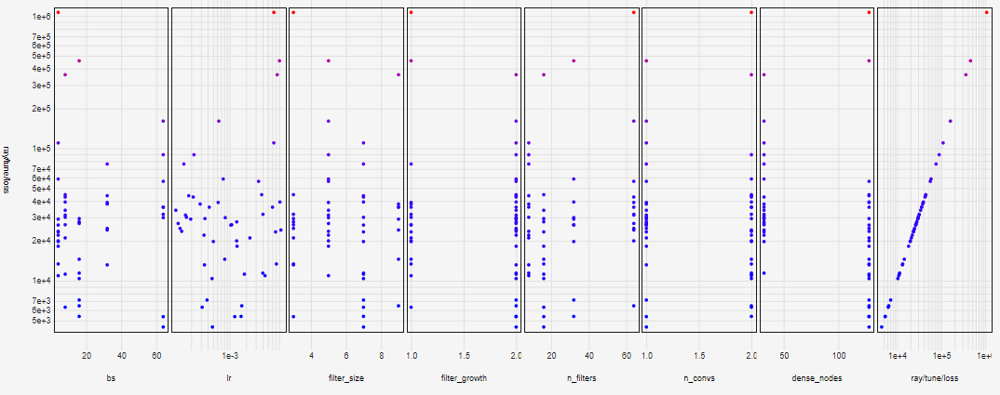

In [14]:
IPython.display.Image(Path.cwd()/"media"/"images"/"6_eyes_tune_scatter.png")

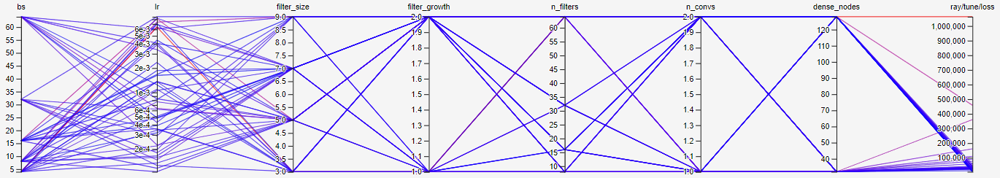

In [15]:
IPython.display.Image(Path.cwd()/"media"/"images"/"6_eyes_tune_parallel.png")

## Final

The eye only model seems to perform worse than the unaligned face, so the face itself is providing some information that is useful for accurate predictions. Additional training epochs doesnt seem like it would help a huge amount given the training graphs seem like they have converged to an ideal set of parameter values

In [16]:
start_time = datetime.datetime.now().strftime("%Y-%b-%d %H-%M-%S")
# config = {'seed': 2765, 'bs': 4, 'lr': 0.00027029549113670475, 'filter_size': 9, 'filter_growth': 2, 'n_filters': 32, 'n_convs': 2, 'dense_nodes': 128}
config = {'seed': 4296, 'bs': 4, 'lr': 0.0003349274757574134, 'filter_size': 5, 'filter_growth': 2, 'n_filters': 8, 'n_convs': 2, 'dense_nodes': 128}

pl.seed_everything(config["seed"])


d_train, d_val, d_test = create_datasets(Path.cwd(), data_partial=True, img_types=["l_eye", "r_eye"], seed=config["seed"], batch_size=config["bs"])

model = EyesModel(config)
trainer = pl.Trainer(
    max_epochs=50,
    devices=1,
    accelerator="gpu",
    enable_checkpointing=True,
    logger=TensorBoardLogger(save_dir=Path.cwd()/"logs", name="eyes/final/{}".format(start_time), log_graph=True))
trainer.fit(model, train_dataloaders=d_train, val_dataloaders=d_val)

save_model(model, config, 
           Path.cwd()/"logs"/"eyes"/"final"/"{}".format(start_time)/"eyetracking_eye_model.pt", 
           Path.cwd()/"logs"/"eyes"/"final"/"{}".format(start_time)/"eyetracking_eye_config.json")

Global seed set to 4296
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Missing logger folder: C:\finalPJT\webcam-eye-tracker-master\logs\eyes/final/2023-May-18 12-04-29
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type       | Params | In sizes       | Out sizes     
------------------------------------------------------------------------------
0 | l_conv_input | Conv2d     | 608    | [1, 3, 64, 64] | [1, 8, 60, 60]
1 | r_conv_input | Conv2d     | 608    | [1, 3, 64, 64] | [1, 8, 60, 60]
2 | l_convs      | ModuleList | 16.1 K | ?              | ?             
3 | r_convs      | ModuleList | 16.1 K | ?              | ?             
4 | drop1        | Dropout    | 0      | [1, 128]       | [1, 128]      
5 | fc1          | Linear     | 1.2 M  | [1, 9216]      | [1, 128]      
6 | drop2        | Dropout    | 0      | [1, 64]        | [1, 64]       
7 | fc2          | L

Sanity Checking: 0it [00:00, ?it/s]

C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=50` reached.


In [18]:
test_results = trainer.test(dataloaders=d_test)
print(f"Pixel error: {np.sqrt(test_results[0]['test_loss'])}")

C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:148: UserWarning: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
  rank_zero_warn(
Restoring states from the checkpoint path at C:\finalPJT\webcam-eye-tracker-master\logs\eyes/final/2023-May-18 12-04-29\version_0\checkpoints\epoch=49-step=10000.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at C:\finalPJT\webcam-eye-tracker-master\logs\eyes/final/2023-May-18 12-04-29\version_0\checkpoints\epoch=49-step=10000.ckpt
C:\ProgramData\Anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, test_dataloader, does not have many workers which may be a bottleneck. C

Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_loss            4015.55419921875
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Pixel error: 63.368400636427225


# Full model

We can try combining the unaligned face and eye models, as well as bring in some other data from the webcam to hopefully get more accurate predictions. At this point it becomes difficult to directly compare against previous models because the introduction of many new input images results in a drastically different architecture/hyperparameters/training times etc. We will also need to run more experiments due to the much larger search space for the hyperparameters

We'll train a full model with aligned face + eyes + head position + head angle. We can use the aligned version of the face for more reliable feature detection as the convolutions dont need to worry about rotations, and then also directly bring in the measured head angle as a scalar into the model. This way we get better face features while preserving information about head rotation. Of course, if we had more time we could try different combinations of these inputs to find the best tradeoff between loss/memory/speed

## Explore

In [2]:
config = {"seed": tune.randint(0, 10000),  # reproducible random seed for each experiment
          "bs": tune.choice([1 << i for i in range(2, 7)]),  # batch size
          "lr": tune.loguniform(1e-4, 1e-2),  # learning rate
          'face_filt_size': tune.choice([3, 5, 7, 9]),  # filter size (square)
          'face_filt_grow': tune.choice([1, 2]),  # increase filter count by a factor
          'n_face_filt': tune.choice([8, 16, 32, 64]),  # number of starting filters
          'n_face_conv': tune.choice([1, 2]),  # number of conv layers
          'eye_filt_size': tune.choice([3, 5, 7]),  # filter size (square)
          'eye_filt_grow': tune.choice([1, 2]),  # increase filter count by a factor
          'n_eye_filt': tune.choice([8, 16, 32]),  # number of starting filters
          'n_eye_conv': tune.choice([1, 2]),  # number of conv layers
          'head_pos_filt_size': tune.choice([3, 5, 7]),  # filter size (square)
          'head_pos_filt_grow': tune.choice([1, 2]),  # increase filter count by a factor
          'n_head_pos_filt': tune.choice([8, 16]),  # number of starting filters
          'n_head_pos_conv': tune.choice([0, 1, 2]),  # number of conv layers
          'dense_nodes': tune.choice([32, 64, 128]),  # number of nodes in fc layer
         }

analysis = tune_asha(config, data_partial=True, train_func=train_full, name="full/explore", img_types=["face_aligned", "l_eye", "r_eye", "head_pos", "head_angle"], num_samples=200, num_epochs=5, seed=87)

Trial name,status,loc,seed,bs,lr,face_filt_size,face_filt_grow,n_face_filt,n_face_conv,eye_filt_size,eye_filt_grow,n_eye_filt,n_eye_conv,head_pos_filt_size,head_pos_filt_grow,n_head_pos_filt,n_head_pos_conv,dense_nodes,loss,training_iteration
_inner_dfe18_00000,TERMINATED,,8525,8,0.00812461,7,1,32,1,5,1,32,2,5,2,8,2,32,20916.5,5
_inner_dfe18_00001,TERMINATED,,1926,4,0.00134626,7,1,8,1,5,2,32,1,5,2,16,0,64,7234.34,5
_inner_dfe18_00002,TERMINATED,,2272,4,0.00124424,7,1,32,1,7,1,32,2,7,2,16,1,128,6728.01,5
_inner_dfe18_00003,TERMINATED,,6931,4,0.000766066,7,2,64,1,3,1,8,1,5,2,8,2,32,28622,5
_inner_dfe18_00004,TERMINATED,,5973,32,0.00105579,5,1,64,2,3,2,32,2,7,2,16,2,32,18147.8,1
_inner_dfe18_00005,TERMINATED,,4350,16,0.000636374,5,1,16,1,5,2,16,1,7,2,16,1,128,5719.24,5
_inner_dfe18_00006,TERMINATED,,2540,32,0.00034213,5,2,32,2,5,2,8,1,5,1,16,1,32,17620.3,1
_inner_dfe18_00007,TERMINATED,,5604,32,0.00166895,9,1,16,2,7,1,8,2,3,2,8,2,64,55400.8,1
_inner_dfe18_00008,TERMINATED,,895,16,0.000506387,7,1,64,2,7,1,32,2,5,2,8,0,32,21732.5,4
_inner_dfe18_00009,TERMINATED,,1609,8,0.000104986,9,1,8,1,3,1,8,1,3,1,16,1,32,53731,1


2021-01-03 15:54:33,858	INFO tune.py:448 -- Total run time: 43447.93 seconds (43445.12 seconds for the tuning loop).


Best hyperparameters: {'seed': 9904, 'bs': 64, 'lr': 0.00014254769955204496, 'face_filt_size': 9, 'face_filt_grow': 2, 'n_face_filt': 64, 'n_face_conv': 2, 'eye_filt_size': 3, 'eye_filt_grow': 2, 'n_eye_filt': 16, 'n_eye_conv': 1, 'head_pos_filt_size': 5, 'head_pos_filt_grow': 2, 'n_head_pos_filt': 16, 'n_head_pos_conv': 0, 'dense_nodes': 128}


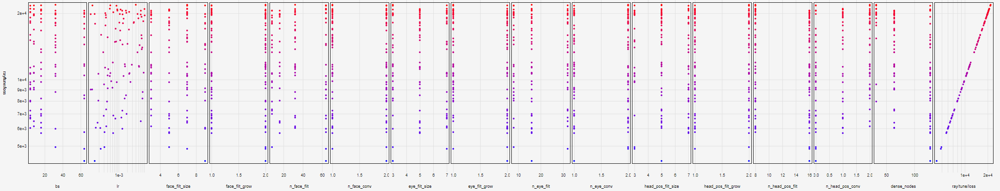

In [3]:
IPython.display.Image(Path.cwd()/"media"/"images"/"7_full_explore_scatter.png")

## Fine tune

With this number of parameter combinations, we can/should be pretty strict in pruning the ranges when fine tuning the selection process. We can see that many of the hyperparameters have a fairly clear relationship with loss, and we can use these patterns to establish more ideal ranges to reduce the search space

In [2]:
config = {"seed": tune.randint(0, 10000),  # reproducible random seed for each experiment
          "bs": tune.choice([1 << i for i in range(4, 8)]),  # batch size
          "lr": tune.loguniform(1e-5, 1e-4),  # learning rate
          'face_filt_size': tune.choice([5, 7, 9]),  # filter size (square)
          'face_filt_grow': tune.choice([2]),  # increase filter count by a factor
          'n_face_filt': tune.choice([16, 32, 64]),  # number of starting filters
          'n_face_conv': tune.choice([2]),  # number of conv layers
          'eye_filt_size': tune.choice([3, 5]),  # filter size (square)
          'eye_filt_grow': tune.choice([2]),  # increase filter count by a factor
          'n_eye_filt': tune.choice([8, 16, 32]),  # number of starting filters
          'n_eye_conv': tune.choice([1, 2]),  # number of conv layers
          'head_pos_filt_size': tune.choice([3, 5]),  # filter size (square)
          'head_pos_filt_grow': tune.choice([2]),  # increase filter count by a factor
          'n_head_pos_filt': tune.choice([16]),  # number of starting filters
          'n_head_pos_conv': tune.choice([0]),  # number of conv layers
          'dense_nodes': tune.choice([128]),  # number of nodes in fc layer
         }

analysis = tune_asha(config, data_partial=True, train_func=train_full, name="full/tune", img_types=["face_aligned", "l_eye", "r_eye", "head_pos", "head_angle"], num_samples=50, num_epochs=10, seed=87)

Trial name,status,loc,seed,bs,lr,face_filt_size,face_filt_grow,n_face_filt,n_face_conv,eye_filt_size,eye_filt_grow,n_eye_filt,n_eye_conv,head_pos_filt_size,head_pos_filt_grow,n_head_pos_filt,n_head_pos_conv,dense_nodes,loss,training_iteration
_inner_36ca1_00000,TERMINATED,,8525,64,9.01366e-05,5,2,32,2,5,2,16,1,5,2,16,0,128,4875.92,10
_inner_36ca1_00001,TERMINATED,,1926,64,3.66914e-05,5,2,32,2,3,2,16,2,5,2,16,0,128,8338.85,10
_inner_36ca1_00002,TERMINATED,,2272,16,3.52739e-05,7,2,32,2,5,2,32,1,5,2,16,0,128,4053.51,10
_inner_36ca1_00003,TERMINATED,,6931,128,2.76779e-05,5,2,64,2,3,2,16,1,5,2,16,0,128,284030,1
_inner_36ca1_00004,TERMINATED,,5973,128,3.24929e-05,9,2,64,2,5,2,8,2,3,2,16,0,128,217219,1
_inner_36ca1_00005,TERMINATED,,4350,32,2.52264e-05,5,2,64,2,3,2,16,1,3,2,16,0,128,21255.8,2
_inner_36ca1_00006,TERMINATED,,2540,64,1.84968e-05,7,2,16,2,5,2,16,1,3,2,16,0,128,180557,1
_inner_36ca1_00007,TERMINATED,,5604,16,4.08528e-05,9,2,16,2,5,2,8,1,5,2,16,0,128,19224.4,2
_inner_36ca1_00008,TERMINATED,,895,64,2.25031e-05,7,2,64,2,5,2,8,1,3,2,16,0,128,126730,1
_inner_36ca1_00009,TERMINATED,,1609,128,1.02463e-05,5,2,64,2,5,2,8,1,3,2,16,0,128,599105,1


2021-01-03 20:06:05,885	ERROR tune.py:444 -- Trials did not complete: [_inner_36ca1_00017]
2021-01-03 20:06:05,886	INFO tune.py:448 -- Total run time: 13726.94 seconds (13723.76 seconds for the tuning loop).


Best hyperparameters: {'seed': 205, 'bs': 16, 'lr': 6.376278652480636e-05, 'face_filt_size': 7, 'face_filt_grow': 2, 'n_face_filt': 32, 'n_face_conv': 2, 'eye_filt_size': 5, 'eye_filt_grow': 2, 'n_eye_filt': 32, 'n_eye_conv': 1, 'head_pos_filt_size': 3, 'head_pos_filt_grow': 2, 'n_head_pos_filt': 16, 'n_head_pos_conv': 0, 'dense_nodes': 128}


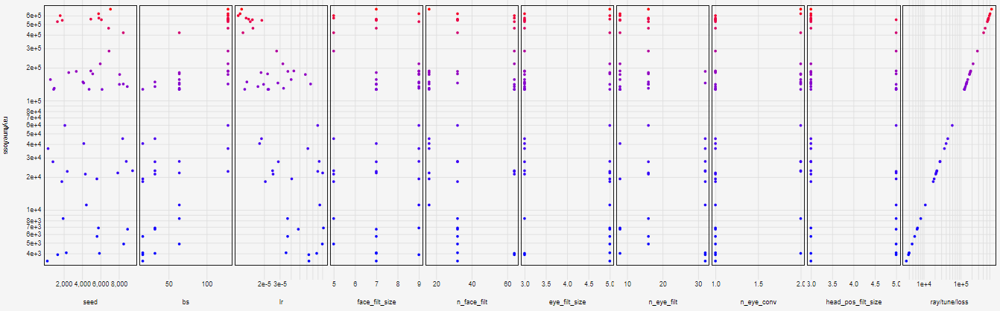

In [3]:
IPython.display.Image(Path.cwd()/"media"/"images"/"8_full_tune_scatter.png")

## Final

In [ ]:
start_time = datetime.datetime.now().strftime("%Y-%b-%d %H-%M-%S")

config = get_best_results(Path.cwd()/"logs"/"full"/"tune")

pl.seed_everything(config["seed"])

d_train, d_val, d_test = create_datasets(Path.cwd(), data_partial=True, img_types=["face_aligned", "l_eye", "r_eye", "head_pos", "head_angle"], seed=config["seed"], batch_size=config["bs"])

model = FullModel(config)
trainer = pl.Trainer(
    max_epochs=50,
    gpus=[0,1],
    accelerator="dp",
    checkpoint_callback=True,
    logger=TensorBoardLogger(save_dir=Path.cwd()/"logs", name="full/final/{}".format(start_time), log_graph=True))

trainer.fit(model, train_dataloader=d_train, val_dataloaders=d_val)

save_model(model, config, 
           Path.cwd()/"logs"/"full"/"final"/"{}".format(start_time)/"eyetracking_model.pt", 
           Path.cwd()/"logs"/"full"/"final"/"{}".format(start_time)/"eyetracking_config.json")

In [3]:
test_results = trainer.test(test_dataloaders=d_test)
print(f"Pixel error: {np.sqrt(test_results[0]['test_loss'])}")


--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_loss': tensor(2036.7397, device='cuda:0'),
 'val_loss': tensor(2727.0217, device='cuda:0')}
--------------------------------------------------------------------------------
Pixel error: 45.130253113557316


# Selected model

The full model performs slightly better than the face-only model in terms of error.

In terms of the structure of the network, we have a few subnetworks. A convolution block consists of `conv -> relu -> batch norm -> maxpool`:
1. Face -> convolution block -> convolution block
2. Left eye -> convolution block
3. Right eye -> convolution block
4. Head position (goes through only a single convolution layer)

The output of each of these networks is then merged with head angle information before being passed through the fully connected layers

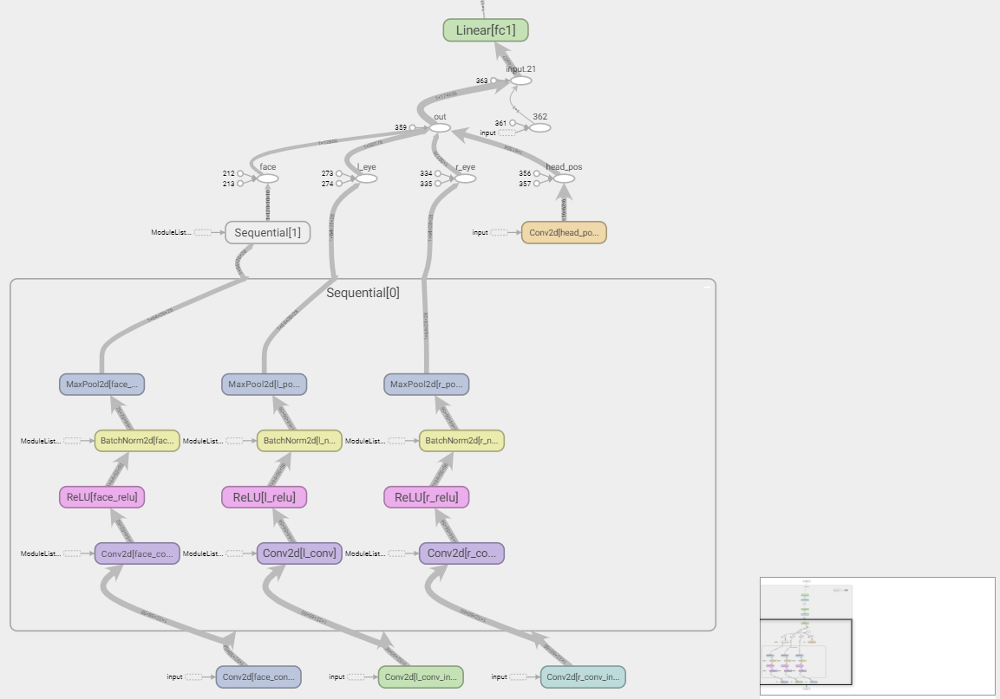

In [18]:
IPython.display.Image(Path.cwd()/"media"/"images"/"9_network.png")

In [20]:
model.summarize(mode='full')
print(model)
print(model.hparams)


   | Name                   | Type        | Params | In sizes         | Out sizes       
----------------------------------------------------------------------------------------------
0  | face_conv_input        | Conv2d      | 4.7 K  | [1, 3, 64, 64]   | [1, 32, 58, 58] 
1  | face_convs             | ModuleList  | 502 K  | ?                | ?               
2  | face_convs.0           | Sequential  | 100 K  | [1, 32, 58, 58]  | [1, 64, 26, 26] 
3  | face_convs.0.face_conv | Conv2d      | 100 K  | [1, 32, 58, 58]  | [1, 64, 52, 52] 
4  | face_convs.0.face_relu | ReLU        | 0      | [1, 64, 52, 52]  | [1, 64, 52, 52] 
5  | face_convs.0.face_norm | BatchNorm2d | 128    | [1, 64, 52, 52]  | [1, 64, 52, 52] 
6  | face_convs.0.face_pool | MaxPool2d   | 0      | [1, 64, 52, 52]  | [1, 64, 26, 26] 
7  | face_convs.1           | Sequential  | 401 K  | [1, 64, 26, 26]  | [1, 128, 10, 10]
8  | face_convs.1.face_conv | Conv2d      | 401 K  | [1, 64, 26, 26]  | [1, 128, 20, 20]
9  | face_conv

FullModel(
  (face_conv_input): Conv2d(3, 32, kernel_size=(7, 7), stride=(1, 1))
  (face_convs): ModuleList(
    (0): Sequential(
      (face_conv): Conv2d(32, 64, kernel_size=(7, 7), stride=(1, 1))
      (face_relu): ReLU()
      (face_norm): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (face_pool): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    )
    (1): Sequential(
      (face_conv): Conv2d(64, 128, kernel_size=(7, 7), stride=(1, 1))
      (face_relu): ReLU()
      (face_norm): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (face_pool): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    )
  )
  (l_conv_input): Conv2d(3, 32, kernel_size=(5, 5), stride=(1, 1))
  (l_convs): ModuleList(
    (0): Sequential(
      (l_conv): Conv2d(32, 64, kernel_size=(5, 5), stride=(1, 1))
      (l_relu): ReLU()
      (l_norm): BatchNorm2d(64, e

## Feature maps

We can use hooks to detach specific layers of the network and plot the feature maps post-convolution.

### Face

Its difficult to determine what the kernels are learning to produce such feature maps, but you can see, for example that some have learned to separate the face from the background, and quite a few have learned the boundary of where the face is vs. my headrest and background


--- Best of 'F:\webcam-eye-tracker\logs\full\tune' ---

Directory: F:\webcam-eye-tracker\logs\full\tune\2021-Jan-03 16-17-18\44_bs=16,dense_nodes=128,eye_filt_grow=2,eye_filt_size=5,face_filt_grow=2,face_filt_size=7,head_pos_
Loss: 3406.12
Pixel error: 58.36
Hyperparameters...
- bs: 16
- dense_nodes: 128
- eye_filt_grow: 2
- eye_filt_size: 5
- face_filt_grow: 2
- face_filt_size: 7
- head_pos_filt_grow: 2
- head_pos_filt_size: 3
- lr: 6.376278652480636e-05
- n_eye_conv: 1
- n_eye_filt: 32
- n_face_conv: 2
- n_face_filt: 32
- n_head_pos_conv: 0
- n_head_pos_filt: 16
- seed: 205


<ipython-input-4-72bf9dfe8ca5>:33: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


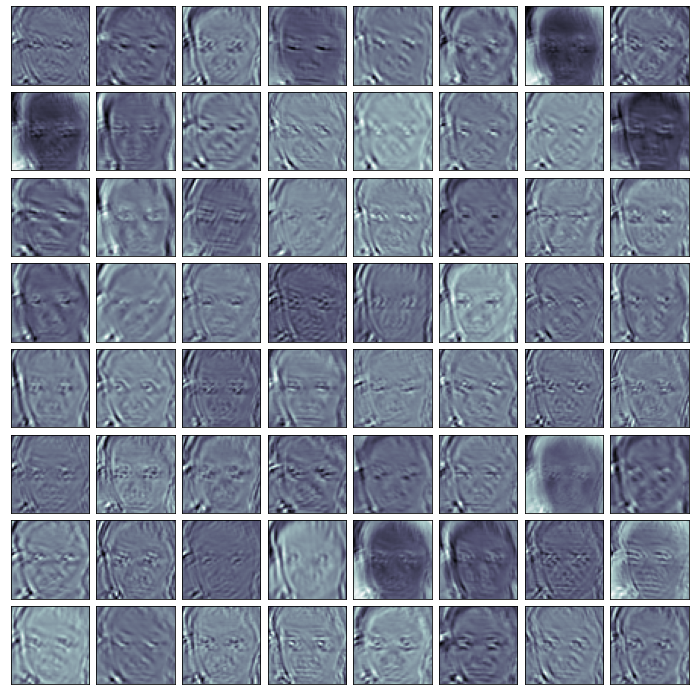

In [4]:
activation = {}
def get_activation(name):
    def hook(model, input, output):
        activation[name] = output.detach()
    return hook

# Load model
config = get_best_results(Path.cwd()/"logs"/"full"/"tune")
model = FullModel(config)
model.load_state_dict(torch.load('trained_models/eyetracking_model.pt'))

# Select layer to visualize
target_layer = 'face_conv'
model.face_convs[0].face_conv.register_forward_hook(get_activation(target_layer))

# Get an input image
img_types = ["face_aligned", "l_eye", "r_eye", "head_pos", "head_angle"]
dataset = FaceDataset(Path.cwd(), False, *img_types)
ds = dataset[1]
img_list = [ds[img].unsqueeze(0) for img in img_types]
_ = model(*img_list)

# Plot grid of feature maps
fig = plt.figure(figsize=(10,10))
grid = ImageGrid(fig, 111,
                 nrows_ncols=(8, 8),
                 axes_pad=0.1)

act = activation[target_layer].squeeze()
for ax, im in zip(grid, act):
    ax.imshow(im, cmap='bone')

plt.tight_layout()
plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[])
plt.savefig('media/images/9_face_feature_maps.png')
plt.show()

### Eyes

The 2 indented regions over the cornea are from the triple monitor setup I have

<ipython-input-13-1cb42aaccf48>:22: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


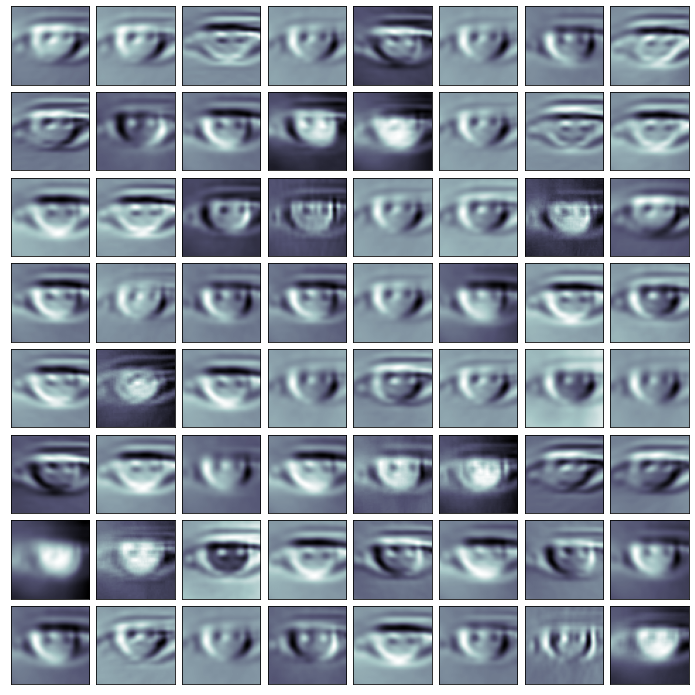

In [13]:
# Select layer to visualize
target_layer = 'l_conv'
model.r_convs[0].r_conv.register_forward_hook(get_activation(target_layer))

# Get an input image
img_types = ["face_aligned", "l_eye", "r_eye", "head_pos", "head_angle"]
dataset = FaceDataset(Path.cwd(), False, *img_types)
ds = dataset[16060]
img_list = [ds[img].unsqueeze(0) for img in img_types]
_ = model(*img_list)

# Plot grid of feature maps
fig = plt.figure(figsize=(10,10))
grid = ImageGrid(fig, 111,
                 nrows_ncols=(8, 8),
                 axes_pad=0.1)

act = activation[target_layer].squeeze()
for ax, im in zip(grid, act):
    ax.imshow(im, cmap='bone')

plt.tight_layout()
plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[])
plt.savefig('media/images/9_eye_feature_maps.png')
plt.show()